In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

from scipy import stats
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_percentage_error as mape
from sklearn.metrics import mean_absolute_error as mae
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import r2_score
import pickle
#
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
#from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from scikeras.wrappers import KerasRegressor
from sklearn.ensemble import AdaBoostRegressor

# Load prepared data

In [2]:
dir_path = "/Users/chikakoolsen/opt/python/thesis/code/tdcs_thesis/"
# dir_path = "/Users/mriworkshop/Documents/TDCS/code/tdcs_thesis/"
save_path = dir_path+"data/raw/"
img_path =  dir_path+"data/processed/"
model_path = dir_path+'models/'

## fmap mean all experiments

In [3]:
file_mean = save_path+"fmap_mean_32to38.txt"
#file_mean = save_path+"fmap_mean_erode.txt"
columns_mean =['exp', 'mini_exp', 'i', 'j', 'k', 'mean0', 'mean1', 'mean2', 'mean3', 'mean4', 'theory']
data = np.loadtxt(file_mean);

In [4]:
df = pd.DataFrame(data, columns=columns_mean)
df = df.astype({"exp": int, "i": int, "j": int, "k": int, "mini_exp": int})
df

,exp,mini_exp,i,j,k,mean0,mean1,mean2,mean3,mean4,theory
0,36,1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,36,1,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0
2,36,1,0,0,2,0.0,0.0,0.0,0.0,0.0,0.0
3,36,1,0,0,3,0.0,0.0,0.0,0.0,0.0,0.0
4,36,1,0,0,4,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
5046267,35,5,43,63,59,0.0,0.0,0.0,0.0,0.0,0.0
5046268,35,5,43,63,60,0.0,0.0,0.0,0.0,0.0,0.0
5046269,35,5,43,63,61,0.0,0.0,0.0,0.0,0.0,0.0
5046270,35,5,43,63,62,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
# 3 attributes
file_mean = save_path+"fmap_mean_roi_32to38.txt"
columns_mean =['exp', 'mini_exp', 'i', 'j', 'k', 'amp', 'neg', 'mean0', 'mean1', 'mean2', 'theory']
data = np.loadtxt(file_mean);

In [5]:
df = pd.DataFrame(data, columns=columns_mean)
df = df.astype({"exp": int, "i": int, "j": int, "k": int, "mini_exp": int, 'amp':int, 'neg':int})
df

,exp,mini_exp,i,j,k,amp,neg,mean0,mean1,mean2,theory
0,32,1,0,0,0,2,0,-467.847626,-474.438446,-490.049805,2.608974
1,32,1,0,0,1,2,0,-624.234802,-630.178467,-644.649231,2.824424
2,32,1,0,0,2,2,0,-716.909119,-724.083923,-738.119629,3.062833
3,32,1,0,0,3,2,0,-737.430176,-744.375488,-758.378723,3.327526
4,32,1,0,0,4,2,0,-717.468018,-725.066650,-738.667725,3.622561
...,...,...,...,...,...,...,...,...,...,...,...
635355,38,6,18,18,39,2,1,-954.100403,-959.997986,-959.053711,-3.513359
635356,38,6,18,18,40,2,1,-963.235291,-969.107910,-968.167297,-3.225791
635357,38,6,18,18,41,2,1,-1004.292725,-1009.776916,-1009.972046,-2.967721
635358,38,6,18,18,42,2,1,-1063.031128,-1067.428955,-1068.936646,-2.735306


In [8]:
# exclude 1 ampere
df = df.loc[df['amp']==2]

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 635360 entries, 0 to 635359
Data columns (total 11 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   exp       635360 non-null  int64  
 1   mini_exp  635360 non-null  int64  
 2   i         635360 non-null  int64  
 3   j         635360 non-null  int64  
 4   k         635360 non-null  int64  
 5   amp       635360 non-null  int64  
 6   neg       635360 non-null  int64  
 7   mean0     635360 non-null  float64
 8   mean1     635360 non-null  float64
 9   mean2     635360 non-null  float64
 10  theory    635360 non-null  float64
dtypes: float64(4), int64(7)
memory usage: 53.3 MB


# Split data

## Data 1. fmap mean all experiments

In [7]:
df1_train = df[~((df['exp']==36) & ((df['mini_exp']==5) | (df['mini_exp']==6)))]
df1_val =  df[(df['exp']==36) & (df['mini_exp']==5)]
df1_test1 =  df[(df['exp']==36) & (df['mini_exp']==6) & (df['neg']==1)]
df1_test2 =  df[(df['exp']==36) & (df['mini_exp']==6) & (df['neg']==0)]

In [8]:
print(df1_train.shape)
print(df1_val.shape)
print(df1_test1.shape)
print(df1_test2.shape)

(571824, 11)
(31768, 11)
(15884, 11)
(15884, 11)


In [9]:
df1_test1.iloc[:, :]

,exp,mini_exp,i,j,k,amp,neg,mean0,mean1,mean2,theory
270028,36,6,0,0,0,2,1,-1597.626343,-1607.794434,-1610.972046,-2.791874
270029,36,6,0,0,1,2,1,-1698.662964,-1709.008911,-1711.598145,-3.026984
270030,36,6,0,0,2,2,1,-1706.518555,-1717.524902,-1719.162476,-3.287904
270031,36,6,0,0,3,2,1,-1654.127563,-1665.365601,-1666.619263,-3.578579
270032,36,6,0,0,4,2,1,-1564.804688,-1576.146484,-1577.421509,-3.903890
...,...,...,...,...,...,...,...,...,...,...,...
285907,36,6,18,18,39,2,1,-870.780396,-882.470093,-882.949402,-3.026631
285908,36,6,18,18,40,2,1,-847.634460,-859.318237,-859.638062,-2.793828
285909,36,6,18,18,41,2,1,-833.990967,-845.007202,-845.524414,-2.583129
285910,36,6,18,18,42,2,1,-884.009888,-895.539429,-896.950806,-2.391902


In [184]:
X1_pred1

array([[-1597.62634277, -1607.79443359, -1610.9720459 ],
       [-1698.66296387, -1709.00891113, -1711.59814453],
       [-1706.51855469, -1717.52490234, -1719.16247559],
       ...,
       [ -833.9909668 ,  -845.00720215,  -845.52441406],
       [ -884.00988769,  -895.53942871,  -896.95080566],
       [-1028.6418457 , -1039.32434082, -1038.34680176]])

In [186]:
y1_pred1

array([-2.79187393, -3.02698374, -3.28790379, ..., -2.58312893,
       -2.39190245, -2.21793222])

In [10]:
X1_train = df1_train.iloc[:, 7:-1].values 
y1_train = df1_train['theory'].values

X1_test = df1_val.iloc[:, 7:-1].values 
y1_test = df1_val['theory'].values

X1_pred1 = df1_test1.iloc[:, 7:-1].values 
y1_pred1 = df1_test1['theory'].values

X1_pred2 = df1_test2.iloc[:, 7:-1].values 
y1_pred2 = df1_test2['theory'].values

In [11]:
print(X1_train.shape)
print(y1_train.shape)
print(X1_test.shape)
print(y1_test.shape)
print(X1_pred1.shape)
print(y1_pred1.shape)
print(X1_pred2.shape)
print(y1_pred2.shape)

(571824, 3)
(571824,)
(31768, 3)
(31768,)
(15884, 3)
(15884,)
(15884, 3)
(15884,)


## Data2: One experiment

In [225]:
df_train = df[(df['exp']==36) & (df['mini_exp']!=6)]
df_test = df[(df['exp']==36) & (df['mini_exp']==6)]

## Data4: None zero

In [ ]:
df_nonzero = df[(df['mean0']!=0.0) & (df['mean1']!=0.0) & (df['mean2']!=0.0) & (df['mean3']!=0.0) & (df['mean4']!=0.0)]

In [12]:
# 3 attribute
df_nonzero = df[(df['mean0']!=0.0) & (df['mean1']!=0.0) & (df['mean2']!=0.0)]

In [13]:
df_nonzero

,exp,mini_exp,i,j,k,amp,neg,mean0,mean1,mean2,theory
0,32,1,0,0,0,2,0,-467.847626,-474.438446,-490.049805,2.608974
1,32,1,0,0,1,2,0,-624.234802,-630.178467,-644.649231,2.824424
2,32,1,0,0,2,2,0,-716.909119,-724.083923,-738.119629,3.062833
3,32,1,0,0,3,2,0,-737.430176,-744.375488,-758.378723,3.327526
4,32,1,0,0,4,2,0,-717.468018,-725.066650,-738.667725,3.622561
...,...,...,...,...,...,...,...,...,...,...,...
635355,38,6,18,18,39,2,1,-954.100403,-959.997986,-959.053711,-3.513359
635356,38,6,18,18,40,2,1,-963.235291,-969.107910,-968.167297,-3.225791
635357,38,6,18,18,41,2,1,-1004.292725,-1009.776916,-1009.972046,-2.967721
635358,38,6,18,18,42,2,1,-1063.031128,-1067.428955,-1068.936646,-2.735306


In [14]:
df4_train = df_nonzero[~((df_nonzero['exp']==36) & ((df_nonzero['mini_exp']==6) | (df_nonzero['mini_exp']==5)))]
df4_test =  df_nonzero[(df_nonzero['exp']==36) & (df_nonzero['mini_exp']==5)]
df4_pred =  df_nonzero[(df_nonzero['exp']==36) & (df_nonzero['mini_exp']==6)]

In [15]:
X4_train = df4_train.iloc[:, 6:-1].values
y4_train = df4_train['theory'].values

X4_test = df4_test.iloc[:, 6:-1].values
y4_test = df4_test['theory'].values

X4_pred = df4_pred.iloc[:, 6:-1].values
y4_pred = df4_pred['theory'].values

In [16]:
print(X4_train.shape)
print(y4_train.shape)
print(X4_test.shape)
print(y4_test.shape)
print(X4_pred.shape)
print(y4_pred.shape)

(571824, 4)
(571824,)
(31768, 4)
(31768,)
(31768, 4)
(31768,)


# Neural Network

## Find out best layer and units

In [11]:
X_train = X1_train
y_train = y1_train
X_test = X1_test
y_test = y1_test

In [12]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(571824, 3)
(571824,)
(31768, 3)
(31768,)


In [13]:
myCallbacks = [tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10, mode='min')]

In [14]:
def create_nn(layer_size, unit_size):
    model = keras.Sequential()
    for i in range(1, layer_size):
        if i == 1:
            model.add(Dense(unit_size, activation='relu', input_shape=(len(X_train[0]),)))
        else:
            model.add(Dense(unit_size, activation='relu'))
    
    model.add(Dense(1, activation="linear"))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    model.fit(X_train, y_train, epochs=100, validation_data=[X_test, y_test], callbacks=myCallbacks)
    
    y_predict = model.predict(X_test)
    evaluate = model.evaluate(X_test, y_test)
    corr = np.corrcoef(y_predict.flatten(), y_test)
    m, b, r, p, st_er = stats.linregress(y_test.flatten(), y_predict.flatten()) 
    
    loss = evaluate[0]
    acc = evaluate[1]
    coef = corr[0][1]
    
    return acc, loss, coef, st_er

In [61]:
max_range_layer = 5
max_range_unit = 7
acc_arr = []
loss_arr = []
coef_arr = []
err_arr = []
for i in range(1, max_range_layer):
    acc_unit = []
    loss_unit = []
    coef_unit = []
    err_unit = []
    for j in range(1, max_range_unit):
        print("##### Layer:"+str(i)+" Unit:"+str(j)+" #####")
        acc, loss, coef, err = create_nn(i, j)
        acc_unit.append(acc)
        loss_unit.append(loss)
        coef_unit.append(coef)
        err_unit.append(err)
    
    acc_arr.append(acc_unit)
    loss_arr.append(loss_unit)
    coef_arr.append(coef_unit)
    err_arr.append(err_unit)

##### Layer:1 Unit:1 #####
Epoch 1/100
17870/17870 [==============================] - 16s 898us/step - loss: 9023.5781 - mae: 26.1952 - val_loss: 58.0484 - val_mae: 5.8990
Epoch 2/100
17870/17870 [==============================] - 15s 865us/step - loss: 33.1490 - mae: 3.0184 - val_loss: 12.2981 - val_mae: 1.3497
Epoch 3/100
17870/17870 [==============================] - 16s 880us/step - loss: 25.2731 - mae: 1.8962 - val_loss: 13.2811 - val_mae: 1.4904
Epoch 4/100
17870/17870 [==============================] - 16s 911us/step - loss: 24.9324 - mae: 1.9053 - val_loss: 12.8516 - val_mae: 1.3083
Epoch 5/100
17870/17870 [==============================] - 19s 1ms/step - loss: 25.1447 - mae: 1.8658 - val_loss: 12.6812 - val_mae: 1.2700
Epoch 6/100
17870/17870 [==============================] - 16s 921us/step - loss: 25.0806 - mae: 1.8334 - val_loss: 14.0989 - val_mae: 1.6879
Epoch 7/100
17870/17870 [==============================] - 17s 962us/step - loss: 25.2433 - mae: 1.8599 - val_loss: 15.7

Epoch 15/100
17870/17870 [==============================] - 15s 830us/step - loss: 25.1043 - mae: 1.8363 - val_loss: 12.5202 - val_mae: 1.2285
Epoch 16/100
17870/17870 [==============================] - 15s 825us/step - loss: 25.3165 - mae: 1.8493 - val_loss: 13.2994 - val_mae: 1.4874
Epoch 17/100
17870/17870 [==============================] - 15s 818us/step - loss: 25.1833 - mae: 1.8526 - val_loss: 15.1144 - val_mae: 1.8124
Epoch 18/100
17870/17870 [==============================] - 15s 819us/step - loss: 25.0573 - mae: 1.9140 - val_loss: 13.0455 - val_mae: 1.3918
Epoch 19/100
17870/17870 [==============================] - 17s 927us/step - loss: 25.2540 - mae: 1.8449 - val_loss: 13.1408 - val_mae: 1.3585
Epoch 20/100
17870/17870 [==============================] - 15s 852us/step - loss: 25.0959 - mae: 1.8627 - val_loss: 15.7055 - val_mae: 1.9643
Epoch 21/100
17870/17870 [==============================] - 17s 937us/step - loss: 25.1125 - mae: 1.8727 - val_loss: 12.7962 - val_mae: 1.2574

Epoch 14/100
17870/17870 [==============================] - 16s 876us/step - loss: 25.1342 - mae: 1.8449 - val_loss: 12.9273 - val_mae: 1.3578
Epoch 15/100
17870/17870 [==============================] - 16s 881us/step - loss: 25.1843 - mae: 1.8757 - val_loss: 13.1640 - val_mae: 1.3610
Epoch 16/100
17870/17870 [==============================] - 15s 850us/step - loss: 25.1433 - mae: 1.9124 - val_loss: 14.4076 - val_mae: 1.7248
Epoch 17/100
17870/17870 [==============================] - 16s 888us/step - loss: 25.2250 - mae: 1.8246 - val_loss: 14.0510 - val_mae: 1.6989
Epoch 18/100
17870/17870 [==============================] - 16s 882us/step - loss: 25.1178 - mae: 1.8929 - val_loss: 12.7914 - val_mae: 1.2238
Epoch 19/100
17870/17870 [==============================] - 16s 919us/step - loss: 25.1251 - mae: 1.8236 - val_loss: 13.6286 - val_mae: 1.6032
Epoch 20/100
17870/17870 [==============================] - 16s 895us/step - loss: 25.1663 - mae: 1.8735 - val_loss: 13.0337 - val_mae: 1.3846

17870/17870 [==============================] - 16s 907us/step - loss: 20.5180 - mae: 2.2856 - val_loss: 9.8673 - val_mae: 2.1418
Epoch 4/100
17870/17870 [==============================] - 17s 932us/step - loss: 15.4401 - mae: 1.8421 - val_loss: 10.2774 - val_mae: 2.2539
Epoch 5/100
17870/17870 [==============================] - 17s 938us/step - loss: 13.8913 - mae: 1.8017 - val_loss: 8.4402 - val_mae: 1.9013
Epoch 6/100
17870/17870 [==============================] - 16s 921us/step - loss: 13.2667 - mae: 1.7649 - val_loss: 7.7413 - val_mae: 1.6974
Epoch 7/100
17870/17870 [==============================] - 16s 889us/step - loss: 12.9694 - mae: 1.7557 - val_loss: 9.7609 - val_mae: 1.9181
Epoch 8/100
17870/17870 [==============================] - 16s 904us/step - loss: 12.9504 - mae: 1.7582 - val_loss: 16.2358 - val_mae: 2.6662
Epoch 9/100
17870/17870 [==============================] - 15s 867us/step - loss: 12.8709 - mae: 1.7504 - val_loss: 8.8809 - val_mae: 1.8002
Epoch 10/100
17870/1787

Epoch 68/100
17870/17870 [==============================] - 18s 997us/step - loss: 10.8348 - mae: 1.7986 - val_loss: 9.8433 - val_mae: 2.3765
Epoch 69/100
17870/17870 [==============================] - 18s 1ms/step - loss: 10.8196 - mae: 1.8060 - val_loss: 6.9545 - val_mae: 1.8103
Epoch 70/100
17870/17870 [==============================] - 18s 1ms/step - loss: 10.8223 - mae: 1.7893 - val_loss: 6.5500 - val_mae: 1.7721
Epoch 71/100
17870/17870 [==============================] - 18s 992us/step - loss: 10.7784 - mae: 1.7977 - val_loss: 6.5353 - val_mae: 1.7101
Epoch 72/100
17870/17870 [==============================] - 18s 995us/step - loss: 10.8430 - mae: 1.7830 - val_loss: 5.8382 - val_mae: 1.5770
Epoch 73/100
17870/17870 [==============================] - 18s 997us/step - loss: 10.8242 - mae: 1.7934 - val_loss: 5.6139 - val_mae: 1.5166
Epoch 74/100
17870/17870 [==============================] - 18s 984us/step - loss: 10.8311 - mae: 1.7856 - val_loss: 18.2227 - val_mae: 3.2311
Epoch 75/

17870/17870 [==============================] - 18s 987us/step - loss: 11.4953 - mae: 1.9417 - val_loss: 8.9463 - val_mae: 2.1794
Epoch 82/100
17870/17870 [==============================] - 18s 982us/step - loss: 11.3340 - mae: 1.9618 - val_loss: 8.9800 - val_mae: 2.1838
Epoch 83/100
17870/17870 [==============================] - 18s 996us/step - loss: 11.3731 - mae: 1.9425 - val_loss: 19.6366 - val_mae: 3.6080
Epoch 84/100
17870/17870 [==============================] - 16s 922us/step - loss: 11.4173 - mae: 1.9653 - val_loss: 6.3268 - val_mae: 1.7100
Epoch 85/100
17870/17870 [==============================] - 17s 974us/step - loss: 11.5887 - mae: 1.9590 - val_loss: 6.3134 - val_mae: 1.6557
Epoch 86/100
17870/17870 [==============================] - 16s 921us/step - loss: 11.2303 - mae: 1.9446 - val_loss: 30.7104 - val_mae: 4.2370
Epoch 87/100
17870/17870 [==============================] - 16s 901us/step - loss: 11.2620 - mae: 1.9410 - val_loss: 9.7938 - val_mae: 2.4633
Epoch 88/100
1787

17870/17870 [==============================] - 16s 892us/step - loss: 7.1929 - mae: 1.6280 - val_loss: 3.6543 - val_mae: 1.3891
Epoch 47/100
17870/17870 [==============================] - 16s 889us/step - loss: 7.2241 - mae: 1.6331 - val_loss: 5.9647 - val_mae: 1.7776
Epoch 48/100
17870/17870 [==============================] - 16s 886us/step - loss: 7.1896 - mae: 1.6260 - val_loss: 3.8441 - val_mae: 1.5142
Epoch 49/100
17870/17870 [==============================] - 16s 888us/step - loss: 7.1937 - mae: 1.6271 - val_loss: 4.3714 - val_mae: 1.6409
Epoch 50/100
17870/17870 [==============================] - 16s 891us/step - loss: 7.1805 - mae: 1.6248 - val_loss: 3.5492 - val_mae: 1.4031
Epoch 51/100
17870/17870 [==============================] - 16s 890us/step - loss: 7.1952 - mae: 1.6270 - val_loss: 3.5615 - val_mae: 1.3937
Epoch 52/100
17870/17870 [==============================] - 16s 891us/step - loss: 7.1818 - mae: 1.6258 - val_loss: 3.3818 - val_mae: 1.3414
Epoch 53/100
17870/17870 [

Epoch 21/100
17870/17870 [==============================] - 16s 919us/step - loss: 6.9139 - mae: 1.6052 - val_loss: 5.9686 - val_mae: 1.8385
Epoch 22/100
17870/17870 [==============================] - 16s 923us/step - loss: 7.1845 - mae: 1.6454 - val_loss: 4.8338 - val_mae: 1.5030
Epoch 23/100
17870/17870 [==============================] - 17s 945us/step - loss: 7.2095 - mae: 1.6316 - val_loss: 4.2236 - val_mae: 1.4722
Epoch 24/100
17870/17870 [==============================] - 17s 965us/step - loss: 7.0610 - mae: 1.6041 - val_loss: 3.5804 - val_mae: 1.2762
Epoch 25/100
17870/17870 [==============================] - 16s 918us/step - loss: 7.0204 - mae: 1.6055 - val_loss: 4.8092 - val_mae: 1.6250
Epoch 26/100
17870/17870 [==============================] - 16s 917us/step - loss: 6.9834 - mae: 1.5975 - val_loss: 4.1508 - val_mae: 1.4604
Epoch 27/100
17870/17870 [==============================] - 16s 906us/step - loss: 6.9129 - mae: 1.5965 - val_loss: 4.4977 - val_mae: 1.5299
Epoch 28/100


Epoch 48/100
17870/17870 [==============================] - 16s 890us/step - loss: 6.6246 - mae: 1.5811 - val_loss: 4.8168 - val_mae: 1.6281
Epoch 49/100
17870/17870 [==============================] - 15s 866us/step - loss: 6.5873 - mae: 1.5798 - val_loss: 5.1394 - val_mae: 1.7054
Epoch 50/100
17870/17870 [==============================] - 16s 886us/step - loss: 6.6070 - mae: 1.5786 - val_loss: 3.7850 - val_mae: 1.3984
Epoch 51/100
17870/17870 [==============================] - 16s 878us/step - loss: 6.5722 - mae: 1.5803 - val_loss: 4.2516 - val_mae: 1.4997
Epoch 52/100
17870/17870 [==============================] - 15s 863us/step - loss: 6.5528 - mae: 1.5788 - val_loss: 4.8978 - val_mae: 1.6117
Epoch 53/100
17870/17870 [==============================] - 16s 881us/step - loss: 6.5700 - mae: 1.5766 - val_loss: 5.5394 - val_mae: 1.7755
Epoch 54/100
17870/17870 [==============================] - 15s 859us/step - loss: 6.5892 - mae: 1.5771 - val_loss: 3.9746 - val_mae: 1.4722
Epoch 55/100


Epoch 5/100
17870/17870 [==============================] - 17s 935us/step - loss: 208.1812 - mae: 12.0164 - val_loss: 208.1266 - val_mae: 12.0112
Epoch 6/100
17870/17870 [==============================] - 17s 944us/step - loss: 208.1817 - mae: 12.0164 - val_loss: 208.1276 - val_mae: 12.0112
Epoch 7/100
17870/17870 [==============================] - 17s 959us/step - loss: 208.1796 - mae: 12.0163 - val_loss: 208.1302 - val_mae: 12.0112
Epoch 8/100
17870/17870 [==============================] - 17s 924us/step - loss: 208.1816 - mae: 12.0164 - val_loss: 208.1262 - val_mae: 12.0112
Epoch 9/100
17870/17870 [==============================] - 16s 917us/step - loss: 208.1823 - mae: 12.0164 - val_loss: 208.1261 - val_mae: 12.0112
Epoch 10/100
17870/17870 [==============================] - 17s 928us/step - loss: 208.1815 - mae: 12.0163 - val_loss: 208.1277 - val_mae: 12.0112
Epoch 11/100
17870/17870 [==============================] - 17s 930us/step - loss: 208.1813 - mae: 12.0164 - val_loss: 208.

Epoch 23/100
17870/17870 [==============================] - 17s 952us/step - loss: 6.9962 - mae: 1.6316 - val_loss: 4.3765 - val_mae: 1.5668
Epoch 24/100
17870/17870 [==============================] - 17s 959us/step - loss: 6.9946 - mae: 1.6312 - val_loss: 4.2395 - val_mae: 1.5182
Epoch 25/100
17870/17870 [==============================] - 20s 1ms/step - loss: 6.9581 - mae: 1.6229 - val_loss: 4.7012 - val_mae: 1.6415
Epoch 26/100
17870/17870 [==============================] - 18s 991us/step - loss: 6.9687 - mae: 1.6250 - val_loss: 4.1996 - val_mae: 1.4648
Epoch 27/100
17870/17870 [==============================] - 17s 968us/step - loss: 6.9693 - mae: 1.6252 - val_loss: 7.5684 - val_mae: 2.1199
Epoch 28/100
17870/17870 [==============================] - 17s 947us/step - loss: 6.9516 - mae: 1.6216 - val_loss: 6.8648 - val_mae: 2.0330
Epoch 29/100
17870/17870 [==============================] - 17s 942us/step - loss: 6.9453 - mae: 1.6214 - val_loss: 5.7656 - val_mae: 1.8366
Epoch 30/100
17

17870/17870 [==============================] - 19s 1ms/step - loss: 6.5816 - mae: 1.5774 - val_loss: 3.6952 - val_mae: 1.4353
Epoch 39/100
17870/17870 [==============================] - 20s 1ms/step - loss: 6.5551 - mae: 1.5711 - val_loss: 4.4886 - val_mae: 1.6520
Epoch 40/100
17870/17870 [==============================] - 20s 1ms/step - loss: 6.5360 - mae: 1.5668 - val_loss: 3.8171 - val_mae: 1.5087
Epoch 41/100
17870/17870 [==============================] - 20s 1ms/step - loss: 6.5102 - mae: 1.5619 - val_loss: 4.4230 - val_mae: 1.6392
Epoch 42/100
17870/17870 [==============================] - 20s 1ms/step - loss: 6.5110 - mae: 1.5620 - val_loss: 4.2858 - val_mae: 1.4839
Epoch 43/100
17870/17870 [==============================] - 20s 1ms/step - loss: 6.5055 - mae: 1.5638 - val_loss: 3.9385 - val_mae: 1.5408
Epoch 44/100
17870/17870 [==============================] - 20s 1ms/step - loss: 6.4861 - mae: 1.5598 - val_loss: 3.9115 - val_mae: 1.5197
Epoch 45/100
17870/17870 [==============

Epoch 97/100
17870/17870 [==============================] - 20s 1ms/step - loss: 6.1305 - mae: 1.5014 - val_loss: 4.5491 - val_mae: 1.6895
Epoch 98/100
17870/17870 [==============================] - 18s 1ms/step - loss: 6.1318 - mae: 1.5022 - val_loss: 7.1841 - val_mae: 1.9956
Epoch 99/100
17870/17870 [==============================] - 17s 949us/step - loss: 6.1373 - mae: 1.5016 - val_loss: 3.8780 - val_mae: 1.4942
Epoch 100/100
993/993 [==============================] - 1s 773us/step - loss: 3.8329 - mae: 1.4803
##### Layer:4 Unit:5 #####
Epoch 1/100
17870/17870 [==============================] - 17s 945us/step - loss: 38.3950 - mae: 3.6619 - val_loss: 28.5080 - val_mae: 3.8670
Epoch 2/100
17870/17870 [==============================] - 17s 943us/step - loss: 14.4093 - mae: 2.1501 - val_loss: 15.1183 - val_mae: 2.4619
Epoch 3/100
17870/17870 [==============================] - 17s 942us/step - loss: 13.2319 - mae: 2.0657 - val_loss: 13.7293 - val_mae: 2.2890
Epoch 4/100
17870/17870 [===

17870/17870 [==============================] - 17s 946us/step - loss: 6.5698 - mae: 1.6091 - val_loss: 4.5996 - val_mae: 1.6323
Epoch 55/100
17870/17870 [==============================] - 17s 941us/step - loss: 6.5557 - mae: 1.6099 - val_loss: 5.8052 - val_mae: 1.9586
Epoch 56/100
17870/17870 [==============================] - 17s 953us/step - loss: 6.5341 - mae: 1.6012 - val_loss: 5.1130 - val_mae: 1.7202
Epoch 57/100
17870/17870 [==============================] - 17s 942us/step - loss: 6.4913 - mae: 1.6007 - val_loss: 4.9801 - val_mae: 1.7618
Epoch 58/100
17870/17870 [==============================] - 17s 946us/step - loss: 6.4827 - mae: 1.5930 - val_loss: 4.2070 - val_mae: 1.5460
Epoch 59/100
17870/17870 [==============================] - 17s 952us/step - loss: 6.3730 - mae: 1.5786 - val_loss: 4.7239 - val_mae: 1.6380
Epoch 60/100
17870/17870 [==============================] - 17s 944us/step - loss: 6.3626 - mae: 1.5785 - val_loss: 8.5128 - val_mae: 2.3156
Epoch 61/100
17870/17870 [

Epoch 11/100
17870/17870 [==============================] - 17s 945us/step - loss: 7.2614 - mae: 1.6678 - val_loss: 4.9810 - val_mae: 1.6524
Epoch 12/100
17870/17870 [==============================] - 17s 935us/step - loss: 7.1855 - mae: 1.6609 - val_loss: 6.0425 - val_mae: 1.8264
Epoch 13/100
17870/17870 [==============================] - 17s 938us/step - loss: 7.1471 - mae: 1.6533 - val_loss: 8.1798 - val_mae: 2.2674
Epoch 14/100
17870/17870 [==============================] - 17s 943us/step - loss: 7.0786 - mae: 1.6450 - val_loss: 5.0317 - val_mae: 1.6628
Epoch 15/100
17870/17870 [==============================] - 17s 935us/step - loss: 7.0169 - mae: 1.6289 - val_loss: 5.3201 - val_mae: 1.7131
Epoch 16/100
17870/17870 [==============================] - 17s 940us/step - loss: 6.9354 - mae: 1.6195 - val_loss: 7.5938 - val_mae: 2.2156
Epoch 17/100
17870/17870 [==============================] - 17s 935us/step - loss: 6.8764 - mae: 1.6151 - val_loss: 5.4912 - val_mae: 1.7449
Epoch 18/100


In [62]:
err_arr

[[0.0013093636222487035,
  0.0013363478652113014,
  0.0013756578610171397,
  0.0013501494095248508,
  0.0013713603947165527,
  0.0013738157198533907],
 [0.0008303532204031546,
  0.0011483215382541894,
  0.0017071719562108739,
  0.0008209912100344787,
  0.0008760868579827992,
  0.0013813599680893146],
 [0.0009366157323860921,
  0.0006829593809512876,
  0.0006746810527755819,
  0.0009856982882496326,
  0.0008279664846253059,
  0.0007267093918667466],
 [0.0,
  0.0,
  0.0007310706267294786,
  0.0007317444262678551,
  0.0006868709589638222,
  0.0007283427387440412]]

In [63]:
acc_arr

[[1.3857656717300415,
  1.6338953971862793,
  1.2245198488235474,
  1.3362523317337036,
  1.4576489925384521,
  1.2545911073684692],
 [1.4226531982421875,
  1.7405717372894287,
  3.406514883041382,
  1.549668550491333,
  1.7333762645721436,
  3.320460319519043],
 [1.5296779870986938,
  1.242402195930481,
  1.2377952337265015,
  1.7618728876113892,
  1.7992537021636963,
  1.4259915351867676],
 [12.011160850524902,
  12.011163711547852,
  1.55180025100708,
  1.4803086519241333,
  1.31350576877594,
  1.5046895742416382]]

In [64]:
loss_arr

[[13.001951217651367,
  13.859498977661133,
  12.899637222290039,
  13.068114280700684,
  13.35523509979248,
  12.693714141845703],
 [6.283963680267334,
  8.95450496673584,
  22.480548858642578,
  5.651208400726318,
  6.146759986877441,
  19.96187400817871],
 [6.098623275756836,
  3.1524851322174072,
  3.121952772140503,
  7.627821922302246,
  6.35973596572876,
  3.6106622219085693],
 [208.127197265625,
  208.1261444091797,
  4.41049861907959,
  3.832855701446533,
  3.3769242763519287,
  3.9544219970703125]]

In [65]:
coef_arr

[[0.9686888618796473,
  0.9676044323755579,
  0.9687463412821997,
  0.9682378853236744,
  0.9680692259038237,
  0.9695123771329186],
 [0.9872034765376106,
  0.9784440289977127,
  0.9447179858765035,
  0.9878003723905173,
  0.9864649478714678,
  0.9580228652724726],
 [0.9860883103800211,
  0.9929177714389621,
  0.9925366043019389,
  0.9827955496823628,
  0.9872390455618247,
  0.9913556544194533],
 [nan,
  nan,
  0.9904497507046964,
  0.9910475005992898,
  0.9923992464132068,
  0.9909958028327146]]

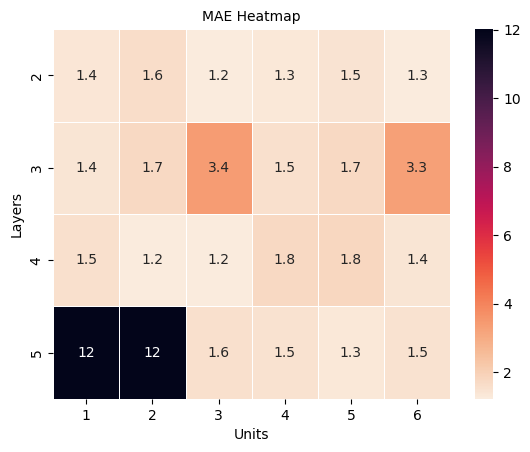

In [66]:
xlabels = range(1, max_range_unit)
ylabels = range(2, max_range_layer+1)
cmap = sns.cm.rocket_r
# fig, ax = plt.subplots(figsize=(5,5))
ax = sns.heatmap(acc_arr, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, cmap=cmap)
ax.set_title('MAE Heatmap', fontsize=10)
ax.set_xlabel('Units', fontsize=10)
ax.set_ylabel('Layers', fontsize=10)
plt.show()

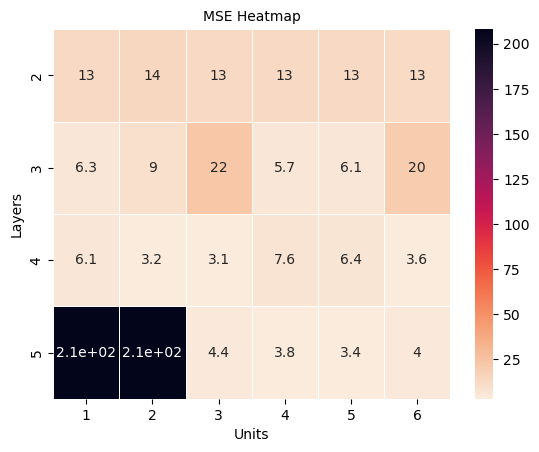

In [67]:
#fig, ax = plt.subplots(figsize=(10,5))
ax = sns.heatmap(loss_arr, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, cmap=cmap)
ax.set_title('MSE Heatmap', fontsize=10)
ax.set_xlabel('Units', fontsize=10)
ax.set_ylabel('Layers', fontsize=10)
plt.show()

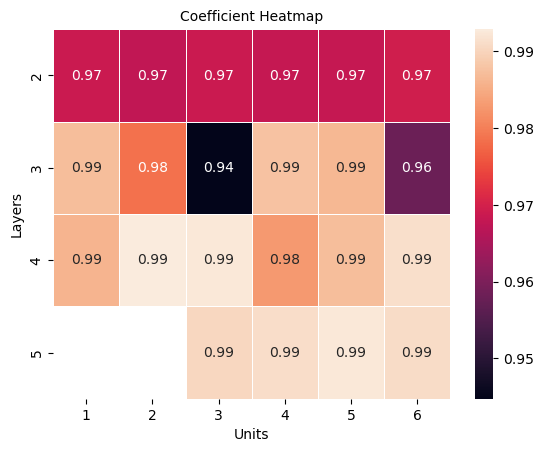

In [68]:
# fig, ax = plt.subplots(figsize=(8,5))
ax = sns.heatmap(coef_arr, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True)
ax.set_title('Coefficient Heatmap', fontsize=10)
ax.set_xlabel('Units', fontsize=10)
ax.set_ylabel('Layers', fontsize=10)
plt.show()

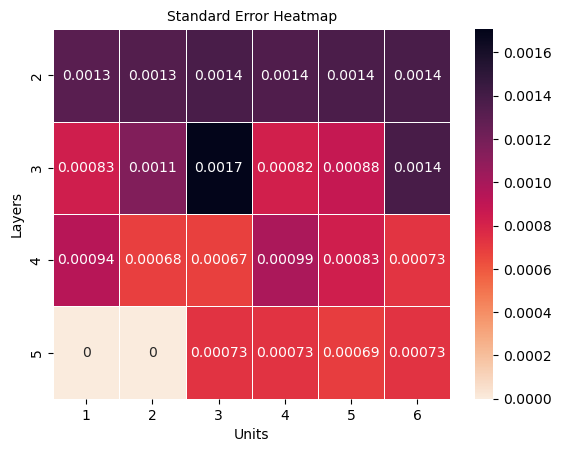

In [69]:
# fig, ax = plt.subplots(figsize=(10,5))
ax = sns.heatmap(err_arr, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, cmap=cmap)
ax.set_title('Standard Error Heatmap', fontsize=10)
ax.set_xlabel('Units', fontsize=10)
ax.set_ylabel('Layers', fontsize=10)
plt.show()

In [70]:
div = np.divide(coef_arr, err_arr)
div = np.nan_to_num(div)
div

array([[ 739.81653791,  724.06628361,  704.20587032,  717.13388051,
         705.91890333,  705.70773294],
       [1188.89582443,  852.06451016,  553.38185614, 1203.180205  ,
        1125.98989345,  693.53599887],
       [1052.82057122, 1453.84601066, 1471.11972423,  997.05514496,
        1192.36595188, 1364.1706926 ],
       [   0.        ,    0.        , 1354.79352403, 1354.36289642,
        1444.81177063, 1360.61739909]])

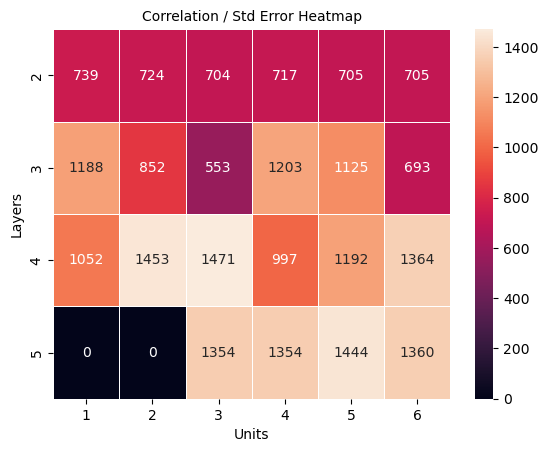

In [71]:
# fig, ax = plt.subplots(figsize=(10,5))
ax = sns.heatmap(div.astype(int), linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, fmt='d')
ax.set_title('Correlation / Std Error Heatmap', fontsize=10)
ax.set_xlabel('Units', fontsize=10)
ax.set_ylabel('Layers', fontsize=10)
plt.show()

In [72]:
div2 = np.divide(div.astype(int), loss_arr)
div2

array([[ 56.83762288,  52.2385406 ,  54.57517819,  54.86637051,
         52.78828824,  55.53930017],
       [189.05265219,  95.14763833,  24.59904353, 212.87482512,
        183.02325166,  34.71617944],
       [172.49794789, 460.90621813, 471.17945317, 130.70572572,
        187.42916474, 377.77003668],
       [  0.        ,   0.        , 306.99476793, 353.26140754,
        427.60804858, 343.91878282]])

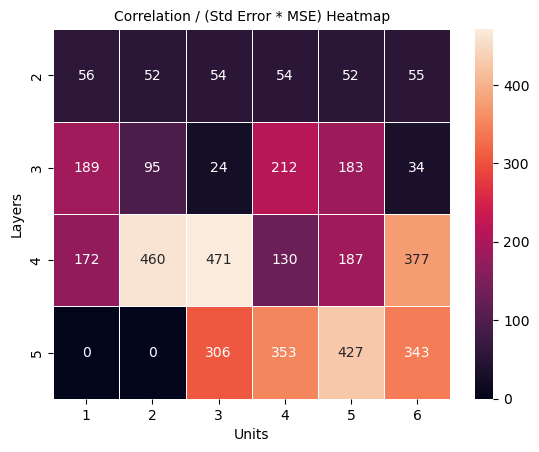

In [73]:
# fig, ax = plt.subplots(figsize=(10,5))
ax = sns.heatmap(div2.astype(int), linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, fmt='g')
ax.set_title('Correlation / (Std Error * MSE) Heatmap', fontsize=10)
ax.set_xlabel('Units', fontsize=10)
ax.set_ylabel('Layers', fontsize=10)
plt.show()

### Different unit size

In [273]:
def create_different_unit_nn(layer_size, unit_sizes):
    model = keras.Sequential()
    for i in range(1, layer_size):
        if i == 1:
            model.add(Dense(unit_sizes[0], activation='relu', input_shape=(len(X_train[0]),)))
        else:
            model.add(Dense(unit_sizes[i-1], activation='relu'))
    
    model.add(Dense(1, activation="linear"))
    model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=100, validation_data=[X_test, y_test], callbacks=myCallbacks)
    
    y_predict = model.predict(X_test)
    evaluate = model.evaluate(X_test, y_test)
    corr = np.corrcoef(y_predict.flatten(), y_test)
    m, b, r, p, st_er = stats.linregress(y_test.flatten(), y_predict.flatten()) 
    
    loss = evaluate[0]
    acc = evaluate[1]
    coef = corr[0][1]
    
    return acc, loss, coef, st_er

In [288]:
max_range_layer = 11
max_range_unit = 11
acc_arr2 = []
loss_arr2 = []
coef_arr2 = []
err_arr2 = []
size_arr2 = []
for i in range(3, max_range_layer):
    acc_unit = []
    loss_unit = []
    coef_unit = []
    err_unit = []
    size_unit = []
    for j in range(1, max_range_unit):
        idx = 0
        sub = j / i
        units = []
        for l in range(j, i):
            units.append(j)

        for k in range(j, 0, -1):
            if k == j: 
                unit = k
            elif idx == i:
                break
            else:
                unit = int(unit - sub)

            if unit < 1:
                unit = 1
            units.append(unit)
            idx = idx+1

        print("##### Layer:"+str(i)+" Unit:"+str(j)+" #####")
        acc, loss, coef, err = create_different_unit_nn(i, units)
        acc_unit.append(acc)
        loss_unit.append(loss)
        coef_unit.append(coef)
        err_unit.append(err)
        size_unit(units)
    
    acc_arr2.append(acc_unit)
    loss_arr2.append(loss_unit)
    coef_arr2.append(coef_unit)
    err_arr2.append(err_unit)
    size_arr2.append(size_unit)

##### Layer:3 Unit:1 #####
Epoch 1/100
28160/28160 [==============================] - 30s 1ms/step - loss: 82.3526 - accuracy: 0.0904 - val_loss: 47.7263 - val_accuracy: 5.5487e-06
Epoch 2/100
28160/28160 [==============================] - 29s 1ms/step - loss: 40.7908 - accuracy: 5.5487e-06 - val_loss: 47.1735 - val_accuracy: 5.5487e-06
Epoch 3/100
28160/28160 [==============================] - 33s 1ms/step - loss: 40.8579 - accuracy: 5.5487e-06 - val_loss: 47.2789 - val_accuracy: 5.5487e-06
Epoch 4/100
28160/28160 [==============================] - 30s 1ms/step - loss: 40.7323 - accuracy: 5.5487e-06 - val_loss: 47.2703 - val_accuracy: 5.5487e-06
Epoch 5/100
28160/28160 [==============================] - 32s 1ms/step - loss: 40.8503 - accuracy: 5.5487e-06 - val_loss: 47.2838 - val_accuracy: 5.5487e-06
Epoch 6/100
28160/28160 [==============================] - 31s 1ms/step - loss: 40.8853 - accuracy: 5.5487e-06 - val_loss: 47.5960 - val_accuracy: 5.5487e-06
Epoch 7/100
28160/28160 [====

28160/28160 [==============================] - 30s 1ms/step - loss: 18.0804 - accuracy: 0.4067 - val_loss: 18.7812 - val_accuracy: 0.8114
Epoch 7/100
28160/28160 [==============================] - 26s 928us/step - loss: 18.7898 - accuracy: 0.6534 - val_loss: 14.9118 - val_accuracy: 0.8114
Epoch 8/100
28160/28160 [==============================] - 1825s 65ms/step - loss: 15.8776 - accuracy: 0.6411 - val_loss: 17.0777 - val_accuracy: 0.8114
Epoch 9/100
28160/28160 [==============================] - 26s 939us/step - loss: 14.0130 - accuracy: 0.8114 - val_loss: 13.3281 - val_accuracy: 0.8114
Epoch 10/100
28160/28160 [==============================] - 924s 33ms/step - loss: 14.5508 - accuracy: 0.7401 - val_loss: 14.4592 - val_accuracy: 0.8114
Epoch 11/100
28160/28160 [==============================] - 26s 910us/step - loss: 13.8873 - accuracy: 0.8114 - val_loss: 13.6286 - val_accuracy: 0.8114
Epoch 12/100
28160/28160 [==============================] - 27s 942us/step - loss: 13.4420 - accura

28160/28160 [==============================] - 28s 977us/step - loss: 12.0501 - accuracy: 0.8114 - val_loss: 11.8449 - val_accuracy: 0.8114
Epoch 9/100
28160/28160 [==============================] - 28s 1ms/step - loss: 12.1363 - accuracy: 0.8114 - val_loss: 12.7538 - val_accuracy: 0.8112
Epoch 10/100
28160/28160 [==============================] - 28s 979us/step - loss: 11.9761 - accuracy: 0.8114 - val_loss: 11.7755 - val_accuracy: 0.8114
Epoch 11/100
28160/28160 [==============================] - 27s 963us/step - loss: 11.8840 - accuracy: 0.8114 - val_loss: 11.8231 - val_accuracy: 0.8112
Epoch 12/100
28160/28160 [==============================] - 28s 1ms/step - loss: 11.9246 - accuracy: 0.8114 - val_loss: 12.2749 - val_accuracy: 0.8114
Epoch 13/100
5632/5632 [==============================] - 4s 759us/step - loss: 11.8164 - accuracy: 0.8114
##### Layer:4 Unit:5 #####
Epoch 1/100
28160/28160 [==============================] - 27s 954us/step - loss: 10275.0479 - accuracy: 0.2450 - val_l

28160/28160 [==============================] - 1126s 40ms/step - loss: 15.5145 - accuracy: 0.8113 - val_loss: 15.4497 - val_accuracy: 0.8112
Epoch 3/100
28160/28160 [==============================] - 27s 949us/step - loss: 13.7325 - accuracy: 0.8113 - val_loss: 14.2192 - val_accuracy: 0.8112
Epoch 4/100
28160/28160 [==============================] - 27s 967us/step - loss: 12.4976 - accuracy: 0.8112 - val_loss: 13.1986 - val_accuracy: 0.8112
Epoch 5/100
28160/28160 [==============================] - 555s 20ms/step - loss: 12.6067 - accuracy: 0.8112 - val_loss: 12.4234 - val_accuracy: 0.8112
Epoch 6/100
28160/28160 [==============================] - 32s 1ms/step - loss: 12.1778 - accuracy: 0.8110 - val_loss: 12.0861 - val_accuracy: 0.8112
Epoch 7/100
28160/28160 [==============================] - 29s 1ms/step - loss: 12.0679 - accuracy: 0.8112 - val_loss: 14.7665 - val_accuracy: 0.8112
Epoch 8/100
28160/28160 [==============================] - 28s 1ms/step - loss: 11.7176 - accuracy: 0.8

28160/28160 [==============================] - 29s 1ms/step - loss: 12.3602 - accuracy: 0.8113 - val_loss: 13.1564 - val_accuracy: 0.8114
Epoch 8/100
28160/28160 [==============================] - 29s 1ms/step - loss: 12.2229 - accuracy: 0.8111 - val_loss: 11.2359 - val_accuracy: 0.8112
Epoch 9/100
28160/28160 [==============================] - 29s 1ms/step - loss: 11.8366 - accuracy: 0.8113 - val_loss: 11.4466 - val_accuracy: 0.8112
Epoch 10/100
28160/28160 [==============================] - 29s 1ms/step - loss: 11.6033 - accuracy: 0.8113 - val_loss: 12.2527 - val_accuracy: 0.8114
Epoch 11/100
28160/28160 [==============================] - 29s 1ms/step - loss: 11.4801 - accuracy: 0.8112 - val_loss: 10.9577 - val_accuracy: 0.8114
Epoch 12/100
28160/28160 [==============================] - 29s 1ms/step - loss: 11.5032 - accuracy: 0.8113 - val_loss: 11.8089 - val_accuracy: 0.8114
Epoch 13/100
28160/28160 [==============================] - 29s 1ms/step - loss: 11.4582 - accuracy: 0.8113 -

Epoch 10/100
28160/28160 [==============================] - 38s 1ms/step - loss: 11.7218 - accuracy: 0.8114 - val_loss: 12.8822 - val_accuracy: 0.8112
Epoch 11/100
28160/28160 [==============================] - 39s 1ms/step - loss: 12.0761 - accuracy: 0.8113 - val_loss: 13.5324 - val_accuracy: 0.8112
Epoch 12/100
5632/5632 [==============================] - 7s 1ms/step - loss: 11.4044 - accuracy: 0.8112
##### Layer:6 Unit:6 #####
Epoch 1/100
28160/28160 [==============================] - 42s 1ms/step - loss: 26.9500 - accuracy: 0.5179 - val_loss: 26.1151 - val_accuracy: 0.8112
Epoch 2/100
28160/28160 [==============================] - 42s 1ms/step - loss: 16.6773 - accuracy: 0.8112 - val_loss: 13.7098 - val_accuracy: 0.8112
Epoch 3/100
28160/28160 [==============================] - 39s 1ms/step - loss: 14.7945 - accuracy: 0.8112 - val_loss: 14.7303 - val_accuracy: 0.8112
Epoch 4/100
28160/28160 [==============================] - 36s 1ms/step - loss: 13.7194 - accuracy: 0.8087 - val_los

Epoch 5/100
28160/28160 [==============================] - 51s 2ms/step - loss: 54.6993 - accuracy: 5.5487e-06 - val_loss: 54.7007 - val_accuracy: 5.5487e-06
Epoch 6/100
28160/28160 [==============================] - 52s 2ms/step - loss: 54.6988 - accuracy: 5.5487e-06 - val_loss: 54.7001 - val_accuracy: 5.5487e-06
Epoch 7/100
28160/28160 [==============================] - 52s 2ms/step - loss: 54.6991 - accuracy: 5.5487e-06 - val_loss: 54.6983 - val_accuracy: 5.5487e-06
Epoch 8/100
28160/28160 [==============================] - 53s 2ms/step - loss: 54.6998 - accuracy: 5.5487e-06 - val_loss: 54.6965 - val_accuracy: 5.5487e-06
Epoch 9/100
28160/28160 [==============================] - 53s 2ms/step - loss: 54.6993 - accuracy: 5.5487e-06 - val_loss: 54.6963 - val_accuracy: 5.5487e-06
Epoch 10/100
28160/28160 [==============================] - 52s 2ms/step - loss: 54.6994 - accuracy: 5.5487e-06 - val_loss: 54.6992 - val_accuracy: 5.5487e-06
Epoch 11/100
5632/5632 [===========================

28160/28160 [==============================] - 30s 1ms/step - loss: 54.6995 - accuracy: 5.5487e-06 - val_loss: 54.6973 - val_accuracy: 5.5487e-06
Epoch 6/100
28160/28160 [==============================] - 30s 1ms/step - loss: 54.6993 - accuracy: 5.5487e-06 - val_loss: 54.7011 - val_accuracy: 5.5487e-06
Epoch 7/100
28160/28160 [==============================] - 30s 1ms/step - loss: 54.6994 - accuracy: 5.5487e-06 - val_loss: 54.7001 - val_accuracy: 5.5487e-06
Epoch 8/100
28160/28160 [==============================] - 30s 1ms/step - loss: 54.6997 - accuracy: 5.5487e-06 - val_loss: 54.6965 - val_accuracy: 5.5487e-06
Epoch 9/100
28160/28160 [==============================] - 29s 1ms/step - loss: 54.6996 - accuracy: 5.5487e-06 - val_loss: 54.7010 - val_accuracy: 5.5487e-06
Epoch 10/100
28160/28160 [==============================] - 30s 1ms/step - loss: 54.6994 - accuracy: 5.5487e-06 - val_loss: 54.6989 - val_accuracy: 5.5487e-06
Epoch 11/100
5632/5632 [==============================] - 4s 79

28160/28160 [==============================] - 32s 1ms/step - loss: 14.5835 - accuracy: 0.8107 - val_loss: 13.9292 - val_accuracy: 0.8114
Epoch 12/100
28160/28160 [==============================] - 31s 1ms/step - loss: 14.4296 - accuracy: 0.8107 - val_loss: 15.4259 - val_accuracy: 0.8114
Epoch 13/100
28160/28160 [==============================] - 31s 1ms/step - loss: 13.6122 - accuracy: 0.8112 - val_loss: 20.6199 - val_accuracy: 0.8114
Epoch 14/100
28160/28160 [==============================] - 30s 1ms/step - loss: 15.4682 - accuracy: 0.8109 - val_loss: 19.8791 - val_accuracy: 0.8112
Epoch 15/100
28160/28160 [==============================] - 31s 1ms/step - loss: 15.0370 - accuracy: 0.8113 - val_loss: 38.0089 - val_accuracy: 0.8114
Epoch 16/100
28160/28160 [==============================] - 31s 1ms/step - loss: 14.7497 - accuracy: 0.8113 - val_loss: 13.1482 - val_accuracy: 0.8112
Epoch 17/100
28160/28160 [==============================] - 30s 1ms/step - loss: 13.1384 - accuracy: 0.8112

28160/28160 [==============================] - 31s 1ms/step - loss: 54.6996 - accuracy: 5.5487e-06 - val_loss: 54.6969 - val_accuracy: 5.5487e-06
Epoch 9/100
28160/28160 [==============================] - 32s 1ms/step - loss: 54.6993 - accuracy: 5.5487e-06 - val_loss: 54.6976 - val_accuracy: 5.5487e-06
Epoch 10/100
28160/28160 [==============================] - 32s 1ms/step - loss: 54.6994 - accuracy: 5.5487e-06 - val_loss: 54.6991 - val_accuracy: 5.5487e-06
Epoch 11/100
5632/5632 [==============================] - 4s 787us/step - loss: 54.6964 - accuracy: 5.5487e-06
##### Layer:9 Unit:4 #####
Epoch 1/100
28160/28160 [==============================] - 31s 1ms/step - loss: 24.3821 - accuracy: 0.5252 - val_loss: 16.5912 - val_accuracy: 0.8112
Epoch 2/100
28160/28160 [==============================] - 31s 1ms/step - loss: 13.0940 - accuracy: 0.8113 - val_loss: 12.3550 - val_accuracy: 0.8112
Epoch 3/100
28160/28160 [==============================] - 31s 1ms/step - loss: 12.7025 - accuracy:

28160/28160 [==============================] - 31s 1ms/step - loss: 54.6998 - accuracy: 5.5487e-06 - val_loss: 54.6976 - val_accuracy: 5.5487e-06
Epoch 9/100
28160/28160 [==============================] - 31s 1ms/step - loss: 54.6998 - accuracy: 5.5487e-06 - val_loss: 54.6991 - val_accuracy: 5.5487e-06
Epoch 10/100
28160/28160 [==============================] - 31s 1ms/step - loss: 54.6992 - accuracy: 5.5487e-06 - val_loss: 54.6997 - val_accuracy: 5.5487e-06
Epoch 11/100
5632/5632 [==============================] - 5s 803us/step - loss: 54.6966 - accuracy: 5.5487e-06
##### Layer:9 Unit:8 #####
Epoch 1/100
28160/28160 [==============================] - 32s 1ms/step - loss: 22.2618 - accuracy: 0.6168 - val_loss: 11.8126 - val_accuracy: 0.8114
Epoch 2/100
28160/28160 [==============================] - 32s 1ms/step - loss: 13.6988 - accuracy: 0.8047 - val_loss: 20.8246 - val_accuracy: 0.8114
Epoch 3/100
28160/28160 [==============================] - 31s 1ms/step - loss: 12.1737 - accuracy:

5632/5632 [==============================] - 5s 837us/step - loss: 54.6978 - accuracy: 5.5487e-06
##### Layer:10 Unit:6 #####
Epoch 1/100
28160/28160 [==============================] - 33s 1ms/step - loss: 25.9155 - accuracy: 0.7380 - val_loss: 18.8334 - val_accuracy: 0.8112
Epoch 2/100
28160/28160 [==============================] - 32s 1ms/step - loss: 14.1379 - accuracy: 0.8113 - val_loss: 11.1160 - val_accuracy: 0.8112
Epoch 3/100
28160/28160 [==============================] - 32s 1ms/step - loss: 12.7977 - accuracy: 0.8112 - val_loss: 12.0923 - val_accuracy: 0.8112
Epoch 4/100
28160/28160 [==============================] - 33s 1ms/step - loss: 13.0226 - accuracy: 0.8112 - val_loss: 11.1222 - val_accuracy: 0.8112
Epoch 5/100
28160/28160 [==============================] - 32s 1ms/step - loss: 12.7506 - accuracy: 0.8112 - val_loss: 15.7952 - val_accuracy: 0.8112
Epoch 6/100
28160/28160 [==============================] - 32s 1ms/step - loss: 12.2268 - accuracy: 0.8112 - val_loss: 13.87

28160/28160 [==============================] - 33s 1ms/step - loss: 14.5054 - accuracy: 0.7804 - val_loss: 14.7246 - val_accuracy: 5.5487e-06
Epoch 3/100
28160/28160 [==============================] - 33s 1ms/step - loss: 12.2041 - accuracy: 0.7836 - val_loss: 11.3268 - val_accuracy: 0.8112
Epoch 4/100
28160/28160 [==============================] - 33s 1ms/step - loss: 12.4589 - accuracy: 0.8016 - val_loss: 11.1238 - val_accuracy: 0.8112
Epoch 5/100
28160/28160 [==============================] - 33s 1ms/step - loss: 12.4015 - accuracy: 0.7966 - val_loss: 10.7455 - val_accuracy: 0.8112
Epoch 6/100
28160/28160 [==============================] - 33s 1ms/step - loss: 14.1058 - accuracy: 0.7906 - val_loss: 11.5228 - val_accuracy: 0.8112
Epoch 7/100
28160/28160 [==============================] - 33s 1ms/step - loss: 14.0696 - accuracy: 0.7941 - val_loss: 13.5147 - val_accuracy: 0.8112
Epoch 8/100
28160/28160 [==============================] - 33s 1ms/step - loss: 11.8816 - accuracy: 0.7976 -

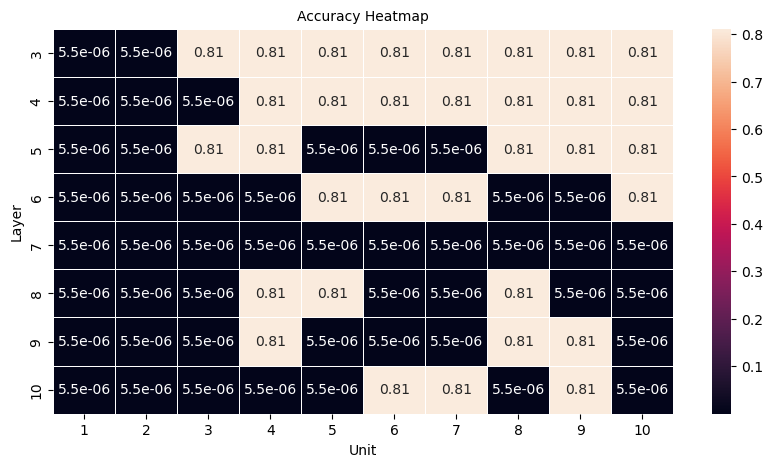

In [289]:
xlabels = range(1, max_range_unit)
ylabels = range(3, max_range_layer)
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(acc_arr2, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True)
ax.set_title('Accuracy Heatmap', fontsize=10)
ax.set_xlabel('Unit', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

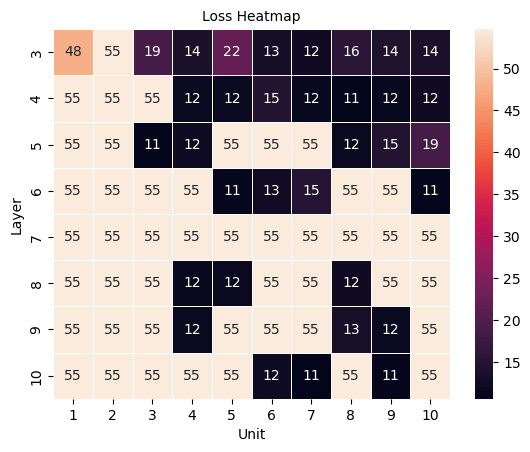

In [290]:
ax = sns.heatmap(loss_arr2, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True)
ax.set_title('Loss Heatmap', fontsize=10)
ax.set_xlabel('Unit', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

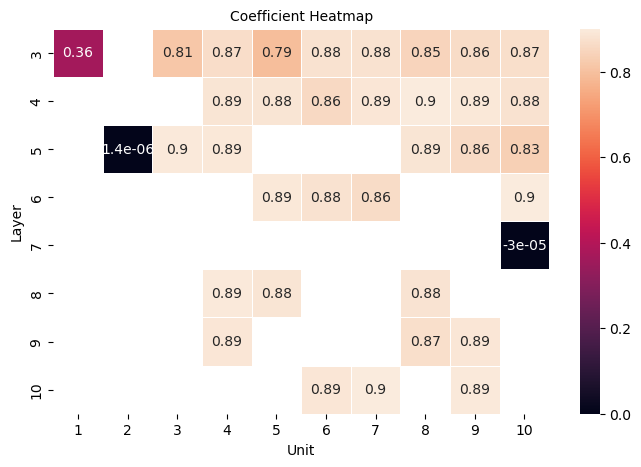

In [291]:
fig, ax = plt.subplots(figsize=(8,5))
sns.heatmap(coef_arr2, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True)
ax.set_title('Coefficient Heatmap', fontsize=10)
ax.set_xlabel('Unit', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

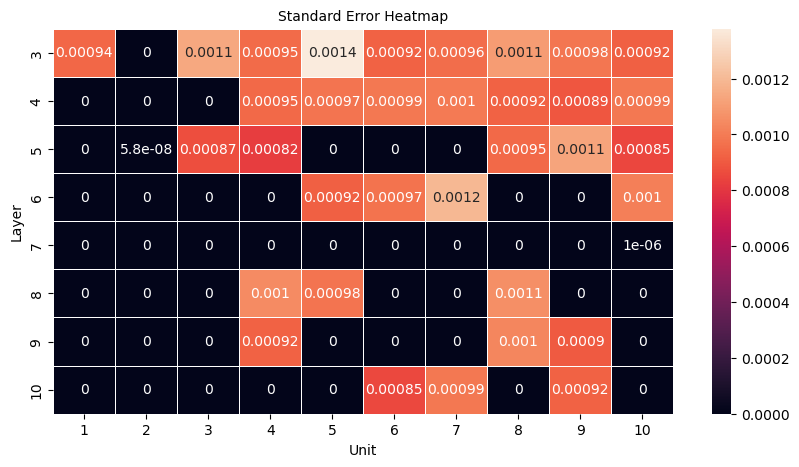

In [292]:
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(err_arr2, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True)
ax.set_title('Standard Error Heatmap', fontsize=10)
ax.set_xlabel('Unit', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

In [383]:
max_range_layer = 11
max_range_unit = 11
size_arr2 = []
for i in range(3, max_range_layer):
    size_unit = []
    for j in range(1, max_range_unit):
        idx = 0
        sub = j / i
        units = []
        for l in range(j, i):
            units.append(j)

        for k in range(j, 0, -1):
            if k == j: 
                unit = k
            elif idx == i:
                break
            else:
                unit = int(unit - sub)

            if unit < 1:
                unit = 1
            units.append(unit)
            idx = idx+1

        print("##### Layer:"+str(i)+" Unit:"+str(j)+" #####")
        print(units)
        size_unit.append(units)
    
    size_arr2.append(size_unit)

##### Layer:3 Unit:1 #####
[1, 1, 1]
##### Layer:3 Unit:2 #####
[2, 2, 1]
##### Layer:3 Unit:3 #####
[3, 2, 1]
##### Layer:3 Unit:4 #####
[4, 2, 1]
##### Layer:3 Unit:5 #####
[5, 3, 1]
##### Layer:3 Unit:6 #####
[6, 4, 2]
##### Layer:3 Unit:7 #####
[7, 4, 1]
##### Layer:3 Unit:8 #####
[8, 5, 2]
##### Layer:3 Unit:9 #####
[9, 6, 3]
##### Layer:3 Unit:10 #####
[10, 6, 2]
##### Layer:4 Unit:1 #####
[1, 1, 1, 1]
##### Layer:4 Unit:2 #####
[2, 2, 2, 1]
##### Layer:4 Unit:3 #####
[3, 3, 2, 1]
##### Layer:4 Unit:4 #####
[4, 3, 2, 1]
##### Layer:4 Unit:5 #####
[5, 3, 1, 1]
##### Layer:4 Unit:6 #####
[6, 4, 2, 1]
##### Layer:4 Unit:7 #####
[7, 5, 3, 1]
##### Layer:4 Unit:8 #####
[8, 6, 4, 2]
##### Layer:4 Unit:9 #####
[9, 6, 3, 1]
##### Layer:4 Unit:10 #####
[10, 7, 4, 1]
##### Layer:5 Unit:1 #####
[1, 1, 1, 1, 1]
##### Layer:5 Unit:2 #####
[2, 2, 2, 2, 1]
##### Layer:5 Unit:3 #####
[3, 3, 3, 2, 1]
##### Layer:5 Unit:4 #####
[4, 4, 3, 2, 1]
##### Layer:5 Unit:5 #####
[5, 4, 3, 2, 1]
##### Layer

In [384]:
size_arr2

[[[1, 1, 1],
  [2, 2, 1],
  [3, 2, 1],
  [4, 2, 1],
  [5, 3, 1],
  [6, 4, 2],
  [7, 4, 1],
  [8, 5, 2],
  [9, 6, 3],
  [10, 6, 2]],
 [[1, 1, 1, 1],
  [2, 2, 2, 1],
  [3, 3, 2, 1],
  [4, 3, 2, 1],
  [5, 3, 1, 1],
  [6, 4, 2, 1],
  [7, 5, 3, 1],
  [8, 6, 4, 2],
  [9, 6, 3, 1],
  [10, 7, 4, 1]],
 [[1, 1, 1, 1, 1],
  [2, 2, 2, 2, 1],
  [3, 3, 3, 2, 1],
  [4, 4, 3, 2, 1],
  [5, 4, 3, 2, 1],
  [6, 4, 2, 1, 1],
  [7, 5, 3, 1, 1],
  [8, 6, 4, 2, 1],
  [9, 7, 5, 3, 1],
  [10, 8, 6, 4, 2]],
 [[1, 1, 1, 1, 1, 1],
  [2, 2, 2, 2, 2, 1],
  [3, 3, 3, 3, 2, 1],
  [4, 4, 4, 3, 2, 1],
  [5, 5, 4, 3, 2, 1],
  [6, 5, 4, 3, 2, 1],
  [7, 5, 3, 1, 1, 1],
  [8, 6, 4, 2, 1, 1],
  [9, 7, 5, 3, 1, 1],
  [10, 8, 6, 4, 2, 1]],
 [[1, 1, 1, 1, 1, 1, 1],
  [2, 2, 2, 2, 2, 2, 1],
  [3, 3, 3, 3, 3, 2, 1],
  [4, 4, 4, 4, 3, 2, 1],
  [5, 5, 5, 4, 3, 2, 1],
  [6, 6, 5, 4, 3, 2, 1],
  [7, 6, 5, 4, 3, 2, 1],
  [8, 6, 4, 2, 1, 1, 1],
  [9, 7, 5, 3, 1, 1, 1],
  [10, 8, 6, 4, 2, 1, 1]],
 [[1, 1, 1, 1, 1, 1, 1, 1],
  [2, 2, 2, 

## Find out Hyper paramater 

In [15]:
X_train = X1_train
y_train = y1_train
X_test = X1_test
y_test = y1_test

In [76]:
# Use best layer and unit
shape = (len(X_train[0]),)
def create_model(optimizer="adam"):
    model = keras.Sequential()
    model.add(Dense(3, activation='relu', input_shape=shape)) 
    model.add(Dense(3, activation='relu'))    
    model.add(Dense(3, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=optimizer, loss='mse', metrics=["mae"])
    return model

### Epoch

In [77]:
estimator = KerasRegressor(model=create_model, verbose=1)

In [78]:

# define the grid search parameters
param_grid = {
    'epochs': [25, 50, 100, 200, 300]
}

In [79]:
grid1 = GridSearchCV(estimator=estimator,  
                    n_jobs=-1, 
                    verbose=1,
                    return_train_score=True,
                    cv=2,
                    param_grid=param_grid)

In [80]:
grid1_result = grid1.fit(X_train, y_train)

Fitting 2 folds for each of 5 candidates, totalling 10 fits


2023-04-20 20:46:31.224286: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-20 20:46:31.224449: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-20 20:46:31.224971: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable th

Epoch 1/50
Epoch 1/50
Epoch 1/25
Epoch 1/25
8935/8935 [==============================] - 14s 2ms/step - loss: 260.8340 - mae: 12.5106
Epoch 2/50
8935/8935 [==============================] - 14s 2ms/step - loss: 224.8708 - mae: 9.0749
Epoch 2/50
8935/8935 [==============================] - 14s 2ms/step - loss: 190.8847 - mae: 10.6700
Epoch 2/25
8935/8935 [==============================] - 14s 2ms/step - loss: 136.2397 - mae: 7.9511
Epoch 2/25
8935/8935 [==============================] - 14s 2ms/step - loss: 45.8426 - mae: 5.1895
Epoch 3/50
8935/8935 [==============================] - 14s 2ms/step - loss: 53.5262 - mae: 3.9628
Epoch 3/25
8935/8935 [==============================] - 14s 2ms/step - loss: 79.1848 - mae: 5.3289
Epoch 3/25
8935/8935 [==============================] - 14s 2ms/step - loss: 15.4424 - mae: 2.5229
Epoch 4/50
8935/8935 [==============================] - 14s 2ms/step - loss: 39.6552 - mae: 3.5078
Epoch 4/50
8935/8935 [==============================] - 14s 2ms/step -

8935/8935 [==============================] - 13s 1ms/step - loss: 18.0330 - mae: 2.1845
Epoch 9/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.7453 - mae: 1.4069
Epoch 16/100
8935/8935 [==============================] - 12s 1ms/step - loss: 9.7920 - mae: 1.8660
Epoch 44/50
8935/8935 [==============================] - 13s 1ms/step - loss: 4.0206 - mae: 1.3937
Epoch 44/50
8935/8935 [==============================] - 13s 1ms/step - loss: 18.1789 - mae: 2.1658
Epoch 10/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.6700 - mae: 1.3965
Epoch 17/100
8935/8935 [==============================] - 13s 1ms/step - loss: 9.8048 - mae: 1.8669
Epoch 45/50
8935/8935 [==============================] - 13s 1ms/step - loss: 3.9921 - mae: 1.3879
Epoch 45/50
8935/8935 [==============================] - 13s 2ms/step - loss: 17.8313 - mae: 2.1565
Epoch 11/100
8935/8935 [==============================] - 14s 2ms/step - loss: 3.6749 - mae: 1.3988
Epoch 18/100
89

8935/8935 [==============================] - 12s 1ms/step - loss: 11.0090 - mae: 1.9518
Epoch 26/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4732 - mae: 1.3657
Epoch 56/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2853 - mae: 1.3090
Epoch 32/200
8935/8935 [==============================] - 13s 1ms/step - loss: 14.8716 - mae: 2.0758
Epoch 50/100
8935/8935 [==============================] - 13s 1ms/step - loss: 10.7294 - mae: 1.9469
Epoch 27/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4735 - mae: 1.3694
Epoch 57/100
8935/8935 [==============================] - 12s 1ms/step - loss: 3.2773 - mae: 1.3060
Epoch 33/200
8935/8935 [==============================] - 13s 1ms/step - loss: 14.5716 - mae: 2.1046
Epoch 51/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4638 - mae: 1.3678
Epoch 58/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2831 - mae: 1.3081
Epoch 34/

5166/8935 [================>.............] - ETA: 6s - loss: 13.4688 - mae: 2.1464

8935/8935 [==============================] - 15s 2ms/step - loss: 10.1936 - mae: 1.8430
Epoch 45/200
8935/8935 [==============================] - 15s 2ms/step - loss: 14.2150 - mae: 2.1405
Epoch 68/100
8935/8935 [==============================] - 15s 2ms/step - loss: 3.2317 - mae: 1.2971
Epoch 51/200
8935/8935 [==============================] - 15s 2ms/step - loss: 3.4250 - mae: 1.3603
Epoch 75/100
8935/8935 [==============================] - 14s 2ms/step - loss: 10.1336 - mae: 1.8464
Epoch 46/200
8935/8935 [==============================] - 14s 2ms/step - loss: 14.0434 - mae: 2.1373
Epoch 69/100
8935/8935 [==============================] - 14s 2ms/step - loss: 3.2269 - mae: 1.2964
Epoch 52/200
8935/8935 [==============================] - 14s 2ms/step - loss: 10.1874 - mae: 1.8423
Epoch 47/200
8935/8935 [==============================] - 15s 2ms/step - loss: 14.0820 - mae: 2.1390
Epoch 70/100
8935/8935 [==============================] - 15s 2ms/step - loss: 3.2264 - mae: 1.2965
Epoch 5

8935/8935 [==============================] - 15s 2ms/step - loss: 3.3816 - mae: 1.3519
Epoch 90/100


6924/8935 [======================>.......] - ETA: 3s - loss: 10.0198 - mae: 1.8320

8935/8935 [==============================] - 15s 2ms/step - loss: 10.0630 - mae: 1.8273
Epoch 61/200
8935/8935 [==============================] - 15s 2ms/step - loss: 13.8910 - mae: 2.1327
Epoch 84/100
8935/8935 [==============================] - 15s 2ms/step - loss: 3.2134 - mae: 1.2935
Epoch 67/200
8935/8935 [==============================] - 15s 2ms/step - loss: 7.3958 - mae: 1.4780
Epoch 91/100
8935/8935 [==============================] - 14s 2ms/step - loss: 10.0185 - mae: 1.8277
Epoch 62/200
8935/8935 [==============================] - 14s 2ms/step - loss: 13.8217 - mae: 2.1223
Epoch 85/100
8935/8935 [==============================] - 14s 2ms/step - loss: 3.2038 - mae: 1.2916
Epoch 68/200
8935/8935 [==============================] - 14s 2ms/step - loss: 5.8984 - mae: 1.4327
Epoch 92/100
8935/8935 [==============================] - 15s 2ms/step - loss: 13.6807 - mae: 2.0778
Epoch 86/100
8935/8935 [==============================] - 15s 2ms/step - loss: 3.4561 - mae: 1.3635
Epoch 93

/Users/chikakoolsen/opt/anaconda3/envs/tf/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


8935/8935 [==============================] - 13s 1ms/step - loss: 11.5567 - mae: 1.8963
Epoch 98/100
 887/8935 [=>............................] - ETA: 12s - loss: 11.8400 - mae: 1.9249

2023-04-20 21:15:25.711310: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 13s 2ms/step - loss: 9.9495 - mae: 1.8223   26.561
Epoch 76/200
8935/8935 [==============================] - 14s 2ms/step - loss: 3.1998 - mae: 1.2926
Epoch 82/200
8935/8935 [==============================] - 15s 2ms/step - loss: 11.4231 - mae: 1.8888
Epoch 99/100
8935/8935 [==============================] - 16s 2ms/step - loss: 225.5488 - mae: 11.3217
Epoch 2/300
8935/8935 [==============================] - 15s 2ms/step - loss: 3.1913 - mae: 1.2883
Epoch 83/200
8935/8935 [==============================] - 15s 2ms/step - loss: 11.3647 - mae: 1.8975
Epoch 100/100
8935/8935 [==============================] - 15s 2ms/step - loss: 83.0749 - mae: 6.4457
Epoch 3/300
8935/8935 [==============================] - 15s 2ms/step - loss: 9.9595 - mae: 1.8176
Epoch 78/200
8935/8935 [==============================] - 15s 2ms/step - loss: 3.1909 - mae: 1.2898
Epoch 84/200
8935/8935 [==============================] - 14s 2ms/step - loss: 20.5711 - mae: 3.295

2023-04-20 21:16:57.281957: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 13s 1ms/step - loss: 3.1938 - mae: 1.2895
Epoch 88/200
8935/8935 [==============================] - 13s 1ms/step - loss: 6.9576 - mae: 1.7141
Epoch 8/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.9567 - mae: 1.8251
Epoch 83/200
8935/8935 [==============================] - 14s 1ms/step - loss: 83.2260 - mae: 7.0139
Epoch 2/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2025 - mae: 1.2920
Epoch 89/200
8935/8935 [==============================] - 13s 1ms/step - loss: 6.5219 - mae: 1.6617
Epoch 9/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.9704 - mae: 1.8193
Epoch 84/200
8935/8935 [==============================] - 13s 1ms/step - loss: 64.3129 - mae: 6.1089
Epoch 3/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2106 - mae: 1.2935
Epoch 90/200
8935/8935 [==============================] - 12s 1ms/step - loss: 6.4672 - mae: 1.6382
Epoch 10/300
89

8935/8935 [==============================] - 13s 1ms/step - loss: 9.8938 - mae: 1.8041
Epoch 121/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.7386 - mae: 1.9001
Epoch 40/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.1504 - mae: 1.2823
Epoch 127/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4925 - mae: 1.3474
Epoch 47/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.8202 - mae: 1.8058
Epoch 122/200
8935/8935 [==============================] - 13s 1ms/step - loss: 14.7576 - mae: 2.2465
Epoch 41/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1637 - mae: 1.2859
Epoch 128/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.8498 - mae: 1.8045
Epoch 123/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.6371 - mae: 1.8883
Epoch 42/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1627 - mae: 1.2857
Epoch

8935/8935 [==============================] - 15s 2ms/step - loss: 3.3872 - mae: 1.3325
Epoch 66/300
8935/8935 [==============================] - 14s 2ms/step - loss: 10.2603 - mae: 1.8524
Epoch 60/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.8621 - mae: 1.8031
Epoch 142/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3790 - mae: 1.3310
Epoch 67/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1465 - mae: 1.2809
Epoch 148/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.7692 - mae: 1.7944
Epoch 143/200
8935/8935 [==============================] - 14s 2ms/step - loss: 3.3593 - mae: 1.3268
Epoch 68/300
8935/8935 [==============================] - 14s 2ms/step - loss: 10.2284 - mae: 1.8479
Epoch 62/300
8935/8935 [==============================] - 14s 2ms/step - loss: 3.1531 - mae: 1.2832
Epoch 149/200
8935/8935 [==============================] - 14s 2ms/step - loss: 3.3965 - mae: 1.3344
Epoch 6

5725/8935 [==================>...........] - ETA: 4s - loss: 3.0912 - mae: 1.2810

8935/8935 [==============================] - 14s 2ms/step - loss: 9.6546 - mae: 1.8078
Epoch 179/200
8935/8935 [==============================] - 14s 2ms/step - loss: 3.1392 - mae: 1.2816
Epoch 184/200
8935/8935 [==============================] - 15s 2ms/step - loss: 3.2983 - mae: 1.3171
Epoch 104/300
8935/8935 [==============================] - 14s 2ms/step - loss: 10.2442 - mae: 1.8279
Epoch 98/300
8935/8935 [==============================] - 14s 2ms/step - loss: 3.1247 - mae: 1.2784
Epoch 185/200
8935/8935 [==============================] - 14s 2ms/step - loss: 3.2896 - mae: 1.3155
Epoch 105/300
8935/8935 [==============================] - 14s 2ms/step - loss: 10.2516 - mae: 1.8333
Epoch 99/300
8935/8935 [==============================] - 15s 2ms/step - loss: 9.6141 - mae: 1.8024
Epoch 181/200
8935/8935 [==============================] - 15s 2ms/step - loss: 3.1423 - mae: 1.2808
Epoch 186/200
8935/8935 [==============================] - 14s 2ms/step - loss: 3.2802 - mae: 1.3136
Epoc

8935/8935 [==============================] - 10s 1ms/step - loss: 9.8538 - mae: 1.8042
Epoch 154/300
8935/8935 [==============================] - 9s 1ms/step - loss: 3.2093 - mae: 1.3016
Epoch 161/300
8935/8935 [==============================] - 9s 1ms/step - loss: 9.8354 - mae: 1.7962
Epoch 155/300
8935/8935 [==============================] - 9s 1ms/step - loss: 3.2230 - mae: 1.3030
Epoch 162/300
8935/8935 [==============================] - 9s 1ms/step - loss: 9.8548 - mae: 1.8028
Epoch 156/300
8935/8935 [==============================] - 10s 1ms/step - loss: 3.2148 - mae: 1.3020
Epoch 163/300
8935/8935 [==============================] - 10s 1ms/step - loss: 9.8524 - mae: 1.8021
Epoch 157/300
8935/8935 [==============================] - 9s 988us/step - loss: 3.2058 - mae: 1.3009
Epoch 164/300
8935/8935 [==============================] - 9s 988us/step - loss: 9.8260 - mae: 1.7979
Epoch 158/300
8935/8935 [==============================] - 9s 1ms/step - loss: 3.2126 - mae: 1.3019
Epoch 1

8935/8935 [==============================] - 9s 1ms/step - loss: 3.1217 - mae: 1.2791
Epoch 240/300
8935/8935 [==============================] - 9s 1ms/step - loss: 9.7730 - mae: 1.7915
Epoch 234/300
8935/8935 [==============================] - 9s 1ms/step - loss: 3.1229 - mae: 1.2790
Epoch 241/300
8935/8935 [==============================] - 9s 1ms/step - loss: 9.7598 - mae: 1.7928
Epoch 235/300
8935/8935 [==============================] - 9s 1ms/step - loss: 3.1126 - mae: 1.2758
Epoch 242/300
8935/8935 [==============================] - 9s 1000us/step - loss: 9.7885 - mae: 1.7993
Epoch 236/300
8935/8935 [==============================] - 9s 1ms/step - loss: 3.1429 - mae: 1.2795
Epoch 243/300
8935/8935 [==============================] - 9s 1ms/step - loss: 9.7866 - mae: 1.7949
Epoch 237/300
8935/8935 [==============================] - 9s 1ms/step - loss: 3.1312 - mae: 1.2795
Epoch 244/300
8935/8935 [==============================] - 9s 1ms/step - loss: 9.7698 - mae: 1.7935
Epoch 238/3

8935/8935 [==============================] - 10s 1ms/step - loss: 3.1140 - mae: 1.2749
Epoch 280/300
8935/8935 [==============================] - 10s 1ms/step - loss: 9.7463 - mae: 1.7915
Epoch 274/300
8935/8935 [==============================] - 9s 1ms/step - loss: 3.1030 - mae: 1.2752
Epoch 281/300
8935/8935 [==============================] - 9s 1ms/step - loss: 9.7578 - mae: 1.7946
Epoch 275/300
8935/8935 [==============================] - 9s 980us/step - loss: 3.1076 - mae: 1.2747
Epoch 282/300
8935/8935 [==============================] - 9s 985us/step - loss: 9.7327 - mae: 1.7946
Epoch 276/300
8935/8935 [==============================] - 9s 985us/step - loss: 3.1011 - mae: 1.2745
Epoch 283/300
8935/8935 [==============================] - 9s 986us/step - loss: 9.7598 - mae: 1.7967
Epoch 277/300
8935/8935 [==============================] - 9s 995us/step - loss: 3.1043 - mae: 1.2726
Epoch 284/300
8935/8935 [==============================] - 9s 996us/step - loss: 9.7375 - mae: 1.7945


In [81]:
# summarize results
print("Best: %f using %s" % (grid1_result.best_score_, grid1_result.best_params_))
means = grid1_result.cv_results_['mean_test_score']
stds = grid1_result.cv_results_['std_test_score']
params = grid1_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.962919 using {'epochs': 50}
0.954309 (0.023426) with: {'epochs': 25}
0.962919 (0.015191) with: {'epochs': 50}
0.948137 (0.030979) with: {'epochs': 100}
0.927484 (0.051124) with: {'epochs': 200}
0.947332 (0.035917) with: {'epochs': 300}


In [82]:
grid1_result.cv_results_

{'mean_fit_time': array([ 354.01523638,  657.61442339, 1348.19213498, 2689.27654171,
        3347.64921868]),
 'std_fit_time': array([28.47608447, 24.8882004 ,  5.68150508,  3.19641209, 19.59266889]),
 'mean_score_time': array([15.74344969, 16.42763865, 18.05987656, 20.61457419,  7.95978308]),
 'std_score_time': array([4.85777354e+00, 4.14968765e+00, 2.55369747e+00, 8.79764557e-05,
        6.23007059e-01]),
 'param_epochs': masked_array(data=[25, 50, 100, 200, 300],
              mask=[False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'epochs': 25},
  {'epochs': 50},
  {'epochs': 100},
  {'epochs': 200},
  {'epochs': 300}],
 'split0_test_score': array([0.93088354, 0.9477282 , 0.91715802, 0.87635981, 0.91141554]),
 'split1_test_score': array([0.97773458, 0.97811054, 0.97911651, 0.97860735, 0.98324869]),
 'mean_test_score': array([0.95430906, 0.96291937, 0.94813727, 0.92748358, 0.94733212]),
 'std_test_score': array([0.02342552, 0.015191

### Batch size

In [22]:
myCallbacks = [tf.keras.callbacks.EarlyStopping(monitor='mae', patience=10, mode='max')]

In [83]:
# define the grid search parameters
param_grid = {
    'batch_size':[8, 16, 32, 64, 128, 256]
}

In [84]:
grid2 = GridSearchCV(estimator=estimator,  
                    n_jobs=-1, 
                    verbose=1,
                    return_train_score=True,
                    cv=2,
                    param_grid=param_grid,
                    scoring='neg_mean_absolute_error')
grid2_result = grid2.fit(X_train, y_train, epochs=50)

Fitting 2 folds for each of 6 candidates, totalling 12 fits


2023-04-22 15:00:21.736378: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-22 15:00:21.736579: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-22 15:00:21.752703: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable th

Epoch 1/50
Epoch 1/50
Epoch 1/50
Epoch 1/50
17870/17870 [==============================] - 26s 1ms/step - loss: 191.7619 - mae: 10.0391
Epoch 2/50
17870/17870 [==============================] - 26s 1ms/step - loss: 157.9704 - mae: 8.9457
Epoch 2/50
35739/35739 [==============================] - 52s 1ms/step - loss: 675.9841 - mae: 8.0203
Epoch 2/50
35739/35739 [==============================] - 52s 1ms/step - loss: 196.4626 - mae: 8.0034
Epoch 2/50
17870/17870 [==============================] - 27s 2ms/step - loss: 39.4041 - mae: 5.0309
Epoch 3/50
17870/17870 [==============================] - 27s 2ms/step - loss: 39.9872 - mae: 3.7665
Epoch 4/50
17870/17870 [==============================] - 27s 2ms/step - loss: 28.4725 - mae: 4.2321
Epoch 4/50
35739/35739 [==============================] - 53s 1ms/step - loss: 13.0638 - mae: 2.6302
Epoch 3/50
17870/17870 [==============================] - 26s 1ms/step - loss: 26.4239 - mae: 2.7210
Epoch 5/50
35739/35739 [=============================

17870/17870 [==============================] - 24s 1ms/step - loss: 10.4268 - mae: 1.8616
Epoch 50/50
17870/17870 [==============================] - 25s 1ms/step - loss: 3.5478 - mae: 1.3565
Epoch 50/50
35739/35739 [==============================] - 48s 1ms/step - loss: 3.6319 - mae: 1.3630
Epoch 26/50
35739/35739 [==============================] - 44s 1ms/step - loss: 3.6558 - mae: 1.3669================>..] - ETA: 2s - loss: 3.6682 - 
Epoch 27/50
35739/35739 [==============================] - 42s 1ms/step - loss: 11.3845 - mae: 2.0006
Epoch 27/50
8935/8935 [==============================] - 11s 1ms/step - loss: 7680.9614 - mae: 25.8157
Epoch 2/50
8935/8935 [==============================] - 11s 1ms/step - loss: 117.4617 - mae: 7.8540
Epoch 3/50
35739/35739 [==============================] - 42s 1ms/step - loss: 3.6038 - mae: 1.3571
Epoch 28/50
8935/8935 [==============================] - 11s 1ms/step - loss: 48.3517 - mae: 4.2599
Epoch 4/50
35739/35739 [==============================

4468/4468 [==============================] - 9s 2ms/step - loss: 784.2500 - mae: 13.049435739 [==========================>...] - ETA: 3s - loss: 3.4057 - mae: 1.292
Epoch 2/50
35739/35739 [==============================] - 50s 1ms/step - loss: 3.4088 - mae: 1.2926292
Epoch 42/50
4468/4468 [==============================] - 9s 2ms/step - loss: 18.3995 - mae: 2.6703
Epoch 6/50
4468/4468 [==============================] - 8s 2ms/step - loss: 98.8083 - mae: 7.1682
Epoch 3/50
4468/4468 [==============================] - 7s 2ms/step - loss: 11.7273 - mae: 2.2076
Epoch 7/50
4468/4468 [==============================] - 7s 2ms/step - loss: 64.8702 - mae: 5.2578
Epoch 4/50
4468/4468 [==============================] - 7s 2ms/step - loss: 8.3418 - mae: 1.9047
Epoch 8/50
4468/4468 [==============================] - 7s 2ms/step - loss: 45.5881 - mae: 4.1344
Epoch 5/50
35739/35739 [==============================] - 55s 2ms/step - loss: 11.1042 - mae: 1.9611
Epoch 42/50
4468/4468 [====================

4468/4468 [==============================] - 6s 1ms/step - loss: 3.5992 - mae: 1.3479
Epoch 40/50
35739/35739 [==============================] - 46s 1ms/step - loss: 11.0997 - mae: 1.9616
Epoch 46/50
4468/4468 [==============================] - 6s 1ms/step - loss: 16.2239 - mae: 1.9524
Epoch 37/50
4468/4468 [==============================] - 6s 1ms/step - loss: 3.5747 - mae: 1.3462
Epoch 41/50
4468/4468 [==============================] - 6s 1ms/step - loss: 16.1131 - mae: 1.9617
Epoch 38/50
4468/4468 [==============================] - 6s 1ms/step - loss: 3.6292 - mae: 1.3486
Epoch 42/50
4468/4468 [==============================] - 6s 1ms/step - loss: 16.2055 - mae: 1.9460
Epoch 39/50
4468/4468 [==============================] - 6s 1ms/step - loss: 3.6805 - mae: 1.3479
Epoch 43/50
4468/4468 [==============================] - 6s 1ms/step - loss: 16.2021 - mae: 1.9629
Epoch 40/50
4468/4468 [==============================] - 6s 1ms/step - loss: 3.5749 - mae: 1.3447
Epoch 44/50
4468/4468 [=

2234/2234 [==============================] - 3s 1ms/step - loss: 207.9532 - mae: 12.0177
Epoch 25/50
2234/2234 [==============================] - 3s 1ms/step - loss: 13.8150 - mae: 2.0416
Epoch 16/50
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9536 - mae: 12.0177
Epoch 26/50
2234/2234 [==============================] - 3s 1ms/step - loss: 13.3687 - mae: 1.9904
Epoch 17/50
2234/2234 [==============================] - 3s 1ms/step - loss: 13.0479 - mae: 1.9785
Epoch 18/50
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9537 - mae: 12.0177
Epoch 28/50
2234/2234 [==============================] - 3s 1ms/step - loss: 12.8519 - mae: 1.9751
Epoch 19/50
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9535 - mae: 12.0177
Epoch 29/50
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9531 - mae: 12.0177
Epoch 30/50
2234/2234 [==============================] - 3s 1ms/step - loss: 12.5225 - mae: 1.9718
Epoch 21/50


/Users/chikakoolsen/opt/anaconda3/envs/tf/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


2234/2234 [==============================] - 3s 1ms/step - loss: 11.4294 - mae: 1.9288
Epoch 44/50
2234/2234 [==============================] - 2s 1ms/step - loss: 11.3643 - mae: 1.9236
Epoch 45/50
2234/2234 [==============================] - 2s 1ms/step - loss: 11.2964 - mae: 1.9293
Epoch 46/50
2234/2234 [==============================] - 2s 1ms/step - loss: 11.2579 - mae: 1.9300
Epoch 47/50
2234/2234 [==============================] - 2s 1ms/step - loss: 11.3278 - mae: 1.9162
Epoch 48/50
2234/2234 [==============================] - 2s 1ms/step - loss: 11.2781 - mae: 1.9257
Epoch 49/50
1710/2234 [=====================>........] - ETA: 0s - loss: 11.1833 - mae: 1.9127

2023-04-22 15:42:37.575886: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2234/2234 [==============================] - 3s 1ms/step - loss: 11.2906 - mae: 1.9156
Epoch 50/50
1117/1117 [==============================] - 2s 1ms/step - loss: 635.7847 - mae: 13.6520
Epoch 2/50
1117/1117 [==============================] - 1s 1ms/step - loss: 81.7759 - mae: 7.2989
Epoch 3/50
1117/1117 [==============================] - 1s 1ms/step - loss: 50.1429 - mae: 5.9120
Epoch 4/50
1117/1117 [==============================] - 1s 1ms/step - loss: 41.7519 - mae: 5.3970
Epoch 5/50
1117/1117 [==============================] - 1s 1ms/step - loss: 39.6431 - mae: 5.2614
Epoch 6/50
1117/1117 [==============================] - 1s 1ms/step - loss: 37.3047 - mae: 5.1021
Epoch 7/50
1117/1117 [==============================] - 1s 1ms/step - loss: 32.3475 - mae: 4.6900
Epoch 9/50
1117/1117 [==============================] - 1s 1ms/step - loss: 30.4879 - mae: 4.5087
Epoch 10/50
1117/1117 [==============================] - 1s 1ms/step - loss: 29.2010 - mae: 4.3687
Epoch 11/50
1117/1117 [====

2023-04-22 15:42:54.799993: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1117/1117 [==============================] - 1s 1ms/step - loss: 26.9617 - mae: 4.1476
Epoch 14/50
1117/1117 [==============================] - 2s 1ms/step - loss: 146.4888 - mae: 9.7497
Epoch 2/50
1117/1117 [==============================] - 1s 1ms/step - loss: 26.4977 - mae: 4.1095
Epoch 15/50
1117/1117 [==============================] - 1s 1ms/step - loss: 129.9326 - mae: 9.1215
Epoch 3/50
1117/1117 [==============================] - 1s 1ms/step - loss: 26.0894 - mae: 4.0659
Epoch 16/50
1117/1117 [==============================] - 1s 1ms/step - loss: 119.7276 - mae: 8.7316
Epoch 4/50
1117/1117 [==============================] - 1s 1ms/step - loss: 25.7905 - mae: 4.0418
Epoch 17/50
1117/1117 [==============================] - 1s 1ms/step - loss: 95.1729 - mae: 7.3207
Epoch 5/50
1117/1117 [==============================] - 2s 1ms/step - loss: 25.5003 - mae: 4.0110
Epoch 18/50
1117/1117 [==============================] - 2s 2ms/step - loss: 71.8572 - mae: 5.7919
Epoch 6/50
1117/1117 [=

In [85]:
# summarize results
print("Best: %f using %s" % (grid2_result.best_score_, grid2_result.best_params_))
means = grid2_result.cv_results_['mean_test_score']
stds = grid2_result.cv_results_['std_test_score']
params = grid2_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: -1.842795 using {'batch_size': 32}
-2.136955 (0.620328) with: {'batch_size': 8}
-1.977312 (0.538356) with: {'batch_size': 16}
-1.842795 (0.486936) with: {'batch_size': 32}
-2.058767 (0.355901) with: {'batch_size': 64}
-6.894015 (5.120912) with: {'batch_size': 128}
-2.100577 (0.323351) with: {'batch_size': 256}


In [86]:
grid2_result.cv_results_

{'mean_fit_time': array([2532.05748904, 1261.44517744,  671.85165656,  333.59471548,
         154.15365469,   63.04693544]),
 'std_fit_time': array([10.58438194,  7.07970536, 10.75297344,  0.29627359,  0.97507846,
         1.77671444]),
 'mean_score_time': array([82.02794659, 32.21740961, 20.59874344,  6.18148959,  2.60461545,
         1.14940095]),
 'std_score_time': array([0.01515448, 8.8827877 , 0.02344847, 0.0336405 , 0.03722858,
        0.02330589]),
 'param_batch_size': masked_array(data=[8, 16, 32, 64, 128, 256],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'batch_size': 8},
  {'batch_size': 16},
  {'batch_size': 32},
  {'batch_size': 64},
  {'batch_size': 128},
  {'batch_size': 256}],
 'split0_test_score': array([ -2.75728377,  -2.51566769,  -2.32973022,  -2.41466738,
        -12.01492734,  -2.42392887]),
 'split1_test_score': array([-1.51662679, -1.43895543, -1.35585913, -1.7028662 , -1.77310318

### Optimizer

In [87]:
# define the grid search parameters
param_grid = {
     'optimizer':['Adam', 'Adadelta', 'Adamax', 'RMSprop',  'SGD'],
}

In [88]:
grid3 = GridSearchCV(estimator=estimator,  
                    n_jobs=-1, 
                    verbose=1,
                    return_train_score=True,
                    cv=2,
                    param_grid=param_grid)
grid3_result = grid3.fit(X_train, y_train, epochs=50, batch_size=32)

Fitting 2 folds for each of 5 candidates, totalling 10 fits


2023-04-22 16:02:00.098533: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-22 16:02:00.103296: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-22 16:02:00.104590: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable th

Epoch 1/50
Epoch 1/50
Epoch 1/50
Epoch 1/50
8935/8935 [==============================] - 14s 2ms/step - loss: 119.0375 - mae: 7.8988
Epoch 2/50
8935/8935 [==============================] - 14s 2ms/step - loss: 575.5332 - mae: 12.6105
Epoch 2/50
8935/8935 [==============================] - 14s 2ms/step - loss: 243.8232 - mae: 12.3476
Epoch 2/50
8935/8935 [==============================] - 14s 2ms/step - loss: 206.0706 - mae: 11.1475
Epoch 2/50
8935/8935 [==============================] - 14s 2ms/step - loss: 62.6560 - mae: 5.6475
Epoch 3/50
8935/8935 [==============================] - 14s 2ms/step - loss: 44.7136 - mae: 3.7479
Epoch 3/50
8935/8935 [==============================] - 14s 2ms/step - loss: 208.4149 - mae: 12.0153
Epoch 3/50
8935/8935 [==============================] - 14s 2ms/step - loss: 76.7024 - mae: 5.5890
Epoch 3/50
8935/8935 [==============================] - 14s 2ms/step - loss: 25.5828 - mae: 2.7001
Epoch 4/50
8935/8935 [==============================] - 14s 2ms/ste

8935/8935 [==============================] - 15s 2ms/step - loss: 10.0156 - mae: 1.8169
Epoch 39/50
8935/8935 [==============================] - 15s 2ms/step - loss: 3.5467 - mae: 1.3555
Epoch 39/50
8935/8935 [==============================] - 15s 2ms/step - loss: 3.7169 - mae: 1.3485
Epoch 40/50
8935/8935 [==============================] - 16s 2ms/step - loss: 208.4089 - mae: 12.0149
Epoch 40/50
8935/8935 [==============================] - 16s 2ms/step - loss: 10.0224 - mae: 1.8146
Epoch 40/50
8935/8935 [==============================] - 17s 2ms/step - loss: 3.4932 - mae: 1.3583
Epoch 40/50
8935/8935 [==============================] - 17s 2ms/step - loss: 3.7389 - mae: 1.3545
Epoch 41/50
8935/8935 [==============================] - 17s 2ms/step - loss: 208.4086 - mae: 12.0149
Epoch 41/50
8935/8935 [==============================] - 17s 2ms/step - loss: 10.0420 - mae: 1.8197
Epoch 41/50
8935/8935 [==============================] - 17s 2ms/step - loss: 3.5815 - mae: 1.3501
Epoch 41/50
8

8935/8935 [==============================] - 17s 2ms/step - loss: 119.8054 - mae: 7.5120
Epoch 8/50
8935/8935 [==============================] - 17s 2ms/step - loss: 4.0021 - mae: 1.4644
Epoch 8/50
8935/8935 [==============================] - 16s 2ms/step - loss: 18.5588 - mae: 2.2927
Epoch 8/50
8935/8935 [==============================] - 14s 2ms/step - loss: 18.9687 - mae: 2.6165
Epoch 9/50
8935/8935 [==============================] - 14s 2ms/step - loss: 45.7461 - mae: 4.4396
Epoch 9/50
8935/8935 [==============================] - 14s 2ms/step - loss: 3.8790 - mae: 1.4422
Epoch 9/50
8935/8935 [==============================] - 13s 1ms/step - loss: 17.8818 - mae: 2.2394
Epoch 9/50
8935/8935 [==============================] - 13s 1ms/step - loss: 16.1702 - mae: 2.3067
Epoch 10/50
8935/8935 [==============================] - 14s 2ms/step - loss: 3.7745 - mae: 1.4165
Epoch 10/50
8935/8935 [==============================] - 14s 2ms/step - loss: 17.2550 - mae: 2.2089
Epoch 10/50
8935/8935

8935/8935 [==============================] - 16s 2ms/step - loss: 3.4950 - mae: 1.3688
Epoch 28/50
8935/8935 [==============================] - 16s 2ms/step - loss: 3.3640 - mae: 1.3426
Epoch 28/50
8935/8935 [==============================] - 15s 2ms/step - loss: 10.3417 - mae: 1.8364
Epoch 28/50
8935/8935 [==============================] - 15s 2ms/step - loss: 11.0951 - mae: 1.9246
Epoch 29/50
8935/8935 [==============================] - 15s 2ms/step - loss: 3.4783 - mae: 1.3687
Epoch 29/50
8935/8935 [==============================] - 19s 2ms/step - loss: 3.3916 - mae: 1.3467
Epoch 29/50
8935/8935 [==============================] - 20s 2ms/step - loss: 10.2669 - mae: 1.8239
Epoch 29/50
8935/8935 [==============================] - 21s 2ms/step - loss: 3.5055 - mae: 1.3719
Epoch 30/50
8935/8935 [==============================] - 23s 3ms/step - loss: 3.3597 - mae: 1.3398
Epoch 30/50
8935/8935 [==============================] - 23s 3ms/step - loss: 10.2680 - mae: 1.8290
Epoch 30/50
8935/8

8935/8935 [==============================] - 9s 973us/step - loss: 4.0825 - mae: 1.4601
Epoch 30/50
8935/8935 [==============================] - 9s 969us/step - loss: 10.0124 - mae: 1.8546
Epoch 30/50
8935/8935 [==============================] - 9s 965us/step - loss: 4.0156 - mae: 1.4479
Epoch 31/50
8935/8935 [==============================] - 9s 976us/step - loss: 10.0457 - mae: 1.8596
Epoch 31/50
8935/8935 [==============================] - 9s 988us/step - loss: 3.9347 - mae: 1.4313
Epoch 32/50
8935/8935 [==============================] - 9s 1000us/step - loss: 10.0146 - mae: 1.8577
Epoch 32/50
8935/8935 [==============================] - 9s 980us/step - loss: 3.8783 - mae: 1.4216
Epoch 33/50
8935/8935 [==============================] - 9s 1ms/step - loss: 9.9978 - mae: 1.8518
Epoch 33/50
8935/8935 [==============================] - 9s 1ms/step - loss: 3.8364 - mae: 1.4143
Epoch 34/50
8935/8935 [==============================] - 10s 1ms/step - loss: 9.9674 - mae: 1.8456
Epoch 34/50
8

In [89]:
# summarize results
print("Best: %f using %s" % (grid3_result.best_score_, grid3_result.best_params_))
means = grid3_result.cv_results_['mean_test_score']
stds = grid3_result.cv_results_['std_test_score']
params = grid3_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.965198 using {'optimizer': 'Adam'}
0.965198 (0.016167) with: {'optimizer': 'Adam'}
0.459723 (0.459735) with: {'optimizer': 'Adadelta'}
0.946720 (0.035631) with: {'optimizer': 'Adamax'}
0.958192 (0.017275) with: {'optimizer': 'RMSprop'}
0.939763 (0.042657) with: {'optimizer': 'SGD'}


In [90]:
grid3_result.cv_results_

{'mean_fit_time': array([738.63018942, 742.57256198, 787.52592218, 792.45945048,
        481.44388902]),
 'std_fit_time': array([2.89732456e+00, 1.38928890e-02, 5.53070891e+00, 1.06361814e+01,
        2.16083969e+01]),
 'mean_score_time': array([16.73655367, 12.39629853, 11.25406992, 15.53775692,  7.59286451]),
 'std_score_time': array([4.02093148, 0.00962651, 0.86582601, 5.05336905, 0.6625185 ]),
 'param_optimizer': masked_array(data=['Adam', 'Adadelta', 'Adamax', 'RMSprop', 'SGD'],
              mask=[False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'optimizer': 'Adam'},
  {'optimizer': 'Adadelta'},
  {'optimizer': 'Adamax'},
  {'optimizer': 'RMSprop'},
  {'optimizer': 'SGD'}],
 'split0_test_score': array([0.94903039, 0.91945772, 0.91108942, 0.9409176 , 0.89710627]),
 'split1_test_score': array([ 9.81365314e-01, -1.16237199e-05,  9.82350500e-01,  9.75467171e-01,
         9.82419733e-01]),
 'mean_test_score': array([0.96519785, 0.459

### Together

In [97]:
# define the grid search parameters
param_grid = {
     'epochs': [25, 50, 100, 200, 300],
     'batch_size':[8, 16, 32, 64, 128, 256],
     'optimizer':['Adam', 'Adadelta', 'Adamax', 'RMSprop',  'SGD'],
}

In [98]:
grid4 = GridSearchCV(estimator=estimator,  
                    n_jobs=-1, 
                    verbose=1,
                    return_train_score=True,
                    cv=2,
                    param_grid=param_grid)
grid4_result = grid4.fit(X_train, y_train)

Fitting 2 folds for each of 150 candidates, totalling 300 fits


2023-04-22 22:48:38.364110: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-22 22:48:38.364493: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-22 22:48:38.364523: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable th

Epoch 1/25
Epoch 1/25
Epoch 1/25
Epoch 1/25
35739/35739 [==============================] - 48s 1ms/step - loss: 70.6103 - mae: 4.4822
Epoch 2/25
35739/35739 [==============================] - 48s 1ms/step - loss: 61.5964 - mae: 4.0550
Epoch 2/25
35739/35739 [==============================] - 48s 1ms/step - loss: 561.0330 - mae: 10.0049
Epoch 2/25
35739/35739 [==============================] - 49s 1ms/step - loss: 208.4086 - mae: 12.0149
Epoch 2/25
35739/35739 [==============================] - 46s 1ms/step - loss: 13.6482 - mae: 1.7673
Epoch 3/25
35739/35739 [==============================] - 47s 1ms/step - loss: 11.6586 - mae: 2.1188
Epoch 3/25
35739/35739 [==============================] - 47s 1ms/step - loss: 41.0473 - mae: 3.9254
Epoch 3/25
35739/35739 [==============================] - 47s 1ms/step - loss: 208.4111 - mae: 12.0150
Epoch 3/25
35739/35739 [==============================] - 48s 1ms/step - loss: 10.9919 - mae: 1.6396
Epoch 4/25
35739/35739 [============================

35739/35739 [==============================] - 53s 1ms/step - loss: 4.5953 - mae: 1.5233
Epoch 12/25
35739/35739 [==============================] - 52s 1ms/step - loss: 3.8162 - mae: 1.4028
Epoch 14/25
35739/35739 [==============================] - 52s 1ms/step - loss: 11.7413 - mae: 2.0309
Epoch 14/25
35739/35739 [==============================] - 50s 1ms/step - loss: 15.1927 - mae: 2.0510
Epoch 12/25
35739/35739 [==============================] - 50s 1ms/step - loss: 4.4976 - mae: 1.5122
Epoch 13/25
35739/35739 [==============================] - 48s 1ms/step - loss: 11.7154 - mae: 2.0248
Epoch 15/25
35739/35739 [==============================] - 50s 1ms/step - loss: 14.8913 - mae: 2.0487
Epoch 13/25
35739/35739 [==============================] - 55s 2ms/step - loss: 4.3489 - mae: 1.4949...] - ETA: 36s - loss: 11.5718 - mae: 2.0] - ETA: 14s - loss: 4.3236 - mae: 1.4 mae: 2.00798/35739 [>.............................] - ETA: 1:05 - loss: 10.4549 - mae: 1.9..] - ETA: 20s - loss: 3.7291 

/Users/chikakoolsen/opt/anaconda3/envs/tf/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


 9385/35739 [======>.......................] - ETA: 27s

2023-04-22 23:32:48.533285: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


 9942/35739 [=======>......................] - ETA: 21s- loss: 47.8995 - mae: 4.392

2023-04-22 23:33:27.544876: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 39s 1ms/step - loss: 47.4896 - mae: 4.366068  
Epoch 2/25
21406/35739 [================>.............] - ETA: 16s - loss: 7.7210 - mae: 1.8382Epoch 1/50


2023-04-22 23:33:52.690490: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 43s 1ms/step - loss: 433.1838 - mae: 8.6462
Epoch 2/25
35739/35739 [==============================] - 42s 1ms/step - loss: 12.1010 - mae: 1.8232
Epoch 3/25
  264/35739 [..............................] - ETA: 40s - loss: 8.0209 - mae: 1.8182Epoch 1/50


2023-04-22 23:34:10.759296: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 49s 1ms/step - loss: 208.3416 - mae: 12.0300
Epoch 2/50
35739/35739 [==============================] - 51s 1ms/step - loss: 9.5405 - mae: 1.6808
Epoch 4/25
35739/35739 [==============================] - 51s 1ms/step - loss: 151.3734 - mae: 7.5450
Epoch 2/50
35739/35739 [==============================] - 49s 1ms/step - loss: 207.9560 - mae: 12.0178
Epoch 3/50
35739/35739 [==============================] - 49s 1ms/step - loss: 7.9826 - mae: 1.5893
Epoch 5/25
35739/35739 [==============================] - 49s 1ms/step - loss: 19.5680 - mae: 2.8622
Epoch 3/50
35739/35739 [==============================] - 49s 1ms/step - loss: 207.9552 - mae: 12.0178
Epoch 4/50
35739/35739 [==============================] - 49s 1ms/step - loss: 17.0200 - mae: 2.3635
Epoch 5/25
35739/35739 [==============================] - 49s 1ms/step - loss: 14.9150 - mae: 2.4591
Epoch 4/50
35739/35739 [==============================] - 49s 1ms/step - loss: 6.7814 - mae: 1.57

35739/35739 [==============================] - 47s 1ms/step - loss: 207.9545 - mae: 12.0176
Epoch 39/50
35739/35739 [==============================] - 46s 1ms/step - loss: 10.1378 - mae: 1.8929
Epoch 39/50
35739/35739 [==============================] - 46s 1ms/step - loss: 14.4514 - mae: 1.7230
Epoch 13/50
35739/35739 [==============================] - 47s 1ms/step - loss: 208.4101 - mae: 12.0149
Epoch 13/50
35739/35739 [==============================] - 46s 1ms/step - loss: 207.9557 - mae: 12.0177
Epoch 40/50
35739/35739 [==============================] - 46s 1ms/step - loss: 10.1509 - mae: 1.8997
Epoch 40/50
35739/35739 [==============================] - 46s 1ms/step - loss: 12.7456 - mae: 1.7402
Epoch 14/50
35739/35739 [==============================] - 47s 1ms/step - loss: 208.4102 - mae: 12.0150
Epoch 14/50
35739/35739 [==============================] - 46s 1ms/step - loss: 207.9561 - mae: 12.0178
Epoch 41/50
35739/35739 [==============================] - 46s 1ms/step - loss: 10.1

35739/35739 [==============================] - 54s 2ms/step - loss: 4.0529 - mae: 1.3830
Epoch 32/50
35739/35739 [==============================] - 55s 2ms/step - loss: 15.4479 - mae: 2.1862
Epoch 5/50
35739/35739 [==============================] - 57s 2ms/step - loss: 208.4102 - mae: 12.0150
Epoch 32/50
35739/35739 [==============================] - 57s 2ms/step - loss: 5.3998 - mae: 1.5718
Epoch 6/50
35739/35739 [==============================] - 57s 2ms/step - loss: 3.9880 - mae: 1.3751..] - ETA: 52s - loss: 
Epoch 33/50
35739/35739 [==============================] - 57s 2ms/step - loss: 14.9740 - mae: 2.1818- ETA: 35s - loss: 208.5579 - mae: 12.
Epoch 6/50
35739/35739 [==============================] - 56s 2ms/step - loss: 208.4107 - mae: 12.0150
Epoch 33/50
35739/35739 [==============================] - 56s 2ms/step - loss: 4.6158 - mae: 1.5000
Epoch 7/50
35739/35739 [==============================] - 55s 2ms/step - loss: 4.2343 - mae: 1.3810
Epoch 34/50
35739/35739 [=============

2023-04-23 00:37:09.307328: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 41s 1ms/step - loss: 13.3301 - mae: 2.03815  
Epoch 26/50
35739/35739 [==============================] - 42s 1ms/step - loss: 4.0086 - mae: 1.4348
Epoch 27/50
35739/35739 [==============================] - 43s 1ms/step - loss: 160.6483 - mae: 6.0002
Epoch 2/50
35739/35739 [==============================] - 43s 1ms/step - loss: 13.0512 - mae: 2.0199
Epoch 27/50
35739/35739 [==============================] - 39s 1ms/step - loss: 4.0070 - mae: 1.4332
Epoch 28/50
35028/35739 [============================>.] - ETA: 0s - loss: 15.4615 - mae: 2.3461

2023-04-23 00:38:30.647341: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 39s 1ms/step - loss: 15.3092 - mae: 2.33819
Epoch 3/50
35739/35739 [==============================] - 39s 1ms/step - loss: 13.2166 - mae: 2.0181
Epoch 28/50
35739/35739 [==============================] - 44s 1ms/step - loss: 3.9884 - mae: 1.4339
Epoch 29/50
35739/35739 [==============================] - 45s 1ms/step - loss: 742.2787 - mae: 10.8766
Epoch 2/50
35739/35739 [==============================] - 45s 1ms/step - loss: 13.1575 - mae: 2.0097
Epoch 29/50
35739/35739 [==============================] - 47s 1ms/step - loss: 3.9809 - mae: 1.4319
Epoch 30/50
35739/35739 [==============================] - 46s 1ms/step - loss: 7.7171 - mae: 1.7204
Epoch 5/50
35739/35739 [==============================] - 46s 1ms/step - loss: 38.3810 - mae: 4.1228
Epoch 3/50
35739/35739 [==============================] - 46s 1ms/step - loss: 13.1148 - mae: 2.0273
Epoch 30/50
35739/35739 [==============================] - 45s 1ms/step - loss: 3.9799 - mae: 1.43

2023-04-23 00:57:23.148552: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 38s 1ms/step - loss: 3.9739 - mae: 1.4431
Epoch 29/50
35739/35739 [==============================] - 38s 1ms/step - loss: 15.6595 - mae: 2.1825
Epoch 27/50
35739/35739 [==============================] - 40s 1ms/step - loss: 3.9616 - mae: 1.4405
Epoch 30/50
35739/35739 [==============================] - 41s 1ms/step - loss: 15.4351 - mae: 2.1494
Epoch 28/50
35739/35739 [==============================] - 42s 1ms/step - loss: 9.2638 - mae: 1.9442
Epoch 3/50
35739/35739 [==============================] - 40s 1ms/step - loss: 3.9743 - mae: 1.4429
Epoch 31/50
35739/35739 [==============================] - 40s 1ms/step - loss: 15.4560 - mae: 2.1675
Epoch 29/50
35739/35739 [==============================] - 38s 1ms/step - loss: 6.9265 - mae: 1.7340
Epoch 4/50
 4032/35739 [==>...........................] - ETA: 43s - loss: 4.9079 - mae: 1.5832

2023-04-23 00:59:28.030760: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 42s 1ms/step - loss: 3.9688 - mae: 1.4397
Epoch 32/50
35739/35739 [==============================] - 42s 1ms/step - loss: 15.1324 - mae: 2.1941
Epoch 30/50
35739/35739 [==============================] - 46s 1ms/step - loss: 5.5350 - mae: 1.6063
Epoch 5/50
35739/35739 [==============================] - 45s 1ms/step - loss: 378.2397 - mae: 10.0499
Epoch 2/50
35739/35739 [==============================] - 44s 1ms/step - loss: 3.9506 - mae: 1.4378
Epoch 33/50
35739/35739 [==============================] - 44s 1ms/step - loss: 14.6456 - mae: 2.1731
Epoch 31/50
35739/35739 [==============================] - 44s 1ms/step - loss: 5.0832 - mae: 1.5684
Epoch 6/50
35739/35739 [==============================] - 44s 1ms/step - loss: 50.1166 - mae: 5.3099
Epoch 3/50
35739/35739 [==============================] - 44s 1ms/step - loss: 3.9430 - mae: 1.4378
Epoch 34/50
35739/35739 [==============================] - 44s 1ms/step - loss: 15.1416 - mae: 2.1130

35739/35739 [==============================] - 44s 1ms/step - loss: 11.3687 - mae: 1.9508
Epoch 14/100
35739/35739 [==============================] - 44s 1ms/step - loss: 3.4920 - mae: 1.3083
Epoch 43/50
35739/35739 [==============================] - 44s 1ms/step - loss: 13.6278 - mae: 2.1438
Epoch 40/50
35739/35739 [==============================] - 44s 1ms/step - loss: 4.2370 - mae: 1.4415
Epoch 18/100
35739/35739 [==============================] - 44s 1ms/step - loss: 11.1743 - mae: 1.9388
Epoch 15/100
35739/35739 [==============================] - 44s 1ms/step - loss: 3.4681 - mae: 1.3055
Epoch 44/50
35739/35739 [==============================] - 44s 1ms/step - loss: 13.6280 - mae: 2.1124
Epoch 41/50
35739/35739 [==============================] - 45s 1ms/step - loss: 4.2453 - mae: 1.4465
Epoch 19/100
35739/35739 [==============================] - 46s 1ms/step - loss: 11.1299 - mae: 1.9387
Epoch 16/100
35739/35739 [==============================] - 46s 1ms/step - loss: 3.4632 - mae:

35739/35739 [==============================] - 44s 1ms/step - loss: 4.0336 - mae: 1.3455
Epoch 29/100
35739/35739 [==============================] - 45s 1ms/step - loss: 11.3583 - mae: 1.9892
Epoch 26/100
35739/35739 [==============================] - 45s 1ms/step - loss: 3.9108 - mae: 1.4039
Epoch 57/100
35739/35739 [==============================] - 45s 1ms/step - loss: 10.1711 - mae: 1.8772
Epoch 54/100
35739/35739 [==============================] - 44s 1ms/step - loss: 3.6328 - mae: 1.3351
Epoch 30/100
35739/35739 [==============================] - 45s 1ms/step - loss: 11.3145 - mae: 1.9822
Epoch 27/100
35739/35739 [==============================] - 44s 1ms/step - loss: 3.9558 - mae: 1.4033
Epoch 58/100
35739/35739 [==============================] - 44s 1ms/step - loss: 10.1584 - mae: 1.8720
Epoch 55/100
35739/35739 [==============================] - 45s 1ms/step - loss: 3.6868 - mae: 1.3399
Epoch 31/100
35739/35739 [==============================] - 45s 1ms/step - loss: 11.2861 - 

35739/35739 [==============================] - 45s 1ms/step - loss: 10.2713 - mae: 1.9107
Epoch 65/100
35739/35739 [==============================] - 45s 1ms/step - loss: 3.8405 - mae: 1.3856
Epoch 96/100
35739/35739 [==============================] - 45s 1ms/step - loss: 9.9613 - mae: 1.8530
Epoch 93/100
35739/35739 [==============================] - 44s 1ms/step - loss: 10.2420 - mae: 1.9098
Epoch 66/100
35739/35739 [==============================] - 45s 1ms/step - loss: 3.4130 - mae: 1.2945
Epoch 70/100
35739/35739 [==============================] - 45s 1ms/step - loss: 3.8407 - mae: 1.3887
Epoch 97/100
35739/35739 [==============================] - 45s 1ms/step - loss: 9.9849 - mae: 1.8541
Epoch 94/100
35739/35739 [==============================] - 45s 1ms/step - loss: 10.2176 - mae: 1.9082
Epoch 67/100
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5370 - mae: 1.2921
Epoch 71/100
35739/35739 [==============================] - 45s 1ms/step - loss: 3.8487 - ma

2023-04-23 02:33:32.302910: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 40s 1ms/step - loss: 3.3676 - mae: 1.2829
Epoch 78/100
35739/35739 [==============================] - 40s 1ms/step - loss: 10.1594 - mae: 1.9051
Epoch 75/100
35739/35739 [==============================] - 40s 1ms/step - loss: 90.9680 - mae: 5.0388
Epoch 2/100
35739/35739 [==============================] - 38s 1ms/step - loss: 3.3891 - mae: 1.2867
Epoch 79/100
35739/35739 [==============================] - 39s 1ms/step - loss: 10.1551 - mae: 1.9069
Epoch 76/100
35739/35739 [==============================] - 43s 1ms/step - loss: 19.4020 - mae: 2.7256
Epoch 3/100
35739/35739 [==============================] - 44s 1ms/step - loss: 3.4526 - mae: 1.2820
Epoch 80/100
35739/35739 [==============================] - 43s 1ms/step - loss: 10.1560 - mae: 1.9096
Epoch 77/100
17363/35739 [=============>................] - ETA: 21s - loss: 11.4030 - mae: 1.6387

2023-04-23 02:35:15.454814: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 43s 1ms/step - loss: 12.1875 - mae: 1.6904
Epoch 4/100
35739/35739 [==============================] - 43s 1ms/step - loss: 3.3903 - mae: 1.2837
Epoch 81/100
35739/35739 [==============================] - 44s 1ms/step - loss: 10.1538 - mae: 1.9075
Epoch 78/100
35739/35739 [==============================] - 45s 1ms/step - loss: 71.2974 - mae: 6.0785
Epoch 2/100
35739/35739 [==============================] - 45s 1ms/step - loss: 11.1301 - mae: 1.6778
Epoch 5/100
35739/35739 [==============================] - 44s 1ms/step - loss: 3.3771 - mae: 1.2870
Epoch 82/100
35739/35739 [==============================] - 45s 1ms/step - loss: 10.1794 - mae: 1.9102
Epoch 79/100
35739/35739 [==============================] - 45s 1ms/step - loss: 28.8524 - mae: 3.5566
Epoch 3/100
35739/35739 [==============================] - 44s 1ms/step - loss: 3.4958 - mae: 1.2798
Epoch 83/100
35739/35739 [==============================] - 44s 1ms/step - loss: 10.1187 - ma

2023-04-23 02:53:26.158654: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 40s 1ms/step - loss: 12.3152 - mae: 2.0008
Epoch 26/100
35739/35739 [==============================] - 42s 1ms/step - loss: 6.0859 - mae: 1.6241
Epoch 29/100
35739/35739 [==============================] - 43s 1ms/step - loss: 119.3992 - mae: 7.9243
Epoch 2/100
 8826/35739 [======>.......................] - ETA: 34s - loss: 11.2745 - mae: 1.9536Epoch 1/100


2023-04-23 02:54:32.166037: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 44s 1ms/step - loss: 5.2137 - mae: 1.5566
Epoch 30/100
35739/35739 [==============================] - 44s 1ms/step - loss: 12.8957 - mae: 2.3760
Epoch 3/100
35739/35739 [==============================] - 45s 1ms/step - loss: 11.8544 - mae: 1.9706
Epoch 28/100
35739/35739 [==============================] - 45s 1ms/step - loss: 157.5556 - mae: 9.8531
Epoch 2/100
35739/35739 [==============================] - 45s 1ms/step - loss: 4.8470 - mae: 1.5354
Epoch 31/100
35739/35739 [==============================] - 45s 1ms/step - loss: 7.4501 - mae: 1.8484
Epoch 4/100
35739/35739 [==============================] - 45s 1ms/step - loss: 47.3881 - mae: 4.0684
Epoch 3/100
35739/35739 [==============================] - 45s 1ms/step - loss: 4.5945 - mae: 1.5130
Epoch 32/100
35739/35739 [==============================] - 45s 1ms/step - loss: 6.1996 - mae: 1.7129
Epoch 5/100
35739/35739 [==============================] - 45s 1ms/step - loss: 11.8910 - mae:

35739/35739 [==============================] - 48s 1ms/step - loss: 4.1417 - mae: 1.4598
Epoch 41/100
35739/35739 [==============================] - 48s 1ms/step - loss: 11.7594 - mae: 1.9208
Epoch 66/100
35739/35739 [==============================] - 48s 1ms/step - loss: 11.3709 - mae: 1.8977
Epoch 40/100
35739/35739 [==============================] - 46s 1ms/step - loss: 4.1167 - mae: 1.4562
Epoch 42/100
35739/35739 [==============================] - 47s 1ms/step - loss: 11.7115 - mae: 1.9154
Epoch 67/100
35739/35739 [==============================] - 46s 1ms/step - loss: 10.8996 - mae: 1.8966
Epoch 41/100
35739/35739 [==============================] - 47s 1ms/step - loss: 3.7696 - mae: 1.4322
Epoch 70/100
35739/35739 [==============================] - 46s 1ms/step - loss: 4.1144 - mae: 1.4553
Epoch 43/100
35739/35739 [==============================] - 45s 1ms/step - loss: 10.9538 - mae: 1.8937
Epoch 42/100
35739/35739 [==============================] - 45s 1ms/step - loss: 11.4427 -

35739/35739 [==============================] - 40s 1ms/step - loss: 372.4125 - mae: 7.4400
Epoch 2/100
35739/35739 [==============================] - 41s 1ms/step - loss: 3.9087 - mae: 1.4208
Epoch 80/100
35739/35739 [==============================] - 43s 1ms/step - loss: 10.4973 - mae: 1.8573
Epoch 79/100
35739/35739 [==============================] - 46s 1ms/step - loss: 485.0942 - mae: 9.9368
Epoch 2/100
35739/35739 [==============================] - 45s 1ms/step - loss: 23.3446 - mae: 2.4854
Epoch 3/100
35739/35739 [==============================] - 45s 1ms/step - loss: 3.9232 - mae: 1.4226
Epoch 81/100
35739/35739 [==============================] - 44s 1ms/step - loss: 10.4550 - mae: 1.8611
Epoch 80/100
35739/35739 [==============================] - 45s 1ms/step - loss: 26.3315 - mae: 3.4040
Epoch 3/100
35739/35739 [==============================] - 45s 1ms/step - loss: 17.1805 - mae: 1.9450
Epoch 4/100
35739/35739 [==============================] - 45s 1ms/step - loss: 3.9057 - m

35739/35739 [==============================] - 45s 1ms/step - loss: 11.2536 - mae: 1.9397
Epoch 40/100
35739/35739 [==============================] - 45s 1ms/step - loss: 7.2578 - mae: 1.6159
Epoch 41/100
35739/35739 [==============================] - 45s 1ms/step - loss: 13.8306 - mae: 2.0843
Epoch 15/200
35739/35739 [==============================] - 45s 1ms/step - loss: 5.3474 - mae: 1.4040
Epoch 17/200
35739/35739 [==============================] - 46s 1ms/step - loss: 11.2298 - mae: 1.9347
Epoch 41/100
35739/35739 [==============================] - 46s 1ms/step - loss: 7.0041 - mae: 1.6067
Epoch 42/100
35739/35739 [==============================] - 45s 1ms/step - loss: 13.3911 - mae: 2.0781
Epoch 16/200
35739/35739 [==============================] - 45s 1ms/step - loss: 5.2140 - mae: 1.3972
Epoch 18/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.8961 - mae: 1.9428
Epoch 42/100
35739/35739 [==============================] - 45s 1ms/step - loss: 6.9445 - 

35739/35739 [==============================] - 45s 1ms/step - loss: 3.5512 - mae: 1.3088
Epoch 55/200
35739/35739 [==============================] - 46s 1ms/step - loss: 6.4753 - mae: 1.5719
Epoch 79/100
35739/35739 [==============================] - 45s 1ms/step - loss: 10.2360 - mae: 1.8788
Epoch 79/100
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5446 - mae: 1.3093
Epoch 56/200
35739/35739 [==============================] - 45s 1ms/step - loss: 6.3785 - mae: 1.5887
Epoch 80/100
35739/35739 [==============================] - 45s 1ms/step - loss: 10.3633 - mae: 1.8926
Epoch 55/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5322 - mae: 1.3067
Epoch 57/200
35739/35739 [==============================] - 45s 1ms/step - loss: 6.4243 - mae: 1.5697
Epoch 81/100
35739/35739 [==============================] - 46s 1ms/step - loss: 10.2642 - mae: 1.8841
Epoch 81/100
35739/35739 [==============================] - 45s 1ms/step - loss: 10.3597 - m

2023-04-23 05:08:23.827665: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 37s 1ms/step - loss: 3.4191 - mae: 1.2881
Epoch 80/200
35739/35739 [==============================] - 43s 1ms/step - loss: 10.2399 - mae: 1.8704
Epoch 79/200
35739/35739 [==============================] - 44s 1ms/step - loss: 56.3337 - mae: 4.1064
Epoch 2/200
11728/35739 [========>.....................] - ETA: 27s - loss: 10.3331 - mae: 1.8725

2023-04-23 05:09:15.508675: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 43s 1ms/step - loss: 3.4178 - mae: 1.2871
Epoch 81/200
35739/35739 [==============================] - 44s 1ms/step - loss: 10.2028 - mae: 1.8669
Epoch 80/200
35739/35739 [==============================] - 45s 1ms/step - loss: 20.6303 - mae: 2.1794
Epoch 3/200
35739/35739 [==============================] - 45s 1ms/step - loss: 72.6748 - mae: 6.6093
Epoch 2/200
35739/35739 [==============================] - 46s 1ms/step - loss: 3.4371 - mae: 1.2894
Epoch 82/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.1783 - mae: 1.8659
Epoch 81/200
35739/35739 [==============================] - 44s 1ms/step - loss: 54.9210 - mae: 5.6236
Epoch 3/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.4253 - mae: 1.2873
Epoch 83/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.2192 - mae: 1.8709
Epoch 82/200
35739/35739 [==============================] - 45s 1ms/step - loss: 15.8703 - m

35739/35739 [==============================] - 45s 1ms/step - loss: 10.1307 - mae: 1.9169
Epoch 60/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.3329 - mae: 1.2712
Epoch 139/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.0822 - mae: 1.8461
Epoch 138/200
35739/35739 [==============================] - 45s 1ms/step - loss: 13.4269 - mae: 1.5506
Epoch 61/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.1115 - mae: 1.9156
Epoch 61/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.3364 - mae: 1.2695
Epoch 140/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.1020 - mae: 1.8501
Epoch 139/200
35739/35739 [==============================] - 45s 1ms/step - loss: 13.3772 - mae: 1.5348
Epoch 62/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.0991 - mae: 1.9125
Epoch 62/200
35739/35739 [==============================] - 46s 1ms/step - loss: 3.3

35739/35739 [==============================] - 45s 1ms/step - loss: 3.2854 - mae: 1.2630
Epoch 177/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.0516 - mae: 1.8408
Epoch 176/200
35739/35739 [==============================] - 45s 1ms/step - loss: 9.9253 - mae: 1.8838
Epoch 99/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.9422 - mae: 1.5733
Epoch 99/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.2880 - mae: 1.2617
Epoch 178/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.0656 - mae: 1.8438
Epoch 177/200
35739/35739 [==============================] - 44s 1ms/step - loss: 9.9012 - mae: 1.8797
Epoch 100/200
35739/35739 [==============================] - 46s 1ms/step - loss: 6.9261 - mae: 1.4981
Epoch 100/200
35739/35739 [==============================] - 46s 1ms/step - loss: 9.9245 - mae: 1.8864
Epoch 101/200
35739/35739 [==============================] - 49s 1ms/step - loss: 8.08

2023-04-23 06:43:42.948148: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-23 06:43:42.948329: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


34508/35739 [===========================>..] - ETA: 1s - loss: 5.6310 - mae: 1.4971Epoch 1/200
Epoch 1/200
35739/35739 [==============================] - 34s 947us/step - loss: 5.5768 - mae: 1.496688
Epoch 127/200
35739/35739 [==============================] - 35s 972us/step - loss: 9.8734 - mae: 1.8732
Epoch 128/200
35739/35739 [==============================] - 45s 1ms/step - loss: 127.0262 - mae: 6.2725
Epoch 2/200
35739/35739 [==============================] - 45s 1ms/step - loss: 4340.2896 - mae: 10.0725
Epoch 2/200
35739/35739 [==============================] - 45s 1ms/step - loss: 6.5096 - mae: 1.5059
Epoch 128/200
35739/35739 [==============================] - 44s 1ms/step - loss: 9.8505 - mae: 1.8686
Epoch 129/200
35739/35739 [==============================] - 45s 1ms/step - loss: 22.9153 - mae: 2.6548
Epoch 3/200
35739/35739 [==============================] - 45s 1ms/step - loss: 36.5399 - mae: 2.6787
Epoch 3/200
35739/35739 [==============================] - 45s 1ms/step - l

35739/35739 [==============================] - 45s 1ms/step - loss: 4.7757 - mae: 1.4806
Epoch 146/200
35739/35739 [==============================] - 46s 1ms/step - loss: 15.6383 - mae: 1.7998
Epoch 21/200
35739/35739 [==============================] - 46s 1ms/step - loss: 9.8516 - mae: 1.8674
Epoch 148/200
35739/35739 [==============================] - 46s 1ms/step - loss: 13.6513 - mae: 2.0957
Epoch 21/200
35739/35739 [==============================] - 46s 1ms/step - loss: 5.6330 - mae: 1.4924
Epoch 147/200
35739/35739 [==============================] - 46s 1ms/step - loss: 9.8239 - mae: 1.8647
Epoch 149/200
35739/35739 [==============================] - 46s 1ms/step - loss: 13.5167 - mae: 2.1089
Epoch 22/200
35739/35739 [==============================] - 47s 1ms/step - loss: 4.6252 - mae: 1.4777
Epoch 148/200
35739/35739 [==============================] - 46s 1ms/step - loss: 9.8162 - mae: 1.8640
Epoch 150/200
35739/35739 [==============================] - 46s 1ms/step - loss: 14.65

35739/35739 [==============================] - 45s 1ms/step - loss: 15.5335 - mae: 1.7208
Epoch 58/200
35739/35739 [==============================] - 45s 1ms/step - loss: 9.8074 - mae: 1.8564
Epoch 186/200
35739/35739 [==============================] - 46s 1ms/step - loss: 4.4916 - mae: 1.4427
Epoch 184/200
35739/35739 [==============================] - 46s 1ms/step - loss: 15.4436 - mae: 1.7975
Epoch 59/200
35739/35739 [==============================] - 46s 1ms/step - loss: 10.9686 - mae: 1.9673
Epoch 59/200
35739/35739 [==============================] - 45s 1ms/step - loss: 9.8097 - mae: 1.8579
Epoch 187/200
35739/35739 [==============================] - 45s 1ms/step - loss: 4.8800 - mae: 1.4528
Epoch 185/200
35739/35739 [==============================] - 45s 1ms/step - loss: 11.0655 - mae: 1.9698
Epoch 60/200
35739/35739 [==============================] - 45s 1ms/step - loss: 9.8240 - mae: 1.8606
Epoch 188/200
35739/35739 [==============================] - 46s 1ms/step - loss: 4.362

35739/35739 [==============================] - 45s 1ms/step - loss: 14.5955 - mae: 1.7947
Epoch 97/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.8897 - mae: 1.9280
Epoch 20/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.8882 - mae: 1.4258
Epoch 21/200
35739/35739 [==============================] - 45s 1ms/step - loss: 16.1219 - mae: 1.7184
Epoch 98/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.9074 - mae: 1.9425
Epoch 98/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.8866 - mae: 1.9254
Epoch 21/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.9079 - mae: 1.4317
Epoch 22/200
35739/35739 [==============================] - 45s 1ms/step - loss: 15.8666 - mae: 1.7326
Epoch 99/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.8193 - mae: 1.9369
Epoch 99/200
35739/35739 [==============================] - 46s 1ms/step - loss: 10.8055

35739/35739 [==============================] - 45s 1ms/step - loss: 10.8903 - mae: 1.9273
Epoch 116/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.7662 - mae: 1.4094
Epoch 40/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.4007 - mae: 1.8819
Epoch 39/200
35739/35739 [==============================] - 45s 1ms/step - loss: 16.1298 - mae: 1.7315
Epoch 117/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.7482 - mae: 1.9253
Epoch 117/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.7707 - mae: 1.4100
Epoch 41/200
35739/35739 [==============================] - 46s 1ms/step - loss: 10.4143 - mae: 1.8901
Epoch 40/200
35739/35739 [==============================] - 46s 1ms/step - loss: 15.1394 - mae: 1.7944
Epoch 118/200
35739/35739 [==============================] - 46s 1ms/step - loss: 10.9820 - mae: 1.9280
Epoch 118/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.

35739/35739 [==============================] - 45s 1ms/step - loss: 3.6586 - mae: 1.3926
Epoch 78/200
35739/35739 [==============================] - 48s 1ms/step - loss: 10.0669 - mae: 1.8447 - ETA: 19
Epoch 77/200
35739/35739 [==============================] - 47s 1ms/step - loss: 10.7702 - mae: 1.9080
Epoch 155/200
35739/35739 [==============================] - 47s 1ms/step - loss: 16.3488 - mae: 1.7158
Epoch 155/200
35739/35739 [==============================] - 46s 1ms/step - loss: 3.6657 - mae: 1.3945
Epoch 79/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.0849 - mae: 1.8419
Epoch 78/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.7147 - mae: 1.9100
Epoch 156/200
35739/35739 [==============================] - 45s 1ms/step - loss: 15.0757 - mae: 1.7767
Epoch 156/200
35739/35739 [==============================] - 44s 1ms/step - loss: 3.6490 - mae: 1.3897
Epoch 80/200
35739/35739 [==============================] - 46s 1ms/step - 

35739/35739 [==============================] - 45s 1ms/step - loss: 9.9025 - mae: 1.8259
Epoch 114/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.7142 - mae: 1.9018
Epoch 193/200
35739/35739 [==============================] - 45s 1ms/step - loss: 16.4622 - mae: 1.7594
Epoch 193/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5397 - mae: 1.3848
Epoch 117/200
35739/35739 [==============================] - 47s 1ms/step - loss: 9.8975 - mae: 1.8232
Epoch 115/200
35739/35739 [==============================] - 46s 1ms/step - loss: 10.7246 - mae: 1.8940
Epoch 194/200
35739/35739 [==============================] - 46s 1ms/step - loss: 15.9863 - mae: 1.7449
Epoch 194/200
35739/35739 [==============================] - 46s 1ms/step - loss: 3.5249 - mae: 1.3835
Epoch 118/200
35739/35739 [==============================] - 46s 1ms/step - loss: 9.8849 - mae: 1.8259
Epoch 116/200
35739/35739 [==============================] - 45s 1ms/step - loss: 1

35739/35739 [==============================] - 46s 1ms/step - loss: 14.4414 - mae: 2.0765
Epoch 9/200
35739/35739 [==============================] - 45s 1ms/step - loss: 9.7915 - mae: 1.8139
Epoch 134/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5126 - mae: 1.3775
Epoch 137/200
35739/35739 [==============================] - 45s 1ms/step - loss: 4.3089 - mae: 1.4398
Epoch 11/200
35739/35739 [==============================] - 45s 1ms/step - loss: 14.3095 - mae: 2.0487
Epoch 10/200
35739/35739 [==============================] - 46s 1ms/step - loss: 9.8260 - mae: 1.8235
Epoch 135/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5114 - mae: 1.3789
Epoch 138/200
35739/35739 [==============================] - 45s 1ms/step - loss: 4.2610 - mae: 1.4360
Epoch 12/200
35739/35739 [==============================] - 45s 1ms/step - loss: 13.9497 - mae: 2.0725
Epoch 11/200
35739/35739 [==============================] - 46s 1ms/step - loss: 9.7365 -

35739/35739 [==============================] - 46s 1ms/step - loss: 10.4147 - mae: 1.9237
Epoch 47/200
35739/35739 [==============================] - 46s 1ms/step - loss: 9.7154 - mae: 1.8108
Epoch 172/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.4745 - mae: 1.3702
Epoch 175/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5769 - mae: 1.3255
Epoch 49/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.4032 - mae: 1.9199
Epoch 48/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.4739 - mae: 1.3723
Epoch 176/200
35739/35739 [==============================] - 45s 1ms/step - loss: 9.7155 - mae: 1.8071
Epoch 173/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5771 - mae: 1.3231
Epoch 50/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.3843 - mae: 1.9183
Epoch 49/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.4902 

35739/35739 [==============================] - 45s 1ms/step - loss: 10.1805 - mae: 1.8871
Epoch 86/200
35739/35739 [==============================] - 45s 1ms/step - loss: 12.7681 - mae: 1.5160
Epoch 12/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4100 - mae: 12.0149
Epoch 7/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.3543 - mae: 1.2968
Epoch 88/200
35739/35739 [==============================] - 45s 1ms/step - loss: 10.1637 - mae: 1.8896
Epoch 87/200
35739/35739 [==============================] - 45s 1ms/step - loss: 11.2036 - mae: 1.5346
Epoch 13/300
35739/35739 [==============================] - 47s 1ms/step - loss: 208.4107 - mae: 12.0149
Epoch 8/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.3547 - mae: 1.2993
Epoch 89/200
35739/35739 [==============================] - 47s 1ms/step - loss: 10.1397 - mae: 1.8811
Epoch 88/200
35739/35739 [==============================] - 46s 1ms/step - loss: 12.62

35739/35739 [==============================] - 47s 1ms/step - loss: 208.4117 - mae: 12.0150
Epoch 44/300
35739/35739 [==============================] - 47s 1ms/step - loss: 9.9460 - mae: 1.5212
Epoch 50/300
35739/35739 [==============================] - 46s 1ms/step - loss: 10.0627 - mae: 1.8677
Epoch 124/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.2863 - mae: 1.2875
Epoch 126/200
35739/35739 [==============================] - 45s 1ms/step - loss: 12.0917 - mae: 1.5358
Epoch 51/300
35739/35739 [==============================] - 45s 1ms/step - loss: 10.0430 - mae: 1.8686
Epoch 125/200
35739/35739 [==============================] - 45s 1ms/step - loss: 3.2757 - mae: 1.2880
Epoch 127/200
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4106 - mae: 12.0149
Epoch 46/300
35739/35739 [==============================] - 45s 1ms/step - loss: 10.6035 - mae: 1.5344
Epoch 52/300
35739/35739 [==============================] - 46s 1ms/step - loss: 

35739/35739 [==============================] - 46s 1ms/step - loss: 208.4100 - mae: 12.0150
Epoch 82/300
35739/35739 [==============================] - 46s 1ms/step - loss: 10.0015 - mae: 1.8575
Epoch 162/200
35739/35739 [==============================] - 46s 1ms/step - loss: 3.2463 - mae: 1.2807
Epoch 164/200
35739/35739 [==============================] - 46s 1ms/step - loss: 10.6988 - mae: 1.5339
Epoch 89/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4097 - mae: 12.0150
Epoch 83/300
35739/35739 [==============================] - 46s 1ms/step - loss: 9.9805 - mae: 1.8570
Epoch 163/200
35739/35739 [==============================] - 46s 1ms/step - loss: 3.2261 - mae: 1.2788
Epoch 165/200
35739/35739 [==============================] - 45s 1ms/step - loss: 9.9467 - mae: 1.5244
Epoch 90/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4093 - mae: 12.0149
Epoch 84/300
35739/35739 [==============================] - 46s 1ms/step - loss:

35739/35739 [==============================] - 45s 1ms/step - loss: 10.5603 - mae: 1.5616
Epoch 126/300
35739/35739 [==============================] - 42s 1ms/step - loss: 208.4083 - mae: 12.0150
Epoch 120/300
35739/35739 [==============================] - 42s 1ms/step - loss: 9.9417 - mae: 1.8490
Epoch 200/200
35739/35739 [==============================] - 41s 1ms/step - loss: 11.8115 - mae: 1.5706
Epoch 127/300
35739/35739 [==============================] - 43s 1ms/step - loss: 208.4113 - mae: 12.0150
Epoch 121/300
35739/35739 [==============================] - 43s 1ms/step - loss: 11.3760 - mae: 1.5511
Epoch 128/300
35739/35739 [==============================] - 43s 1ms/step - loss: 208.4112 - mae: 12.0150
Epoch 122/300
35739/35739 [==============================] - 42s 1ms/step - loss: 12.1334 - mae: 1.5655
Epoch 129/300
35739/35739 [==============================] - 41s 1ms/step - loss: 61.7452 - mae: 4.9905
Epoch 2/300
35739/35739 [==============================] - 39s 1ms/step -

35739/35739 [==============================] - 46s 1ms/step - loss: 208.4101 - mae: 12.0150
Epoch 157/300
35739/35739 [==============================] - 45s 1ms/step - loss: 4.5766 - mae: 1.4715
Epoch 37/300
35739/35739 [==============================] - 45s 1ms/step - loss: 9.2046 - mae: 1.5357
Epoch 165/300
35739/35739 [==============================] - 45s 1ms/step - loss: 208.4107 - mae: 12.0150
Epoch 34/300
35739/35739 [==============================] - 45s 1ms/step - loss: 208.4075 - mae: 12.0148
Epoch 158/300
35739/35739 [==============================] - 46s 1ms/step - loss: 4.6945 - mae: 1.4693
Epoch 38/300
35739/35739 [==============================] - 45s 1ms/step - loss: 13.2802 - mae: 1.5790
Epoch 166/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4109 - mae: 12.0150
Epoch 35/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4112 - mae: 12.0150
Epoch 159/300
35739/35739 [==============================] - 46s 1ms/step -

35739/35739 [==============================] - 47s 1ms/step - loss: 208.4080 - mae: 12.0149
Epoch 195/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.8699 - mae: 1.3598
Epoch 203/300
35739/35739 [==============================] - 46s 1ms/step - loss: 4.1258 - mae: 1.4048
Epoch 75/300
35739/35739 [==============================] - 48s 1ms/step - loss: 208.4119 - mae: 12.0151
Epoch 196/300
35739/35739 [==============================] - 47s 1ms/step - loss: 3.7228 - mae: 1.3586
Epoch 204/300
35739/35739 [==============================] - 47s 1ms/step - loss: 208.4112 - mae: 12.0149
Epoch 73/300
35739/35739 [==============================] - 48s 1ms/step - loss: 208.4069 - mae: 12.0147
Epoch 197/300
35739/35739 [==============================] - 47s 1ms/step - loss: 3.7197 - mae: 1.3544
Epoch 205/300
35739/35739 [==============================] - 48s 1ms/step - loss: 4.0707 - mae: 1.4099
Epoch 77/300
35739/35739 [==============================] - 48s 1ms/step - lo

35739/35739 [==============================] - 45s 1ms/step - loss: 208.4108 - mae: 12.0150
Epoch 232/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.7338 - mae: 1.3948
Epoch 112/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4107 - mae: 12.0150
Epoch 109/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.6211 - mae: 1.3458
Epoch 241/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4113 - mae: 12.0150
Epoch 233/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.7457 - mae: 1.3894
Epoch 113/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5968 - mae: 1.3422
Epoch 242/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4098 - mae: 12.0150
Epoch 110/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4092 - mae: 12.0150
Epoch 234/300
35739/35739 [==============================] - 46s 1ms/ste

35739/35739 [==============================] - 46s 1ms/step - loss: 208.4098 - mae: 12.0149
Epoch 127/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4096 - mae: 12.0149
Epoch 251/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.7149 - mae: 1.3863
Epoch 131/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.6887 - mae: 1.3450
Epoch 260/300
35739/35739 [==============================] - 45s 1ms/step - loss: 208.4105 - mae: 12.0150
Epoch 128/300
35739/35739 [==============================] - 45s 1ms/step - loss: 208.4091 - mae: 12.0150
Epoch 252/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.7241 - mae: 1.3817
Epoch 132/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5445 - mae: 1.3418
Epoch 261/300
35739/35739 [==============================] - 45s 1ms/step - loss: 208.4102 - mae: 12.0149
Epoch 129/300
35739/35739 [==============================] - 46s 1ms/ste

35739/35739 [==============================] - 45s 1ms/step - loss: 208.4060 - mae: 12.0147
Epoch 288/300
35739/35739 [==============================] - 47s 1ms/step - loss: 3.5963 - mae: 1.3371
Epoch 298/300
35739/35739 [==============================] - 48s 1ms/step - loss: 208.4112 - mae: 12.0150
Epoch 289/300
35739/35739 [==============================] - 48s 1ms/step - loss: 3.7364 - mae: 1.3821
Epoch 169/300
35739/35739 [==============================] - 47s 1ms/step - loss: 208.4104 - mae: 12.0151
Epoch 166/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5964 - mae: 1.3352
Epoch 299/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4097 - mae: 12.0150
Epoch 290/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.6272 - mae: 1.3742
Epoch 170/300
35739/35739 [==============================] - 45s 1ms/step - loss: 208.4114 - mae: 12.0150
Epoch 167/300
35739/35739 [==============================] - 45s 1ms/ste

35739/35739 [==============================] - 45s 1ms/step - loss: 3.5594 - mae: 1.3676
Epoch 187/300
35739/35739 [==============================] - 45s 1ms/step - loss: 21.5406 - mae: 3.1111
Epoch 4/300
35739/35739 [==============================] - 45s 1ms/step - loss: 5.3256 - mae: 1.5301
Epoch 13/300
35739/35739 [==============================] - 45s 1ms/step - loss: 208.4107 - mae: 12.0151
Epoch 184/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.6395 - mae: 1.3768
Epoch 188/300
35739/35739 [==============================] - 45s 1ms/step - loss: 17.1364 - mae: 2.6755
Epoch 5/300
35739/35739 [==============================] - 45s 1ms/step - loss: 5.1648 - mae: 1.4969
Epoch 14/300
35739/35739 [==============================] - 45s 1ms/step - loss: 208.4113 - mae: 12.0151
Epoch 185/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.6556 - mae: 1.3768
Epoch 189/300
35739/35739 [==============================] - 45s 1ms/step - loss: 5.0

35739/35739 [==============================] - 48s 1ms/step - loss: 10.7039 - mae: 1.9084
Epoch 40/300
35739/35739 [==============================] - 47s 1ms/step - loss: 208.4121 - mae: 12.0150
Epoch 220/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.6535 - mae: 1.3237
Epoch 50/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.5830 - mae: 1.3671
Epoch 224/300
35739/35739 [==============================] - 46s 1ms/step - loss: 10.6986 - mae: 1.9050
Epoch 41/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4102 - mae: 12.0150
Epoch 221/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.6262 - mae: 1.3217
Epoch 51/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.5456 - mae: 1.3622
Epoch 225/300
35739/35739 [==============================] - 47s 1ms/step - loss: 10.6726 - mae: 1.9038
Epoch 42/300
35739/35739 [==============================] - 47s 1ms/step - loss: 2

35739/35739 [==============================] - 46s 1ms/step - loss: 10.5559 - mae: 1.8954
Epoch 78/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.4828 - mae: 1.2983] - E
Epoch 88/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.6504 - mae: 1.3748
Epoch 262/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4090 - mae: 12.0149
Epoch 259/300
35739/35739 [==============================] - 47s 1ms/step - loss: 10.5009 - mae: 1.8892
Epoch 79/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.4820 - mae: 1.2969
Epoch 89/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.7661 - mae: 1.3882
Epoch 263/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4094 - mae: 12.0149
Epoch 260/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.4865 - mae: 1.2962
Epoch 90/300
35739/35739 [==============================] - 45s 1ms/step - los

35739/35739 [==============================] - 46s 1ms/step - loss: 10.4359 - mae: 1.8758
Epoch 113/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5916 - mae: 1.3614
Epoch 297/300
35739/35739 [==============================] - 45s 1ms/step - loss: 208.4117 - mae: 12.0151
Epoch 294/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.4150 - mae: 1.2861
Epoch 124/300
35739/35739 [==============================] - 45s 1ms/step - loss: 10.4564 - mae: 1.8815
Epoch 114/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.5757 - mae: 1.3656
Epoch 298/300
35739/35739 [==============================] - 46s 1ms/step - loss: 208.4105 - mae: 12.0150
Epoch 295/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.4109 - mae: 1.2853
Epoch 125/300
35739/35739 [==============================] - 46s 1ms/step - loss: 10.4516 - mae: 1.8814
Epoch 115/300
35739/35739 [==============================] - 45s 1ms/step - lo

35739/35739 [==============================] - 46s 1ms/step - loss: 10.2634 - mae: 1.8596
Epoch 152/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.3769 - mae: 1.2795
Epoch 163/300
35739/35739 [==============================] - 45s 1ms/step - loss: 14.7511 - mae: 2.1022
Epoch 29/300
35739/35739 [==============================] - 46s 1ms/step - loss: 10.2618 - mae: 1.8661
Epoch 153/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.3780 - mae: 1.2815
Epoch 164/300
35739/35739 [==============================] - 46s 1ms/step - loss: 4.0236 - mae: 1.4455
Epoch 34/300
35739/35739 [==============================] - 46s 1ms/step - loss: 14.8151 - mae: 2.0732
Epoch 30/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.3737 - mae: 1.2793
Epoch 165/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.9553 - mae: 1.4332
Epoch 35/300
35739/35739 [==============================] - 46s 1ms/step - loss: 14.92

35739/35739 [==============================] - 46s 1ms/step - loss: 3.3347 - mae: 1.2738
Epoch 201/300
35739/35739 [==============================] - 46s 1ms/step - loss: 9.9108 - mae: 1.8623
Epoch 190/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.6800 - mae: 1.3967
Epoch 71/300
35739/35739 [==============================] - 45s 1ms/step - loss: 14.4558 - mae: 2.0660
Epoch 67/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.3255 - mae: 1.2738
Epoch 202/300
35739/35739 [==============================] - 45s 1ms/step - loss: 9.9119 - mae: 1.8613
Epoch 191/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.6897 - mae: 1.3978
Epoch 72/300
35739/35739 [==============================] - 46s 1ms/step - loss: 14.5974 - mae: 2.0516
Epoch 68/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.3260 - mae: 1.2741
Epoch 203/300
35739/35739 [==============================] - 46s 1ms/step - loss: 9.9072 

35739/35739 [==============================] - 46s 1ms/step - loss: 9.8542 - mae: 1.8608
Epoch 227/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.5468 - mae: 1.3755
Epoch 108/300
35739/35739 [==============================] - 46s 1ms/step - loss: 14.4494 - mae: 2.0501
Epoch 104/300
35739/35739 [==============================] - 45s 1ms/step - loss: 3.3163 - mae: 1.2718
Epoch 239/300
35739/35739 [==============================] - 46s 1ms/step - loss: 9.8493 - mae: 1.8549
Epoch 228/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.4987 - mae: 1.3693
Epoch 109/300
35739/35739 [==============================] - 46s 1ms/step - loss: 14.4156 - mae: 2.0483
Epoch 105/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.3031 - mae: 1.2700
Epoch 240/300
35739/35739 [==============================] - 46s 1ms/step - loss: 9.8436 - mae: 1.8578
Epoch 229/300
35739/35739 [==============================] - 46s 1ms/step - loss: 14.

35739/35739 [==============================] - 49s 1ms/step - loss: 3.2803 - mae: 1.2646
Epoch 277/300
35739/35739 [==============================] - 53s 1ms/step - loss: 9.8181 - mae: 1.8552ma
Epoch 265/300
35739/35739 [==============================] - 54s 2ms/step - loss: 14.4624 - mae: 2.0427
Epoch 142/300
35739/35739 [==============================] - 56s 2ms/step - loss: 3.3410 - mae: 1.3220- mae: 1.267
Epoch 146/300
35739/35739 [==============================] - 60s 2ms/step - loss: 3.2893 - mae: 1.2670 mae: 1.866 617/35739 [..............................] - ETA: 1:08 - loss: 3.5267 - mae: 1.3..........] - ETA: 22s - loss: 3.2859 - mae: 1.2] - ETA: 45s - loss: 13.0452 - mae: 2.52 - mae: 1.86==================>........] - ETA: 14s - loss: 3.2945 - mae: 1.26ae: 2.0335739 [===>..........................] - ETA: 56s - loss: 3.3597 - mae: 1 loss: 3.2853 - mae: 1.262158/35739 [=========>....................] - ETA: 41s - loss: 13.0752 - mae: 2.0235739 [===========>..................] 

35739/35739 [==============================] - 53s 1ms/step - loss: 3.2950 - mae: 1.3108
Epoch 181/300
35739/35739 [==============================] - 53s 1ms/step - loss: 5.3418 - mae: 1.5061
Epoch 10/300
35739/35739 [==============================] - 57s 2ms/step - loss: 14.3462 - mae: 2.0373
Epoch 178/300
35739/35739 [==============================] - 57s 2ms/step - loss: 3.3023 - mae: 1.3137
Epoch 182/300
35739/35739 [==============================] - 57s 2ms/step - loss: 5.0369 - mae: 1.5122
Epoch 11/300
35739/35739 [==============================] - 55s 2ms/step - loss: 14.4294 - mae: 2.0339
Epoch 179/300
35739/35739 [==============================] - 54s 2ms/step - loss: 3.2835 - mae: 1.3119
Epoch 183/300
35739/35739 [==============================] - 54s 2ms/step - loss: 4.8948 - mae: 1.4794
Epoch 12/300
35739/35739 [==============================] - 55s 2ms/step - loss: 14.3673 - mae: 2.0493
Epoch 180/300
35739/35739 [==============================] - 54s 2ms/step - loss: 3.310

35739/35739 [==============================] - 48s 1ms/step - loss: 3.2701 - mae: 1.3094
Epoch 218/300
35739/35739 [==============================] - 48s 1ms/step - loss: 14.3305 - mae: 2.0448
Epoch 214/300
35739/35739 [==============================] - 48s 1ms/step - loss: 14.3772 - mae: 2.0319
Epoch 215/300
35739/35739 [==============================] - 48s 1ms/step - loss: 3.2622 - mae: 1.3069
Epoch 219/300
35739/35739 [==============================] - 48s 1ms/step - loss: 10.4395 - mae: 1.9213
Epoch 35/300
35739/35739 [==============================] - 47s 1ms/step - loss: 3.6481 - mae: 1.3434
Epoch 49/300
35739/35739 [==============================] - 48s 1ms/step - loss: 3.2700 - mae: 1.3100
Epoch 220/300
35739/35739 [==============================] - 48s 1ms/step - loss: 14.3610 - mae: 2.0317
Epoch 216/300
35739/35739 [==============================] - 48s 1ms/step - loss: 10.3687 - mae: 1.9137
Epoch 36/300
35739/35739 [==============================] - 47s 1ms/step - loss: 3.6

35739/35739 [==============================] - 50s 1ms/step - loss: 3.2526 - mae: 1.3064
Epoch 256/300
35739/35739 [==============================] - 50s 1ms/step - loss: 14.3886 - mae: 2.0320
Epoch 252/300
35739/35739 [==============================] - 51s 1ms/step - loss: 9.8133 - mae: 1.8437
Epoch 72/300
35739/35739 [==============================] - 50s 1ms/step - loss: 3.2403 - mae: 1.3035
Epoch 257/300
35739/35739 [==============================] - 50s 1ms/step - loss: 14.2397 - mae: 2.0419
Epoch 253/300
35739/35739 [==============================] - 50s 1ms/step - loss: 9.8384 - mae: 1.8477
Epoch 73/300
35739/35739 [==============================] - 49s 1ms/step - loss: 3.3696 - mae: 1.2941
Epoch 87/300
35739/35739 [==============================] - 49s 1ms/step - loss: 3.2533 - mae: 1.3053
Epoch 258/300
35739/35739 [==============================] - 49s 1ms/step - loss: 14.3604 - mae: 2.0276
Epoch 254/300
35739/35739 [==============================] - 49s 1ms/step - loss: 9.788

35739/35739 [==============================] - 47s 1ms/step - loss: 3.3383 - mae: 1.2891
Epoch 104/300
35739/35739 [==============================] - 48s 1ms/step - loss: 9.7577 - mae: 1.8315
Epoch 90/300
35739/35739 [==============================] - 48s 1ms/step - loss: 3.2225 - mae: 1.3010
Epoch 275/300
35739/35739 [==============================] - 48s 1ms/step - loss: 14.3620 - mae: 2.0207
Epoch 271/300
35739/35739 [==============================] - 47s 1ms/step - loss: 3.3226 - mae: 1.2868
Epoch 105/300
35739/35739 [==============================] - 48s 1ms/step - loss: 9.7421 - mae: 1.8300
Epoch 91/300
35739/35739 [==============================] - 48s 1ms/step - loss: 3.2350 - mae: 1.3037
Epoch 276/300
35739/35739 [==============================] - 48s 1ms/step - loss: 14.2494 - mae: 2.0366
Epoch 272/300
35739/35739 [==============================] - 48s 1ms/step - loss: 3.3238 - mae: 1.2893
Epoch 106/300
35739/35739 [==============================] - 49s 1ms/step - loss: 9.741

2023-04-23 19:53:11.365967: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 42s 1ms/step - loss: 9.6809 - mae: 1.8229
Epoch 121/300
35739/35739 [==============================] - 43s 1ms/step - loss: 3.2570 - mae: 1.2782
Epoch 136/300
17870/17870 [==============================] - 24s 1ms/step - loss: 82.7125 - mae: 6.3274
Epoch 2/25
17870/17870 [==============================] - 22s 1ms/step - loss: 14.7813 - mae: 2.4056
Epoch 3/25
35739/35739 [==============================] - 43s 1ms/step - loss: 3.2587 - mae: 1.2796
Epoch 137/300
17870/17870 [==============================] - 21s 1ms/step - loss: 9.5609 - mae: 1.9633
Epoch 4/25
35739/35739 [==============================] - 46s 1ms/step - loss: 9.6478 - mae: 1.8127
Epoch 123/300
35739/35739 [==============================] - 47s 1ms/step - loss: 3.2443 - mae: 1.2784
Epoch 138/300
17870/17870 [==============================] - 23s 1ms/step - loss: 6.4648 - mae: 1.5874
Epoch 6/25
17870/17870 [==============================] - 21s 1ms/step - loss: 6.0088 - mae: 1

2023-04-23 19:55:50.537534: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 24s 1ms/step - loss: 5.1607 - mae: 1.5034
Epoch 9/25
17870/17870 [==============================] - 25s 1ms/step - loss: 68.0047 - mae: 5.2561
Epoch 2/25
35739/35739 [==============================] - 47s 1ms/step - loss: 9.6744 - mae: 1.8191
Epoch 125/300
35739/35739 [==============================] - 49s 1ms/step - loss: 3.2583 - mae: 1.2800
Epoch 140/300
17870/17870 [==============================] - 25s 1ms/step - loss: 4.9257 - mae: 1.4941
Epoch 10/25
17870/17870 [==============================] - 25s 1ms/step - loss: 31.2392 - mae: 3.3751
Epoch 3/25
17870/17870 [==============================] - 25s 1ms/step - loss: 19.7736 - mae: 2.3617
Epoch 4/25
35739/35739 [==============================] - 50s 1ms/step - loss: 9.6558 - mae: 1.8157
Epoch 126/300
35739/35739 [==============================] - 49s 1ms/step - loss: 3.2436 - mae: 1.2795
Epoch 141/300
17870/17870 [==============================] - 24s 1ms/step - loss: 4.9671 - mae: 1.

35739/35739 [==============================] - 44s 1ms/step - loss: 3.2291 - mae: 1.2745
Epoch 165/300
17870/17870 [==============================] - 24s 1ms/step - loss: 11.0648 - mae: 1.9070
Epoch 25/25
17870/17870 [==============================] - 25s 1ms/step - loss: 29.1110 - mae: 2.9060
Epoch 2/25
17870/17870 [==============================] - 25s 1ms/step - loss: 11.0825 - mae: 1.8498
Epoch 3/25
35739/35739 [==============================] - 49s 1ms/step - loss: 3.2361 - mae: 1.2748
Epoch 166/300
35739/35739 [==============================] - 50s 1ms/step - loss: 9.6074 - mae: 1.8057
Epoch 151/300
17870/17870 [==============================] - 23s 1ms/step - loss: 9.6427 - mae: 1.8000
Epoch 4/25
17870/17870 [==============================] - 22s 1ms/step - loss: 8.1505 - mae: 1.7123
Epoch 5/25
35739/35739 [==============================] - 45s 1ms/step - loss: 3.2298 - mae: 1.2759
Epoch 167/300
35739/35739 [==============================] - 45s 1ms/step - loss: 9.6362 - mae: 1.

2023-04-23 20:29:33.861831: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 56s 2ms/step - loss: 9.5845 - mae: 1.8003
Epoch 165/300
17870/17870 [==============================] - 32s 2ms/step - loss: 94.8923 - mae: 6.1248............] - ETA: 41s - loss: 9.7074 - mae: 1.804
Epoch 2/25
35739/35739 [==============================] - 61s 2ms/step - loss: 3.2202 - mae: 1.2723
Epoch 181/300
17870/17870 [==============================] - 29s 2ms/step - loss: 21.2248 - mae: 2.3344
Epoch 3/25
35739/35739 [==============================] - 60s 2ms/step - loss: 9.5910 - mae: 1.8003
Epoch 166/300
17870/17870 [==============================] - 28s 2ms/step - loss: 11.0771 - mae: 1.7460
Epoch 4/25
35739/35739 [==============================] - 53s 1ms/step - loss: 3.1997 - mae: 1.2699
Epoch 182/300
17870/17870 [==============================] - 26s 1ms/step - loss: 8.0238 - mae: 1.5642
Epoch 5/25
31641/35739 [=========================>....] - ETA: 6s - loss: 9.5928 - mae: 1.80092

2023-04-23 20:31:32.612077: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 59s 2ms/step - loss: 9.5808 - mae: 1.8015999   s - loss: 5.8321 - mae: 1.5ae: 1...........] - ETA: 31s - loss: 5.6039 - mae: 1.51======>...] - ETA: 4s - loss: 9.6097 - mae: 1.8===========>...] - ETA: 4s - loss: 9.6037 - mae: 1.8ETA: 36s - loss: 14294.1387 - mae: 45......] - ETA: 1:04 - loss: 3.1707 - mae: 1.26.........] - ETA: 29s - loss: 5.8586 - mae: 1.53.] - ETA: 2s - loss: 9.6016 - mae: 1.: 9.5983 - mae: 1.mae: 1.============================>.] - ETA: 1s - loss: 9.5904 - mae: 1.80=================>.] - ETA: 1s - loss: 9.5813 - mae: 1.8....] - ETA: 1:00 - loss: 3.1810 - mae: 1..5661 - mae: 1.800
Epoch 167/300
17870/17870 [==============================] - 35s 2ms/step - loss: 6.6765 - mae: 1.5214 9.7148 - mae: 1.88s - loss: 3802.7373 - mae: 20.5851.274A: 21s - loss: 2333.8733 - mae: 17.: 17s - loss: 5.2638 - mae: 1.5 ETA: 1:03 - loss: 9.3773 - mae: 1.8ae: 1.- mae: .............] - ETA: 43s - loss: 3.2162 - mae: 1.2 - loss: 9.5615 - mae:

35739/35739 [==============================] - 50s 1ms/step - loss: 3.1993 - mae: 1.2718
Epoch 201/300
17870/17870 [==============================] - 25s 1ms/step - loss: 13.9632 - mae: 2.1144
Epoch 11/25
17870/17870 [==============================] - 25s 1ms/step - loss: 3.8330 - mae: 1.4064
Epoch 16/25
17870/17870 [==============================] - 25s 1ms/step - loss: 13.8805 - mae: 2.1295
Epoch 12/25
17870/17870 [==============================] - 25s 1ms/step - loss: 3.7996 - mae: 1.4094
Epoch 17/25
35739/35739 [==============================] - 49s 1ms/step - loss: 3.1875 - mae: 1.2688
Epoch 202/300
17870/17870 [==============================] - 25s 1ms/step - loss: 13.6294 - mae: 2.1082
Epoch 13/25
35739/35739 [==============================] - 50s 1ms/step - loss: 9.5682 - mae: 1.7979
Epoch 187/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.7736 - mae: 1.4078
Epoch 18/25
17870/17870 [==============================] - 25s 1ms/step - loss: 13.8368 - mae:

17870/17870 [==============================] - 26s 1ms/step - loss: 207.9554 - mae: 12.0177
Epoch 37/50
17870/17870 [==============================] - 26s 1ms/step - loss: 12.2276 - mae: 2.0096
Epoch 33/50
35739/35739 [==============================] - 53s 1ms/step - loss: 9.5542 - mae: 1.7957s:
Epoch 211/300
17870/17870 [==============================] - 26s 1ms/step - loss: 207.9548 - mae: 12.0177
Epoch 38/50
17870/17870 [==============================] - 27s 2ms/step - loss: 12.2079 - mae: 2.0134
Epoch 34/50
17870/17870 [==============================] - 27s 1ms/step - loss: 207.9550 - mae: 12.0178
Epoch 39/50
17870/17870 [==============================] - 26s 1ms/step - loss: 12.0950 - mae: 2.0018
Epoch 35/50
35739/35739 [==============================] - 52s 1ms/step - loss: 3.1670 - mae: 1.2667
Epoch 228/300
17870/17870 [==============================] - 26s 1ms/step - loss: 207.9554 - mae: 12.0178
Epoch 40/50
17870/17870 [==============================] - 26s 1ms/step - loss: 12

2023-04-23 21:16:16.814416: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 45s 1ms/step - loss: 3.1488 - mae: 1.2619
Epoch 236/300
35739/35739 [==============================] - 45s 1ms/step - loss: 9.5355 - mae: 1.7925
Epoch 220/300
17870/17870 [==============================] - 25s 1ms/step - loss: 34.0498 - mae: 4.4027
Epoch 2/50
17870/17870 [==============================] - 22s 1ms/step - loss: 19.9054 - mae: 3.4326
Epoch 3/50
35739/35739 [==============================] - 45s 1ms/step - loss: 3.1644 - mae: 1.2640...........]
Epoch 237/300
35739/35739 [==============================] - 45s 1ms/step - loss: 9.5275 - mae: 1.7875
Epoch 221/300
17870/17870 [==============================] - 23s 1ms/step - loss: 11.1675 - mae: 2.3980
Epoch 4/50
17870/17870 [==============================] - 21s 1ms/step - loss: 7.9564 - mae: 1.8796
Epoch 5/50
26930/35739 [=====================>........] - ETA: 10s - loss: 3.1792 - mae: 1.2659

2023-04-23 21:17:55.413739: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


35739/35739 [==============================] - 44s 1ms/step - loss: 3.1578 - mae: 1.2640
Epoch 238/300
35739/35739 [==============================] - 45s 1ms/step - loss: 9.5323 - mae: 1.7860
Epoch 222/300
17870/17870 [==============================] - 23s 1ms/step - loss: 7.0334 - mae: 1.8066
Epoch 6/50
17870/17870 [==============================] - 26s 1ms/step - loss: 1362.3147 - mae: 12.4597
Epoch 2/50
17870/17870 [==============================] - 25s 1ms/step - loss: 6.5446 - mae: 1.7592
Epoch 7/50
17870/17870 [==============================] - 25s 1ms/step - loss: 65.3792 - mae: 6.2488
Epoch 3/50
35739/35739 [==============================] - 50s 1ms/step - loss: 9.5298 - mae: 1.7910
Epoch 223/300
17870/17870 [==============================] - 25s 1ms/step - loss: 6.3775 - mae: 1.7372
Epoch 8/50
17870/17870 [==============================] - 25s 1ms/step - loss: 6.2403 - mae: 1.7250
Epoch 9/50
17870/17870 [==============================] - 25s 1ms/step - loss: 25.9922 - mae: 3.3

35739/35739 [==============================] - 44s 1ms/step - loss: 3.1594 - mae: 1.2647
Epoch 262/300
35739/35739 [==============================] - 44s 1ms/step - loss: 9.5187 - mae: 1.7867
Epoch 246/300
17870/17870 [==============================] - 22s 1ms/step - loss: 10.7686 - mae: 1.9160
Epoch 50/50
35739/35739 [==============================] - 44s 1ms/step - loss: 3.1538 - mae: 1.2627
Epoch 263/300
35739/35739 [==============================] - 44s 1ms/step - loss: 9.5262 - mae: 1.7873
Epoch 247/300
35739/35739 [==============================] - 40s 1ms/step - loss: 3.1634 - mae: 1.2643
Epoch 264/300
17870/17870 [==============================] - 22s 1ms/step - loss: 214.6343 - mae: 10.8398
Epoch 2/50
35739/35739 [==============================] - 42s 1ms/step - loss: 9.5079 - mae: 1.7862
Epoch 248/300
17870/17870 [==============================] - 23s 1ms/step - loss: 69.0868 - mae: 5.3826
Epoch 3/50
35739/35739 [==============================] - 45s 1ms/step - loss: 3.1525 -

17870/17870 [==============================] - 26s 1ms/step - loss: 10.6049 - mae: 1.9148
Epoch 47/50
17870/17870 [==============================] - 26s 1ms/step - loss: 14.5209 - mae: 1.6217
Epoch 50/50
35739/35739 [==============================] - 60s 2ms/step - loss: 3.1391 - mae: 1.2610.........................] - ETA: 
Epoch 289/300
17870/17870 [==============================] - 30s 2ms/step - loss: 10.5615 - mae: 1.9132
Epoch 49/50
35739/35739 [==============================] - 64s 2ms/step - loss: 9.4996 - mae: 1.7833
Epoch 273/300
35739/35739 [==============================] - 59s 2ms/step - loss: 3.1408 - mae: 1.2613
Epoch 290/300
 2676/35739 [=>............................] - ETA: 45s - loss: 3.0317 - mae: 1.2498

2023-04-23 22:01:19.318657: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 24s 1ms/step - loss: 123.6333 - mae: 5.0230
Epoch 2/50
35739/35739 [==============================] - 49s 1ms/step - loss: 9.4993 - mae: 1.7837
Epoch 274/300
35739/35739 [==============================] - 46s 1ms/step - loss: 3.1438 - mae: 1.2599
Epoch 291/300
17870/17870 [==============================] - 22s 1ms/step - loss: 10.1618 - mae: 2.2349
Epoch 3/50
35739/35739 [==============================] - 49s 1ms/step - loss: 9.5051 - mae: 1.7839
Epoch 275/300
 5401/35739 [===>..........................] - ETA: 39s - loss: 9.3651 - mae: 1.7705

2023-04-23 22:02:41.997636: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 30s 2ms/step - loss: 7.6546 - mae: 1.9333...........] - ETA: 17s - loss: 209.0903 - mae: 12.03 - mae: 1.93.8488 - mae: 12.021
Epoch 5/50
17870/17870 [==============================] - 37s 2ms/step - loss: 208.4094 - mae: 12.0150
Epoch 2/50
17870/17870 [==============================] - 32s 2ms/step - loss: 7.4292 - mae: 1.8759
Epoch 6/50
35739/35739 [==============================] - 63s 2ms/step - loss: 9.5074 - mae: 1.7858
Epoch 276/300
17870/17870 [==============================] - 28s 2ms/step - loss: 208.4095 - mae: 12.0150
Epoch 3/50
35739/35739 [==============================] - 63s 2ms/step - loss: 3.1467 - mae: 1.2618
Epoch 293/300
17870/17870 [==============================] - 30s 2ms/step - loss: 7.1808 - mae: 1.8279
Epoch 7/50
17870/17870 [==============================] - 30s 2ms/step - loss: 208.4075 - mae: 12.0148
Epoch 4/50
17870/17870 [==============================] - 30s 2ms/step - loss: 7.0742 - mae: 1.8057......] - ETA

2023-04-23 22:13:31.433050: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 26s 1ms/step - loss: 4.1968 - mae: 1.4290
Epoch 28/50
17870/17870 [==============================] - 28s 2ms/step - loss: 208.4088 - mae: 12.0149
Epoch 25/50
35739/35739 [==============================] - 54s 2ms/step - loss: 9.5022 - mae: 1.7862
Epoch 287/300
17870/17870 [==============================] - 31s 2ms/step - loss: 36.3099 - mae: 4.2511
Epoch 2/50
17870/17870 [==============================] - 29s 2ms/step - loss: 4.1396 - mae: 1.4176
Epoch 29/50
17870/17870 [==============================] - 28s 2ms/step - loss: 208.4096 - mae: 12.0150
Epoch 26/50
17870/17870 [==============================] - 30s 2ms/step - loss: 17.1299 - mae: 2.3377==============>......] - ETA: 5s - loss: 14.9049 - mae: 2.A: 14s - loss: 3.9378 - mae: 1.79=============>...............] - ETA: 14s - loss: 3.9461 - mae: 1.41TA: 26s - loss: 209.0740 - mae: 12.04/17870 [============================>.] - ETA: 0s - loss: 17.1309 - mae: 2.33
Epoch 3/50
17870/17870 

2023-04-23 22:29:51.954609: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 28s 2ms/step - loss: 9.5712 - mae: 1.5431
Epoch 8/100
17870/17870 [==============================] - 28s 2ms/step - loss: 208.4100 - mae: 12.0150
Epoch 11/50
17870/17870 [==============================] - 29s 2ms/step - loss: 3.5753 - mae: 1.3911
Epoch 38/50
17870/17870 [==============================] - 31s 2ms/step - loss: 88.5533 - mae: 6.9786
Epoch 2/100
17870/17870 [==============================] - 29s 2ms/step - loss: 10.5145 - mae: 1.5199
Epoch 9/100
17870/17870 [==============================] - 29s 2ms/step - loss: 208.4098 - mae: 12.0150
Epoch 12/50
17870/17870 [==============================] - 29s 2ms/step - loss: 3.5678 - mae: 1.3871
Epoch 39/50
17870/17870 [==============================] - 31s 2ms/step - loss: 9.2677 - mae: 1.4930
Epoch 10/100
17870/17870 [==============================] - 32s 2ms/step - loss: 208.4079 - mae: 12.0150
Epoch 13/50
17870/17870 [==============================] - 32s 2ms/step - loss: 3.5525 - ma

17870/17870 [==============================] - 28s 2ms/step - loss: 10.8805 - mae: 1.9172
Epoch 39/100
17870/17870 [==============================] - 29s 2ms/step - loss: 208.4086 - mae: 12.015027 - mae: 1.
Epoch 48/50
17870/17870 [==============================] - 28s 2ms/step - loss: 3.8293 - mae: 1.4064
Epoch 46/100
17870/17870 [==============================] - 28s 2ms/step - loss: 7.0102 - mae: 1.6301
Epoch 23/100
17870/17870 [==============================] - 27s 2ms/step - loss: 10.8803 - mae: 1.9168
Epoch 40/100
17870/17870 [==============================] - 27s 2ms/step - loss: 208.4083 - mae: 12.0149
Epoch 49/50
17870/17870 [==============================] - 28s 2ms/step - loss: 3.8805 - mae: 1.41131/17870 [===================>..........] - ETA: 8s - loss: 10.9737 - mae: 1.91 ETA: 2s - loss: 3.8738 - mae: 1.41
Epoch 47/100
17870/17870 [==============================] - 30s 2ms/step - loss: 10.8458 - mae: 1.908643 - mae: 1...................] - ETA: 40s - loss: 5.4849 - mae: 1

2023-04-23 22:51:23.211185: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 26s 1ms/step - loss: 10.7409 - mae: 1.8979
Epoch 46/100
17870/17870 [==============================] - 27s 2ms/step - loss: 6.5890 - mae: 1.6110
Epoch 29/100
17870/17870 [==============================] - 28s 2ms/step - loss: 177.4432 - mae: 9.6123
Epoch 2/100
17870/17870 [==============================] - 28s 2ms/step - loss: 3.8771 - mae: 1.4065ETA: 4s - loss: 3.8665 - mae: 1.4
Epoch 53/100
17870/17870 [==============================] - 29s 2ms/step - loss: 10.7654 - mae: 1.9052
Epoch 47/100
17870/17870 [==============================] - 29s 2ms/step - loss: 6.5500 - mae: 1.5995
Epoch 30/100
17870/17870 [==============================] - 29s 2ms/step - loss: 88.0668 - mae: 6.0489
Epoch 3/100
17870/17870 [==============================] - 30s 2ms/step - loss: 4.3625 - mae: 1.4146
Epoch 54/100
17870/17870 [==============================] - 29s 2ms/step - loss: 10.7207 - mae: 1.8953
Epoch 48/100
17870/17870 [==============================] 

17870/17870 [==============================] - 26s 1ms/step - loss: 5.5150 - mae: 1.5543
Epoch 66/100
17870/17870 [==============================] - 26s 1ms/step - loss: 11.3275 - mae: 1.8868
Epoch 39/100
17870/17870 [==============================] - 27s 1ms/step - loss: 3.6309 - mae: 1.3744
Epoch 90/100
17870/17870 [==============================] - 27s 2ms/step - loss: 5.3675 - mae: 1.5453
Epoch 67/100
17870/17870 [==============================] - 27s 1ms/step - loss: 11.2628 - mae: 1.8887
Epoch 40/100
17870/17870 [==============================] - 27s 1ms/step - loss: 10.5045 - mae: 1.8709
Epoch 85/100
17870/17870 [==============================] - 27s 2ms/step - loss: 3.6142 - mae: 1.3709
Epoch 91/100
17870/17870 [==============================] - 27s 2ms/step - loss: 5.4794 - mae: 1.5490
Epoch 68/100
17870/17870 [==============================] - 27s 1ms/step - loss: 11.1567 - mae: 1.8849
Epoch 41/100
17870/17870 [==============================] - 26s 1ms/step - loss: 10.4880 - 

2023-04-23 23:14:56.613238: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 24s 1ms/step - loss: 10.7154 - mae: 1.8680
Epoch 54/100
17870/17870 [==============================] - 25s 1ms/step - loss: 5.2711 - mae: 1.5356
Epoch 81/100
17870/17870 [==============================] - 25s 1ms/step - loss: 10.4028 - mae: 1.8550
Epoch 99/100
17870/17870 [==============================] - 27s 1ms/step - loss: 233.9180 - mae: 7.5045
Epoch 2/100
17870/17870 [==============================] - 27s 1ms/step - loss: 10.6947 - mae: 1.8702
Epoch 55/100
17870/17870 [==============================] - 27s 2ms/step - loss: 5.3145 - mae: 1.5360
Epoch 82/100
17870/17870 [==============================] - 27s 2ms/step - loss: 10.4387 - mae: 1.8623
Epoch 100/100
17870/17870 [==============================] - 27s 1ms/step - loss: 31.7520 - mae: 3.1273
Epoch 3/100
17870/17870 [==============================] - 27s 1ms/step - loss: 10.7095 - mae: 1.8707
Epoch 56/100
17870/17870 [==============================] - 27s 1ms/step - loss: 5.2027 

2023-04-23 23:25:40.719263: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 26s 1ms/step - loss: 10.2642 - mae: 1.8489
Epoch 77/100
17870/17870 [==============================] - 27s 2ms/step - loss: 11.8953 - mae: 1.9365.....] - ETA: 10s - loss: 228.4037 - mae:
Epoch 19/100
17870/17870 [==============================] - 28s 2ms/step - loss: 15.5749 - mae: 1.7640
Epoch 25/100
17870/17870 [==============================] - 29s 2ms/step - loss: 149.3710 - mae: 8.2635
Epoch 2/100
17870/17870 [==============================] - 28s 2ms/step - loss: 10.1928 - mae: 1.8408
Epoch 78/100
17870/17870 [==============================] - 28s 2ms/step - loss: 12.0391 - mae: 1.9414
Epoch 20/100
17870/17870 [==============================] - 28s 2ms/step - loss: 15.6375 - mae: 1.7713
Epoch 26/100
17870/17870 [==============================] - 28s 2ms/step - loss: 10.1845 - mae: 1.8460
Epoch 79/100
17870/17870 [==============================] - 28s 2ms/step - loss: 11.8103 - mae: 1.9343
Epoch 21/100
17870/17870 [===================

11568/17870 [==================>...........] - ETA: 12s - loss: 10.0377 - mae: 1.8318

17870/17870 [==============================] - 35s 2ms/step - loss: 15.5558 - mae: 1.7399
Epoch 39/100
17870/17870 [==============================] - 34s 2ms/step - loss: 4.0844 - mae: 1.4382
Epoch 16/100
17870/17870 [==============================] - 32s 2ms/step - loss: 10.0515 - mae: 1.8305
Epoch 92/100
17870/17870 [==============================] - 29s 2ms/step - loss: 11.6735 - mae: 1.92361.8
Epoch 34/100
17870/17870 [==============================] - 28s 2ms/step - loss: 15.1951 - mae: 1.7804
Epoch 40/100
17870/17870 [==============================] - 28s 2ms/step - loss: 4.0064 - mae: 1.4309
Epoch 17/100
17870/17870 [==============================] - 28s 2ms/step - loss: 10.0228 - mae: 1.8288==>..] - ETA: 1s - loss: 10.0268 - mae: A: 0s - loss: 10.0341 - mae: 1.8
Epoch 93/100
17870/17870 [==============================] - 29s 2ms/step - loss: 11.5544 - mae: 1.9192...............] - ETA: 19s - loss: 3.9663 - mae: 1...........] - ETA: 12s - loss: 11.6542 - mae: 1.: 11s - loss: 11.

17870/17870 [==============================] - 33s 2ms/step - loss: 15.4581 - mae: 1.6941
Epoch 74/100
17870/17870 [==============================] - 34s 2ms/step - loss: 10.6973 - mae: 1.9830
Epoch 23/100
17870/17870 [==============================] - 35s 2ms/step - loss: 11.0249 - mae: 1.9047ae: 1.35 13s - loss: 19.2466 - mae: 1.8 5s - loss: 11.1696 - mae: 1.912..] - ETA: 9s - loss: 3.4968 - mae: 1.3
Epoch 69/100
17870/17870 [==============================] - 35s 2ms/step - loss: 3.5012 - mae: 1.3520
Epoch 52/100
17870/17870 [==============================] - 35s 2ms/step - loss: 15.1946 - mae: 1.7795
Epoch 75/100
17870/17870 [==============================] - 33s 2ms/step - loss: 10.4489 - mae: 1.9732
Epoch 24/100
17870/17870 [==============================] - 33s 2ms/step - loss: 10.9269 - mae: 1.8945
Epoch 70/100
17870/17870 [==============================] - 33s 2ms/step - loss: 3.4995 - mae: 1.3500
Epoch 53/100
17870/17870 [==============================] - 32s 2ms/step - loss: 

17870/17870 [==============================] - 26s 1ms/step - loss: 6.5488 - mae: 1.6118
Epoch 6/100
17870/17870 [==============================] - 25s 1ms/step - loss: 3.3823 - mae: 1.3335
Epoch 87/100
17870/17870 [==============================] - 26s 1ms/step - loss: 9.7757 - mae: 1.9383
Epoch 59/100
17870/17870 [==============================] - 26s 1ms/step - loss: 4.7456 - mae: 1.4740
Epoch 7/100
17870/17870 [==============================] - 24s 1ms/step - loss: 3.4038 - mae: 1.3373
Epoch 88/100
17870/17870 [==============================] - 23s 1ms/step - loss: 9.7790 - mae: 1.9377
Epoch 60/100
17870/17870 [==============================] - 24s 1ms/step - loss: 4.2431 - mae: 1.4314
Epoch 8/100
17870/17870 [==============================] - 26s 1ms/step - loss: 3.3931 - mae: 1.3359
Epoch 89/100
17870/17870 [==============================] - 29s 2ms/step - loss: 131.0504 - mae: 8.1999..] - ETA: 15s - loss: 4.1003 - mae: 1
Epoch 2/100
17870/17870 [==============================] -

17870/17870 [==============================] - 26s 1ms/step - loss: 3.5745 - mae: 1.3786
Epoch 43/100
17870/17870 [==============================] - 25s 1ms/step - loss: 10.6035 - mae: 1.9229
Epoch 37/100
17870/17870 [==============================] - 25s 1ms/step - loss: 9.5421 - mae: 1.8968
Epoch 96/100
17870/17870 [==============================] - 25s 1ms/step - loss: 5.8747 - mae: 1.6151
Epoch 21/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.5508 - mae: 1.3764
Epoch 44/100
17870/17870 [==============================] - 25s 1ms/step - loss: 10.5680 - mae: 1.9223
Epoch 38/100
17870/17870 [==============================] - 25s 1ms/step - loss: 5.6840 - mae: 1.5775
Epoch 22/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.5692 - mae: 1.3785
Epoch 45/100
17870/17870 [==============================] - 25s 1ms/step - loss: 10.5949 - mae: 1.9215
Epoch 39/100
17870/17870 [==============================] - 25s 1ms/step - loss: 9.5799 - ma

17870/17870 [==============================] - 25s 1ms/step - loss: 10.4338 - mae: 1.8883
Epoch 30/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.3589 - mae: 1.2785
Epoch 58/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.6010 - mae: 1.3514
Epoch 81/100
17870/17870 [==============================] - 25s 1ms/step - loss: 10.4240 - mae: 1.9013
Epoch 75/100
17870/17870 [==============================] - 25s 1ms/step - loss: 10.4371 - mae: 1.8885
Epoch 31/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.4143 - mae: 1.2954
Epoch 59/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.5109 - mae: 1.3456
Epoch 82/100
17870/17870 [==============================] - 25s 1ms/step - loss: 10.3856 - mae: 1.8959
Epoch 76/100
17870/17870 [==============================] - 25s 1ms/step - loss: 10.4310 - mae: 1.8827
Epoch 32/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.6295 - 

2023-04-24 00:50:59.391239: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 25s 1ms/step - loss: 3.4094 - mae: 1.3298
Epoch 84/200
17870/17870 [==============================] - 26s 1ms/step - loss: 203.1582 - mae: 10.6215
Epoch 2/200
17870/17870 [==============================] - 25s 1ms/step - loss: 10.2039 - mae: 1.8609
Epoch 57/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.4189 - mae: 1.3303
Epoch 85/200
17870/17870 [==============================] - 23s 1ms/step - loss: 38.8607 - mae: 3.5231
Epoch 3/200
17870/17870 [==============================] - 22s 1ms/step - loss: 3.4330 - mae: 1.3332
Epoch 86/200
17870/17870 [==============================] - 24s 1ms/step - loss: 10.2458 - mae: 1.8689
Epoch 59/200
17870/17870 [==============================] - 24s 1ms/step - loss: 3.4076 - mae: 1.3297
Epoch 87/200
17870/17870 [==============================] - 23s 1ms/step - loss: 6.6767 - mae: 1.6026
Epoch 5/200
17870/17870 [==============================] - 22s 1ms/step - loss: 10.1992 - m

2023-04-24 00:52:49.926131: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 23s 1ms/step - loss: 5.3967 - mae: 1.5126
Epoch 6/200
17870/17870 [==============================] - 24s 1ms/step - loss: 10.2427 - mae: 1.8652
Epoch 61/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.4095 - mae: 1.33070836 - ma
Epoch 89/200
17870/17870 [==============================] - 26s 1ms/step - loss: 58.4382 - mae: 4.9521
Epoch 2/200
17870/17870 [==============================] - 26s 1ms/step - loss: 4.5709 - mae: 1.4678
Epoch 7/200
17870/17870 [==============================] - 25s 1ms/step - loss: 10.1916 - mae: 1.8624
Epoch 62/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.4223 - mae: 1.3332
Epoch 90/200
17870/17870 [==============================] - 26s 1ms/step - loss: 17.1726 - mae: 2.6188
Epoch 3/200
17870/17870 [==============================] - 26s 1ms/step - loss: 4.1901 - mae: 1.4457
Epoch 8/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.198

17870/17870 [==============================] - 25s 1ms/step - loss: 12.7628 - mae: 2.0948
Epoch 39/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.2634 - mae: 1.2847
Epoch 126/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.4212 - mae: 1.3351
Epoch 44/200
17870/17870 [==============================] - 25s 1ms/step - loss: 10.0157 - mae: 1.8187
Epoch 99/200
17870/17870 [==============================] - 28s 2ms/step - loss: 12.5295 - mae: 2.0596
Epoch 40/200
17870/17870 [==============================] - 28s 2ms/step - loss: 3.2426 - mae: 1.2812
Epoch 127/200
17870/17870 [==============================] - 29s 2ms/step - loss: 3.3773 - mae: 1.3288
Epoch 45/200
17870/17870 [==============================] - 26s 1ms/step - loss: 12.6793 - mae: 2.0871
Epoch 41/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2391 - mae: 1.2816
Epoch 128/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.3801 

17870/17870 [==============================] - 25s 1ms/step - loss: 3.2596 - mae: 1.2710
Epoch 163/200
17870/17870 [==============================] - 25s 1ms/step - loss: 9.9082 - mae: 1.7978
Epoch 137/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.2881 - mae: 1.3135
Epoch 82/200
17870/17870 [==============================] - 25s 1ms/step - loss: 12.3497 - mae: 2.0415
Epoch 77/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.2309 - mae: 1.2658
Epoch 164/200
17870/17870 [==============================] - 25s 1ms/step - loss: 9.8765 - mae: 1.7990
Epoch 138/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.3001 - mae: 1.3142
Epoch 83/200
17870/17870 [==============================] - 26s 1ms/step - loss: 12.3500 - mae: 2.0364
Epoch 78/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2050 - mae: 1.2707
Epoch 165/200
17870/17870 [==============================] - 25s 1ms/step - loss: 9.8813 

17870/17870 [==============================] - 26s 1ms/step - loss: 9.8644 - mae: 1.7928
Epoch 173/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2797 - mae: 1.3105
Epoch 118/200
17870/17870 [==============================] - 26s 1ms/step - loss: 9.8461 - mae: 1.7921
Epoch 174/200
17870/17870 [==============================] - 27s 1ms/step - loss: 3.1999 - mae: 1.2487
Epoch 200/200
17870/17870 [==============================] - 27s 1ms/step - loss: 3.2688 - mae: 1.3077
Epoch 119/200
17870/17870 [==============================] - 27s 2ms/step - loss: 12.3882 - mae: 2.0425
Epoch 114/200
17870/17870 [==============================] - 27s 1ms/step - loss: 9.8829 - mae: 1.7918
Epoch 175/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2696 - mae: 1.3101
Epoch 120/200
17870/17870 [==============================] - 26s 1ms/step - loss: 12.3506 - mae: 2.0383
Epoch 115/200
17870/17870 [==============================] - 26s 1ms/step - loss: 9.8

2023-04-24 01:43:06.917592: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 24s 1ms/step - loss: 3.2592 - mae: 1.3080
Epoch 123/200
17870/17870 [==============================] - 25s 1ms/step - loss: 12.4467 - mae: 2.0556
Epoch 118/200
17870/17870 [==============================] - 25s 1ms/step - loss: 9.8745 - mae: 1.7966
Epoch 179/200
17870/17870 [==============================] - 27s 1ms/step - loss: 22.3545 - mae: 2.7901
Epoch 2/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2419 - mae: 1.3037
Epoch 124/200
17870/17870 [==============================] - 26s 1ms/step - loss: 12.2873 - mae: 2.0509
Epoch 119/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.0168 - mae: 1.7977
Epoch 180/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.0442 - mae: 1.8333
Epoch 3/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2719 - mae: 1.3100
Epoch 125/200
17870/17870 [==============================] - 26s 1ms/step - loss: 12.3

2023-04-24 01:54:30.194263: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 23s 1ms/step - loss: 3.2304 - mae: 1.3009
Epoch 150/200
17870/17870 [==============================] - 25s 1ms/step - loss: 11.2157 - mae: 2.0025
Epoch 145/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.5745 - mae: 1.3747
Epoch 29/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.2342 - mae: 1.3033
Epoch 151/200
17870/17870 [==============================] - 26s 1ms/step - loss: 11.1492 - mae: 2.0045
Epoch 146/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.5809 - mae: 1.3778
Epoch 30/200
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4095 - mae: 12.0150
Epoch 3/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.2600 - mae: 1.3084
Epoch 152/200
17870/17870 [==============================] - 26s 1ms/step - loss: 11.1534 - mae: 2.0072
Epoch 147/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.5

17870/17870 [==============================] - 25s 1ms/step - loss: 3.2156 - mae: 1.2999
Epoch 187/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.3843 - mae: 1.3504
Epoch 66/200
17870/17870 [==============================] - 26s 1ms/step - loss: 11.0698 - mae: 1.9821
Epoch 182/200
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4082 - mae: 12.0149
Epoch 39/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.1943 - mae: 1.2962
Epoch 188/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.3983 - mae: 1.3502
Epoch 67/200
17870/17870 [==============================] - 25s 1ms/step - loss: 11.0501 - mae: 1.9894
Epoch 183/200
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4108 - mae: 12.0150
Epoch 40/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2102 - mae: 1.2979
Epoch 189/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3

17870/17870 [==============================] - 24s 1ms/step - loss: 3.3478 - mae: 1.3421=======>...........] - ETA: 8s - loss: 31.43
Epoch 86/200
17870/17870 [==============================] - 25s 1ms/step - loss: 24.0904 - mae: 2.7342
Epoch 2/200
17870/17870 [==============================] - 24s 1ms/step - loss: 208.4106 - mae: 12.0150
Epoch 59/200
17870/17870 [==============================] - 22s 1ms/step - loss: 3.3371 - mae: 1.3381
Epoch 87/200
17870/17870 [==============================] - 22s 1ms/step - loss: 9.3901 - mae: 1.7172
Epoch 3/200
17870/17870 [==============================] - 22s 1ms/step - loss: 208.4092 - mae: 12.0150
Epoch 60/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.3690 - mae: 1.3445
Epoch 88/200
17870/17870 [==============================] - 24s 1ms/step - loss: 208.4095 - mae: 12.0150
Epoch 61/200
17870/17870 [==============================] - 25s 1ms/step - loss: 6.9317 - mae: 1.5840
Epoch 4/200
17870/17870 [==================

17870/17870 [==============================] - 26s 1ms/step - loss: 11.3210 - mae: 1.9561
Epoch 34/200
17870/17870 [==============================] - 26s 1ms/step - loss: 2.9245 - mae: 1.2188..] - ETA
Epoch 38/200
17870/17870 [==============================] - 26s 1ms/step - loss: 208.4086 - mae: 12.0149
Epoch 96/200
17870/17870 [==============================] - 26s 1ms/step - loss: 11.2895 - mae: 1.9482
Epoch 35/200
17870/17870 [==============================] - 26s 1ms/step - loss: 2.9405 - mae: 1.2224
Epoch 39/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.2910 - mae: 1.3317
Epoch 124/200
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4087 - mae: 12.0149
Epoch 97/200
17870/17870 [==============================] - 26s 1ms/step - loss: 11.3388 - mae: 1.9543
Epoch 36/200
17870/17870 [==============================] - 26s 1ms/step - loss: 2.9272 - mae: 1.2202
Epoch 40/200
17870/17870 [==============================] - 25s 1ms/step - l

17870/17870 [==============================] - 26s 1ms/step - loss: 208.4094 - mae: 12.0149
Epoch 132/200
17870/17870 [==============================] - 26s 1ms/step - loss: 2.8645 - mae: 1.2067
Epoch 74/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.2287 - mae: 1.3182
Epoch 160/200
17870/17870 [==============================] - 26s 1ms/step - loss: 11.0265 - mae: 1.9083
Epoch 71/200
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4095 - mae: 12.0150
Epoch 133/200
17870/17870 [==============================] - 26s 1ms/step - loss: 2.8737 - mae: 1.2091
Epoch 75/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2589 - mae: 1.3192
Epoch 161/200
17870/17870 [==============================] - 26s 1ms/step - loss: 11.0466 - mae: 1.9153
Epoch 72/200
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4097 - mae: 12.0150
Epoch 134/200
17870/17870 [==============================] - 26s 1ms/step - loss

17870/17870 [==============================] - 26s 1ms/step - loss: 3.1863 - mae: 1.3124
Epoch 197/200
17870/17870 [==============================] - 26s 1ms/step - loss: 2.8170 - mae: 1.2004
Epoch 111/200
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4098 - mae: 12.0150
Epoch 170/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.8764 - mae: 1.8900
Epoch 108/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.2109 - mae: 1.3168
Epoch 198/200
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4100 - mae: 12.0150 13s - loss: 3.2039 - mae: 1.31
Epoch 171/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.9242 - mae: 1.8974
Epoch 109/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.1829 - mae: 1.3111
Epoch 199/200
17870/17870 [==============================] - 26s 1ms/step - loss: 2.8107 - mae: 1.1983
Epoch 113/200
17870/17870 [=====================

17870/17870 [==============================] - 25s 1ms/step - loss: 3.6419 - mae: 1.3780
Epoch 32/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.6808 - mae: 1.8817
Epoch 145/200
17870/17870 [==============================] - 25s 1ms/step - loss: 34.3846 - mae: 3.7802
Epoch 3/200
17870/17870 [==============================] - 26s 1ms/step - loss: 2.7996 - mae: 1.1965
Epoch 149/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.6020 - mae: 1.3691
Epoch 33/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.6859 - mae: 1.8765
Epoch 146/200
17870/17870 [==============================] - 25s 1ms/step - loss: 18.5582 - mae: 2.4853
Epoch 4/200
17870/17870 [==============================] - 26s 1ms/step - loss: 2.7995 - mae: 1.1952
Epoch 150/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.6207 - mae: 1.3734
Epoch 34/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.6868 

17870/17870 [==============================] - 26s 1ms/step - loss: 11.4825 - mae: 1.9304
Epoch 21/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.5325 - mae: 1.3507
Epoch 51/200
17870/17870 [==============================] - 26s 1ms/step - loss: 2.7796 - mae: 1.1908
Epoch 167/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.5306 - mae: 1.8720
Epoch 164/200
17870/17870 [==============================] - 25s 1ms/step - loss: 11.4604 - mae: 1.9268
Epoch 22/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.5306 - mae: 1.3501
Epoch 52/200
17870/17870 [==============================] - 26s 1ms/step - loss: 2.7772 - mae: 1.1923
Epoch 168/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.5230 - mae: 1.8716
Epoch 165/200
17870/17870 [==============================] - 25s 1ms/step - loss: 11.3960 - mae: 1.9167
Epoch 23/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.516

17870/17870 [==============================] - 23s 1ms/step - loss: 3.4775 - mae: 1.3408==>.......................] - ETA: 16s - loss: 10.3345 - mae: 1.
Epoch 87/200
17870/17870 [==============================] - 23s 1ms/step - loss: 10.2345 - mae: 1.8580
Epoch 200/200
17870/17870 [==============================] - 24s 1ms/step - loss: 3.4671 - mae: 1.3377
Epoch 88/200
17870/17870 [==============================] - 24s 1ms/step - loss: 10.3463 - mae: 1.8889
Epoch 59/200
 1986/17870 [==>...........................] - ETA: 15s - loss: 10.6323 - mae: 1.892

2023-04-24 03:46:06.599960: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 23s 1ms/step - loss: 3.4792 - mae: 1.3391
Epoch 89/200
17870/17870 [==============================] - 24s 1ms/step - loss: 10.3326 - mae: 1.8866
Epoch 60/200
17870/17870 [==============================] - 24s 1ms/step - loss: 76.9737 - mae: 5.8346
Epoch 2/300
17870/17870 [==============================] - 24s 1ms/step - loss: 3.4682 - mae: 1.3375
Epoch 90/200
17870/17870 [==============================] - 24s 1ms/step - loss: 10.3466 - mae: 1.8879
Epoch 61/200
17870/17870 [==============================] - 24s 1ms/step - loss: 31.7317 - mae: 4.3581
Epoch 3/300
17870/17870 [==============================] - 23s 1ms/step - loss: 3.4801 - mae: 1.3404
Epoch 91/200
17870/17870 [==============================] - 22s 1ms/step - loss: 10.3467 - mae: 1.8902
Epoch 62/200
17870/17870 [==============================] - 22s 1ms/step - loss: 28.5517 - mae: 4.1515
Epoch 4/300
  769/17870 [>.............................] - ETA: 21s - loss: 38.6852 - mae: 

2023-04-24 03:47:17.225151: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 22s 1ms/step - loss: 3.4817 - mae: 1.3387
Epoch 92/200
17870/17870 [==============================] - 25s 1ms/step - loss: 10.3374 - mae: 1.8882
Epoch 63/200
17870/17870 [==============================] - 25s 1ms/step - loss: 26.3658 - mae: 3.9534
Epoch 5/300
17870/17870 [==============================] - 26s 1ms/step - loss: 191.2841 - mae: 11.0172
Epoch 2/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.4813 - mae: 1.3378
Epoch 93/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.3107 - mae: 1.8823
Epoch 64/200
17870/17870 [==============================] - 26s 1ms/step - loss: 13.8342 - mae: 2.6050
Epoch 6/300
17870/17870 [==============================] - 25s 1ms/step - loss: 59.8950 - mae: 5.1337
Epoch 3/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.4686 - mae: 1.3375
Epoch 94/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.3292 - 

17870/17870 [==============================] - 25s 1ms/step - loss: 3.4569 - mae: 1.3319
Epoch 129/200
17870/17870 [==============================] - 25s 1ms/step - loss: 10.6895 - mae: 1.8966
Epoch 39/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.0879 - mae: 1.8610
Epoch 100/200
17870/17870 [==============================] - 25s 1ms/step - loss: 3.4563 - mae: 1.3315
Epoch 130/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.6609 - mae: 1.8984
Epoch 40/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.5113 - mae: 1.3739
Epoch 43/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.0697 - mae: 1.8599
Epoch 101/200
17870/17870 [==============================] - 26s 1ms/step - loss: 3.4462 - mae: 1.3336
Epoch 131/200
17870/17870 [==============================] - 25s 1ms/step - loss: 10.6098 - mae: 1.8920
Epoch 41/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.49

17870/17870 [==============================] - 26s 1ms/step - loss: 10.2703 - mae: 1.8704
Epoch 77/300


17870/17870 [==============================] - 27s 2ms/step - loss: 3.3798 - mae: 1.3486
Epoch 80/300
17870/17870 [==============================] - 27s 2ms/step - loss: 3.4543 - mae: 1.3246
Epoch 168/200
17870/17870 [==============================] - 27s 1ms/step - loss: 10.0064 - mae: 1.8491
Epoch 138/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.2339 - mae: 1.8664
Epoch 78/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.3934 - mae: 1.3489
Epoch 81/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.4240 - mae: 1.3272
Epoch 169/200
17870/17870 [==============================] - 26s 1ms/step - loss: 9.9876 - mae: 1.8511
Epoch 139/200
17870/17870 [==============================] - 25s 1ms/step - loss: 10.2397 - mae: 1.8641
Epoch 79/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.3765 - mae: 1.3470
Epoch 82/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.4273 

2023-04-24 04:35:15.251105: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 25s 1ms/step - loss: 9.9486 - mae: 1.8412
Epoch 174/200
17870/17870 [==============================] - 25s 1ms/step - loss: 10.1391 - mae: 1.8478
Epoch 115/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.3273 - mae: 1.3395
Epoch 117/300
17870/17870 [==============================] - 27s 1ms/step - loss: 53.3435 - mae: 4.1402
Epoch 2/300
17870/17870 [==============================] - 26s 1ms/step - loss: 9.9338 - mae: 1.8391
Epoch 175/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.1698 - mae: 1.8527
Epoch 116/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.3335 - mae: 1.3406
Epoch 118/300
17870/17870 [==============================] - 26s 1ms/step - loss: 15.1958 - mae: 2.1377
Epoch 3/300
17870/17870 [==============================] - 26s 1ms/step - loss: 9.9705 - mae: 1.8475
Epoch 176/200
17870/17870 [==============================] - 26s 1ms/step - loss: 10.14

2023-04-24 04:48:05.547855: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 24s 1ms/step - loss: 3.2862 - mae: 1.3337
Epoch 146/300
17870/17870 [==============================] - 24s 1ms/step - loss: 3.9264 - mae: 1.4521
Epoch 31/300
17870/17870 [==============================] - 24s 1ms/step - loss: 10.1273 - mae: 1.8461
Epoch 145/300
17870/17870 [==============================] - 26s 1ms/step - loss: 178.9681 - mae: 9.3767
Epoch 2/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.9603 - mae: 1.4547
Epoch 32/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.1254 - mae: 1.8488
Epoch 146/300
17870/17870 [==============================] - 25s 1ms/step - loss: 46.2840 - mae: 5.0732
Epoch 3/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.9530 - mae: 1.4537
Epoch 33/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.2829 - mae: 1.3342
Epoch 148/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.1179

17870/17870 [==============================] - 26s 1ms/step - loss: 3.2623 - mae: 1.3296
Epoch 164/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.1150 - mae: 1.8437
Epoch 163/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.3735 - mae: 1.8801
Epoch 20/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.2628 - mae: 1.3300
Epoch 165/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.0911 - mae: 1.8421
Epoch 164/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.4201 - mae: 1.8828
Epoch 21/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.8685 - mae: 1.4285
Epoch 51/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.0800 - mae: 1.8387
Epoch 165/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.3292 - mae: 1.8781
Epoch 22/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.9

17870/17870 [==============================] - 26s 1ms/step - loss: 3.2506 - mae: 1.3278
Epoch 182/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.0761 - mae: 1.8388
Epoch 181/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.1346 - mae: 1.8529
Epoch 38/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.8622 - mae: 1.420921
Epoch 68/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2316 - mae: 1.3244
Epoch 183/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.1396 - mae: 1.8543
Epoch 39/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.0924 - mae: 1.8391
Epoch 182/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.8256 - mae: 1.4180
Epoch 69/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2273 - mae: 1.3242
Epoch 184/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.

17870/17870 [==============================] - 25s 1ms/step - loss: 10.0309 - mae: 1.8296
Epoch 218/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2234 - mae: 1.3221
Epoch 219/300
17870/17870 [==============================] - 27s 2ms/step - loss: 10.0249 - mae: 1.8353
Epoch 76/300
17870/17870 [==============================] - 27s 2ms/step - loss: 3.8347 - mae: 1.4004
Epoch 105/300
17870/17870 [==============================] - 27s 2ms/step - loss: 10.0384 - mae: 1.8305
Epoch 219/300
17870/17870 [==============================] - 27s 2ms/step - loss: 3.2176 - mae: 1.3215
Epoch 220/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.2482 - mae: 1.8385
Epoch 77/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.7003 - mae: 1.3849
Epoch 106/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.0675 - mae: 1.8336
Epoch 220/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.

17870/17870 [==============================] - 30s 2ms/step - loss: 10.1544 - mae: 1.8286e: 1.
Epoch 112/300
17870/17870 [==============================] - 31s 2ms/step - loss: 3.2031 - mae: 1.3186......] - ETA: 23s - loss: 10.2166 - mae: 1. 3.2130 - mae: 1.31.......................] - ETA: 22s - loss: 10.1229 - mae: 1.83
Epoch 255/300
17870/17870 [==============================] - 30s 2ms/step - loss: 3.5885 - mae: 1.3666
Epoch 141/300
17870/17870 [==============================] - 26s 1ms/step - loss: 9.9764 - mae: 1.8226
Epoch 113/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.1993 - mae: 1.3170
Epoch 256/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.0178 - mae: 1.8252
Epoch 256/300
17870/17870 [==============================] - 26s 1ms/step - loss: 9.9756 - mae: 1.8212
Epoch 114/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2073 - mae: 1.3187
Epoch 257/300
17870/17870 [==============================

17870/17870 [==============================] - 25s 1ms/step - loss: 9.9137 - mae: 1.8133
Epoch 149/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.5549 - mae: 1.3637
Epoch 177/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.0179 - mae: 1.8254
Epoch 291/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.1730 - mae: 1.3106
Epoch 292/300
17870/17870 [==============================] - 25s 1ms/step - loss: 9.8989 - mae: 1.8124
Epoch 150/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.5027 - mae: 1.3533
Epoch 178/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.0011 - mae: 1.8233
Epoch 292/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.1923 - mae: 1.3165
Epoch 293/300
17870/17870 [==============================] - 25s 1ms/step - loss: 9.9103 - mae: 1.8132
Epoch 151/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.6

17870/17870 [==============================] - 26s 1ms/step - loss: 3.5717 - mae: 1.3573
Epoch 215/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.7773 - mae: 1.9419
Epoch 23/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.2364 - mae: 1.8158
Epoch 188/300
17870/17870 [==============================] - 26s 1ms/step - loss: 4.6636 - mae: 1.4665
Epoch 26/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.5264 - mae: 1.3537
Epoch 216/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.6984 - mae: 1.9416
Epoch 24/300
17870/17870 [==============================] - 25s 1ms/step - loss: 9.9107 - mae: 1.8064
Epoch 189/300
17870/17870 [==============================] - 26s 1ms/step - loss: 4.6101 - mae: 1.4683
Epoch 27/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.5098 - mae: 1.3516
Epoch 217/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.689

17870/17870 [==============================] - 25s 1ms/step - loss: 3.6127 - mae: 1.3553
Epoch 253/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.2971 - mae: 1.8903
Epoch 61/300
17870/17870 [==============================] - 25s 1ms/step - loss: 9.8584 - mae: 1.8009
Epoch 227/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.4006 - mae: 1.3511
Epoch 64/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.4370 - mae: 1.3403
Epoch 254/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.2848 - mae: 1.8912
Epoch 62/300
17870/17870 [==============================] - 25s 1ms/step - loss: 9.8824 - mae: 1.8004
Epoch 228/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.3737 - mae: 1.3449
Epoch 65/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.3098 - mae: 1.8955
Epoch 63/300
17870/17870 [==============================] - 25s 1ms/step - loss: 9.9198 

17870/17870 [==============================] - 26s 1ms/step - loss: 3.4287 - mae: 1.3371
Epoch 290/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2477 - mae: 1.3183
Epoch 100/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.2065 - mae: 1.8786
Epoch 98/300
17870/17870 [==============================] - 25s 1ms/step - loss: 9.9088 - mae: 1.7965
Epoch 264/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.4811 - mae: 1.3430
Epoch 291/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2620 - mae: 1.3239
Epoch 101/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.2018 - mae: 1.8769
Epoch 99/300
17870/17870 [==============================] - 25s 1ms/step - loss: 9.8811 - mae: 1.8002
Epoch 265/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.5475 - mae: 1.3470
Epoch 292/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.19

17870/17870 [==============================] - 22s 1ms/step - loss: 3.1686 - mae: 1.3091
Epoch 137/300
17870/17870 [==============================] - 22s 1ms/step - loss: 8.2562 - mae: 1.5406
Epoch 23/300
17870/17870 [==============================] - 23s 1ms/step - loss: 10.1255 - mae: 1.8661
Epoch 136/300
17870/17870 [==============================] - 24s 1ms/step - loss: 3.1611 - mae: 1.3082
Epoch 138/300
17870/17870 [==============================] - 24s 1ms/step - loss: 8.0198 - mae: 1.5424
Epoch 24/300
17870/17870 [==============================] - 23s 1ms/step - loss: 10.1289 - mae: 1.8676
Epoch 137/300
17870/17870 [==============================] - 23s 1ms/step - loss: 3.1422 - mae: 1.3069
Epoch 139/300
17870/17870 [==============================] - 23s 1ms/step - loss: 7.6956 - mae: 1.5505
Epoch 25/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.0974 - mae: 1.8618
Epoch 138/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.138

17870/17870 [==============================] - 26s 1ms/step - loss: 3.0784 - mae: 1.2882
Epoch 156/300
17870/17870 [==============================] - 26s 1ms/step - loss: 13.4260 - mae: 2.1011
Epoch 17/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.0912 - mae: 1.8610
Epoch 155/300
17870/17870 [==============================] - 26s 1ms/step - loss: 6.1118 - mae: 1.5176
Epoch 43/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.0515 - mae: 1.2839
Epoch 157/300
17870/17870 [==============================] - 25s 1ms/step - loss: 13.3943 - mae: 2.0882
Epoch 18/300
17870/17870 [==============================] - 25s 1ms/step - loss: 6.1619 - mae: 1.5293
Epoch 44/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.0446 - mae: 1.2822
Epoch 158/300
17870/17870 [==============================] - 26s 1ms/step - loss: 13.3001 - mae: 2.1037
Epoch 19/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.079

17870/17870 [==============================] - 26s 1ms/step - loss: 10.0270 - mae: 1.8513
Epoch 192/300
17870/17870 [==============================] - 26s 1ms/step - loss: 4.3205 - mae: 1.4556
Epoch 80/300
17870/17870 [==============================] - 26s 1ms/step - loss: 12.2027 - mae: 1.9173
Epoch 55/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.0446 - mae: 1.2740
Epoch 194/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.0436 - mae: 1.8525
Epoch 193/300
17870/17870 [==============================] - 25s 1ms/step - loss: 4.3349 - mae: 1.4492
Epoch 81/300
17870/17870 [==============================] - 25s 1ms/step - loss: 12.2458 - mae: 1.9495
Epoch 56/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.0761 - mae: 1.2705
Epoch 195/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.0416 - mae: 1.8503
Epoch 194/300
17870/17870 [==============================] - 26s 1ms/step - loss: 4.21

17870/17870 [==============================] - 26s 1ms/step - loss: 4.1382 - mae: 1.4355
Epoch 117/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.0154 - mae: 1.8482
Epoch 229/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.0182 - mae: 1.2675
Epoch 230/300
17870/17870 [==============================] - 25s 1ms/step - loss: 12.1792 - mae: 1.9259
Epoch 92/300
17870/17870 [==============================] - 26s 1ms/step - loss: 4.1533 - mae: 1.4422
Epoch 118/300
17870/17870 [==============================] - 26s 1ms/step - loss: 10.0335 - mae: 1.8505
Epoch 230/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.0134 - mae: 1.2639
Epoch 231/300
17870/17870 [==============================] - 26s 1ms/step - loss: 12.0987 - mae: 1.9213
Epoch 93/300
17870/17870 [==============================] - 28s 2ms/step - loss: 4.1185 - mae: 1.4415
Epoch 119/300
17870/17870 [==============================] - 28s 2ms/step - loss: 10.

17870/17870 [==============================] - 27s 1ms/step - loss: 9.9773 - mae: 1.8409
Epoch 266/300
17870/17870 [==============================] - 25s 1ms/step - loss: 12.1130 - mae: 1.9366
Epoch 130/300
17870/17870 [==============================] - 25s 1ms/step - loss: 4.0865 - mae: 1.4249
Epoch 155/300
17870/17870 [==============================] - 25s 1ms/step - loss: 9.9716 - mae: 1.8413
Epoch 267/300
17870/17870 [==============================] - 26s 1ms/step - loss: 2.9747 - mae: 1.2582
Epoch 268/300
17870/17870 [==============================] - 26s 1ms/step - loss: 12.0840 - mae: 1.9205
Epoch 131/300
17870/17870 [==============================] - 26s 1ms/step - loss: 4.1939 - mae: 1.4295
Epoch 156/300
17870/17870 [==============================] - 26s 1ms/step - loss: 9.9938 - mae: 1.8453
Epoch 268/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.0222 - mae: 1.2599
Epoch 269/300
17870/17870 [==============================] - 25s 1ms/step - loss: 12.

17870/17870 [==============================] - 19s 1ms/step - loss: 12.1914 - mae: 1.9513
Epoch 168/300
17870/17870 [==============================] - 19s 1ms/step - loss: 4.2175 - mae: 1.4242
Epoch 193/300
13690/17870 [=====================>........] - ETA: 4s - loss: 4.6035 - mae: 1.4582

2023-04-24 08:07:24.444199: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 19s 1ms/step - loss: 12.3949 - mae: 1.9476
Epoch 169/300
  288/17870 [..............................] - ETA: 21s - loss: 469.7645 - mae: 16.0999

2023-04-24 08:07:25.539949: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 20s 1ms/step - loss: 4.4812 - mae: 1.4462
Epoch 194/300
17870/17870 [==============================] - 26s 1ms/step - loss: 11.8715 - mae: 1.9523
Epoch 170/300
17870/17870 [==============================] - 27s 1ms/step - loss: 102.8749 - mae: 7.0788
Epoch 2/300
17870/17870 [==============================] - 27s 1ms/step - loss: 208.4091 - mae: 12.0151
Epoch 2/300
17870/17870 [==============================] - 26s 1ms/step - loss: 4.0771 - mae: 1.4178
Epoch 195/300
17870/17870 [==============================] - 26s 1ms/step - loss: 20.1706 - mae: 2.8816
Epoch 3/300
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4094 - mae: 12.0149
Epoch 3/300
17870/17870 [==============================] - 26s 1ms/step - loss: 4.2944 - mae: 1.4363
Epoch 196/300
17870/17870 [==============================] - 26s 1ms/step - loss: 12.5345 - mae: 1.9562
Epoch 172/300
17870/17870 [==============================] - 26s 1ms/step - loss: 9.

17870/17870 [==============================] - 25s 1ms/step - loss: 4.3783 - mae: 1.4308
Epoch 231/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.6598 - mae: 1.3302
Epoch 38/300
17870/17870 [==============================] - 25s 1ms/step - loss: 11.3611 - mae: 1.8924
Epoch 207/300
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4099 - mae: 12.0150
Epoch 39/300
17870/17870 [==============================] - 26s 1ms/step - loss: 4.4287 - mae: 1.4320
Epoch 232/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.6266 - mae: 1.3229
Epoch 39/300
17870/17870 [==============================] - 25s 1ms/step - loss: 11.3507 - mae: 1.9069
Epoch 208/300
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4104 - mae: 12.0150
Epoch 40/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.6517 - mae: 1.3302
Epoch 40/300
17870/17870 [==============================] - 25s 1ms/step - loss: 11

17870/17870 [==============================] - 25s 1ms/step - loss: 3.9460 - mae: 1.3947
Epoch 267/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.6426 - mae: 1.8504
Epoch 243/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.5339 - mae: 1.3122
Epoch 74/300
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4087 - mae: 12.0149
Epoch 75/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.9799 - mae: 1.4018
Epoch 268/300
17870/17870 [==============================] - 25s 1ms/step - loss: 10.5523 - mae: 1.8467
Epoch 244/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.5325 - mae: 1.3128
Epoch 75/300
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4092 - mae: 12.0150
Epoch 76/300
17870/17870 [==============================] - 26s 1ms/step - loss: 4.0364 - mae: 1.4006
Epoch 269/300
17870/17870 [==============================] - 25s 1ms/step - loss: 1

17870/17870 [==============================] - 22s 1ms/step - loss: 10.3598 - mae: 1.8398
Epoch 280/300
17870/17870 [==============================] - 22s 1ms/step - loss: 208.4099 - mae: 12.0150
Epoch 112/300
 6672/17870 [==========>...................] - ETA: 14s - loss: 209.3919 - mae: 12.0428

2023-04-24 08:54:41.173079: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 22s 1ms/step - loss: 3.4531 - mae: 1.2997
Epoch 111/300
8935/8935 [==============================] - 13s 1ms/step - loss: 208.0842 - mae: 12.0219
Epoch 2/25
17870/17870 [==============================] - 24s 1ms/step - loss: 10.3231 - mae: 1.8370
Epoch 281/300
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4087 - mae: 12.0149
Epoch 113/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.4452 - mae: 1.2983
Epoch 112/300
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9543 - mae: 12.0178
Epoch 4/25
17870/17870 [==============================] - 25s 1ms/step - loss: 10.2939 - mae: 1.8372
Epoch 282/300
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4099 - mae: 12.0150
Epoch 114/300
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9545 - mae: 12.0178
Epoch 5/25
17870/17870 [==============================] - 26s 1ms/step - loss: 10.

2023-04-24 09:05:30.361130: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 13s 1ms/step - loss: 10.7566 - mae: 1.8605
Epoch 25/25
17870/17870 [==============================] - 24s 1ms/step - loss: 208.4094 - mae: 12.0150
Epoch 139/300
8935/8935 [==============================] - 14s 1ms/step - loss: 207.9535 - mae: 12.0177
Epoch 2/25
17870/17870 [==============================] - 25s 1ms/step - loss: 3.4144 - mae: 1.2950
Epoch 138/300
8935/8935 [==============================] - 12s 1ms/step - loss: 207.9546 - mae: 12.0178
Epoch 3/25
17870/17870 [==============================] - 24s 1ms/step - loss: 208.4099 - mae: 12.0150
Epoch 140/300
8935/8935 [==============================] - 11s 1ms/step - loss: 207.9540 - mae: 12.0177
Epoch 4/25
17870/17870 [==============================] - 23s 1ms/step - loss: 3.4101 - mae: 1.2916
Epoch 139/300
8935/8935 [==============================] - 12s 1ms/step - loss: 207.9544 - mae: 12.0178
Epoch 5/25
17870/17870 [==============================] - 22s 1ms/step - loss: 208.4084 -

17870/17870 [==============================] - 26s 1ms/step - loss: 3.3289 - mae: 1.2751
Epoch 163/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.7991 - mae: 1.9054
Epoch 19/25
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5962 - mae: 1.3407
Epoch 25/25
8935/8935 [==============================] - 13s 1ms/step - loss: 10.7700 - mae: 1.9062
Epoch 20/25
17870/17870 [==============================] - 25s 1ms/step - loss: 3.3463 - mae: 1.2778
Epoch 164/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.7253 - mae: 1.8984
Epoch 21/25
8935/8935 [==============================] - 12s 1ms/step - loss: 10.7264 - mae: 1.9017
Epoch 22/25
17870/17870 [==============================] - 23s 1ms/step - loss: 208.4095 - mae: 12.0150
Epoch 167/300
17870/17870 [==============================] - 23s 1ms/step - loss: 3.3386 - mae: 1.2785
Epoch 165/300
8935/8935 [==============================] - 11s 1ms/step - loss: 10.6824 - mae: 1.893

2023-04-24 09:18:26.816379: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 7.1207 - mae: 1.7288
Epoch 6/25
8935/8935 [==============================] - 13s 1ms/step - loss: 240.9393 - mae: 12.3306
Epoch 2/25
17870/17870 [==============================] - 24s 1ms/step - loss: 208.4091 - mae: 12.0150
Epoch 171/300
17870/17870 [==============================] - 24s 1ms/step - loss: 3.3340 - mae: 1.2746
Epoch 169/300
8935/8935 [==============================] - 13s 1ms/step - loss: 5.8265 - mae: 1.5844
Epoch 7/25
8935/8935 [==============================] - 12s 1ms/step - loss: 142.2033 - mae: 8.8640
Epoch 3/25
8935/8935 [==============================] - 13s 1ms/step - loss: 5.0156 - mae: 1.4847
Epoch 8/25
8935/8935 [==============================] - 13s 1ms/step - loss: 48.1945 - mae: 4.3675
Epoch 4/25
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4099 - mae: 12.0149
Epoch 172/300
17870/17870 [==============================] - 25s 1ms/step - loss: 3.3302 - mae: 1.2757
Ep

17870/17870 [==============================] - 24s 1ms/step - loss: 3.3266 - mae: 1.2739
Epoch 194/300
17870/17870 [==============================] - 23s 1ms/step - loss: 208.4077 - mae: 12.0149
Epoch 197/300
17870/17870 [==============================] - 23s 1ms/step - loss: 3.2981 - mae: 1.2686
Epoch 195/300
 8438/17870 [=============>................] - ETA: 10s - loss: 3.2653 - mae: 1.2702

2023-04-24 09:29:43.434521: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17870/17870 [==============================] - 21s 1ms/step - loss: 208.4097 - mae: 12.0149
Epoch 198/300
17870/17870 [==============================] - 22s 1ms/step - loss: 3.3220 - mae: 1.2731
Epoch 196/300
8935/8935 [==============================] - 12s 1ms/step - loss: 82.8531 - mae: 5.3866
Epoch 2/50
17870/17870 [==============================] - 22s 1ms/step - loss: 208.4088 - mae: 12.0148
Epoch 199/300
8935/8935 [==============================] - 11s 1ms/step - loss: 36.0847 - mae: 3.2237
Epoch 3/50
17870/17870 [==============================] - 23s 1ms/step - loss: 3.2909 - mae: 1.2672
Epoch 197/300
8935/8935 [==============================] - 12s 1ms/step - loss: 20.8444 - mae: 2.3486
Epoch 4/50
8935/8935 [==============================] - 13s 1ms/step - loss: 102.1703 - mae: 7.0980
Epoch 2/50
17870/17870 [==============================] - 24s 1ms/step - loss: 208.4094 - mae: 12.0150
Epoch 200/300
8935/8935 [==============================] - 13s 1ms/step - loss: 15.0394 - mae

17870/17870 [==============================] - 25s 1ms/step - loss: 3.2953 - mae: 1.2707
Epoch 221/300
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4095 - mae: 12.0150
Epoch 224/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.4115 - mae: 1.8644
Epoch 50/50
17870/17870 [==============================] - 23s 1ms/step - loss: 3.2933 - mae: 1.2648
Epoch 222/300
17870/17870 [==============================] - 22s 1ms/step - loss: 208.4101 - mae: 12.0150
Epoch 225/300
17870/17870 [==============================] - 21s 1ms/step - loss: 3.2819 - mae: 1.2655
Epoch 223/300
8935/8935 [==============================] - 11s 1ms/step - loss: 109.1724 - mae: 6.4008
Epoch 2/50
17870/17870 [==============================] - 21s 1ms/step - loss: 208.4089 - mae: 12.0150
Epoch 226/300
 9002/17870 [==============>...............] - ETA: 11s - loss: 3.2114 - mae: 1.2562Epoch 1/50


2023-04-24 09:41:34.822216: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 26.7410 - mae: 2.8667
Epoch 3/50
17870/17870 [==============================] - 24s 1ms/step - loss: 3.2845 - mae: 1.2648
Epoch 224/300
8935/8935 [==============================] - 13s 1ms/step - loss: 227.0782 - mae: 9.2540
Epoch 2/50
17870/17870 [==============================] - 24s 1ms/step - loss: 208.4079 - mae: 12.0149
Epoch 227/300
8935/8935 [==============================] - 13s 1ms/step - loss: 15.2195 - mae: 2.4119
Epoch 4/50
8935/8935 [==============================] - 13s 1ms/step - loss: 57.1044 - mae: 5.5002
Epoch 3/50
8935/8935 [==============================] - 13s 1ms/step - loss: 9.3408 - mae: 2.0503
Epoch 5/50
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2745 - mae: 1.2632
Epoch 225/300
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4100 - mae: 12.0150
Epoch 228/300
8935/8935 [==============================] - 13s 1ms/step - loss: 6.9131 - mae: 1.7719


17870/17870 [==============================] - 23s 1ms/step - loss: 3.2900 - mae: 1.2629
Epoch 249/300
17870/17870 [==============================] - 22s 1ms/step - loss: 208.4092 - mae: 12.0149
Epoch 253/300
17870/17870 [==============================] - 22s 1ms/step - loss: 3.2788 - mae: 1.2623
Epoch 250/300
8935/8935 [==============================] - 14s 1ms/step - loss: 187.9144 - mae: 8.5993
Epoch 2/50
8935/8935 [==============================] - 13s 1ms/step - loss: 46.0438 - mae: 5.1106
Epoch 3/50
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4095 - mae: 12.0149
Epoch 254/300
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2723 - mae: 1.2620
Epoch 251/300
8935/8935 [==============================] - 13s 1ms/step - loss: 20.0376 - mae: 2.8898
Epoch 3/50
8935/8935 [==============================] - 13s 1ms/step - loss: 18.5809 - mae: 2.9834
Epoch 4/50
8935/8935 [==============================] - 13s 1ms/step - loss: 12.6840 - mae: 2

17870/17870 [==============================] - 25s 1ms/step - loss: 3.2549 - mae: 1.2585...........] - ETA: 19s - loss: 207.7545 - mae
Epoch 275/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.2438 - mae: 1.8437
Epoch 50/50
17870/17870 [==============================] - 24s 1ms/step - loss: 208.4091 - mae: 12.0151
Epoch 279/300
17870/17870 [==============================] - 23s 1ms/step - loss: 3.2483 - mae: 1.2564
Epoch 276/300
8935/8935 [==============================] - 11s 1ms/step - loss: 394.7927 - mae: 13.8274
Epoch 2/50
17870/17870 [==============================] - 20s 1ms/step - loss: 208.4088 - mae: 12.0149
Epoch 280/300
8935/8935 [==============================] - 10s 1ms/step - loss: 207.9569 - mae: 12.0179
Epoch 3/50
17870/17870 [==============================] - 21s 1ms/step - loss: 3.2740 - mae: 1.2608
Epoch 277/300
8935/8935 [==============================] - 12s 1ms/step - loss: 207.9543 - mae: 12.0177
Epoch 4/50
17870/17870 [=================

2023-04-24 10:04:59.385612: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 207.9544 - mae: 12.0177
Epoch 8/50
8935/8935 [==============================] - 14s 1ms/step - loss: 208.4107 - mae: 12.0151
Epoch 2/50
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9545 - mae: 12.0178
Epoch 9/50
17870/17870 [==============================] - 25s 1ms/step - loss: 3.2750 - mae: 1.2620
Epoch 280/300
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4093 - mae: 12.0150
Epoch 3/50
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9537 - mae: 12.0177
Epoch 10/50
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4077 - mae: 12.0150
Epoch 4/50
17870/17870 [==============================] - 26s 1ms/step - loss: 208.4098 - mae: 12.0150
Epoch 284/300
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9537 - mae: 12.0177
Epoch 11/50
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2506 - mae: 

8935/8935 [==============================] - 13s 1ms/step - loss: 207.9545 - mae: 12.0177
Epoch 32/50
17870/17870 [==============================] - 25s 1ms/step - loss: 208.4076 - mae: 12.0148
Epoch 295/300
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4089 - mae: 12.0150
Epoch 26/50
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9541 - mae: 12.0177
Epoch 33/50
17870/17870 [==============================] - 26s 1ms/step - loss: 3.2627 - mae: 1.2594
Epoch 292/300
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9546 - mae: 12.0178
Epoch 34/50
17870/17870 [==============================] - 26s 1ms/step - loss: 208.4091 - mae: 12.0150
Epoch 296/300
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4088 - mae: 12.0149
Epoch 28/50
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9541 - mae: 12.0178
Epoch 35/50
17870/17870 [==============================] - 25s 1ms/step - loss: 3.252

2023-04-24 10:14:44.008453: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 11s 1ms/step - loss: 208.4088 - mae: 12.0150
Epoch 49/50
8935/8935 [==============================] - 12s 1ms/step - loss: 669.0927 - mae: 13.5825
Epoch 2/50
8935/8935 [==============================] - 12s 1ms/step - loss: 6.7776 - mae: 1.7799
Epoch 7/50
8935/8935 [==============================] - 12s 1ms/step - loss: 208.4090 - mae: 12.0150
Epoch 50/50
8935/8935 [==============================] - 12s 1ms/step - loss: 67.1945 - mae: 5.2670
Epoch 3/50
8935/8935 [==============================] - 12s 1ms/step - loss: 5.8074 - mae: 1.6927
Epoch 8/50
8935/8935 [==============================] - 11s 1ms/step - loss: 34.2854 - mae: 3.3562
Epoch 4/50
8935/8935 [==============================] - 10s 1ms/step - loss: 5.5420 - mae: 1.6337
Epoch 9/50
8935/8935 [==============================] - 10s 1ms/step - loss: 24.7754 - mae: 2.6942
Epoch 5/50
8935/8935 [==============================] - 11s 1ms/step - loss: 5.2440 - mae: 1.5908
Epoch 10/50
8935/

8935/8935 [==============================] - 13s 1ms/step - loss: 11.4083 - mae: 1.9066
Epoch 22/50
8935/8935 [==============================] - 13s 1ms/step - loss: 3.6282 - mae: 1.3539
Epoch 27/50
8935/8935 [==============================] - 13s 1ms/step - loss: 24.7460 - mae: 3.9333
Epoch 16/100
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4082 - mae: 12.0150
Epoch 15/100
8935/8935 [==============================] - 13s 1ms/step - loss: 11.4899 - mae: 1.8984
Epoch 23/50
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5858 - mae: 1.3424
Epoch 28/50
8935/8935 [==============================] - 13s 1ms/step - loss: 24.8039 - mae: 3.9425
Epoch 17/100
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4087 - mae: 12.0150
Epoch 16/100
8935/8935 [==============================] - 13s 1ms/step - loss: 11.3567 - mae: 1.9035
Epoch 24/50
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5389 - mae: 1.3327
Epoch 2

6573/8935 [=====================>........] - ETA: 3s - loss: 4.6274 - mae: 1.6055

8935/8935 [==============================] - 13s 1ms/step - loss: 3.4077 - mae: 1.3172
Epoch 46/50
8935/8935 [==============================] - 13s 1ms/step - loss: 4.5697 - mae: 1.5967
Epoch 35/100
8935/8935 [==============================] - 13s 1ms/step - loss: 10.7142 - mae: 1.8710
Epoch 42/50
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4093 - mae: 12.0150
Epoch 34/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3855 - mae: 1.3139
Epoch 47/50
8935/8935 [==============================] - 13s 1ms/step - loss: 4.4579 - mae: 1.5700
Epoch 36/100
8935/8935 [==============================] - 12s 1ms/step - loss: 10.9065 - mae: 1.8884
Epoch 43/50
8935/8935 [==============================] - 12s 1ms/step - loss: 208.4089 - mae: 12.0150
Epoch 35/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3470 - mae: 1.3088
Epoch 48/50
8935/8935 [==============================] - 13s 1ms/step - loss: 4.2549 - mae: 1.5288
Epoch 37/1

8935/8935 [==============================] - 13s 1ms/step - loss: 3.5029 - mae: 1.3713
Epoch 55/100
8935/8935 [==============================] - 13s 1ms/step - loss: 34.7328 - mae: 4.3591
Epoch 8/100
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4086 - mae: 12.0150
Epoch 54/100
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9543 - mae: 12.0177
Epoch 14/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4816 - mae: 1.3709
Epoch 56/100
8935/8935 [==============================] - 13s 1ms/step - loss: 18.9861 - mae: 2.9836
Epoch 9/100
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4091 - mae: 12.0150
Epoch 55/100
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9545 - mae: 12.0177
Epoch 15/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4871 - mae: 1.3694
Epoch 57/100
8935/8935 [==============================] - 13s 2ms/step - loss: 14.1326 - mae: 2.3679


8935/8935 [==============================] - 15s 2ms/step - loss: 10.4186 - mae: 1.8273
Epoch 46/100
8935/8935 [==============================] - 13s 2ms/step - loss: 207.9541 - mae: 12.0177
Epoch 52/100
8935/8935 [==============================] - 13s 2ms/step - loss: 208.4073 - mae: 12.0148
Epoch 92/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3192 - mae: 1.3357
Epoch 94/100
8935/8935 [==============================] - 13s 1ms/step - loss: 10.4301 - mae: 1.8298
Epoch 47/100
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9545 - mae: 12.0177
Epoch 53/100
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4082 - mae: 12.0149
Epoch 93/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3333 - mae: 1.3368
Epoch 95/100
8935/8935 [==============================] - 13s 1ms/step - loss: 10.4165 - mae: 1.8293
Epoch 48/100
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9536 - mae: 12.

2023-04-24 10:37:55.506801: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 11s 1ms/step - loss: 10.3586 - mae: 1.8210
Epoch 58/100
8935/8935 [==============================] - 12s 1ms/step - loss: 207.9545 - mae: 12.0178
Epoch 64/100
8935/8935 [==============================] - 12s 1ms/step - loss: 129.9559 - mae: 8.6900
Epoch 2/100
8935/8935 [==============================] - 12s 1ms/step - loss: 10.3735 - mae: 1.8195
Epoch 59/100
1472/8935 [===>..........................] - ETA: 9s - loss: 10.2246 - mae: 1.8144

2023-04-24 10:38:13.791891: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 207.9543 - mae: 12.0177
Epoch 65/100
8935/8935 [==============================] - 12s 1ms/step - loss: 41.0730 - mae: 5.0043
Epoch 3/100
8935/8935 [==============================] - 13s 1ms/step - loss: 910.2043 - mae: 14.7165
Epoch 2/100
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9536 - mae: 12.0177
Epoch 66/100
8935/8935 [==============================] - 13s 1ms/step - loss: 19.9847 - mae: 3.2302
Epoch 4/100
8935/8935 [==============================] - 13s 1ms/step - loss: 10.3936 - mae: 1.8191
Epoch 61/100
8935/8935 [==============================] - 12s 1ms/step - loss: 208.5376 - mae: 12.0173
Epoch 3/100
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9545 - mae: 12.0177
Epoch 67/100
8935/8935 [==============================] - 12s 1ms/step - loss: 12.3391 - mae: 2.3737
Epoch 5/100
8935/8935 [==============================] - 13s 1ms/step - loss: 183.7042 - mae: 11.1

8935/8935 [==============================] - 11s 1ms/step - loss: 3.7897 - mae: 1.4337
Epoch 42/100
8935/8935 [==============================] - 12s 1ms/step - loss: 12.1649 - mae: 2.0225
Epoch 41/100
8935/8935 [==============================] - 12s 1ms/step - loss: 10.3069 - mae: 1.8109
Epoch 99/100
8935/8935 [==============================] - 12s 1ms/step - loss: 3.8074 - mae: 1.4300
Epoch 43/100
8935/8935 [==============================] - 11s 1ms/step - loss: 12.1248 - mae: 2.0174
Epoch 42/100
8935/8935 [==============================] - 11s 1ms/step - loss: 10.2783 - mae: 1.8123
Epoch 100/100
8935/8935 [==============================] - 11s 1ms/step - loss: 3.7930 - mae: 1.4334
Epoch 44/100
  85/8935 [..............................] - ETA: 10s - loss: 3.8566 - mae: 1.4614

2023-04-24 10:46:52.481145: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 12.1384 - mae: 2.0237
Epoch 43/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.8052 - mae: 1.4367
Epoch 45/100
8935/8935 [==============================] - 13s 1ms/step - loss: 63.0802 - mae: 5.9239
Epoch 2/100
8935/8935 [==============================] - 12s 1ms/step - loss: 12.1273 - mae: 2.0126
Epoch 44/100
8935/8935 [==============================] - 12s 1ms/step - loss: 3.7394 - mae: 1.4250
Epoch 46/100
8935/8935 [==============================] - 12s 1ms/step - loss: 22.4332 - mae: 3.3148
Epoch 3/100
8935/8935 [==============================] - 11s 1ms/step - loss: 11.9656 - mae: 2.0049
Epoch 45/100
8935/8935 [==============================] - 11s 1ms/step - loss: 3.7496 - mae: 1.4246
Epoch 47/100
8935/8935 [==============================] - 13s 1ms/step - loss: 11.9832 - mae: 1.9984
Epoch 46/100
8935/8935 [==============================] - 12s 1ms/step - loss: 3.7635 - mae: 1.4306
Epoch 48/

2023-04-24 10:47:52.522427: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 12.4053 - mae: 2.0234
Epoch 48/100
8935/8935 [==============================] - 12s 1ms/step - loss: 3.7101 - mae: 1.4198
Epoch 50/100
8935/8935 [==============================] - 12s 1ms/step - loss: 6.5151 - mae: 1.7763
Epoch 7/100
8935/8935 [==============================] - 13s 1ms/step - loss: 176.9981 - mae: 10.4709
Epoch 2/100
8935/8935 [==============================] - 12s 1ms/step - loss: 11.9638 - mae: 1.9937
Epoch 49/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.7274 - mae: 1.4206
Epoch 51/100
8935/8935 [==============================] - 13s 1ms/step - loss: 5.2799 - mae: 1.6125
Epoch 8/100
8935/8935 [==============================] - 13s 1ms/step - loss: 93.4056 - mae: 7.7578
Epoch 3/100
8935/8935 [==============================] - 13s 1ms/step - loss: 11.9723 - mae: 2.0036
Epoch 50/100
8935/8935 [==============================] - 12s 1ms/step - loss: 3.7067 - mae: 1.4187
Epoch 52/1

8935/8935 [==============================] - 13s 1ms/step - loss: 3.5992 - mae: 1.3700
Epoch 44/100
8935/8935 [==============================] - 13s 1ms/step - loss: 10.5896 - mae: 1.8512
Epoch 39/100
8935/8935 [==============================] - 12s 1ms/step - loss: 10.9981 - mae: 1.8889
Epoch 86/100
8935/8935 [==============================] - 12s 1ms/step - loss: 3.6225 - mae: 1.4017
Epoch 88/100
8935/8935 [==============================] - 12s 1ms/step - loss: 3.5870 - mae: 1.3658
Epoch 45/100
8935/8935 [==============================] - 13s 1ms/step - loss: 10.5595 - mae: 1.8478
Epoch 40/100
8935/8935 [==============================] - 13s 1ms/step - loss: 10.9196 - mae: 1.8801
Epoch 87/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5857 - mae: 1.3974
Epoch 89/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5822 - mae: 1.3668
Epoch 46/100
8935/8935 [==============================] - 13s 1ms/step - loss: 10.6032 - mae: 1.8553
Epoch 41

8935/8935 [==============================] - 13s 1ms/step - loss: 207.9528 - mae: 12.0177
Epoch 22/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5556 - mae: 1.3656
Epoch 85/100
8935/8935 [==============================] - 13s 1ms/step - loss: 10.3115 - mae: 1.8220
Epoch 79/100
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9550 - mae: 12.0177
Epoch 23/100
8935/8935 [==============================] - 13s 1ms/step - loss: 13.2033 - mae: 2.0792
Epoch 23/100
8935/8935 [==============================] - 12s 1ms/step - loss: 3.5707 - mae: 1.3664
Epoch 86/100
8935/8935 [==============================] - 13s 1ms/step - loss: 10.2942 - mae: 1.8199
Epoch 80/100
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9540 - mae: 12.0177
Epoch 24/100
8935/8935 [==============================] - 13s 1ms/step - loss: 13.1034 - mae: 2.0715
Epoch 24/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.6260 - mae: 1.3828


8935/8935 [==============================] - 13s 1ms/step - loss: 207.9544 - mae: 12.0177
Epoch 62/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.8427 - mae: 1.3755
Epoch 18/200
8935/8935 [==============================] - 13s 1ms/step - loss: 12.6117 - mae: 2.0272
Epoch 62/100
8935/8935 [==============================] - 13s 1ms/step - loss: 15.9194 - mae: 2.1782
Epoch 13/200
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9547 - mae: 12.0178
Epoch 63/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.8187 - mae: 1.3729
Epoch 19/200
8935/8935 [==============================] - 12s 1ms/step - loss: 12.5449 - mae: 2.0206
Epoch 63/100
8935/8935 [==============================] - 13s 1ms/step - loss: 15.8124 - mae: 2.1670
Epoch 14/200
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9549 - mae: 12.0177
Epoch 64/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.7877 - mae: 1.3670


8935/8935 [==============================] - 12s 1ms/step - loss: 12.1136 - mae: 1.9775
Epoch 81/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.6421 - mae: 1.3533
Epoch 37/200
8935/8935 [==============================] - 13s 1ms/step - loss: 14.9235 - mae: 2.0806
Epoch 32/200
8935/8935 [==============================] - 13s 1ms/step - loss: 207.9547 - mae: 12.0177
Epoch 82/100
8935/8935 [==============================] - 13s 1ms/step - loss: 11.9740 - mae: 1.9711
Epoch 82/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.6531 - mae: 1.3575
Epoch 38/200
8935/8935 [==============================] - 13s 1ms/step - loss: 14.9226 - mae: 2.0855
Epoch 33/200
8935/8935 [==============================] - 13s 1ms/step - loss: 11.8784 - mae: 1.9549
Epoch 83/100
8935/8935 [==============================] - 13s 1ms/step - loss: 3.6256 - mae: 1.3496
Epoch 39/200
8935/8935 [==============================] - 13s 1ms/step - loss: 14.8425 - mae: 2.1055
Epoc

2023-04-24 11:21:22.531001: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


7769/8935 [=========================>....] - ETA: 1s - loss: 15.1698 - mae: 2.058717.89

2023-04-24 11:21:23.255519: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 10s 1ms/step - loss: 14.8585 - mae: 2.0572
Epoch 55/200
8935/8935 [==============================] - 12s 1ms/step - loss: 3.5099 - mae: 1.3261
Epoch 61/200
8935/8935 [==============================] - 13s 1ms/step - loss: 37.4438 - mae: 4.0843
Epoch 2/200
8935/8935 [==============================] - 13s 1ms/step - loss: 14.6376 - mae: 2.0422
Epoch 56/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4968 - mae: 1.3298
Epoch 62/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.7003 - mae: 1.9484
Epoch 3/200
8935/8935 [==============================] - 13s 1ms/step - loss: 44.3051 - mae: 4.4738
Epoch 3/200
8935/8935 [==============================] - 13s 1ms/step - loss: 14.2940 - mae: 2.0820
Epoch 57/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5195 - mae: 1.3281
Epoch 63/200
8935/8935 [==============================] - 13s 1ms/step - loss: 8.7512 - mae: 1.8487
Epoch 4/20

8935/8935 [==============================] - 12s 1ms/step - loss: 10.9866 - mae: 1.9048
Epoch 39/200
8935/8935 [==============================] - 13s 1ms/step - loss: 13.4882 - mae: 1.9685
Epoch 93/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3205 - mae: 1.2778
Epoch 99/200
8935/8935 [==============================] - 13s 1ms/step - loss: 4.0626 - mae: 1.4163
Epoch 40/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.9560 - mae: 1.9003
Epoch 40/200
8935/8935 [==============================] - 13s 1ms/step - loss: 13.5040 - mae: 1.9579
Epoch 94/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3226 - mae: 1.2768
Epoch 100/200
8935/8935 [==============================] - 13s 1ms/step - loss: 4.0310 - mae: 1.4091
Epoch 41/200
8935/8935 [==============================] - 13s 1ms/step - loss: 11.0158 - mae: 1.9071
Epoch 41/200
8935/8935 [==============================] - 13s 1ms/step - loss: 13.3904 - mae: 1.9669
Epoch 

8935/8935 [==============================] - 13s 1ms/step - loss: 3.2810 - mae: 1.2664
Epoch 136/200
8935/8935 [==============================] - 13s 1ms/step - loss: 12.5157 - mae: 1.9527
Epoch 131/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1242 - mae: 1.2764
Epoch 78/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.6441 - mae: 1.8612
Epoch 78/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2809 - mae: 1.2657
Epoch 137/200
8935/8935 [==============================] - 13s 1ms/step - loss: 12.7232 - mae: 1.9423
Epoch 132/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1460 - mae: 1.2820
Epoch 79/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.6625 - mae: 1.8671
Epoch 79/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2633 - mae: 1.2624
Epoch 138/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1194 - mae: 1.2738
Epoc

8935/8935 [==============================] - 13s 1ms/step - loss: 12.6751 - mae: 1.9422
Epoch 169/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.0216 - mae: 1.2542
Epoch 116/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.2054 - mae: 1.8472
Epoch 116/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2527 - mae: 1.2620
Epoch 175/200
8935/8935 [==============================] - 13s 1ms/step - loss: 12.5821 - mae: 1.9473
Epoch 170/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.0045 - mae: 1.2507
Epoch 117/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1939 - mae: 1.8525
Epoch 117/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2420 - mae: 1.2585
Epoch 176/200
8935/8935 [==============================] - 13s 1ms/step - loss: 12.6187 - mae: 1.9484
Epoch 171/200
8935/8935 [==============================] - 13s 1ms/step - loss: 2.9917 - mae: 1.2489

8935/8935 [==============================] - 13s 2ms/step - loss: 12.3388 - mae: 1.9566
Epoch 189/200
8935/8935 [==============================] - 14s 2ms/step - loss: 3.2532 - mae: 1.2610
Epoch 194/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.0518 - mae: 1.8409
Epoch 136/200
8935/8935 [==============================] - 13s 1ms/step - loss: 2.9646 - mae: 1.2383
Epoch 136/200
8935/8935 [==============================] - 13s 1ms/step - loss: 12.6572 - mae: 1.9467
Epoch 190/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1623 - mae: 1.8441
Epoch 137/200
8935/8935 [==============================] - 13s 1ms/step - loss: 2.9845 - mae: 1.2411
Epoch 137/200
8935/8935 [==============================] - 13s 1ms/step - loss: 12.6975 - mae: 1.9452
Epoch 191/200
8935/8935 [==============================] - 13s 2ms/step - loss: 3.2411 - mae: 1.2589
Epoch 196/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.0801 - mae: 1.841

2023-04-24 11:52:56.087100: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 2.9712 - mae: 1.2378
Epoch 147/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.2077 - mae: 1.8418
Epoch 148/200
8935/8935 [==============================] - 14s 1ms/step - loss: 2503.3196 - mae: 15.7209
Epoch 2/200
8935/8935 [==============================] - 14s 2ms/step - loss: 2.9654 - mae: 1.2378
Epoch 148/200
8935/8935 [==============================] - 12s 1ms/step - loss: 10.0782 - mae: 1.8400
Epoch 149/200
8935/8935 [==============================] - 12s 1ms/step - loss: 198.2620 - mae: 10.9196
Epoch 3/200
8935/8935 [==============================] - 12s 1ms/step - loss: 2.9698 - mae: 1.2360
Epoch 149/200
8935/8935 [==============================] - 12s 1ms/step - loss: 10.1627 - mae: 1.8530
Epoch 150/200
8935/8935 [==============================] - 12s 1ms/step - loss: 89.3316 - mae: 6.6366
Epoch 4/200
8935/8935 [==============================] - 12s 1ms/step - loss: 2.9467 - mae: 1.2340

2023-04-24 11:53:56.045055: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 10.1761 - mae: 1.8538
Epoch 152/200
8935/8935 [==============================] - 12s 1ms/step - loss: 27.9667 - mae: 3.6246
Epoch 6/200
8935/8935 [==============================] - 12s 1ms/step - loss: 2.9653 - mae: 1.2373
Epoch 152/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.0801 - mae: 1.8470
Epoch 153/200
8935/8935 [==============================] - 14s 2ms/step - loss: 380.3317 - mae: 11.4699
Epoch 2/200
8935/8935 [==============================] - 14s 2ms/step - loss: 22.1659 - mae: 3.1480
Epoch 7/200
8935/8935 [==============================] - 14s 2ms/step - loss: 2.9498 - mae: 1.2331
Epoch 153/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1006 - mae: 1.8437
Epoch 154/200
8935/8935 [==============================] - 13s 1ms/step - loss: 68.8343 - mae: 5.7382
Epoch 3/200
8935/8935 [==============================] - 13s 1ms/step - loss: 19.4615 - mae: 2.9050
Ep

5715/8935 [==================>...........] - ETA: 5s - loss: 10.2849 - mae: 1.8508

8935/8935 [==============================] - 16s 2ms/step - loss: 10.1589 - mae: 1.8422=======>...................] - ETA: 9s - loss: 2.9167 - mae: 1.2254s - loss: 10.2347 - mae: 1.875/8935 [==============>...............] - ETA: 7s - loss: 3.8330 - mae: 1.
Epoch 33/200
8935/8935 [==============================] - 15s 2ms/step - loss: 3.9289 - mae: 1.3830.....] - ETA: 3s - loss: 3.9298 - mae: 1.386=======>.......] - ETA: 3s - loss: 2.9194 - mae: 1.2238========>...............] - ETA: 7s - loss: 9.9488 - mae: 1.8381.35 [===>..........................] - ETA: 12s - loss: 10.2035 - mae: 1.85235 - mae: 1.
Epoch 38/200
8935/8935 [==============================] - 15s 2ms/step - loss: 2.9199 - mae: 1.2238
Epoch 184/200
8935/8935 [==============================] - 15s 2ms/step - loss: 10.0319 - mae: 1.8392......................] - ETA: 13s - loss: 3.9047 - mae: 1.40- ETA: 11s - loss: 3.0252 - mae: 1.23
Epoch 185/200
8935/8935 [==============================] - 16s 2ms/step - loss015 - mae: 1.

3680/8935 [===========>..................] - ETA: 9s - loss: 465.6137 - mae: 

8935/8935 [==============================] - 15s 2ms/step - loss: 10.0194 - mae: 1.8345=======>.............] - ETA: 6s - loss: 12.0137 - mae: 2.46..] - ETA: 9s - loss: 3.5632 - mae: 1.3511.7887 - mae: 2.43
Epoch 54/200
8935/8935 [==============================] - 15s 2ms/step - loss: 10.3874 - mae: 2.2069
Epoch 3/200
8935/8935 [==============================] - 16s 2ms/step - loss: 284.9733 - mae: 11.7094
Epoch 2/200
8935/8935 [==============================] - 16s 2ms/step - loss: 3.6352 - mae: 1.3669
Epoch 59/200
8935/8935 [==============================] - 15s 2ms/step - loss: 10.0030 - mae: 1.8312s - loss: 9.9678 - mae: 1 ETA: 9s - loss: 3.9173 - mae: 1.s - loss: 6.6795 - mae: 1.674/8935 [=============>................] - ETA: 8s - loss: 3.8276 - mae: 1.357
Epoch 55/200
8935/8935 [==============================] - 16s 2ms/step - loss: 6.2865 - mae: 1.6635=>..........] - ETA: 4s - loss: 3.7886 - mae: 1.3601.4579 - mae: 7.
Epoch 4/200
8935/8935 [==============================] - 16s

8935/8935 [==============================] - 13s 1ms/step - loss: 9.9378 - mae: 1.8287
Epoch 84/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4203 - mae: 1.3617
Epoch 33/200
8935/8935 [==============================] - 13s 2ms/step - loss: 3.5807 - mae: 1.3619
Epoch 89/200
8935/8935 [==============================] - 14s 2ms/step - loss: 10.3027 - mae: 1.8453
Epoch 32/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.9103 - mae: 1.8250
Epoch 85/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4311 - mae: 1.3646
Epoch 34/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5922 - mae: 1.3617
Epoch 90/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.3037 - mae: 1.8498
Epoch 33/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.9355 - mae: 1.8259
Epoch 86/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4189 - mae: 1.3614
Epoch 35/20

8935/8935 [==============================] - 13s 1ms/step - loss: 3.3865 - mae: 1.3564
Epoch 71/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.9265 - mae: 1.8386
Epoch 69/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5596 - mae: 1.3583
Epoch 127/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.8394 - mae: 1.8102
Epoch 123/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3433 - mae: 1.3458
Epoch 72/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.9324 - mae: 1.8419
Epoch 70/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5813 - mae: 1.3537
Epoch 128/200
8935/8935 [==============================] - 12s 1ms/step - loss: 9.8548 - mae: 1.8153
Epoch 124/200
8935/8935 [==============================] - 12s 1ms/step - loss: 3.3182 - mae: 1.3415
Epoch 73/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.9280 - mae: 1.8397
Epoch 71/

8935/8935 [==============================] - 12s 1ms/step - loss: 3.1722 - mae: 1.2966
Epoch 111/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.8234 - mae: 1.8049
Epoch 162/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.7536 - mae: 1.8276
Epoch 108/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4674 - mae: 1.3443
Epoch 166/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1767 - mae: 1.2970
Epoch 112/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.8200 - mae: 1.8044
Epoch 163/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.7445 - mae: 1.8224
Epoch 109/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4828 - mae: 1.3457
Epoch 167/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1789 - mae: 1.2984
Epoch 113/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.8150 - mae: 1.8006
Epoc

8935/8935 [==============================] - 13s 1ms/step - loss: 3.4868 - mae: 1.3434
Epoch 185/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.6870 - mae: 1.8220
Epoch 127/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1685 - mae: 1.2925
Epoch 131/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.7864 - mae: 1.8023
Epoch 182/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4811 - mae: 1.3464
Epoch 186/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.6815 - mae: 1.8204
Epoch 128/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1455 - mae: 1.2883
Epoch 132/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4957 - mae: 1.3419
Epoch 187/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.6822 - mae: 1.8194
Epoch 129/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1616 - mae: 1.2923
Epoc

8935/8935 [==============================] - 11s 1ms/step - loss: 9.6487 - mae: 1.8173
Epoch 145/200
8935/8935 [==============================] - 12s 1ms/step - loss: 3.0362 - mae: 1.2445
Epoch 149/200
8935/8935 [==============================] - 12s 1ms/step - loss: 9.7702 - mae: 1.7946
Epoch 200/200
8935/8935 [==============================] - 12s 1ms/step - loss: 9.6669 - mae: 1.8196
Epoch 146/200
8935/8935 [==============================] - 12s 1ms/step - loss: 3.0295 - mae: 1.2444
Epoch 150/200
8935/8935 [==============================] - 13s 1ms/step - loss: 183.2314 - mae: 6.7229
Epoch 2/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.6398 - mae: 1.8183
Epoch 147/200
8935/8935 [==============================] - 12s 1ms/step - loss: 3.0295 - mae: 1.2455
Epoch 151/200
8935/8935 [==============================] - 12s 1ms/step - loss: 8.6980 - mae: 1.8091
Epoch 3/200
8935/8935 [==============================] - 12s 1ms/step - loss: 9.6679 - mae: 1.8217
Epoch 

8935/8935 [==============================] - 13s 1ms/step - loss: 208.4084 - mae: 12.0149
Epoch 35/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.5905 - mae: 1.8102
Epoch 183/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4415 - mae: 1.3623
Epoch 39/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.0097 - mae: 1.2395
Epoch 188/200
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4081 - mae: 12.0149
Epoch 36/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.5915 - mae: 1.8116
Epoch 184/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4380 - mae: 1.3632
Epoch 40/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.0102 - mae: 1.2386
Epoch 189/200
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4085 - mae: 12.0150
Epoch 37/200
8935/8935 [==============================] - 13s 1ms/step - loss: 9.6012 - mae: 1.8156


2023-04-24 12:50:05.555673: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 208.4072 - mae: 12.0149
Epoch 53/200
8935/8935 [==============================] - 12s 1ms/step - loss: 3.3861 - mae: 1.3518
Epoch 57/200
8935/8935 [==============================] - 12s 1ms/step - loss: 691.6678 - mae: 11.6738
Epoch 2/300
8935/8935 [==============================] - 11s 1ms/step - loss: 208.4089 - mae: 12.0150
Epoch 54/200
8935/8935 [==============================] - 11s 1ms/step - loss: 3.4146 - mae: 1.3556
Epoch 58/200
8935/8935 [==============================] - 11s 1ms/step - loss: 47.9776 - mae: 4.1281
Epoch 3/300
8935/8935 [==============================] - 11s 1ms/step - loss: 208.4081 - mae: 12.0150
Epoch 55/200
8935/8935 [==============================] - 11s 1ms/step - loss: 3.3612 - mae: 1.3449
Epoch 59/200
8935/8935 [==============================] - 11s 1ms/step - loss: 20.5643 - mae: 2.5803
Epoch 4/300
8935/8935 [==============================] - 11s 1ms/step - loss: 208.4079 - mae: 12.0150

2023-04-24 12:51:39.877242: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 11s 1ms/step - loss: 3.3657 - mae: 1.3462
Epoch 65/200
8935/8935 [==============================] - 12s 1ms/step - loss: 5.0863 - mae: 1.4725
Epoch 10/300
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4096 - mae: 12.0150
Epoch 62/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3505 - mae: 1.3444
Epoch 66/200
8935/8935 [==============================] - 13s 1ms/step - loss: 128.8791 - mae: 7.4443
Epoch 2/300
8935/8935 [==============================] - 12s 1ms/step - loss: 4.8457 - mae: 1.4653
Epoch 11/300
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4085 - mae: 12.0150
Epoch 63/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3665 - mae: 1.3461
Epoch 67/200
8935/8935 [==============================] - 13s 1ms/step - loss: 37.8389 - mae: 4.2145
Epoch 3/300
8935/8935 [==============================] - 13s 1ms/step - loss: 4.6541 - mae: 1.4560
Epoch 

 464/8935 [>.............................] - ETA: 14s - loss: 3.4038 - mae: 1.3141

8935/8935 [==============================] - 13s 1ms/step - loss: 208.4084 - mae: 12.0149
Epoch 100/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5890 - mae: 1.3793
Epoch 49/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.5248 - mae: 1.8404
Epoch 41/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1843 - mae: 1.2958
Epoch 105/200
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4091 - mae: 12.0150
Epoch 101/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5727 - mae: 1.3785
Epoch 50/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.5351 - mae: 1.8449
Epoch 42/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1718 - mae: 1.2941
Epoch 106/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.6151 - mae: 1.3798
Epoch 51/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1829 - mae: 1.2960
E

8935/8935 [==============================] - 13s 1ms/step - loss: 208.4080 - mae: 12.0150
Epoch 138/200
8935/8935 [==============================] - 12s 1ms/step - loss: 10.4866 - mae: 1.8428
Epoch 79/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5336 - mae: 1.3696
Epoch 87/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1693 - mae: 1.2910
Epoch 143/200
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4089 - mae: 12.0149
Epoch 139/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.4485 - mae: 1.8380
Epoch 80/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.5432 - mae: 1.3677
Epoch 88/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1669 - mae: 1.2912
Epoch 144/200
8935/8935 [==============================] - 12s 1ms/step - loss: 208.4075 - mae: 12.0149
Epoch 140/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.4329 - mae: 1.8

 542/8935 [>.............................] - ETA: 13s - loss: 3.3046 - mae: 1.3313

8935/8935 [==============================] - 13s 1ms/step - loss: 10.4103 - mae: 1.8296
Epoch 99/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.0426 - mae: 1.2519
Epoch 163/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4604 - mae: 1.3529
Epoch 107/300
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4080 - mae: 12.0150
Epoch 159/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.4142 - mae: 1.8308
Epoch 100/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.0608 - mae: 1.2567
Epoch 164/200
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4078 - mae: 12.0149
Epoch 160/200
8935/8935 [==============================] - 12s 1ms/step - loss: 10.4324 - mae: 1.8347
Epoch 101/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.0510 - mae: 1.2525
Epoch 165/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.6216 - mae: 1.3

8935/8935 [==============================] - 13s 1ms/step - loss: 3.0316 - mae: 1.2457
Epoch 182/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4647 - mae: 1.3542
Epoch 126/300
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4079 - mae: 12.0149
Epoch 178/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.4074 - mae: 1.8291
Epoch 119/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.0268 - mae: 1.2468
Epoch 183/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4461 - mae: 1.3521
Epoch 127/300
8935/8935 [==============================] - 13s 1ms/step - loss: 208.4094 - mae: 12.0150
Epoch 179/200
8935/8935 [==============================] - 13s 1ms/step - loss: 10.4206 - mae: 1.8323
Epoch 120/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.0370 - mae: 1.2477
Epoch 184/200
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4584 - mae: 1.3

2023-04-24 13:21:33.541473: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 11s 1ms/step - loss: 3.4133 - mae: 1.3457
Epoch 150/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.3834 - mae: 1.8264
Epoch 143/300
8935/8935 [==============================] - 12s 1ms/step - loss: 843.5184 - mae: 14.1126
Epoch 2/300
8935/8935 [==============================] - 11s 1ms/step - loss: 3.4222 - mae: 1.3497
Epoch 151/300
8935/8935 [==============================] - 11s 1ms/step - loss: 10.3810 - mae: 1.8241
Epoch 144/300
8935/8935 [==============================] - 12s 1ms/step - loss: 198.7574 - mae: 11.0021
Epoch 3/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.4231 - mae: 1.3465
Epoch 152/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.4028 - mae: 1.8308
Epoch 145/300
8935/8935 [==============================] - 11s 1ms/step - loss: 196.7152 - mae: 10.5335
Epoch 4/300
8935/8935 [==============================] - 11s 1ms/step - loss: 3.4488 - mae: 1.352

2023-04-24 13:22:17.286294: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 11s 1ms/step - loss: 152.8022 - mae: 8.5073
Epoch 5/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.4415 - mae: 1.3498
Epoch 154/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.3669 - mae: 1.8233
Epoch 147/300
8935/8935 [==============================] - 13s 1ms/step - loss: 161.5782 - mae: 8.9446
Epoch 2/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.4409 - mae: 1.3492
Epoch 155/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.3759 - mae: 1.8257
Epoch 148/300
8935/8935 [==============================] - 13s 1ms/step - loss: 71.7585 - mae: 6.8070
Epoch 3/300
8935/8935 [==============================] - 13s 1ms/step - loss: 22.3034 - mae: 2.3239
Epoch 7/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4257 - mae: 1.3456
Epoch 156/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.3731 - mae: 1.8275
Epo

8935/8935 [==============================] - 13s 1ms/step - loss: 3.3858 - mae: 1.3374
Epoch 191/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.3723 - mae: 1.8296
Epoch 184/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.5624 - mae: 1.3557
Epoch 43/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.2707 - mae: 1.8268
Epoch 39/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.4397 - mae: 1.3449
Epoch 192/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.3562 - mae: 1.8234
Epoch 185/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.5271 - mae: 1.3475
Epoch 44/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.2094 - mae: 1.8148
Epoch 40/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3822 - mae: 1.3407
Epoch 193/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.3564 - mae: 1.8225
Epo

3209/8935 [=========>....................] - ETA: 9s - loss: 10.7272 - mae: 1.8451

8935/8935 [==============================] - 14s 2ms/step - loss: 3.3922 - mae: 1.3397
Epoch 210/300
8935/8935 [==============================] - 14s 2ms/step - loss: 3.4839 - mae: 1.3449
Epoch 62/300
8935/8935 [==============================] - 14s 2ms/step - loss: 10.5591 - mae: 1.8322
Epoch 203/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1857 - mae: 1.8124
Epoch 58/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3835 - mae: 1.3375
Epoch 211/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4752 - mae: 1.3447
Epoch 63/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.5642 - mae: 1.8304
Epoch 204/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1874 - mae: 1.8068
Epoch 59/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3985 - mae: 1.3419
Epoch 212/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4932 - mae: 1.3456
Epoc

8935/8935 [==============================] - 13s 1ms/step - loss: 10.1486 - mae: 1.8065
Epoch 238/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1961 - mae: 1.8152
Epoch 93/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.3074 - mae: 1.3271
Epoch 246/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.4516 - mae: 1.3417
Epoch 98/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1714 - mae: 1.8144
Epoch 239/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1787 - mae: 1.8135
Epoch 94/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.4308 - mae: 1.3385
Epoch 99/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3207 - mae: 1.3245
Epoch 247/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.1363 - mae: 1.8059
Epoch 240/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.1639 - mae: 1.8096
Ep

8935/8935 [==============================] - 13s 1ms/step - loss: 3.3966 - mae: 1.3313
Epoch 135/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1432 - mae: 1.8048
Epoch 130/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2576 - mae: 1.3115
Epoch 283/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.0613 - mae: 1.7966
Epoch 276/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4066 - mae: 1.3306
Epoch 136/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3609 - mae: 1.3146
Epoch 284/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.3850 - mae: 1.3283
Epoch 137/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1294 - mae: 1.8037
Epoch 132/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2929 - mae: 1.3128
Epoch 285/300
8935/8935 [==============================] - 13s 2ms/step - loss: 10.0598 - mae: 1.7975


8935/8935 [==============================] - 13s 1ms/step - loss: 3.3740 - mae: 1.3265
Epoch 174/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.8834 - mae: 1.3683
Epoch 18/300
8935/8935 [==============================] - 13s 1ms/step - loss: 15.0517 - mae: 2.4323
Epoch 11/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.3869 - mae: 1.3295
Epoch 175/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.8345 - mae: 1.3722
Epoch 19/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1251 - mae: 1.8002
Epoch 170/300
8935/8935 [==============================] - 13s 1ms/step - loss: 14.6702 - mae: 2.3767
Epoch 12/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3772 - mae: 1.3262
Epoch 176/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.7967 - mae: 1.3711
Epoch 20/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1104 - mae: 1.7981
Epoch

8935/8935 [==============================] - 13s 1ms/step - loss: 3.5040 - mae: 1.3456
Epoch 57/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.0830 - mae: 1.8373
Epoch 50/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1042 - mae: 1.8015
Epoch 209/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.3664 - mae: 1.3245
Epoch 215/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4894 - mae: 1.3419
Epoch 58/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3357 - mae: 1.3188
Epoch 216/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4977 - mae: 1.3447
Epoch 59/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.0353 - mae: 1.8327
Epoch 52/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.0757 - mae: 1.7944
Epoch 211/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3549 - mae: 1.3211
Epoch

8935/8935 [==============================] - 13s 1ms/step - loss: 10.0925 - mae: 1.7985
Epoch 246/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4059 - mae: 1.3289
Epoch 95/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.8670 - mae: 1.8194
Epoch 88/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3473 - mae: 1.3213
Epoch 253/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.0914 - mae: 1.7928
Epoch 247/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4203 - mae: 1.3330
Epoch 96/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.8068 - mae: 1.8100
Epoch 89/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.3546 - mae: 1.3214
Epoch 254/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.0826 - mae: 1.7951
Epoch 248/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4023 - mae: 1.3284
Epoch

8935/8935 [==============================] - 13s 1ms/step - loss: 9.6379 - mae: 1.7971
Epoch 126/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3751 - mae: 1.3247
Epoch 133/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.0821 - mae: 1.7968
Epoch 285/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3371 - mae: 1.3180
Epoch 292/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.6388 - mae: 1.7987
Epoch 127/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.0724 - mae: 1.7946
Epoch 286/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3461 - mae: 1.3197
Epoch 293/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.6253 - mae: 1.7972
Epoch 128/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3681 - mae: 1.3226
Epoch 135/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.0622 - mae: 1.7905
E

8935/8935 [==============================] - 13s 1ms/step - loss: 16.9518 - mae: 2.0826
Epoch 20/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.3823 - mae: 1.7862
Epoch 165/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.8344 - mae: 1.3908
Epoch 27/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3664 - mae: 1.3226
Epoch 172/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.7483 - mae: 1.3818
Epoch 28/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3515 - mae: 1.3202
Epoch 173/300
8935/8935 [==============================] - 13s 1ms/step - loss: 17.0337 - mae: 2.0812
Epoch 22/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.3748 - mae: 1.7885
Epoch 167/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.8521 - mae: 1.3974
Epoch 29/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3661 - mae: 1.3227
Epoch 1

8935/8935 [==============================] - 13s 1ms/step - loss: 9.3265 - mae: 1.7865
Epoch 202/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3112 - mae: 1.3123
Epoch 209/300
8935/8935 [==============================] - 14s 2ms/step - loss: 12.0469 - mae: 1.9237.....] - ETA: 5s - loss: 9.3628 - mae: 1.79.35 [=========================>....] - ETA: 1s - loss: 11.6734 - mae: 1.913 loss: 11.6873 - mae: 1.9==================>...] - ETA: 1s - loss: 11.6875 - mae: 1.9153 - mae: 1.795
Epoch 58/300
8935/8935 [==============================] - 14s 2ms/step - loss: 9.3335 - mae: 1.7902
Epoch 203/300
8935/8935 [==============================] - 15s 2ms/step - loss: 3.3417 - mae: 1.3195
Epoch 210/300
8935/8935 [==============================] - 14s 2ms/step - loss: 11.9099 - mae: 1.9195
Epoch 59/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3684 - mae: 1.3387
Epoch 66/300
8935/8935 [==============================] - 14s 2ms/step - loss: 9.3349 - 

8935/8935 [==============================] - 13s 1ms/step - loss: 3.3374 - mae: 1.3160
Epoch 247/300
8935/8935 [==============================] - 13s 1ms/step - loss: 11.2598 - mae: 1.8716
Epoch 96/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3400 - mae: 1.3379
Epoch 103/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.3178 - mae: 1.7889
Epoch 241/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3214 - mae: 1.3157
Epoch 248/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.3236 - mae: 1.7878
Epoch 242/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3298 - mae: 1.3163
Epoch 249/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2876 - mae: 1.3296
Epoch 105/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.3035 - mae: 1.7877
Epoch 243/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3310 - mae: 1.3164
Epoc

8935/8935 [==============================] - 13s 1ms/step - loss: 3.3178 - mae: 1.3140
Epoch 265/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.2950 - mae: 1.7856
Epoch 259/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2988 - mae: 1.3287
Epoch 122/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.8956 - mae: 1.8395
Epoch 115/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3282 - mae: 1.3154
Epoch 266/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.3181 - mae: 1.7874
Epoch 260/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2853 - mae: 1.3273
Epoch 123/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.7400 - mae: 1.8344
Epoch 116/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3235 - mae: 1.3135
Epoch 267/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.2860 - mae: 1.7837
Ep

8935/8935 [==============================] - 14s 2ms/step - loss: 3.2953 - mae: 1.3295
Epoch 141/300
8935/8935 [==============================] - 14s 2ms/step - loss: 10.4770 - mae: 1.8122
Epoch 134/300
8935/8935 [==============================] - 14s 2ms/step - loss: 3.3026 - mae: 1.3106
Epoch 285/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.2957 - mae: 1.7844
Epoch 279/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2310 - mae: 1.3197
Epoch 142/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.4618 - mae: 1.8078
Epoch 135/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2955 - mae: 1.3091
Epoch 286/300
8935/8935 [==============================] - 12s 1ms/step - loss: 9.2763 - mae: 1.7778
Epoch 280/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3222 - mae: 1.3319
Epoch 143/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.4217 - mae: 1.8086
E

2023-04-24 14:59:49.636837: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 9.2838 - mae: 1.7807  
Epoch 298/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3072 - mae: 1.3293
Epoch 161/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1903 - mae: 1.8036
Epoch 154/300
8935/8935 [==============================] - 13s 1ms/step - loss: 221.7507 - mae: 10.9994
Epoch 2/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.2717 - mae: 1.7783
Epoch 299/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2609 - mae: 1.3205
Epoch 162/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.2318 - mae: 1.8129
Epoch 155/300
8935/8935 [==============================] - 13s 1ms/step - loss: 157.7070 - mae: 8.9387
Epoch 3/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.2869 - mae: 1.7826
Epoch 300/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2710 - mae: 1.3226

2023-04-24 15:01:19.669027: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 3.3093 - mae: 1.3270
Epoch 168/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.1251 - mae: 1.8075
Epoch 161/300
8935/8935 [==============================] - 12s 1ms/step - loss: 14.2997 - mae: 1.6406
Epoch 9/300
8935/8935 [==============================] - 13s 1ms/step - loss: 232.0700 - mae: 11.7234
Epoch 2/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2794 - mae: 1.3252
Epoch 169/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1334 - mae: 1.8121
Epoch 162/300
8935/8935 [==============================] - 13s 2ms/step - loss: 13.2653 - mae: 1.6710
Epoch 10/300
8935/8935 [==============================] - 14s 2ms/step - loss: 36.8228 - mae: 3.7391
Epoch 3/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2385 - mae: 1.3198
Epoch 170/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1145 - mae: 1.8139
Ep

8935/8935 [==============================] - 13s 1ms/step - loss: 9.9710 - mae: 1.8002
Epoch 180/300
8935/8935 [==============================] - 13s 1ms/step - loss: 13.5867 - mae: 1.6069
Epoch 28/300
8935/8935 [==============================] - 13s 1ms/step - loss: 11.3319 - mae: 1.9136
Epoch 21/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1991 - mae: 1.3126
Epoch 188/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.9449 - mae: 1.7914
Epoch 181/300
8935/8935 [==============================] - 13s 1ms/step - loss: 12.4428 - mae: 1.6107
Epoch 29/300
8935/8935 [==============================] - 13s 1ms/step - loss: 11.3090 - mae: 1.9169
Epoch 22/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.9554 - mae: 1.7934
Epoch 182/300
8935/8935 [==============================] - 13s 1ms/step - loss: 12.6149 - mae: 1.6572
Epoch 30/300
8935/8935 [==============================] - 13s 1ms/step - loss: 11.2313 - mae: 1.9130
Epo

8935/8935 [==============================] - 13s 1ms/step - loss: 3.2576 - mae: 1.3193
Epoch 226/300
8935/8935 [==============================] - 13s 1ms/step - loss: 6.3649 - mae: 1.5129
Epoch 67/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.8396 - mae: 1.7897
Epoch 220/300
8935/8935 [==============================] - 13s 1ms/step - loss: 8.6622 - mae: 1.4829
Epoch 68/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.1927 - mae: 1.3087
Epoch 227/300
8935/8935 [==============================] - 14s 2ms/step - loss: 10.6473 - mae: 1.8700
Epoch 61/300
8935/8935 [==============================] - 14s 2ms/step - loss: 9.8526 - mae: 1.7888
Epoch 221/300
8935/8935 [==============================] - 14s 2ms/step - loss: 12.3638 - mae: 1.6090
Epoch 69/300
8935/8935 [==============================] - 14s 2ms/step - loss: 3.2189 - mae: 1.3150
Epoch 228/300
8935/8935 [==============================] - 13s 2ms/step - loss: 10.6392 - mae: 1.8643
Epoch

8935/8935 [==============================] - 13s 1ms/step - loss: 3.1995 - mae: 1.3078
Epoch 264/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.7450 - mae: 1.7796
Epoch 258/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.5401 - mae: 1.8522
Epoch 98/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.6596 - mae: 1.3652
Epoch 106/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2233 - mae: 1.3120
Epoch 265/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.7774 - mae: 1.7852
Epoch 259/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.5228 - mae: 1.8513
Epoch 99/300
8935/8935 [==============================] - 13s 1ms/step - loss: 4.0451 - mae: 1.3698
Epoch 107/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2187 - mae: 1.3118
Epoch 266/300
8935/8935 [==============================] - 13s 1ms/step - loss: 9.7495 - mae: 1.7802
Epoc

8935/8935 [==============================] - 12s 1ms/step - loss: 9.6264 - mae: 1.7711
Epoch 297/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.4290 - mae: 1.3281
Epoch 145/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.3913 - mae: 1.8635
Epoch 137/300
8935/8935 [==============================] - 11s 1ms/step - loss: 3.4008 - mae: 1.3278
Epoch 146/300
8935/8935 [==============================] - 11s 1ms/step - loss: 10.3908 - mae: 1.8662
Epoch 138/300
4796/8935 [===============>..............] - ETA: 5s - loss: 3.3579 - mae: 1.3206

2023-04-24 15:30:42.633314: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 9.6044 - mae: 1.7718
Epoch 299/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.3881 - mae: 1.3230
Epoch 147/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.3880 - mae: 1.8638
Epoch 139/300
4468/4468 [==============================] - 7s 1ms/step - loss: 207.9534 - mae: 12.0177
Epoch 2/25
8935/8935 [==============================] - 13s 1ms/step - loss: 9.6041 - mae: 1.7655
Epoch 300/300
8935/8935 [==============================] - 12s 1ms/step - loss: 3.3958 - mae: 1.3209
Epoch 148/300
4468/4468 [==============================] - 6s 1ms/step - loss: 207.9534 - mae: 12.0177
Epoch 4/25
8935/8935 [==============================] - 13s 1ms/step - loss: 10.3780 - mae: 1.8609
Epoch 140/300
4468/4468 [==============================] - 6s 1ms/step - loss: 207.9536 - mae: 12.0178
Epoch 5/25
8935/8935 [==============================] - 13s 1ms/step - loss: 3.4009 - mae: 1.3258
Epoch

2023-04-24 15:32:01.511411: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 11s 1ms/step - loss: 10.3668 - mae: 1.8658
Epoch 145/300
4468/4468 [==============================] - 6s 1ms/step - loss: 207.9541 - mae: 12.0177
Epoch 15/25
4468/4468 [==============================] - 7s 1ms/step - loss: 816.7901 - mae: 12.3748
Epoch 2/25
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3892 - mae: 1.3238
Epoch 154/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.3726 - mae: 1.8598
Epoch 146/300
4468/4468 [==============================] - 6s 1ms/step - loss: 91.4500 - mae: 6.0477
Epoch 3/25
4468/4468 [==============================] - 6s 1ms/step - loss: 207.9529 - mae: 12.0177
Epoch 17/25
8935/8935 [==============================] - 12s 1ms/step - loss: 3.4106 - mae: 1.3222
Epoch 155/300
4468/4468 [==============================] - 6s 1ms/step - loss: 207.9538 - mae: 12.0177
Epoch 18/25
8935/8935 [==============================] - 12s 1ms/step - loss: 10.3648 - mae: 1.8575
Epoch

8935/8935 [==============================] - 11s 1ms/step - loss: 3.2806 - mae: 1.3032
Epoch 182/300
4468/4468 [==============================] - 5s 1ms/step - loss: 7.8221 - mae: 1.5843
Epoch 6/25
8935/8935 [==============================] - 11s 1ms/step - loss: 10.3336 - mae: 1.8617
Epoch 174/300
4468/4468 [==============================] - 5s 1ms/step - loss: 6.5206 - mae: 1.5274
Epoch 7/25
8935/8935 [==============================] - 11s 1ms/step - loss: 3.3096 - mae: 1.3067
Epoch 183/300
4468/4468 [==============================] - 5s 1ms/step - loss: 5.7920 - mae: 1.4637
Epoch 8/25
8935/8935 [==============================] - 11s 1ms/step - loss: 10.3156 - mae: 1.8567
Epoch 175/300
4468/4468 [==============================] - 5s 1ms/step - loss: 5.0231 - mae: 1.4440
Epoch 9/25
8935/8935 [==============================] - 12s 1ms/step - loss: 3.3347 - mae: 1.3103ss: 3.3245 - mae: 1.307
Epoch 184/300
8935/8935 [==============================] - 14s 2ms/step - loss: 10.2922 - mae: 1

4468/4468 [==============================] - 6s 1ms/step - loss: 49.5041 - mae: 3.9993
Epoch 4/25
8935/8935 [==============================] - 13s 1ms/step - loss: 10.2813 - mae: 1.8539
Epoch 187/300
4468/4468 [==============================] - 7s 1ms/step - loss: 11.7094 - mae: 1.9709
Epoch 22/25
4468/4468 [==============================] - 6s 1ms/step - loss: 29.8242 - mae: 3.1366
Epoch 5/25
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3181 - mae: 1.3050
Epoch 196/300
4468/4468 [==============================] - 6s 1ms/step - loss: 11.6279 - mae: 1.9624
Epoch 23/25
4468/4468 [==============================] - 6s 1ms/step - loss: 18.8520 - mae: 2.5388
Epoch 6/25
8935/8935 [==============================] - 13s 1ms/step - loss: 10.3016 - mae: 1.8566
Epoch 188/300
4468/4468 [==============================] - 6s 1ms/step - loss: 11.5831 - mae: 1.9531
Epoch 24/25
4468/4468 [==============================] - 6s 1ms/step - loss: 12.5716 - mae: 2.0547
Epoch 7/25
4468/4

8935/8935 [==============================] - 11s 1ms/step - loss: 3.2767 - mae: 1.2997
Epoch 210/300
4468/4468 [==============================] - 5s 1ms/step - loss: 11.4629 - mae: 1.9784
Epoch 22/25
8935/8935 [==============================] - 11s 1ms/step - loss: 10.2613 - mae: 1.8532
Epoch 202/300
4468/4468 [==============================] - 6s 1ms/step - loss: 11.2657 - mae: 1.9485
Epoch 23/25
8935/8935 [==============================] - 11s 1ms/step - loss: 3.2768 - mae: 1.3016
Epoch 211/300
4468/4468 [==============================] - 6s 1ms/step - loss: 11.1021 - mae: 1.9238
Epoch 24/25
8935/8935 [==============================] - 12s 1ms/step - loss: 10.2450 - mae: 1.8512
Epoch 203/300
4468/4468 [==============================] - 6s 1ms/step - loss: 11.0556 - mae: 1.9139
Epoch 25/25
8935/8935 [==============================] - 12s 1ms/step - loss: 3.2892 - mae: 1.3024
Epoch 212/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.2699 - mae: 1.8552
Epoch 204

4468/4468 [==============================] - 7s 1ms/step - loss: 3.8284 - mae: 1.4354
Epoch 22/50
4468/4468 [==============================] - 7s 2ms/step - loss: 13.6025 - mae: 1.9754
Epoch 18/50
4468/4468 [==============================] - 7s 2ms/step - loss: 3.8222 - mae: 1.4323
Epoch 23/50
8935/8935 [==============================] - 14s 2ms/step - loss: 10.2096 - mae: 1.8464
Epoch 229/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2818 - mae: 1.3007
Epoch 238/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.8316 - mae: 1.4348
Epoch 24/50
4468/4468 [==============================] - 6s 1ms/step - loss: 13.6055 - mae: 1.9983
Epoch 20/50
4468/4468 [==============================] - 6s 1ms/step - loss: 3.8044 - mae: 1.4304
Epoch 25/50
8935/8935 [==============================] - 13s 1ms/step - loss: 10.2081 - mae: 1.8485
Epoch 230/300
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2794 - mae: 1.2998
Epoch 239/300
4468

2023-04-24 15:52:42.818300: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


8935/8935 [==============================] - 12s 1ms/step - loss: 3.2822 - mae: 1.2983
Epoch 254/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.1839 - mae: 1.8459
Epoch 245/300
4468/4468 [==============================] - 7s 1ms/step - loss: 1161.3809 - mae: 15.2192
Epoch 2/50
4468/4468 [==============================] - 6s 1ms/step - loss: 117.2953 - mae: 8.0919
Epoch 3/50
8935/8935 [==============================] - 12s 1ms/step - loss: 10.1726 - mae: 1.8485
Epoch 246/300
4468/4468 [==============================] - 6s 1ms/step - loss: 56.8334 - mae: 4.7947
Epoch 4/50
4468/4468 [==============================] - 6s 1ms/step - loss: 37.5429 - mae: 3.8437
Epoch 5/50
8935/8935 [==============================] - 11s 1ms/step - loss: 3.2484 - mae: 1.2945
Epoch 256/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.1939 - mae: 1.8481
Epoch 247/300
3887/4468 [=========================>....] - ETA: 0s - loss: 26.1531 - mae: 3.1990

2023-04-24 15:53:11.833971: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 26.3167 - mae: 3.1834
Epoch 6/50
4468/4468 [==============================] - 6s 1ms/step - loss: 20.2922 - mae: 2.8408
Epoch 7/50
4468/4468 [==============================] - 7s 1ms/step - loss: 61.7888 - mae: 5.9875
Epoch 2/50
8935/8935 [==============================] - 12s 1ms/step - loss: 3.2603 - mae: 1.2976
Epoch 257/300
8935/8935 [==============================] - 12s 1ms/step - loss: 10.1867 - mae: 1.8491
Epoch 248/300
4468/4468 [==============================] - 6s 1ms/step - loss: 17.2999 - mae: 2.6388
Epoch 8/50
4468/4468 [==============================] - 6s 1ms/step - loss: 34.5415 - mae: 4.2731
Epoch 3/50
4468/4468 [==============================] - 7s 1ms/step - loss: 15.9348 - mae: 2.5227
Epoch 9/50
4468/4468 [==============================] - 7s 1ms/step - loss: 28.1645 - mae: 3.8248
Epoch 4/50
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2913 - mae: 1.2995
Epoch 258/300
8935/8935 

4468/4468 [==============================] - 6s 1ms/step - loss: 10.8462 - mae: 1.9734
Epoch 33/50
4468/4468 [==============================] - 6s 1ms/step - loss: 10.1379 - mae: 1.8040
Epoch 28/50
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1791 - mae: 1.8516
Epoch 261/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.8702 - mae: 1.9426
Epoch 34/50
4468/4468 [==============================] - 6s 1ms/step - loss: 10.1067 - mae: 1.8012
Epoch 29/50
4468/4468 [==============================] - 7s 1ms/step - loss: 10.1246 - mae: 1.8069
Epoch 30/50
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2719 - mae: 1.2967
Epoch 271/300
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1659 - mae: 1.8493
Epoch 262/300
4468/4468 [==============================] - 7s 1ms/step - loss: 10.8113 - mae: 1.9755
Epoch 36/50
4468/4468 [==============================] - 6s 1ms/step - loss: 10.0863 - mae: 1.8006
Epoch 31/50
44

4468/4468 [==============================] - 7s 1ms/step - loss: 11.2372 - mae: 1.8884
Epoch 25/50
4468/4468 [==============================] - 6s 1ms/step - loss: 3.7637 - mae: 1.4020
Epoch 32/50
4468/4468 [==============================] - 6s 1ms/step - loss: 11.0993 - mae: 1.8707
Epoch 26/50
8935/8935 [==============================] - 13s 1ms/step - loss: 3.2774 - mae: 1.2929
Epoch 296/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.6424 - mae: 1.3837
Epoch 33/50
4468/4468 [==============================] - 7s 1ms/step - loss: 11.0694 - mae: 1.8718
Epoch 27/50
4468/4468 [==============================] - 7s 1ms/step - loss: 3.6560 - mae: 1.3852
Epoch 34/50
4468/4468 [==============================] - 7s 1ms/step - loss: 11.0173 - mae: 1.8615
Epoch 28/50
8935/8935 [==============================] - 13s 1ms/step - loss: 3.3159 - mae: 1.2969
Epoch 297/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.6816 - mae: 1.3845
Epoch 35/50
8935/8935 

4468/4468 [==============================] - 6s 1ms/step - loss: 10.3732 - mae: 1.8085
Epoch 50/50
4468/4468 [==============================] - 6s 1ms/step - loss: 62.2700 - mae: 6.0453
Epoch 4/50
8935/8935 [==============================] - 13s 1ms/step - loss: 10.1077 - mae: 1.8443
Epoch 299/300
4468/4468 [==============================] - 6s 1ms/step - loss: 43.8414 - mae: 4.8515
Epoch 5/50
4468/4468 [==============================] - 6s 1ms/step - loss: 6.4017 - mae: 1.8933
Epoch 9/50
4468/4468 [==============================] - 6s 1ms/step - loss: 22.6126 - mae: 3.3173
Epoch 6/50
4468/4468 [==============================] - 6s 1ms/step - loss: 5.9897 - mae: 1.8235
Epoch 10/50
8935/8935 [==============================] - 12s 1ms/step - loss: 10.0930 - mae: 1.8409
Epoch 300/300
4468/4468 [==============================] - 6s 1ms/step - loss: 18.8643 - mae: 2.9875
Epoch 7/50
4468/4468 [==============================] - 6s 1ms/step - loss: 5.6415 - mae: 1.7607
Epoch 11/50
4468/4468 [=

4468/4468 [==============================] - 6s 1ms/step - loss: 12.4123 - mae: 2.2438
Epoch 38/50
4468/4468 [==============================] - 6s 1ms/step - loss: 208.4079 - mae: 12.0150
Epoch 31/50
4468/4468 [==============================] - 6s 1ms/step - loss: 10.5805 - mae: 1.8710
Epoch 46/50
4468/4468 [==============================] - 6s 1ms/step - loss: 3.5446 - mae: 1.3687
Epoch 50/50
4468/4468 [==============================] - 6s 1ms/step - loss: 12.3143 - mae: 2.2143
Epoch 39/50
4468/4468 [==============================] - 7s 1ms/step - loss: 208.4084 - mae: 12.0150
Epoch 32/50
4468/4468 [==============================] - 7s 1ms/step - loss: 10.5471 - mae: 1.8650
Epoch 47/50
4468/4468 [==============================] - 7s 1ms/step - loss: 12.3057 - mae: 2.1925
Epoch 40/50
4468/4468 [==============================] - 6s 1ms/step - loss: 208.4084 - mae: 12.0150
Epoch 33/50
4468/4468 [==============================] - 6s 1ms/step - loss: 10.5252 - mae: 1.8619
Epoch 48/50
4468/

4468/4468 [==============================] - 6s 1ms/step - loss: 12.9762 - mae: 1.8781
Epoch 32/100
4468/4468 [==============================] - 6s 1ms/step - loss: 4.8351 - mae: 1.5474
Epoch 24/100
4468/4468 [==============================] - 6s 1ms/step - loss: 207.9534 - mae: 12.0177
Epoch 36/100
4468/4468 [==============================] - 6s 1ms/step - loss: 13.5071 - mae: 2.0530
Epoch 17/100
4468/4468 [==============================] - 7s 2ms/step - loss: 12.9894 - mae: 1.8868
Epoch 33/100
4468/4468 [==============================] - 7s 2ms/step - loss: 4.8054 - mae: 1.5437
Epoch 25/100
4468/4468 [==============================] - 7s 2ms/step - loss: 207.9540 - mae: 12.0177
Epoch 37/100
4468/4468 [==============================] - 7s 1ms/step - loss: 13.3070 - mae: 2.0479
Epoch 18/100
4468/4468 [==============================] - 6s 1ms/step - loss: 13.0923 - mae: 1.8797
Epoch 34/100
4468/4468 [==============================] - 6s 1ms/step - loss: 4.7416 - mae: 1.5351
Epoch 26/100

4468/4468 [==============================] - 6s 1ms/step - loss: 11.3644 - mae: 1.9793
Epoch 56/100
4468/4468 [==============================] - 6s 1ms/step - loss: 12.7713 - mae: 1.8465
Epoch 72/100
4468/4468 [==============================] - 6s 1ms/step - loss: 207.9531 - mae: 12.0177
Epoch 76/100
4468/4468 [==============================] - 6s 1ms/step - loss: 3.5930 - mae: 1.3541
Epoch 64/100
4468/4468 [==============================] - 6s 1ms/step - loss: 11.2755 - mae: 1.9761
Epoch 57/100
4468/4468 [==============================] - 6s 1ms/step - loss: 12.7665 - mae: 1.8584
Epoch 73/100
4468/4468 [==============================] - 6s 1ms/step - loss: 207.9539 - mae: 12.0177
Epoch 77/100
4468/4468 [==============================] - 7s 1ms/step - loss: 3.5609 - mae: 1.3509
Epoch 65/100
4468/4468 [==============================] - 7s 1ms/step - loss: 12.8053 - mae: 1.8489
Epoch 74/100
4468/4468 [==============================] - 7s 2ms/step - loss: 3.6046 - mae: 1.3561
Epoch 66/100

2023-04-24 16:20:14.126428: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 10.9892 - mae: 1.9869
Epoch 89/100
4468/4468 [==============================] - 6s 1ms/step - loss: 36.4928 - mae: 4.2953
Epoch 5/100
4468/4468 [==============================] - 6s 1ms/step - loss: 3.5313 - mae: 1.3320
Epoch 97/100
4468/4468 [==============================] - 7s 1ms/step - loss: 209.6551 - mae: 12.0379
Epoch 2/100
4468/4468 [==============================] - 6s 1ms/step - loss: 10.9550 - mae: 1.9683
Epoch 90/100
4468/4468 [==============================] - 6s 1ms/step - loss: 22.2884 - mae: 3.0206
Epoch 6/100
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3841 - mae: 1.3205
Epoch 98/100
4468/4468 [==============================] - 6s 1ms/step - loss: 208.4173 - mae: 12.0153
Epoch 3/100
4468/4468 [==============================] - 7s 1ms/step - loss: 10.9304 - mae: 1.9726
Epoch 91/100
4468/4468 [==============================] - 7s 1ms/step - loss: 15.9996 - mae: 2.5315
Epoch 7/100
446

2023-04-24 16:21:13.603317: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 208.4086 - mae: 12.0150
Epoch 11/100
4468/4468 [==============================] - 6s 1ms/step - loss: 10.9933 - mae: 1.9779
Epoch 99/100
4468/4468 [==============================] - 7s 1ms/step - loss: 331.7057 - mae: 9.5173
Epoch 2/100
4468/4468 [==============================] - 6s 1ms/step - loss: 208.4076 - mae: 12.0150
Epoch 12/100
4468/4468 [==============================] - 6s 1ms/step - loss: 10.8907 - mae: 1.9715
Epoch 100/100
4468/4468 [==============================] - 6s 1ms/step - loss: 4.3748 - mae: 1.4285
Epoch 16/100
4468/4468 [==============================] - 6s 1ms/step - loss: 67.7557 - mae: 5.2236
Epoch 3/100
4468/4468 [==============================] - 6s 1ms/step - loss: 208.4086 - mae: 12.0149
Epoch 13/100
4468/4468 [==============================] - 7s 1ms/step - loss: 4.2964 - mae: 1.4207
Epoch 17/100
4468/4468 [==============================] - 6s 1ms/step - loss: 43.2643 - mae: 4.0618
Epoch 4/1

4468/4468 [==============================] - 6s 1ms/step - loss: 3.4902 - mae: 1.3389
Epoch 53/100
4468/4468 [==============================] - 6s 1ms/step - loss: 5.6190 - mae: 1.5091
Epoch 40/100
4468/4468 [==============================] - 6s 1ms/step - loss: 10.1423 - mae: 1.8380
Epoch 34/100
4468/4468 [==============================] - 6s 1ms/step - loss: 3.5064 - mae: 1.3406
Epoch 54/100
4468/4468 [==============================] - 6s 1ms/step - loss: 10.1263 - mae: 1.8351
Epoch 35/100
4468/4468 [==============================] - 6s 1ms/step - loss: 208.4085 - mae: 12.0150
Epoch 51/100
4468/4468 [==============================] - 7s 1ms/step - loss: 3.5091 - mae: 1.3412
Epoch 55/100
4468/4468 [==============================] - 7s 2ms/step - loss: 10.1267 - mae: 1.8379
Epoch 36/100
4468/4468 [==============================] - 7s 2ms/step - loss: 208.4088 - mae: 12.0150
Epoch 52/100
4468/4468 [==============================] - 7s 1ms/step - loss: 3.5163 - mae: 1.3436
Epoch 56/100
4

4468/4468 [==============================] - 6s 1ms/step - loss: 9.8649 - mae: 1.7996
Epoch 72/100
4468/4468 [==============================] - 6s 1ms/step - loss: 5.1654 - mae: 1.3963
Epoch 79/100
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4606 - mae: 1.3310
Epoch 92/100
4468/4468 [==============================] - 6s 1ms/step - loss: 208.4073 - mae: 12.0150
Epoch 89/100
4468/4468 [==============================] - 7s 1ms/step - loss: 9.8648 - mae: 1.7985
Epoch 73/100
4468/4468 [==============================] - 7s 1ms/step - loss: 4.9224 - mae: 1.4049
Epoch 80/100
4468/4468 [==============================] - 7s 1ms/step - loss: 3.3587 - mae: 1.3228
Epoch 93/100
4468/4468 [==============================] - 7s 1ms/step - loss: 208.4085 - mae: 12.0150
Epoch 90/100
4468/4468 [==============================] - 7s 1ms/step - loss: 9.8388 - mae: 1.7936
Epoch 74/100
4468/4468 [==============================] - 7s 1ms/step - loss: 4.7484 - mae: 1.3977
Epoch 81/100
4468

2023-04-24 16:30:57.593961: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 5s 1ms/step - loss: 4.0852 - mae: 1.3827
Epoch 93/100
4468/4468 [==============================] - 5s 1ms/step - loss: 9.8184 - mae: 1.7945  
Epoch 86/100
4468/4468 [==============================] - 6s 1ms/step - loss: 3.9363 - mae: 1.3723
Epoch 94/100
4468/4468 [==============================] - 6s 1ms/step - loss: 136.7742 - mae: 8.5262
Epoch 2/100
4468/4468 [==============================] - 6s 1ms/step - loss: 9.8024 - mae: 1.7942
Epoch 87/100
4468/4468 [==============================] - 6s 1ms/step - loss: 3.9419 - mae: 1.3687
Epoch 95/100
4468/4468 [==============================] - 6s 1ms/step - loss: 9.8110 - mae: 1.7956
Epoch 88/100
4468/4468 [==============================] - 7s 1ms/step - loss: 2478.8464 - mae: 18.0152
Epoch 2/100
4468/4468 [==============================] - 6s 1ms/step - loss: 3.9003 - mae: 1.3707
Epoch 96/100
4468/4468 [==============================] - 6s 1ms/step - loss: 38.0926 - mae: 3.9217
Epoch 4/100
4468

2023-04-24 16:33:38.026043: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 4.7864 - mae: 1.4193
Epoch 17/200
4468/4468 [==============================] - 6s 1ms/step - loss: 58.2308 - mae: 5.7709
Epoch 27/100
4468/4468 [==============================] - 6s 1ms/step - loss: 3.8353 - mae: 1.3856
Epoch 29/100
4468/4468 [==============================] - 7s 1ms/step - loss: 226.9591 - mae: 11.6151
Epoch 2/200
4468/4468 [==============================] - 6s 1ms/step - loss: 4.7823 - mae: 1.4136
Epoch 18/200
4468/4468 [==============================] - 7s 1ms/step - loss: 57.2321 - mae: 5.7274
Epoch 28/100
4468/4468 [==============================] - 6s 1ms/step - loss: 3.7855 - mae: 1.3792
Epoch 30/100
4468/4468 [==============================] - 6s 1ms/step - loss: 102.6146 - mae: 7.2966
Epoch 3/200
4468/4468 [==============================] - 6s 1ms/step - loss: 4.5657 - mae: 1.3960
Epoch 19/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.7308 - mae: 1.3687
Epoch 31/100
4468/

4468/4468 [==============================] - 6s 1ms/step - loss: 3.3907 - mae: 1.3442
Epoch 56/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4942 - mae: 1.3432
Epoch 68/100
4468/4468 [==============================] - 6s 1ms/step - loss: 12.7835 - mae: 1.9060
Epoch 66/100
4468/4468 [==============================] - 6s 1ms/step - loss: 10.9545 - mae: 1.8745
Epoch 42/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3740 - mae: 1.3418
Epoch 57/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.5117 - mae: 1.3478
Epoch 69/100
4468/4468 [==============================] - 6s 1ms/step - loss: 12.8103 - mae: 1.8973
Epoch 67/100
4468/4468 [==============================] - 6s 1ms/step - loss: 10.9646 - mae: 1.8790
Epoch 43/200
4468/4468 [==============================] - 7s 1ms/step - loss: 3.3803 - mae: 1.3413
Epoch 58/200
4468/4468 [==============================] - 7s 1ms/step - loss: 3.5082 - mae: 1.3473
Epoch 70/100
4468/4

4468/4468 [==============================] - 6s 1ms/step - loss: 3.3488 - mae: 1.3364
Epoch 75/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4520 - mae: 1.3402
Epoch 87/100
4468/4468 [==============================] - 6s 1ms/step - loss: 10.7501 - mae: 1.8540
Epoch 61/200
4468/4468 [==============================] - 6s 1ms/step - loss: 12.5689 - mae: 1.9055
Epoch 85/100
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3688 - mae: 1.3391
Epoch 76/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4656 - mae: 1.3420
Epoch 88/100
4468/4468 [==============================] - 6s 1ms/step - loss: 10.7795 - mae: 1.8601
Epoch 62/200
4468/4468 [==============================] - 6s 1ms/step - loss: 13.0386 - mae: 1.9019
Epoch 86/100
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4612 - mae: 1.3427
Epoch 77/200
Epoch 89/100
4468/4468 [==============================] - 6s 1ms/step - loss: 10.7596 - mae: 1.8615
Epoch

4468/4468 [==============================] - 5s 1ms/step - loss: 10.6642 - mae: 1.8481
Epoch 81/200
4468/4468 [==============================] - 6s 1ms/step - loss: 33.8782 - mae: 3.6222
Epoch 5/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3594 - mae: 1.3398
Epoch 96/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.6572 - mae: 1.8466
Epoch 82/200
4468/4468 [==============================] - 7s 1ms/step - loss: 198.2479 - mae: 10.4732
Epoch 2/200
4468/4468 [==============================] - 6s 1ms/step - loss: 21.9432 - mae: 2.9832
Epoch 6/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3639 - mae: 1.3400
Epoch 97/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.6801 - mae: 1.8566
Epoch 83/200
4468/4468 [==============================] - 6s 1ms/step - loss: 78.8472 - mae: 6.1730
Epoch 3/200
4468/4468 [==============================] - 6s 1ms/step - loss: 16.4221 - mae: 2.7217
Epoch 7/200
4468/

4468/4468 [==============================] - 6s 1ms/step - loss: 5.3036 - mae: 1.5986
Epoch 24/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3002 - mae: 1.3273
Epoch 115/200
4468/4468 [==============================] - 7s 1ms/step - loss: 12.4051 - mae: 1.8597
Epoch 21/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.5937 - mae: 1.8432
Epoch 102/200
4468/4468 [==============================] - 6s 1ms/step - loss: 5.1826 - mae: 1.5830
Epoch 25/200
4468/4468 [==============================] - 6s 1ms/step - loss: 12.3153 - mae: 1.8503
Epoch 22/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.5635 - mae: 1.8430
Epoch 103/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3012 - mae: 1.3299
Epoch 117/200
4468/4468 [==============================] - 6s 1ms/step - loss: 12.2565 - mae: 1.8497
Epoch 23/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.5425 - mae: 1.8383
Epoch 104/200

4468/4468 [==============================] - 6s 1ms/step - loss: 4.4021 - mae: 1.4772
Epoch 44/200
4468/4468 [==============================] - 7s 1ms/step - loss: 11.5479 - mae: 1.8376
Epoch 40/200
4468/4468 [==============================] - 7s 1ms/step - loss: 3.2668 - mae: 1.3251
Epoch 135/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.5611 - mae: 1.8461
Epoch 122/200
4468/4468 [==============================] - 7s 1ms/step - loss: 11.4848 - mae: 1.8313
Epoch 41/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2987 - mae: 1.3327
Epoch 136/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.4820 - mae: 1.8367
Epoch 123/200
4468/4468 [==============================] - 6s 1ms/step - loss: 4.3919 - mae: 1.4748
Epoch 46/200
4468/4468 [==============================] - 6s 1ms/step - loss: 11.4289 - mae: 1.8230
Epoch 42/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2679 - mae: 1.3241
Epoch 137/200


4468/4468 [==============================] - 6s 1ms/step - loss: 4.2194 - mae: 1.4571
Epoch 64/200
4468/4468 [==============================] - 6s 1ms/step - loss: 11.1352 - mae: 1.8213
Epoch 60/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.4349 - mae: 1.8332
Epoch 142/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2660 - mae: 1.3247
Epoch 155/200
4468/4468 [==============================] - 6s 1ms/step - loss: 4.1248 - mae: 1.4421
Epoch 65/200
4468/4468 [==============================] - 6s 1ms/step - loss: 11.1575 - mae: 1.8290
Epoch 61/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.4749 - mae: 1.8408
Epoch 143/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2819 - mae: 1.3289
Epoch 156/200
4468/4468 [==============================] - 6s 1ms/step - loss: 4.1400 - mae: 1.4449
Epoch 66/200
4468/4468 [==============================] - 6s 1ms/step - loss: 11.1762 - mae: 1.8305
Epoch 62/200
4

4468/4468 [==============================] - 6s 1ms/step - loss: 10.8964 - mae: 1.8221
Epoch 98/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.0289 - mae: 1.8298
Epoch 181/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.7611 - mae: 1.3907
Epoch 103/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2169 - mae: 1.3200
Epoch 194/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.0391 - mae: 1.8322
Epoch 182/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.7369 - mae: 1.3879
Epoch 104/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2365 - mae: 1.3239
Epoch 195/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.0186 - mae: 1.8304
Epoch 183/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.7988 - mae: 1.3993
Epoch 105/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2217 - mae: 1.3211
Epoch 196/2

2023-04-24 16:53:49.493400: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 9.9989 - mae: 1.8329
Epoch 194/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.6180 - mae: 1.3651
Epoch 116/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.8352 - mae: 1.8188
Epoch 111/200
4468/4468 [==============================] - 7s 1ms/step - loss: 128.8238 - mae: 7.9299
Epoch 2/200
4468/4468 [==============================] - 6s 1ms/step - loss: 9.9823 - mae: 1.8309
Epoch 195/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.6060 - mae: 1.3621
Epoch 117/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.8317 - mae: 1.8235
Epoch 112/200
4468/4468 [==============================] - 6s 1ms/step - loss: 69.4353 - mae: 5.1352
Epoch 3/200
4468/4468 [==============================] - 6s 1ms/step - loss: 9.9690 - mae: 1.8288
Epoch 196/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.5895 - mae: 1.3594
Epoch 118/200

4468/4468 [==============================] - 6s 1ms/step - loss: 10.6261 - mae: 1.8970
Epoch 29/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.6826 - mae: 1.8171
Epoch 149/200
4468/4468 [==============================] - 6s 1ms/step - loss: 14.0777 - mae: 1.5810
Epoch 40/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3523 - mae: 1.2855
Epoch 155/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.6172 - mae: 1.8902
Epoch 30/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.6919 - mae: 1.8166
Epoch 150/200
4468/4468 [==============================] - 6s 1ms/step - loss: 13.8850 - mae: 1.6300
Epoch 41/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3596 - mae: 1.2872
Epoch 156/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.6026 - mae: 1.8871
Epoch 31/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.6690 - mae: 1.8155
Epoch 151/2

4468/4468 [==============================] - 6s 1ms/step - loss: 3.2862 - mae: 1.2543
Epoch 193/200
4468/4468 [==============================] - 7s 1ms/step - loss: 10.5868 - mae: 1.8207
Epoch 187/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.3062 - mae: 1.8299
Epoch 68/200
4468/4468 [==============================] - 6s 1ms/step - loss: 14.0222 - mae: 1.6093
Epoch 79/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2754 - mae: 1.2547
Epoch 194/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.5714 - mae: 1.8123
Epoch 188/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.2644 - mae: 1.8214
Epoch 69/200
4468/4468 [==============================] - 6s 1ms/step - loss: 14.2723 - mae: 1.5185
Epoch 80/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2982 - mae: 1.2588
Epoch 195/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.5666 - mae: 1.8165
Epoch 189/2

2023-04-24 17:03:10.870036: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 10.2350 - mae: 1.8176
Epoch 80/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.5357 - mae: 1.8083
Epoch 199/200
4468/4468 [==============================] - 6s 1ms/step - loss: 13.2239 - mae: 1.5120
Epoch 91/200
4468/4468 [==============================] - 7s 1ms/step - loss: 206.6404 - mae: 10.6426
Epoch 2/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.2724 - mae: 1.8206
Epoch 81/200
4468/4468 [==============================] - 7s 1ms/step - loss: 10.5484 - mae: 1.8186
Epoch 200/200
4468/4468 [==============================] - 6s 1ms/step - loss: 14.0811 - mae: 1.6178
Epoch 92/200
4468/4468 [==============================] - 6s 1ms/step - loss: 193.1740 - mae: 9.9412
Epoch 3/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.2340 - mae: 1.8157
Epoch 82/200
4468/4468 [==============================] - 6s 1ms/step - loss: 13.6300 - mae: 1.5845
Epoch 93/2

2023-04-24 17:03:57.885086: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 17.3448 - mae: 2.68669
Epoch 9/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.2279 - mae: 1.8163
Epoch 88/200
4468/4468 [==============================] - 6s 1ms/step - loss: 13.3522 - mae: 1.5910
Epoch 99/200
4468/4468 [==============================] - 7s 1ms/step - loss: 2194.8567 - mae: 20.5034
Epoch 2/200
4468/4468 [==============================] - 6s 1ms/step - loss: 15.0161 - mae: 2.4979
Epoch 10/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.2235 - mae: 1.8157
Epoch 89/200
4468/4468 [==============================] - 6s 1ms/step - loss: 13.0157 - mae: 1.6154
Epoch 100/200
4468/4468 [==============================] - 6s 1ms/step - loss: 14.0470 - mae: 2.4216
Epoch 11/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.2266 - mae: 1.8162
Epoch 90/200
4468/4468 [==============================] - 6s 1ms/step - loss: 13.2623 - mae: 1.6027
Epoch 101/

4468/4468 [==============================] - 6s 1ms/step - loss: 3.4868 - mae: 1.3425
Epoch 47/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.1746 - mae: 1.8096
Epoch 126/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.8256 - mae: 1.8532
Epoch 39/200
4468/4468 [==============================] - 6s 1ms/step - loss: 5.1411 - mae: 1.4259
Epoch 137/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4722 - mae: 1.3401
Epoch 48/200
4468/4468 [==============================] - 7s 1ms/step - loss: 10.8452 - mae: 1.8615
Epoch 40/200
4468/4468 [==============================] - 6s 1ms/step - loss: 5.0523 - mae: 1.4302
Epoch 138/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4753 - mae: 1.3420
Epoch 49/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.1656 - mae: 1.8060
Epoch 128/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.8056 - mae: 1.8550
Epoch 41/200
4

4468/4468 [==============================] - 6s 1ms/step - loss: 10.5928 - mae: 1.8374
Epoch 58/200
4468/4468 [==============================] - 6s 1ms/step - loss: 4.4840 - mae: 1.4198
Epoch 156/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.1517 - mae: 1.8046
Epoch 146/200
4468/4468 [==============================] - 7s 1ms/step - loss: 10.6138 - mae: 1.8395
Epoch 59/200
4468/4468 [==============================] - 6s 1ms/step - loss: 4.5092 - mae: 1.4387
Epoch 157/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.1902 - mae: 1.8120
Epoch 147/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4606 - mae: 1.3381
Epoch 68/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.6214 - mae: 1.8433
Epoch 60/200
4468/4468 [==============================] - 6s 1ms/step - loss: 4.5005 - mae: 1.4373
Epoch 158/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.1465 - mae: 1.8024
Epoch 148/20

4468/4468 [==============================] - 6s 1ms/step - loss: 10.1186 - mae: 1.7969
Epoch 185/200
4468/4468 [==============================] - 6s 1ms/step - loss: 4.4719 - mae: 1.4314
Epoch 195/200
4468/4468 [==============================] - 7s 1ms/step - loss: 3.4527 - mae: 1.3374
Epoch 106/200
4468/4468 [==============================] - 7s 1ms/step - loss: 10.4869 - mae: 1.8324
Epoch 98/200
4468/4468 [==============================] - 7s 1ms/step - loss: 10.1211 - mae: 1.8004
Epoch 186/200
4468/4468 [==============================] - 7s 2ms/step - loss: 4.4623 - mae: 1.4379
Epoch 196/200
4468/4468 [==============================] - 7s 2ms/step - loss: 3.4715 - mae: 1.3410A: 5s - loss: 10.0898 - mae: 1.802
Epoch 107/200
4468/4468 [==============================] - 7s 2ms/step - loss: 10.4776 - mae: 1.8313
Epoch 99/200
4468/4468 [==============================] - 8s 2ms/step - loss: 10.1035 - mae: 1.7987
Epoch 187/200
4468/4468 [==============================] - 8s 2ms/step - loss

2023-04-24 17:16:48.518311: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 4.1702 - mae: 1.38557
Epoch 16/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4342 - mae: 1.3343
Epoch 131/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.4320 - mae: 1.8227
Epoch 123/200
4468/4468 [==============================] - 7s 1ms/step - loss: 12413.0098 - mae: 27.5527
Epoch 2/200
4468/4468 [==============================] - 6s 1ms/step - loss: 4.1566 - mae: 1.3781
Epoch 17/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.4353 - mae: 1.8263
Epoch 124/200
4468/4468 [==============================] - 7s 1ms/step - loss: 202.8281 - mae: 11.6675
Epoch 3/200
4468/4468 [==============================] - 7s 1ms/step - loss: 4.1478 - mae: 1.3709
Epoch 18/200
4468/4468 [==============================] - 7s 1ms/step - loss: 3.4279 - mae: 1.3323
Epoch 133/200
4468/4468 [==============================] - 7s 1ms/step - loss: 10.4546 - mae: 1.8293
Epoch 125

4468/4468 [==============================] - 6s 1ms/step - loss: 159.2368 - mae: 8.1768
Epoch 40/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4527 - mae: 1.3372
Epoch 170/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2677 - mae: 1.2978
Epoch 55/200
4468/4468 [==============================] - 6s 1ms/step - loss: 158.9614 - mae: 8.1589
Epoch 41/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.3983 - mae: 1.8233
Epoch 162/200
4468/4468 [==============================] - 7s 1ms/step - loss: 3.4444 - mae: 1.3355
Epoch 171/200
4468/4468 [==============================] - 6s 1ms/step - loss: 158.7567 - mae: 8.1279
Epoch 42/200
4468/4468 [==============================] - 7s 1ms/step - loss: 10.4161 - mae: 1.8258
Epoch 163/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4304 - mae: 1.3329
Epoch 172/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2184 - mae: 1.2949
Epoch 57/2

4468/4468 [==============================] - 6s 1ms/step - loss: 10.3819 - mae: 1.8216
Epoch 180/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4172 - mae: 1.3309
Epoch 189/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1883 - mae: 1.2877
Epoch 74/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.9437 - mae: 1.8526
Epoch 60/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.4089 - mae: 1.8271
Epoch 181/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4178 - mae: 1.3303
Epoch 190/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.9103 - mae: 1.8523
Epoch 61/200
4468/4468 [==============================] - 7s 1ms/step - loss: 3.2604 - mae: 1.2939
Epoch 75/200
4468/4468 [==============================] - 7s 1ms/step - loss: 10.3751 - mae: 1.8201
Epoch 182/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4277 - mae: 1.3327
Epoch 191/200

4468/4468 [==============================] - 6s 1ms/step - loss: 12.7518 - mae: 2.1152
Epoch 16/300
4468/4468 [==============================] - 6s 1ms/step - loss: 4.7812 - mae: 1.3725
Epoch 25/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2210 - mae: 1.2957
Epoch 113/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.0237 - mae: 1.8128
Epoch 100/200
4468/4468 [==============================] - 6s 1ms/step - loss: 12.4031 - mae: 2.0706
Epoch 17/300
4468/4468 [==============================] - 6s 1ms/step - loss: 4.7103 - mae: 1.3734
Epoch 26/300
4468/4468 [==============================] - 7s 1ms/step - loss: 3.2228 - mae: 1.2944
Epoch 114/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.0207 - mae: 1.8131
Epoch 101/200
4468/4468 [==============================] - 6s 1ms/step - loss: 12.0889 - mae: 2.0415
Epoch 18/300
4468/4468 [==============================] - 6s 1ms/step - loss: 4.5683 - mae: 1.3669
Epoch 27/300
4

4468/4468 [==============================] - 6s 1ms/step - loss: 9.9238 - mae: 1.8190
Epoch 119/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.2896 - mae: 1.8484
Epoch 36/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.6721 - mae: 1.3472
Epoch 45/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.8961 - mae: 1.8119
Epoch 120/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.3031 - mae: 1.8571
Epoch 37/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.6622 - mae: 1.3489
Epoch 46/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1719 - mae: 1.2882
Epoch 134/200
4468/4468 [==============================] - 6s 1ms/step - loss: 9.9045 - mae: 1.8130
Epoch 121/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.2827 - mae: 1.8495
Epoch 38/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.6464 - mae: 1.3473
Epoch 47/300
446

4468/4468 [==============================] - 6s 1ms/step - loss: 9.8081 - mae: 1.8147
Epoch 139/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2020 - mae: 1.2919
Epoch 152/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.0569 - mae: 1.8345
Epoch 56/300
4468/4468 [==============================] - 7s 1ms/step - loss: 3.5004 - mae: 1.3364
Epoch 65/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.8167 - mae: 1.8167
Epoch 140/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2221 - mae: 1.2961
Epoch 153/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.1330 - mae: 1.8436
Epoch 57/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.5390 - mae: 1.3445
Epoch 66/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.7834 - mae: 1.8078
Epoch 141/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1916 - mae: 1.2899
Epoch 154/200
44

4468/4468 [==============================] - 6s 1ms/step - loss: 9.7443 - mae: 1.8048
Epoch 159/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2192 - mae: 1.2929
Epoch 172/200
4468/4468 [==============================] - 6s 1ms/step - loss: 9.9736 - mae: 1.8301
Epoch 76/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4819 - mae: 1.3386
Epoch 85/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.7700 - mae: 1.8113
Epoch 160/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1972 - mae: 1.2906
Epoch 173/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4833 - mae: 1.3382
Epoch 86/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.7658 - mae: 1.8114
Epoch 161/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2045 - mae: 1.2918
Epoch 174/200
4468/4468 [==============================] - 6s 1ms/step - loss: 10.0194 - mae: 1.8382
Epoch 78/300
446

2023-04-24 17:36:55.949371: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 9.9832 - mae: 1.8380 
Epoch 109/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.7113 - mae: 1.8067
Epoch 193/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4294 - mae: 1.3317
Epoch 118/300
4468/4468 [==============================] - 7s 1ms/step - loss: 57.7419 - mae: 6.2405
Epoch 2/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.9137 - mae: 1.8226
Epoch 110/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.7077 - mae: 1.8041
Epoch 194/200
4468/4468 [==============================] - 6s 1ms/step - loss: 32.0226 - mae: 4.7206
Epoch 3/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.9162 - mae: 1.8240
Epoch 111/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.7171 - mae: 1.8087
Epoch 195/200
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4237 - mae: 1.3303
Epoch 120/300
4

4468/4468 [==============================] - 8s 2ms/step - loss: 3.4310 - mae: 1.3323........................] - ETA: 7s - loss: 3.2814 - mae: 1.268
Epoch 137/300
4468/4468 [==============================] - 8s 2ms/step - loss: 13.1250 - mae: 2.0047s - loss: 9.9514 - mae: 1.80324 - mae: 1.31=>...........................] - ETA: 7s - loss: 3.3590 - mae: 1.32
Epoch 10/300
4468/4468 [==============================] - 8s 2ms/step - loss: 10.0398 - mae: 1.8146
Epoch 129/300
4468/4468 [==============================] - 8s 2ms/step - loss: 3.2750 - mae: 1.2648
Epoch 21/300
4468/4468 [==============================] - 8s 2ms/step - loss: 3.4210 - mae: 1.3309
Epoch 138/300
4468/4468 [==============================] - 8s 2ms/step - loss: 12.8311 - mae: 1.9786
Epoch 11/300
4468/4468 [==============================] - 8s 2ms/step - loss: 9.9656 - mae: 1.8039
Epoch 130/300
4468/4468 [==============================] - 8s 2ms/step - loss: 3.2473 - mae: 1.2634
Epoch 22/300
4468/4468 [=================

4468/4468 [==============================] - 6s 1ms/step - loss: 3.0362 - mae: 1.2361
Epoch 59/300
4468/4468 [==============================] - 6s 1ms/step - loss: 11.1012 - mae: 1.8789
Epoch 48/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4077 - mae: 1.3283
Epoch 176/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6109 - mae: 1.8103
Epoch 168/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0296 - mae: 1.2340
Epoch 60/300
4468/4468 [==============================] - 6s 1ms/step - loss: 11.1293 - mae: 1.8716
Epoch 49/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4182 - mae: 1.3315
Epoch 177/300
4468/4468 [==============================] - 7s 1ms/step - loss: 9.6134 - mae: 1.8085
Epoch 169/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0293 - mae: 1.2355
Epoch 61/300
4468/4468 [==============================] - 7s 1ms/step - loss: 11.1246 - mae: 1.8727
Epoch 50/300
446

4468/4468 [==============================] - 6s 1ms/step - loss: 2.9658 - mae: 1.2252
Epoch 99/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4081 - mae: 1.3295
Epoch 216/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.5138 - mae: 1.8148
Epoch 208/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0058 - mae: 1.2321
Epoch 100/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3900 - mae: 1.3262
Epoch 217/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.4967 - mae: 1.8566
Epoch 89/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.4353 - mae: 1.8057
Epoch 209/300
4468/4468 [==============================] - 7s 1ms/step - loss: 2.9972 - mae: 1.2326
Epoch 101/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3967 - mae: 1.3271
Epoch 218/300
4468/4468 [==============================] - 7s 1ms/step - loss: 10.4714 - mae: 1.8574
Epoch 90/300
4

4468/4468 [==============================] - 6s 1ms/step - loss: 3.4003 - mae: 1.3273
Epoch 254/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.3922 - mae: 1.8037
Epoch 246/300
4468/4468 [==============================] - 7s 1ms/step - loss: 9.8824 - mae: 1.8506
Epoch 126/300
4468/4468 [==============================] - 7s 1ms/step - loss: 2.9493 - mae: 1.2228
Epoch 138/300
4468/4468 [==============================] - 7s 1ms/step - loss: 3.3955 - mae: 1.3280
Epoch 255/300
4468/4468 [==============================] - 7s 1ms/step - loss: 9.4694 - mae: 1.8092
Epoch 247/300
4468/4468 [==============================] - 7s 1ms/step - loss: 9.8764 - mae: 1.8497
Epoch 127/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9687 - mae: 1.2284
Epoch 139/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3874 - mae: 1.3265
Epoch 256/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.4472 - mae: 1.8173
Epoch 248/300


4468/4468 [==============================] - 7s 2ms/step - loss: 2.9704 - mae: 1.2295
Epoch 157/300
4468/4468 [==============================] - 7s 2ms/step - loss: 9.7130 - mae: 1.8369
Epoch 145/300
4468/4468 [==============================] - 7s 2ms/step - loss: 3.3974 - mae: 1.3283
Epoch 274/300
4468/4468 [==============================] - 7s 2ms/step - loss: 9.4449 - mae: 1.8101
Epoch 266/300
4468/4468 [==============================] - 7s 1ms/step - loss: 2.9550 - mae: 1.2247
Epoch 158/300
4468/4468 [==============================] - 7s 1ms/step - loss: 9.7083 - mae: 1.8360
Epoch 146/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3702 - mae: 1.3222
Epoch 275/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.4094 - mae: 1.8021
Epoch 267/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9636 - mae: 1.2262
Epoch 159/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.7111 - mae: 1.8384
Epoch 147/300


2023-04-24 17:56:59.244030: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 9.5316 - mae: 1.8181
Epoch 177/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.4004 - mae: 1.803314 
Epoch 298/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9438 - mae: 1.2244
Epoch 190/300
4468/4468 [==============================] - 7s 1ms/step - loss: 9.4702 - mae: 1.8080
Epoch 178/300
4468/4468 [==============================] - 7s 1ms/step - loss: 861.4227 - mae: 13.7611
Epoch 2/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.3651 - mae: 1.8020
Epoch 299/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9569 - mae: 1.2280
Epoch 191/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.4746 - mae: 1.8082
Epoch 179/300
4468/4468 [==============================] - 6s 1ms/step - loss: 83.7381 - mae: 5.6365
Epoch 3/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.3701 - mae: 1.8043
Epoch 300/3

2023-04-24 17:57:43.346753: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 2.9575 - mae: 1.2280
Epoch 197/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.4703 - mae: 1.8120
Epoch 185/300
4468/4468 [==============================] - 6s 1ms/step - loss: 16.5911 - mae: 1.8400
Epoch 9/300
4468/4468 [==============================] - 7s 1ms/step - loss: 175.0909 - mae: 9.9322
Epoch 2/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9383 - mae: 1.2241
Epoch 198/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.4297 - mae: 1.8076
Epoch 186/300
4468/4468 [==============================] - 6s 1ms/step - loss: 13.9657 - mae: 1.6044
Epoch 10/300
4468/4468 [==============================] - 6s 1ms/step - loss: 31.4887 - mae: 3.9967
Epoch 3/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9614 - mae: 1.2283
Epoch 199/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.4221 - mae: 1.8043
Epoch 187/300
44

4468/4468 [==============================] - 7s 1ms/step - loss: 10.0404 - mae: 1.7942
Epoch 39/300
4468/4468 [==============================] - 7s 1ms/step - loss: 2.9414 - mae: 1.2241
Epoch 235/300
4468/4468 [==============================] - 7s 1ms/step - loss: 9.3885 - mae: 1.8017
Epoch 222/300
4468/4468 [==============================] - 6s 1ms/step - loss: 4.2284 - mae: 1.3308
Epoch 47/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.0131 - mae: 1.7897
Epoch 40/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9435 - mae: 1.2257
Epoch 236/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.3959 - mae: 1.8037
Epoch 223/300
4468/4468 [==============================] - 6s 1ms/step - loss: 4.0535 - mae: 1.3241
Epoch 48/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.9890 - mae: 1.7870
Epoch 41/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9423 - mae: 1.2250
Epoch 237/300
446

4468/4468 [==============================] - 6s 1ms/step - loss: 9.7444 - mae: 1.7851
Epoch 77/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3073 - mae: 1.3099
Epoch 85/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9340 - mae: 1.2242
Epoch 274/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.7018 - mae: 1.7758
Epoch 78/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.3397 - mae: 1.7972
Epoch 261/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2407 - mae: 1.3064
Epoch 86/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9416 - mae: 1.2266
Epoch 275/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.7329 - mae: 1.7845
Epoch 79/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.3275 - mae: 1.7925
Epoch 262/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.3324 - mae: 1.3182
Epoch 87/300
4468/4

4468/4468 [==============================] - 6s 1ms/step - loss: 9.3156 - mae: 1.7946
Epoch 300/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6969 - mae: 1.7862
Epoch 118/300
4468/4468 [==============================] - 6s 1ms/step - loss: 24.1439 - mae: 3.8266
Epoch 5/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2043 - mae: 1.3053
Epoch 126/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.7116 - mae: 1.7870
Epoch 119/300
4468/4468 [==============================] - 6s 1ms/step - loss: 23.6082 - mae: 3.7874
Epoch 6/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2321 - mae: 1.3029
Epoch 127/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6694 - mae: 1.7780
Epoch 120/300
4468/4468 [==============================] - 6s 1ms/step - loss: 15.8624 - mae: 2.9310
Epoch 7/300
4468/4468 [==============================] - 5s 1ms/step - loss: 3.2093 - mae: 1.3047
Epoch 128/300
446

2023-04-24 18:10:37.091985: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 9.6718 - mae: 1.7781
Epoch 124/300
4468/4468 [==============================] - 6s 1ms/step - loss: 5.6175 - mae: 1.6432
Epoch 11/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2093 - mae: 1.3054
Epoch 132/300
4468/4468 [==============================] - 7s 1ms/step - loss: 790.7101 - mae: 13.1164
Epoch 2/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6740 - mae: 1.7843
Epoch 125/300
4468/4468 [==============================] - 6s 1ms/step - loss: 5.0961 - mae: 1.5772
Epoch 12/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2118 - mae: 1.3057
Epoch 133/300
4468/4468 [==============================] - 6s 1ms/step - loss: 114.6645 - mae: 8.3757
Epoch 3/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6849 - mae: 1.7840
Epoch 126/300
4468/4468 [==============================] - 7s 1ms/step - loss: 4.6770 - mae: 1.5320
Epoch 13/300
44

4468/4468 [==============================] - 6s 1ms/step - loss: 11.7875 - mae: 1.9728
Epoch 40/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6671 - mae: 1.7797
Epoch 163/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4954 - mae: 1.3842
Epoch 50/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2427 - mae: 1.3009
Epoch 171/300
4468/4468 [==============================] - 7s 1ms/step - loss: 9.6281 - mae: 1.7743
Epoch 164/300
4468/4468 [==============================] - 7s 1ms/step - loss: 3.4782 - mae: 1.3807
Epoch 51/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2353 - mae: 1.3030
Epoch 172/300
4468/4468 [==============================] - 7s 1ms/step - loss: 11.7093 - mae: 1.9660
Epoch 42/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6559 - mae: 1.7830
Epoch 165/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.4811 - mae: 1.3807
Epoch 52/300
446

4468/4468 [==============================] - 6s 1ms/step - loss: 3.2786 - mae: 1.3405
Epoch 87/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1936 - mae: 1.2949
Epoch 208/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6223 - mae: 1.7766
Epoch 201/300
4468/4468 [==============================] - 6s 1ms/step - loss: 11.0864 - mae: 1.9004
Epoch 79/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2745 - mae: 1.3406
Epoch 88/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2098 - mae: 1.3036
Epoch 209/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6158 - mae: 1.7734
Epoch 202/300
4468/4468 [==============================] - 6s 1ms/step - loss: 11.0075 - mae: 1.8866
Epoch 80/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2831 - mae: 1.3397
Epoch 89/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1949 - mae: 1.2987
Epoch 210/300
446

4468/4468 [==============================] - 6s 1ms/step - loss: 10.8911 - mae: 1.8770
Epoch 99/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2286 - mae: 1.3270
Epoch 108/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6254 - mae: 1.7809
Epoch 221/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1948 - mae: 1.2956
Epoch 230/300
4468/4468 [==============================] - 7s 1ms/step - loss: 9.6230 - mae: 1.7771
Epoch 222/300
4468/4468 [==============================] - 7s 1ms/step - loss: 3.2429 - mae: 1.3299
Epoch 109/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.8561 - mae: 1.8762
Epoch 101/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2375 - mae: 1.3053
Epoch 231/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.5957 - mae: 1.7718
Epoch 223/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2452 - mae: 1.3312
Epoch 110/300

4468/4468 [==============================] - 6s 1ms/step - loss: 10.6936 - mae: 1.8452
Epoch 118/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1812 - mae: 1.2944
Epoch 248/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1340 - mae: 1.3126
Epoch 127/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6171 - mae: 1.7795
Epoch 240/300
4468/4468 [==============================] - 7s 1ms/step - loss: 10.6529 - mae: 1.8386
Epoch 119/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1880 - mae: 1.3059
Epoch 249/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1341 - mae: 1.3144
Epoch 128/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.6070 - mae: 1.8261
Epoch 120/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.2094 - mae: 1.2988
Epoch 250/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6217 - mae: 1.7808
Epoch 242/3

4468/4468 [==============================] - 7s 2ms/step - loss: 10.4906 - mae: 1.8048
Epoch 138/300


4468/4468 [==============================] - 7s 2ms/step - loss: 3.1503 - mae: 1.2989
Epoch 268/300
4468/4468 [==============================] - 7s 2ms/step - loss: 3.0916 - mae: 1.3036
Epoch 147/300
4468/4468 [==============================] - 7s 2ms/step - loss: 9.6280 - mae: 1.7794
Epoch 260/300
4468/4468 [==============================] - 7s 2ms/step - loss: 10.5014 - mae: 1.8093
Epoch 139/300
4468/4468 [==============================] - 7s 2ms/step - loss: 3.1698 - mae: 1.2942
Epoch 269/300
4468/4468 [==============================] - 7s 2ms/step - loss: 3.1198 - mae: 1.3102
Epoch 148/300
4468/4468 [==============================] - 7s 2ms/step - loss: 9.6089 - mae: 1.7776
Epoch 261/300
4468/4468 [==============================] - 7s 2ms/step - loss: 10.4985 - mae: 1.8093
Epoch 140/300
4468/4468 [==============================] - 7s 2ms/step - loss: 3.2343 - mae: 1.3013
Epoch 270/300
4468/4468 [==============================] - 7s 2ms/step - loss: 3.1185 - mae: 1.3101
Epoch 149/30

4468/4468 [==============================] - 7s 2ms/step - loss: 10.4916 - mae: 1.8143
Epoch 156/300
4468/4468 [==============================] - 7s 2ms/step - loss: 3.2032 - mae: 1.3006
Epoch 286/300
4468/4468 [==============================] - 7s 2ms/step - loss: 3.0899 - mae: 1.3033
Epoch 165/300
4468/4468 [==============================] - 7s 2ms/step - loss: 9.5922 - mae: 1.7768
Epoch 278/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.4578 - mae: 1.8081
Epoch 157/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1333 - mae: 1.2927
Epoch 287/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0696 - mae: 1.2987
Epoch 166/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6029 - mae: 1.7760
Epoch 279/300
4468/4468 [==============================] - 7s 1ms/step - loss: 10.3484 - mae: 1.7925
Epoch 158/300
4468/4468 [==============================] - 7s 1ms/step - loss: 3.1878 - mae: 1.2990
Epoch 288/3

4468/4468 [==============================] - 7s 1ms/step - loss: 9.5962 - mae: 1.7764
Epoch 294/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.3659 - mae: 1.7977
Epoch 173/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0551 - mae: 1.2906
Epoch 182/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.5882 - mae: 1.7738
Epoch 295/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.3503 - mae: 1.7975
Epoch 174/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0460 - mae: 1.2885
Epoch 183/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.5988 - mae: 1.7772
Epoch 296/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.3630 - mae: 1.7965
Epoch 175/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0555 - mae: 1.2909
Epoch 184/300
4468/4468 [==============================] - 6s 1ms/step - loss: 9.5854 - mae: 1.7740
Epoch 297/3

1854/4468 [===========>..................] - ETA: 5s - loss: 2.9839 - mae: 1.2679

4468/4468 [==============================] - 9s 2ms/step - loss: 10.3622 - mae: 1.7980
Epoch 193/300


4468/4468 [==============================] - 8s 2ms/step - loss: 2.9632 - mae: 1.2637
Epoch 202/300
4468/4468 [==============================] - 9s 2ms/step - loss: 16.7701 - mae: 2.1141
Epoch 12/300
4468/4468 [==============================] - 8s 2ms/step - loss: 3.9586 - mae: 1.4487
Epoch 15/300


4468/4468 [==============================] - 9s 2ms/step - loss: 10.3690 - mae: 1.7995
Epoch 194/300


3058/4468 [===================>..........] - ETA: 3s - loss: 17.4033 - mae: 2.1033

4468/4468 [==============================] - 11s 2ms/step - loss: 2.9502 - mae: 1.2606
Epoch 203/300
4468/4468 [==============================] - 11s 2ms/step - loss: 15.9971 - mae: 2.0816
Epoch 13/300


4468/4468 [==============================] - 11s 2ms/step - loss: 3.8745 - mae: 1.4293
Epoch 16/300
4468/4468 [==============================] - 10s 2ms/step - loss: 10.3797 - mae: 1.8028 - loss: 2.9290 - mae: 1
Epoch 195/300
4468/4468 [==============================] - 10s 2ms/step - loss: 2.9381 - mae: 1.2584
Epoch 204/300
4468/4468 [==============================] - 9s 2ms/step - loss: 3.7365 - mae: 1.4132
Epoch 17/300
4468/4468 [==============================] - 10s 2ms/step - loss: 15.4315 - mae: 2.0586
Epoch 14/300
4468/4468 [==============================] - 8s 2ms/step - loss: 10.3797 - mae: 1.8010
Epoch 196/300
4468/4468 [==============================] - 8s 2ms/step - loss: 2.9429 - mae: 1.2593
Epoch 205/300
4468/4468 [==============================] - 9s 2ms/step - loss: 3.6282 - mae: 1.4010
Epoch 18/300
4468/4468 [==============================] - 9s 2ms/step - loss: 14.9889 - mae: 2.0088
Epoch 15/300
4468/4468 [==============================] - 9s 2ms/step - loss: 10.4430 

4468/4468 [==============================] - 10s 2ms/step - loss: 10.3155 - mae: 1.7923====>.] - ETA: 0s - loss: 10.3139 - mae: 1.792
Epoch 228/300
4468/4468 [==============================] - 9s 2ms/step - loss: 13.6108 - mae: 1.8634
Epoch 46/300
4468/4468 [==============================] - 9s 2ms/step - loss: 2.9376 - mae: 1.25398s - loss: 10.4483 - mae: 1.8==========>.............] - ETA: 3s - loss: 3.2105 - mae: 1.323700 - mae: 1==>..........] - ETA: 2s - loss: 3.1989 - mae: 1.3
Epoch 237/300
4468/4468 [==============================] - 9s 2ms/step - loss: 13.4242 - mae: 1.8634
Epoch 47/300
4468/4468 [==============================] - 11s 2ms/step - loss: 2.9306 - mae: 1.2525
Epoch 238/300
4468/4468 [==============================] - 11s 2ms/step - loss: 10.3174 - mae: 1.7932
Epoch 230/300
4468/4468 [==============================] - 11s 2ms/step - loss: 13.4457 - mae: 1.8730
Epoch 48/300
4468/4468 [==============================] - 9s 2ms/step - loss: 3.2136 - mae: 1.3204
Epoch 52

4468/4468 [==============================] - 6s 1ms/step - loss: 3.1285 - mae: 1.2991
Epoch 87/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9124 - mae: 1.2466
Epoch 274/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.3841 - mae: 1.8049
Epoch 266/300
4468/4468 [==============================] - 6s 1ms/step - loss: 13.2109 - mae: 1.8777
Epoch 84/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9243 - mae: 1.2499
Epoch 275/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.3511 - mae: 1.7973
Epoch 267/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.1135 - mae: 1.2954
Epoch 89/300
4468/4468 [==============================] - 6s 1ms/step - loss: 13.1735 - mae: 1.8465
Epoch 85/300
4468/4468 [==============================] - 6s 1ms/step - loss: 2.9175 - mae: 1.2493
Epoch 276/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.3487 - mae: 1.7969
Epoch 268/300

2023-04-24 18:45:03.913166: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Epoch 1/25
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0879 - mae: 1.2901
Epoch 119/300
4468/4468 [==============================] - 6s 1ms/step - loss: 10.3471 - mae: 1.7943
Epoch 298/300
4468/4468 [==============================] - 6s 1ms/step - loss: 14.0400 - mae: 1.8664
Epoch 115/300
2234/2234 [==============================] - 4s 1ms/step - loss: 112.1466 - mae: 6.9022
Epoch 2/25
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0768 - mae: 1.2854
Epoch 120/300
2234/2234 [==============================] - 3s 1ms/step - loss: 80.5792 - mae: 5.2926
Epoch 3/25
4468/4468 [==============================] - 6s 1ms/step - loss: 10.3898 - mae: 1.8030
Epoch 299/300
2234/2234 [==============================] - 3s 1ms/step - loss: 63.6002 - mae: 4.5038
Epoch 4/25
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0948 - mae: 1.2875
Epoch 121/300
2234/2234 [==============================] - 3s 1ms/step - loss: 49.8042 - mae: 3.8789
Epoc

2234/2234 [==============================] - 3s 1ms/step - loss: 11.1845 - mae: 1.9033
Epoch 17/25
4468/4468 [==============================] - 6s 1ms/step - loss: 9.7207 - mae: 1.7928
Epoch 143/300
4468/4468 [==============================] - 5s 1ms/step - loss: 3.0757 - mae: 1.2819
Epoch 148/300
2234/2234 [==============================] - 3s 1ms/step - loss: 11.0912 - mae: 1.8938
Epoch 18/25
2234/2234 [==============================] - 3s 1ms/step - loss: 10.9980 - mae: 1.8919
Epoch 19/25
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6910 - mae: 1.7912
Epoch 144/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0689 - mae: 1.2812
Epoch 149/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.9001 - mae: 1.8884
Epoch 20/25
2234/2234 [==============================] - 3s 1ms/step - loss: 10.8245 - mae: 1.8899
Epoch 21/25
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6961 - mae: 1.7928
Epoch 145/300
4468/

2234/2234 [==============================] - 3s 1ms/step - loss: 12.6155 - mae: 2.0747
Epoch 14/25
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0614 - mae: 1.2781
Epoch 175/300
2234/2234 [==============================] - 3s 1ms/step - loss: 11.6945 - mae: 1.9594
Epoch 15/25
2234/2234 [==============================] - 3s 1ms/step - loss: 5.3845 - mae: 1.5708
Epoch 23/25
4468/4468 [==============================] - 6s 1ms/step - loss: 9.7076 - mae: 1.7892
Epoch 171/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.9446 - mae: 1.8853
Epoch 16/25
2234/2234 [==============================] - 3s 1ms/step - loss: 5.2069 - mae: 1.5721
Epoch 24/25
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0449 - mae: 1.2757
Epoch 176/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.4553 - mae: 1.8381
Epoch 17/25
2234/2234 [==============================] - 3s 1ms/step - loss: 5.0364 - mae: 1.5609
Epoch 25/25
4468/4468 

4468/4468 [==============================] - 6s 1ms/step - loss: 3.0429 - mae: 1.2752
Epoch 188/300
2234/2234 [==============================] - 3s 1ms/step - loss: 6.0051 - mae: 1.6704
Epoch 20/25
2234/2234 [==============================] - 3s 1ms/step - loss: 14.3904 - mae: 2.1788
Epoch 12/25
2234/2234 [==============================] - 3s 1ms/step - loss: 5.6077 - mae: 1.6165
Epoch 21/25
2234/2234 [==============================] - 3s 1ms/step - loss: 14.0917 - mae: 2.1376
Epoch 13/25
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6750 - mae: 1.7859
Epoch 184/300
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0493 - mae: 1.2750
Epoch 189/300
2234/2234 [==============================] - 3s 1ms/step - loss: 5.2254 - mae: 1.5843
Epoch 22/25
2234/2234 [==============================] - 3s 1ms/step - loss: 14.0419 - mae: 2.1349
Epoch 14/25
2234/2234 [==============================] - 3s 1ms/step - loss: 5.0418 - mae: 1.5638
Epoch 23/25
2234/2234 [

4468/4468 [==============================] - 6s 1ms/step - loss: 9.6728 - mae: 1.7849
Epoch 197/300
2234/2234 [==============================] - 3s 1ms/step - loss: 7.7427 - mae: 2.1354
Epoch 19/50
2234/2234 [==============================] - 3s 2ms/step - loss: 7.3165 - mae: 2.0531
Epoch 20/50
4468/4468 [==============================] - 7s 1ms/step - loss: 3.0532 - mae: 1.2773
Epoch 203/300
4468/4468 [==============================] - 7s 1ms/step - loss: 9.6746 - mae: 1.7836
Epoch 198/300
2234/2234 [==============================] - 3s 1ms/step - loss: 6.9983 - mae: 1.9909
Epoch 21/50
2234/2234 [==============================] - 3s 1ms/step - loss: 18.0761 - mae: 2.5271
Epoch 13/50
2234/2234 [==============================] - 3s 1ms/step - loss: 6.6553 - mae: 1.9325
Epoch 22/50
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0375 - mae: 1.2726
Epoch 204/300
2234/2234 [==============================] - 3s 1ms/step - loss: 16.7051 - mae: 2.2780
Epoch 14/50
4468/4468 

2234/2234 [==============================] - 3s 1ms/step - loss: 35.0706 - mae: 3.5766
Epoch 8/50
2234/2234 [==============================] - 3s 1ms/step - loss: 20.9640 - mae: 2.6880
Epoch 17/50
2234/2234 [==============================] - 3s 1ms/step - loss: 30.1921 - mae: 3.2377
Epoch 9/50
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0371 - mae: 1.2725
Epoch 229/300
2234/2234 [==============================] - 3s 1ms/step - loss: 20.5344 - mae: 2.6443
Epoch 18/50
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6881 - mae: 1.7825
Epoch 224/300
2234/2234 [==============================] - 3s 1ms/step - loss: 26.9624 - mae: 3.0214
Epoch 10/50
2234/2234 [==============================] - 3s 1ms/step - loss: 19.9603 - mae: 2.6002
Epoch 19/50
2234/2234 [==============================] - 3s 1ms/step - loss: 24.0022 - mae: 2.7618
Epoch 11/50
4468/4468 [==============================] - 6s 1ms/step - loss: 3.0388 - mae: 1.2736
Epoch 230/300
2234/2234

2023-04-24 18:58:21.280299: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 6s 1ms/step - loss: 3.0324 - mae: 1.2721
Epoch 249/300
2234/2234 [==============================] - 4s 1ms/step - loss: 209.8949 - mae: 12.0459
Epoch 2/50
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6350 - mae: 1.7844
Epoch 244/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.5463 - mae: 1.8040
Epoch 50/50
2234/2234 [==============================] - 3s 1ms/step - loss: 207.4225 - mae: 11.9753
Epoch 3/50
4468/4468 [==============================] - 6s 1ms/step - loss: 9.6348 - mae: 1.7794
Epoch 245/300
2234/2234 [==============================] - 3s 1ms/step - loss: 91.1203 - mae: 6.8703
Epoch 5/50
4468/4468 [==============================] - 5s 1ms/step - loss: 3.0177 - mae: 1.2698
Epoch 251/300
2234/2234 [==============================] - 3s 1ms/step - loss: 68.1752 - mae: 5.5802
Epoch 6/50
4468/4468 [==============================] - 5s 1ms/step - loss: 9.6236 - mae: 1.7797
Epoch 246/300
4468/

2023-04-24 18:59:31.819267: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


4468/4468 [==============================] - 7s 2ms/step - loss: 3.0532 - mae: 1.2752....] - ETA: 3s - loss: 184.3112 - mae: 11.211
Epoch 261/300
2234/2234 [==============================] - 4s 2ms/step - loss: 4.0166 - mae: 1.3340........................] - ETA: 7s - loss: 3.0181 - mae: 1.26
Epoch 25/50
2234/2234 [==============================] - 5s 2ms/step - loss: 131.8448 - mae: 9.3459....] - ETA: 1s - loss: 157.0600 - mae: 10.2=======>.............] - ETA: 1s - loss: 4.0549 - mae: 1.341
Epoch 2/50
2234/2234 [==============================] - 4s 2ms/step - loss: 4.0250 - mae: 1.3393=====>..........] - ETA: 1s - loss: 4.0072 - mae: 1.3379
Epoch 26/50
4468/4468 [==============================] - 8s 2ms/step - loss: 9.6284 - mae: 1.7836
Epoch 256/300
2234/2234 [==============================] - 4s 2ms/step - loss: 63.6687 - mae: 6.2022
Epoch 3/50
2234/2234 [==============================] - 4s 2ms/step - loss: 39.0332 - mae: 4.4692=>..........................] - ETA: 3s - loss: 4.008

2234/2234 [==============================] - 4s 2ms/step - loss: 21.2401 - mae: 2.8747
Epoch 43/50
2234/2234 [==============================] - 4s 2ms/step - loss: 13.8510 - mae: 2.2476..........] - ETA: 1s - loss: 13.3566 - mae: 2.2551.7[========>.....................] - ETA: 5s - loss: 3.0369 - mae: 1.276ss: 19.2545 - mae: 2.
Epoch 14/50
2234/2234 [==============================] - 4s 2ms/step - loss: 21.0735 - mae: 2.8469
Epoch 44/50
2234/2234 [==============================] - 4s 2ms/step - loss: 12.7239 - mae: 2.16164 [========================>.....] - ETA: 0s - loss: 12.7219 - mae: 2.161
Epoch 15/50
4468/4468 [==============================] - 8s 2ms/step - loss: 9.6115 - mae: 1.7799
Epoch 277/300
4468/4468 [==============================] - 8s 2ms/step - loss: 3.0361 - mae: 1.2728
Epoch 283/300
2234/2234 [==============================] - 4s 2ms/step - loss: 21.1549 - mae: 2.8527
Epoch 45/50
2234/2234 [==============================] - 4s 2ms/step - loss: 11.7542 - mae: 2.0869
E

2234/2234 [==============================] - 4s 2ms/step - loss: 17.5797 - mae: 2.4256....] - ETA: 4s - loss: 3.0226 - mae: 1.269
Epoch 12/50
2234/2234 [==============================] - 4s 2ms/step - loss: 4.4623 - mae: 1.3681 - loss: 4.4596 - mae: 1.
Epoch 36/50
2234/2234 [==============================] - 4s 2ms/step - loss: 16.2876 - mae: 2.3037
Epoch 13/50
4468/4468 [==============================] - 8s 2ms/step - loss: 3.0493 - mae: 1.2739
Epoch 294/300
2234/2234 [==============================] - 4s 2ms/step - loss: 4.4265 - mae: 1.3649
Epoch 37/50
2234/2234 [==============================] - 4s 2ms/step - loss: 4.3408 - mae: 1.3606
Epoch 38/50
2234/2234 [==============================] - 4s 2ms/step - loss: 14.9701 - mae: 2.1921
Epoch 15/50
4468/4468 [==============================] - 7s 2ms/step - loss: 9.6388 - mae: 1.7843
Epoch 289/300
2234/2234 [==============================] - 4s 2ms/step - loss: 4.2989 - mae: 1.3570
Epoch 39/50
2234/2234 [==============================] 

2023-04-24 19:05:00.731189: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2234/2234 [==============================] - 4s 2ms/step - loss: 168.2166 - mae: 10.2624
Epoch 4/50
2234/2234 [==============================] - 4s 2ms/step - loss: 11.7958 - mae: 1.8481
Epoch 37/50
4468/4468 [==============================] - 7s 2ms/step - loss: 9.5819 - mae: 1.7697
Epoch 300/300
2234/2234 [==============================] - 5s 2ms/step - loss: 197.7432 - mae: 11.6988.....] - ETA: 1s - loss: 207.9062 - mae: 11.988A: 1s - loss: 206.0011 - mae: 11.937 108.6986 - mae: 8.15- mae: 8.14
Epoch 2/50
2234/2234 [==============================] - 4s 2ms/step - loss: 103.3945 - mae: 7.8388- ETA: 2s - loss: 161.0730 - mae: 10.59s - loss: 9.7655 - mae: 1.788
Epoch 5/50
2234/2234 [==============================] - 4s 2ms/step - loss: 11.7199 - mae: 1.8472
Epoch 38/50
2234/2234 [==============================] - 4s 2ms/step - loss: 144.2928 - mae: 9.8224
Epoch 3/50
2234/2234 [==============================] - 4s 2ms/step - loss: 75.0596 - mae: 6.1229
Epoch 6/50
2234/2234 [============

2023-04-24 19:05:36.992515: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2234/2234 [==============================] - 3s 2ms/step - loss: 27.0969 - mae: 3.3641
Epoch 11/50
2234/2234 [==============================] - 4s 2ms/step - loss: 9.6650 - mae: 1.8699
Epoch 14/50
2234/2234 [==============================] - 4s 2ms/step - loss: 11.3264 - mae: 1.8241............] - ETA: 3s - loss: 930.7993 - mae: 17.14 ETA: 3s - loss: 8.9369 - mae: 1.77.3278 - mae: 1.82
Epoch 47/50
2234/2234 [==============================] - 5s 2ms/step - loss: 254.2038 - mae: 9.0194
Epoch 2/100
2234/2234 [==============================] - 4s 2ms/step - loss: 7.9471 - mae: 1.699949.1973 - mae: 5.6
Epoch 15/50
2234/2234 [==============================] - 4s 2ms/step - loss: 11.2993 - mae: 1.8298
Epoch 48/50
2234/2234 [==============================] - 4s 2ms/step - loss: 21.8509 - mae: 2.9471====>......] - ETA: 0s - loss: 22.0689 - mae: 2.974649 - mae: 1.
Epoch 13/50
2234/2234 [==============================] - 4s 2ms/step - loss: 40.6682 - mae: 5.2099
Epoch 3/100
2234/2234 [===========

2234/2234 [==============================] - 4s 2ms/step - loss: 6.8117 - mae: 1.7908......] - ETA: 2s - loss: 3.7410 - mae: 1.35
Epoch 18/100
2234/2234 [==============================] - 4s 2ms/step - loss: 3.7102 - mae: 1.3500..........] - ETA: 1s - loss: 3.7436 - mae: 1.35
Epoch 31/50
2234/2234 [==============================] - 4s 2ms/step - loss: 32.9134 - mae: 3.5166
Epoch 11/100
2234/2234 [==============================] - 4s 2ms/step - loss: 10.6561 - mae: 1.8314
Epoch 29/50
2234/2234 [==============================] - 4s 2ms/step - loss: 6.3618 - mae: 1.7401
Epoch 19/100
2234/2234 [==============================] - 4s 2ms/step - loss: 3.6915 - mae: 1.3494
Epoch 32/50
2234/2234 [==============================] - 4s 2ms/step - loss: 28.8697 - mae: 3.1997
Epoch 12/100
2234/2234 [==============================] - 4s 2ms/step - loss: 10.6120 - mae: 1.8284
Epoch 30/50
2234/2234 [==============================] - 4s 2ms/step - loss: 5.9921 - mae: 1.6942] - ETA: 0s - loss: 5.9993 - ma

2234/2234 [==============================] - 4s 2ms/step - loss: 3.5438 - mae: 1.3364
Epoch 46/50
2234/2234 [==============================] - 4s 2ms/step - loss: 3.8069 - mae: 1.389134 [=>............................] - ETA: 3s - loss: 3.3320 - mae: 1.335
Epoch 34/100
2234/2234 [==============================] - 4s 2ms/step - loss: 13.1378 - mae: 1.8785
Epoch 26/100
2234/2234 [==============================] - 4s 2ms/step - loss: 10.2119 - mae: 1.79759 - mae: 1.- ETA: 1s - loss: 10.2362 - mae: 1...] - ETA: 2s - loss: 13.3663 - mae: 1........] - ETA: 0s - loss: 3.5253 - mae: 1.33
Epoch 45/50
2234/2234 [==============================] - 4s 2ms/step - loss: 3.5136 - mae: 1.3315A: 0s - loss: 3.7506 - mae: 1.38
Epoch 47/50
2234/2234 [==============================] - 4s 2ms/step - loss: 3.7691 - mae: 1.3846
Epoch 35/100
2234/2234 [==============================] - 4s 2ms/step - loss: 13.0469 - mae: 1.8800
Epoch 27/100
2234/2234 [==============================] - 4s 2ms/step - loss: 10.1790

2234/2234 [==============================] - 4s 2ms/step - loss: 27.9546 - mae: 2.9984
Epoch 11/100
2234/2234 [==============================] - 4s 2ms/step - loss: 11.2686 - mae: 1.8246======>.....................] - ETA: 3s - loss: 19.8787 - mae: 3.05 45.3165 - mae: 3.2891/2234 [==========>...................] - ETA: 2s - loss: 33.5980 - mae: 3.15.] - ETA: 2s - loss: 3.4123 - mae: 1.34
Epoch 44/100
2234/2234 [==============================] - 4s 2ms/step - loss: 19.3641 - mae: 3.0193.............] - ETA: 1s - loss: 3.3960 - mae: 1.34
Epoch 10/100
2234/2234 [==============================] - 4s 2ms/step - loss: 22.8124 - mae: 2.8671
Epoch 12/100
2234/2234 [==============================] - 4s 2ms/step - loss: 3.4597 - mae: 1.3460
Epoch 53/100
2234/2234 [==============================] - 4s 2ms/step - loss: 11.3039 - mae: 1.8328
Epoch 45/100
2234/2234 [==============================] - 4s 2ms/step - loss: 18.3790 - mae: 2.9411
Epoch 11/100
2234/2234 [==============================] - 4

2234/2234 [==============================] - 3s 1ms/step - loss: 3.4060 - mae: 1.3414
Epoch 69/100
2234/2234 [==============================] - 3s 1ms/step - loss: 5.1828 - mae: 1.5104
Epoch 28/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.6806 - mae: 1.7947
Epoch 61/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.2978 - mae: 1.8291
Epoch 27/100
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3840 - mae: 1.3363
Epoch 70/100
2234/2234 [==============================] - 3s 1ms/step - loss: 5.1303 - mae: 1.5112
Epoch 29/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.7069 - mae: 1.8064
Epoch 62/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.4180 - mae: 1.8464
Epoch 28/100
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3941 - mae: 1.3376
Epoch 71/100
2234/2234 [==============================] - 3s 1ms/step - loss: 5.0623 - mae: 1.5002
Epoch 30/100
2234/2

2234/2234 [==============================] - 3s 1ms/step - loss: 10.2454 - mae: 1.7567
Epoch 98/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1885 - mae: 1.8090
Epoch 65/100
2234/2234 [==============================] - 3s 1ms/step - loss: 3.9647 - mae: 1.3365
Epoch 66/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.2237 - mae: 1.7629
Epoch 99/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1774 - mae: 1.7998
Epoch 66/100
2234/2234 [==============================] - 3s 1ms/step - loss: 104.6713 - mae: 7.5530
Epoch 5/100
2234/2234 [==============================] - 3s 1ms/step - loss: 3.9298 - mae: 1.3318
Epoch 67/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.2152 - mae: 1.7607
Epoch 100/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.2370 - mae: 1.8123
Epoch 67/100
2234/2234 [==============================] - 3s 1ms/step - loss: 95.7087 - mae: 6.9415
Epoch 6/100
22

2234/2234 [==============================] - 3s 1ms/step - loss: 71.7868 - mae: 5.0683
Epoch 4/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1976 - mae: 1.8007
Epoch 35/100
2234/2234 [==============================] - 3s 1ms/step - loss: 3.8255 - mae: 1.3694
Epoch 46/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1407 - mae: 1.7941
Epoch 36/100
2234/2234 [==============================] - 3s 1ms/step - loss: 3.8573 - mae: 1.3697
Epoch 47/100
2234/2234 [==============================] - 3s 1ms/step - loss: 46.4522 - mae: 3.7700
Epoch 6/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1325 - mae: 1.7963
Epoch 37/100
2234/2234 [==============================] - 3s 1ms/step - loss: 3.7907 - mae: 1.3621
Epoch 48/100
2234/2234 [==============================] - 3s 1ms/step - loss: 38.4787 - mae: 3.4498
Epoch 7/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1048 - mae: 1.7960
Epoch 38/100
2234/2

2234/2234 [==============================] - 3s 2ms/step - loss: 3.5594 - mae: 1.3445
Epoch 69/100
2234/2234 [==============================] - 3s 2ms/step - loss: 9.8858 - mae: 1.7770
Epoch 58/100
2234/2234 [==============================] - 3s 2ms/step - loss: 22.7186 - mae: 3.3087
Epoch 8/100
2234/2234 [==============================] - 3s 1ms/step - loss: 12.1956 - mae: 2.1432
Epoch 28/100
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5403 - mae: 1.3405
Epoch 70/100
2234/2234 [==============================] - 3s 1ms/step - loss: 9.8724 - mae: 1.7737
Epoch 59/100
2234/2234 [==============================] - 3s 1ms/step - loss: 20.1165 - mae: 3.0578
Epoch 9/100
2234/2234 [==============================] - 3s 1ms/step - loss: 12.1504 - mae: 2.1270
Epoch 29/100
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5412 - mae: 1.3405
Epoch 71/100
2234/2234 [==============================] - 3s 1ms/step - loss: 9.8568 - mae: 1.7716
Epoch 60/100
2234/223

2234/2234 [==============================] - 3s 1ms/step - loss: 4.6735 - mae: 1.39867  
Epoch 70/100
2234/2234 [==============================] - 3s 1ms/step - loss: 9.6144 - mae: 1.7522
Epoch 100/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1657 - mae: 1.8794
Epoch 50/100
2234/2234 [==============================] - 4s 1ms/step - loss: 481.0284 - mae: 13.3632
Epoch 2/100
2234/2234 [==============================] - 3s 1ms/step - loss: 4.6878 - mae: 1.4302
Epoch 71/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0596 - mae: 1.8645
Epoch 51/100
2234/2234 [==============================] - 3s 1ms/step - loss: 195.8986 - mae: 10.3349
Epoch 3/100
2234/2234 [==============================] - 3s 1ms/step - loss: 4.5593 - mae: 1.3945
Epoch 72/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1443 - mae: 1.8700
Epoch 52/100
2234/2234 [==============================] - 3s 1ms/step - loss: 194.0168 - mae: 10.1976
Epoch 4/1

2060/2234 [==========================>...] - ETA: 0s - loss: 18.1934 - mae: 2.5479

2234/2234 [==============================] - 3s 2ms/step - loss: 18.5969 - mae: 2.5532
Epoch 12/100
2234/2234 [==============================] - 3s 1ms/step - loss: 3.8418 - mae: 1.3342
Epoch 92/100
2234/2234 [==============================] - 3s 1ms/step - loss: 6.4863 - mae: 1.5400
Epoch 23/100
2234/2234 [==============================] - 3s 2ms/step - loss: 10.0028 - mae: 1.8476
Epoch 71/100
2234/2234 [==============================] - 3s 1ms/step - loss: 17.8703 - mae: 2.4836
Epoch 13/100
2234/2234 [==============================] - 3s 1ms/step - loss: 3.8499 - mae: 1.3421
Epoch 93/100
2234/2234 [==============================] - 3s 1ms/step - loss: 6.3389 - mae: 1.5399
Epoch 24/100
2234/2234 [==============================] - 3s 1ms/step - loss: 17.5474 - mae: 2.3971
Epoch 14/100
2234/2234 [==============================] - 3s 1ms/step - loss: 3.8023 - mae: 1.3372
Epoch 94/100
2234/2234 [==============================] - 3s 1ms/step - loss: 6.0816 - mae: 1.5349
Epoch 25/100
2234/2

2023-04-24 19:20:15.009345: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2234/2234 [==============================] - 3s 1ms/step - loss: 3.4348 - mae: 1.3323
Epoch 61/100
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0540 - mae: 1.7971
Epoch 51/100
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9962 - mae: 1.2559
Epoch 27/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3895 - mae: 1.3233
Epoch 62/100
2234/2234 [==============================] - 4s 1ms/step - loss: 130.8454 - mae: 8.4494
Epoch 2/200
2234/2234 [==============================] - 3s 2ms/step - loss: 10.0014 - mae: 1.7883
Epoch 52/100
2234/2234 [==============================] - 3s 2ms/step - loss: 2.9925 - mae: 1.2559
Epoch 28/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4592 - mae: 1.3365
Epoch 63/100
2234/2234 [==============================] - 3s 1ms/step - loss: 80.5304 - mae: 5.7064
Epoch 3/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0137 - mae: 1.7982
Epoch 53/100
2234/2

2234/2234 [==============================] - 3s 1ms/step - loss: 3.2990 - mae: 1.3118
Epoch 81/100
2234/2234 [==============================] - 3s 1ms/step - loss: 9.8787 - mae: 1.7938
Epoch 71/100
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9653 - mae: 1.2489
Epoch 47/200
2234/2234 [==============================] - 3s 1ms/step - loss: 13.6005 - mae: 2.0103
Epoch 22/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2938 - mae: 1.3096
Epoch 82/100
2234/2234 [==============================] - 3s 1ms/step - loss: 13.3670 - mae: 1.9892
Epoch 23/200
2234/2234 [==============================] - 3s 1ms/step - loss: 9.8462 - mae: 1.7850
Epoch 72/100
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9555 - mae: 1.2470
Epoch 48/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3278 - mae: 1.3170
Epoch 83/100
2234/2234 [==============================] - 3s 1ms/step - loss: 13.4285 - mae: 1.9893
Epoch 24/200
2234/22

2023-04-24 19:23:10.677442: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2234/2234 [==============================] - 3s 1ms/step - loss: 2.9493 - mae: 1.2446
Epoch 83/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.6649 - mae: 1.9522
Epoch 59/200
2234/2234 [==============================] - 3s 1ms/step - loss: 22.9611 - mae: 3.1544
Epoch 11/200
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9396 - mae: 1.2433
Epoch 84/200
2234/2234 [==============================] - 4s 1ms/step - loss: 5315.2715 - mae: 26.0348
Epoch 2/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.8373 - mae: 1.9488
Epoch 60/200
2234/2234 [==============================] - 3s 1ms/step - loss: 19.6383 - mae: 2.8961
Epoch 12/200
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9458 - mae: 1.2440
Epoch 85/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.6747 - mae: 1.9467
Epoch 61/200
2234/2234 [==============================] - 3s 1ms/step - loss: 17.1679 - mae: 2.6901
Epoch 13/200
2

2234/2234 [==============================] - 3s 1ms/step - loss: 6.7202 - mae: 1.7126
Epoch 29/200
2234/2234 [==============================] - 3s 1ms/step - loss: 13.7630 - mae: 2.1590
Epoch 20/200
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9626 - mae: 1.2477
Epoch 102/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.6020 - mae: 1.9484
Epoch 78/200
2234/2234 [==============================] - 3s 1ms/step - loss: 6.4645 - mae: 1.6859
Epoch 30/200
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9347 - mae: 1.2425
Epoch 103/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.4387 - mae: 1.9439
Epoch 79/200
2234/2234 [==============================] - 3s 1ms/step - loss: 6.1808 - mae: 1.6492
Epoch 31/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.9029 - mae: 2.0435
Epoch 22/200
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9474 - mae: 1.2458
Epoch 104/200
223

2234/2234 [==============================] - 3s 1ms/step - loss: 12.4604 - mae: 1.9258
Epoch 96/200
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9573 - mae: 1.2465
Epoch 120/200
2234/2234 [==============================] - 3s 1ms/step - loss: 4.7925 - mae: 1.4939
Epoch 48/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.9400 - mae: 1.8276
Epoch 39/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.4583 - mae: 1.9434
Epoch 97/200
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9360 - mae: 1.2419
Epoch 121/200
2234/2234 [==============================] - 3s 1ms/step - loss: 4.7387 - mae: 1.4935
Epoch 49/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.8987 - mae: 1.8208
Epoch 40/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.4468 - mae: 1.9212
Epoch 98/200
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9392 - mae: 1.2441
Epoch 122/200
22

2234/2234 [==============================] - 3s 1ms/step - loss: 12.3904 - mae: 1.9205
Epoch 134/200
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9272 - mae: 1.2398
Epoch 158/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.9735 - mae: 1.4073
Epoch 86/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.2771 - mae: 1.7933
Epoch 77/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.4321 - mae: 1.9407
Epoch 135/200
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9301 - mae: 1.2410
Epoch 159/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.2678 - mae: 1.7924
Epoch 78/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.3981 - mae: 1.9292
Epoch 136/200
2234/2234 [==============================] - 3s 1ms/step - loss: 4.0430 - mae: 1.4191
Epoch 88/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.2232 - mae: 1.7870
Epoch 79/200

2234/2234 [==============================] - 3s 1ms/step - loss: 2.9303 - mae: 1.2411
Epoch 195/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.2479 - mae: 1.9131
Epoch 173/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1244 - mae: 1.7904
Epoch 115/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.7984 - mae: 1.3798
Epoch 124/200
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9275 - mae: 1.2401
Epoch 196/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1336 - mae: 1.7937
Epoch 116/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.2065 - mae: 1.9067
Epoch 174/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.8110 - mae: 1.3841
Epoch 125/200
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9275 - mae: 1.2403
Epoch 197/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.2728 - mae: 1.9253
Epoch 175

2023-04-24 19:30:35.003440: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2234/2234 [==============================] - 3s 1ms/step - loss: 10.0979 - mae: 1.7880
Epoch 146/200
2234/2234 [==============================] - 3s 1ms/step - loss: 257.3760 - mae: 11.0748
Epoch 2/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4265 - mae: 1.2954
Epoch 155/200
2234/2234 [==============================] - 4s 1ms/step - loss: 508.7387 - mae: 13.0858
Epoch 2/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0874 - mae: 1.7862
Epoch 147/200
2234/2234 [==============================] - 3s 1ms/step - loss: 96.1225 - mae: 6.8229
Epoch 3/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5230 - mae: 1.3096
Epoch 156/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1110 - mae: 1.7902
Epoch 148/200
2234/2234 [==============================] - 3s 1ms/step - loss: 97.7306 - mae: 7.0402
Epoch 3/200
2234/2234 [==============================] - 3s 1ms/step - loss: 71.8703 - mae: 5.4833
Epoch 4/20

2234/2234 [==============================] - 3s 1ms/step - loss: 11.7514 - mae: 1.9106
Epoch 21/200
2234/2234 [==============================] - 3s 2ms/step - loss: 3.4523 - mae: 1.2993
Epoch 174/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0847 - mae: 1.7871
Epoch 166/200
2234/2234 [==============================] - 3s 1ms/step - loss: 4.2986 - mae: 1.4000
Epoch 21/200
2234/2234 [==============================] - 3s 1ms/step - loss: 11.6062 - mae: 1.8961
Epoch 22/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4020 - mae: 1.2909
Epoch 175/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0657 - mae: 1.7801
Epoch 167/200
2234/2234 [==============================] - 3s 1ms/step - loss: 4.2262 - mae: 1.3957
Epoch 22/200
2234/2234 [==============================] - 3s 1ms/step - loss: 11.5680 - mae: 1.8947
Epoch 23/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3602 - mae: 1.2810
Epoch 176/200


2234/2234 [==============================] - 3s 1ms/step - loss: 10.0516 - mae: 1.7790
Epoch 185/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.7002 - mae: 1.3499
Epoch 40/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.9841 - mae: 1.8397
Epoch 41/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3409 - mae: 1.2800
Epoch 194/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0862 - mae: 1.7862
Epoch 186/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.6469 - mae: 1.3400
Epoch 41/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4641 - mae: 1.3014
Epoch 195/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0557 - mae: 1.7786
Epoch 187/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.6254 - mae: 1.3366
Epoch 42/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.9949 - mae: 1.8428
Epoch 43/200


2023-04-24 19:33:21.243516: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2234/2234 [==============================] - 3s 1ms/step - loss: 10.0739 - mae: 1.7847
Epoch 200/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5433 - mae: 1.3306
Epoch 55/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.8166 - mae: 1.8215
Epoch 56/200
2234/2234 [==============================] - 4s 1ms/step - loss: 266.6624 - mae: 12.9393
Epoch 2/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.8296 - mae: 1.8248
Epoch 57/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5592 - mae: 1.3357
Epoch 56/200
2234/2234 [==============================] - 3s 1ms/step - loss: 125.3570 - mae: 7.7457
Epoch 3/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.8085 - mae: 1.8209
Epoch 58/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5553 - mae: 1.3340
Epoch 57/200
2234/2234 [==============================] - 3s 1ms/step - loss: 59.0847 - mae: 4.4418
Epoch 4/200
22

2234/2234 [==============================] - 4s 2ms/step - loss: 10.7110 - mae: 1.8174
Epoch 77/200
1472/2234 [==================>...........] - ETA: 1s - loss: 12.0838 - mae: 1.9408Epoch 76/200


2234/2234 [==============================] - 4s 2ms/step - loss: 3.5638 - mae: 1.3458
Epoch 23/200
2234/2234 [==============================] - 4s 2ms/step - loss: 12.9152 - mae: 1.9415
Epoch 18/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.7285 - mae: 1.8129
Epoch 78/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4412 - mae: 1.3120
Epoch 77/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5588 - mae: 1.3482
Epoch 24/200
2234/2234 [==============================] - 3s 2ms/step - loss: 12.7307 - mae: 1.9622
Epoch 19/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.7226 - mae: 1.8169
Epoch 79/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4507 - mae: 1.3127
Epoch 78/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5450 - mae: 1.3457
Epoch 25/200
2234/2234 [==============================] - 3s 1ms/step - loss: 12.5714 - mae: 1.9376
Epoch 20/200
2234/

2234/2234 [==============================] - 4s 2ms/step - loss: 3.2880 - mae: 1.2684
Epoch 97/200
2234/2234 [==============================] - 4s 2ms/step - loss: 3.4531 - mae: 1.3375
Epoch 44/200
2234/2234 [==============================] - 4s 2ms/step - loss: 11.4680 - mae: 1.8805
Epoch 39/200
2234/2234 [==============================] - 4s 2ms/step - loss: 10.5414 - mae: 1.7965
Epoch 99/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2755 - mae: 1.2663
Epoch 98/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4596 - mae: 1.3390
Epoch 45/200
2234/2234 [==============================] - 3s 1ms/step - loss: 11.4599 - mae: 1.8834
Epoch 40/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4536 - mae: 1.3371
Epoch 46/200
2234/2234 [==============================] - 3s 1ms/step - loss: 11.5130 - mae: 1.9009
Epoch 41/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.6259 - mae: 1.8140
Epoch 101/200
2234

2234/2234 [==============================] - 3s 2ms/step - loss: 10.0936 - mae: 1.7939
Epoch 138/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.1715 - mae: 1.2432
Epoch 136/200
2234/2234 [==============================] - 3s 2ms/step - loss: 10.7289 - mae: 1.8467
Epoch 78/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0621 - mae: 1.7901
Epoch 139/200
2234/2234 [==============================] - 3s 2ms/step - loss: 3.4327 - mae: 1.3345
Epoch 84/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.1762 - mae: 1.2420
Epoch 137/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.7260 - mae: 1.8475
Epoch 79/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0659 - mae: 1.7916
Epoch 140/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3847 - mae: 1.3241
Epoch 85/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2013 - mae: 1.2453
Epoch 138/200

2234/2234 [==============================] - 4s 2ms/step - loss: 3.1178 - mae: 1.2310
Epoch 174/200
2234/2234 [==============================] - 4s 2ms/step - loss: 10.2061 - mae: 1.8349
Epoch 116/200
2234/2234 [==============================] - 4s 2ms/step - loss: 10.0238 - mae: 1.7919
Epoch 177/200
2234/2234 [==============================] - 4s 2ms/step - loss: 3.3238 - mae: 1.3137
Epoch 122/200
2234/2234 [==============================] - 4s 2ms/step - loss: 3.1120 - mae: 1.2299
Epoch 175/200
2234/2234 [==============================] - 4s 2ms/step - loss: 10.2185 - mae: 1.8430
Epoch 117/200
2234/2234 [==============================] - 4s 2ms/step - loss: 10.0294 - mae: 1.7934
Epoch 178/200
2234/2234 [==============================] - 4s 2ms/step - loss: 3.3254 - mae: 1.3145
Epoch 123/200
2234/2234 [==============================] - 4s 2ms/step - loss: 3.1106 - mae: 1.2301
Epoch 176/200
2234/2234 [==============================] - 3s 2ms/step - loss: 10.1420 - mae: 1.8253
Epoch 118

2234/2234 [==============================] - 4s 2ms/step - loss: 9.8805 - mae: 1.8133
Epoch 156/200
2234/2234 [==============================] - 3s 2ms/step - loss: 42.5201 - mae: 4.8720
Epoch 10/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2768 - mae: 1.3035
Epoch 162/200
2234/2234 [==============================] - 3s 1ms/step - loss: 27.6657 - mae: 4.0993
Epoch 14/200
2234/2234 [==============================] - 3s 1ms/step - loss: 9.9365 - mae: 1.8297
Epoch 157/200
2234/2234 [==============================] - 3s 1ms/step - loss: 32.4159 - mae: 4.1257
Epoch 11/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2781 - mae: 1.3051
Epoch 163/200
2234/2234 [==============================] - 3s 1ms/step - loss: 9.9310 - mae: 1.8290
Epoch 158/200
2234/2234 [==============================] - 3s 1ms/step - loss: 26.6086 - mae: 3.6479
Epoch 12/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2911 - mae: 1.3080
Epoch 164/200


2234/2234 [==============================] - 3s 1ms/step - loss: 9.8242 - mae: 1.8216
Epoch 196/200
2234/2234 [==============================] - 3s 1ms/step - loss: 24.1893 - mae: 3.8207
Epoch 54/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.4454 - mae: 1.8007
Epoch 50/200
2234/2234 [==============================] - 3s 1ms/step - loss: 9.7995 - mae: 1.8153
Epoch 197/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.3981 - mae: 1.7953
Epoch 51/200
2234/2234 [==============================] - 3s 1ms/step - loss: 9.8193 - mae: 1.8190
Epoch 198/200
2234/2234 [==============================] - 3s 1ms/step - loss: 24.0647 - mae: 3.8047
Epoch 56/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.3887 - mae: 1.7942
Epoch 52/200
2234/2234 [==============================] - 3s 1ms/step - loss: 9.8243 - mae: 1.8193
Epoch 199/200
2234/2234 [==============================] - 3s 1ms/step - loss: 24.0727 - mae: 3.8098
Epoch 57/200


2234/2234 [==============================] - 3s 1ms/step - loss: 17.0975 - mae: 2.0242
Epoch 32/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.2487 - mae: 1.7887
Epoch 90/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.7069 - mae: 1.3718
Epoch 95/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.7815 - mae: 1.3772
Epoch 39/300
2234/2234 [==============================] - 3s 1ms/step - loss: 17.2908 - mae: 2.0234
Epoch 33/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1823 - mae: 1.7759
Epoch 91/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.6536 - mae: 1.3623
Epoch 96/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.7406 - mae: 1.3694
Epoch 40/300
2234/2234 [==============================] - 3s 1ms/step - loss: 17.0847 - mae: 2.0164
Epoch 34/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.2131 - mae: 1.7833
Epoch 92/200
2234

2234/2234 [==============================] - 3s 1ms/step - loss: 10.1350 - mae: 1.7714
Epoch 129/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4434 - mae: 1.3496
Epoch 135/200
2234/2234 [==============================] - 3s 1ms/step - loss: 16.2940 - mae: 2.0090
Epoch 72/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4629 - mae: 1.3373
Epoch 79/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1555 - mae: 1.7768
Epoch 130/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4131 - mae: 1.3451
Epoch 136/200
2234/2234 [==============================] - 3s 1ms/step - loss: 16.0747 - mae: 2.0164
Epoch 73/300
2234/2234 [==============================] - 4s 2ms/step - loss: 3.4908 - mae: 1.3421
Epoch 80/300
2234/2234 [==============================] - 4s 2ms/step - loss: 10.1165 - mae: 1.7722
Epoch 131/200
2234/2234 [==============================] - 4s 2ms/step - loss: 3.4357 - mae: 1.3489
Epoch 137/200

Epoch 154/200
2234/2234 [==============================] - 3s 1ms/step - loss: 16.3568 - mae: 2.0237
Epoch 91/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4392 - mae: 1.3359
Epoch 98/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1007 - mae: 1.7705
Epoch 149/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4019 - mae: 1.3468
Epoch 155/200
2234/2234 [==============================] - 3s 1ms/step - loss: 16.1087 - mae: 2.0069
Epoch 92/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4737 - mae: 1.3341
Epoch 99/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4019 - mae: 1.3485
Epoch 156/200
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0545 - mae: 1.7601
Epoch 150/200
2234/2234 [==============================] - 3s 1ms/step - loss: 16.1446 - mae: 2.0008
Epoch 93/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4171 - mae: 1.3310


2234/2234 [==============================] - 3s 1ms/step - loss: 16.0601 - mae: 2.0221
Epoch 130/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0434 - mae: 1.7620
Epoch 188/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3470 - mae: 1.3407
Epoch 195/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4318 - mae: 1.3365
Epoch 138/300
2234/2234 [==============================] - 3s 1ms/step - loss: 16.1281 - mae: 1.9990
Epoch 131/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0521 - mae: 1.7630
Epoch 189/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3858 - mae: 1.3286
Epoch 139/300
2234/2234 [==============================] - 3s 1ms/step - loss: 16.1182 - mae: 2.0012
Epoch 132/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0360 - mae: 1.7631
Epoch 190/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3747 - mae: 1.3475
Epoch 19

2023-04-24 19:51:58.358364: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2234/2234 [==============================] - 3s 1ms/step - loss: 16.0962 - mae: 2.0045
Epoch 141/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4091 - mae: 1.3340
Epoch 149/300
2234/2234 [==============================] - 4s 1ms/step - loss: 113.2208 - mae: 7.6338
Epoch 2/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.8920 - mae: 2.0006
Epoch 142/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0523 - mae: 1.7665
Epoch 200/200
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4020 - mae: 1.3316
Epoch 150/300
2234/2234 [==============================] - 3s 1ms/step - loss: 85.5157 - mae: 6.2706
Epoch 3/300
2234/2234 [==============================] - 3s 1ms/step - loss: 16.1188 - mae: 1.9886
Epoch 143/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3777 - mae: 1.3269
Epoch 151/300
2234/2234 [==============================] - 3s 1ms/step - loss: 65.9303 - mae: 5.1911
Epoch 4/30

2234/2234 [==============================] - 3s 1ms/step - loss: 3.8631 - mae: 1.3844
Epoch 41/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3805 - mae: 1.3286
Epoch 188/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1325 - mae: 1.8952
Epoch 36/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.9139 - mae: 1.9988
Epoch 181/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.7879 - mae: 1.3728
Epoch 42/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3913 - mae: 1.3317
Epoch 189/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1438 - mae: 1.8949
Epoch 37/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.9468 - mae: 1.9988
Epoch 182/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.8466 - mae: 1.3849
Epoch 43/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3629 - mae: 1.3242
Epoch 190/300
2

2234/2234 [==============================] - 3s 1ms/step - loss: 3.5371 - mae: 1.3576
Epoch 81/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3579 - mae: 1.3248
Epoch 227/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.4062 - mae: 1.8153
Epoch 75/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.7997 - mae: 1.9847
Epoch 220/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5078 - mae: 1.3518
Epoch 82/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3465 - mae: 1.3206
Epoch 228/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.4168 - mae: 1.8211
Epoch 76/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.9997 - mae: 1.9921
Epoch 221/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5525 - mae: 1.3612
Epoch 83/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3623 - mae: 1.3253
Epoch 229/300
223

2234/2234 [==============================] - 3s 1ms/step - loss: 9.1915 - mae: 1.7929
Epoch 113/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.8230 - mae: 1.9866
Epoch 258/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5971 - mae: 1.3334
Epoch 266/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4513 - mae: 1.3506
Epoch 121/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.1857 - mae: 1.7944
Epoch 114/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.8868 - mae: 1.9922
Epoch 259/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5876 - mae: 1.3312
Epoch 267/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4577 - mae: 1.3512
Epoch 122/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.2019 - mae: 1.7994
Epoch 115/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.8948 - mae: 1.9945
Epoch 260/3

2234/2234 [==============================] - 3s 1ms/step - loss: 15.8004 - mae: 2.0021
Epoch 298/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3634 - mae: 1.3363
Epoch 162/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.0491 - mae: 1.7740
Epoch 154/300
1924/2234 [========================>.....] - ETA: 0s - loss: 15.1249 - mae: 1.9651

2023-04-24 20:00:22.778243: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2234/2234 [==============================] - 3s 1ms/step - loss: 15.8534 - mae: 1.9818
Epoch 299/300
2234/2234 [==============================] - 3s 2ms/step - loss: 3.3702 - mae: 1.3375059
Epoch 163/300
2234/2234 [==============================] - 3s 2ms/step - loss: 9.0597 - mae: 1.77970
Epoch 155/300
2234/2234 [==============================] - 4s 2ms/step - loss: 15.7485 - mae: 1.9965
Epoch 300/300
2234/2234 [==============================] - 4s 2ms/step - loss: 10165.9854 - mae: 25.4302
Epoch 2/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4075 - mae: 1.3451
Epoch 164/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.0701 - mae: 1.7817
Epoch 156/300
2234/2234 [==============================] - 3s 1ms/step - loss: 143.7600 - mae: 9.6283
Epoch 3/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3486 - mae: 1.3338
Epoch 165/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.0737 - mae: 1.7785
Epoch

2023-04-24 20:01:07.975718: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2234/2234 [==============================] - 3s 1ms/step - loss: 9.8654 - mae: 1.6281
Epoch 17/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3293 - mae: 1.3311
Epoch 179/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.0549 - mae: 1.7749
Epoch 171/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.5211 - mae: 1.6207
Epoch 18/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3622 - mae: 1.3389
Epoch 180/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.0049 - mae: 1.7700
Epoch 172/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.2598 - mae: 1.5741
Epoch 19/300
2234/2234 [==============================] - 3s 1ms/step - loss: 91.1576 - mae: 6.5264
Epoch 3/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3586 - mae: 1.3369
Epoch 181/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.0815 - mae: 1.7809
Epoch 173/300
2234

2234/2234 [==============================] - 3s 1ms/step - loss: 7.0618 - mae: 1.5297
Epoch 37/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3343 - mae: 1.3330
Epoch 199/300
2234/2234 [==============================] - 3s 2ms/step - loss: 13.9223 - mae: 2.0676
Epoch 21/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.0212 - mae: 1.7700
Epoch 191/300
2234/2234 [==============================] - 3s 1ms/step - loss: 6.9336 - mae: 1.5152
Epoch 38/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3423 - mae: 1.3351
Epoch 200/300
2234/2234 [==============================] - 3s 1ms/step - loss: 13.7752 - mae: 2.0856
Epoch 22/300
2234/2234 [==============================] - 3s 1ms/step - loss: 8.9868 - mae: 1.7663
Epoch 192/300
2234/2234 [==============================] - 3s 1ms/step - loss: 6.7155 - mae: 1.5285
Epoch 39/300
2234/2234 [==============================] - 3s 1ms/step - loss: 13.6932 - mae: 2.0485
Epoch 23/300
223

2234/2234 [==============================] - 3s 1ms/step - loss: 3.3207 - mae: 1.3319
Epoch 219/300
2234/2234 [==============================] - 3s 1ms/step - loss: 4.1859 - mae: 1.4224
Epoch 57/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1661 - mae: 1.8239
Epoch 41/300
2234/2234 [==============================] - 3s 1ms/step - loss: 8.9473 - mae: 1.7586
Epoch 210/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2869 - mae: 1.3255
Epoch 220/300
2234/2234 [==============================] - 3s 1ms/step - loss: 4.1001 - mae: 1.4222
Epoch 58/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1016 - mae: 1.8151
Epoch 42/300
2234/2234 [==============================] - 3s 1ms/step - loss: 8.9833 - mae: 1.7696
Epoch 211/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2955 - mae: 1.3263
Epoch 221/300
2234/2234 [==============================] - 3s 1ms/step - loss: 4.0349 - mae: 1.4301
Epoch 59/300
223

2234/2234 [==============================] - 3s 1ms/step - loss: 3.2481 - mae: 1.3193
Epoch 259/300
2234/2234 [==============================] - 3s 1ms/step - loss: 8.9411 - mae: 1.7616
Epoch 249/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3469 - mae: 1.3510
Epoch 97/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2169 - mae: 1.3110
Epoch 260/300
2234/2234 [==============================] - 3s 1ms/step - loss: 8.9372 - mae: 1.7607
Epoch 250/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3601 - mae: 1.3538
Epoch 98/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.8571 - mae: 1.7957
Epoch 82/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2331 - mae: 1.3161
Epoch 261/300
2234/2234 [==============================] - 3s 1ms/step - loss: 8.9363 - mae: 1.7629
Epoch 251/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3663 - mae: 1.3562
Epoch 99/300
2234

2234/2234 [==============================] - 3s 1ms/step - loss: 9.6295 - mae: 1.7860
Epoch 120/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2770 - mae: 1.3371
Epoch 136/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.1915 - mae: 1.3069
Epoch 299/300
2234/2234 [==============================] - 3s 1ms/step - loss: 8.8966 - mae: 1.7556
Epoch 288/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2907 - mae: 1.3417
Epoch 137/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.1808 - mae: 1.3050
Epoch 300/300
2234/2234 [==============================] - 3s 1ms/step - loss: 8.9002 - mae: 1.7568
Epoch 289/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.6298 - mae: 1.7880
Epoch 122/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2694 - mae: 1.3361
Epoch 138/300
2234/2234 [==============================] - 3s 1ms/step - loss: 8.9392 - mae: 1.7625
Epoch 290/300


2023-04-24 20:08:20.669492: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2234/2234 [==============================] - 3s 1ms/step - loss: 9.3888 - mae: 1.74661 
Epoch 140/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2387 - mae: 1.3281
Epoch 156/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9536 - mae: 12.0177
Epoch 15/300
2234/2234 [==============================] - 4s 1ms/step - loss: 2949.9092 - mae: 22.6486
Epoch 2/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.3717 - mae: 1.7438
Epoch 141/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2395 - mae: 1.3282
Epoch 157/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9536 - mae: 12.0177
Epoch 16/300
2234/2234 [==============================] - 3s 1ms/step - loss: 107.4461 - mae: 8.2944
Epoch 3/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.2370 - mae: 1.3273
Epoch 158/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.3815 - mae: 1.7466
Epoch 

2234/2234 [==============================] - 3s 1ms/step - loss: 9.3379 - mae: 1.7406
Epoch 178/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.4565 - mae: 1.8275
Epoch 40/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9534 - mae: 12.0177
Epoch 53/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.0937 - mae: 1.2967
Epoch 195/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.3172 - mae: 1.7341
Epoch 179/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.4214 - mae: 1.8209
Epoch 41/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9528 - mae: 12.0177
Epoch 54/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.1019 - mae: 1.2968
Epoch 196/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.3270 - mae: 1.7393
Epoch 180/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.4207 - mae: 1.8278
Epoch 42/

2234/2234 [==============================] - 3s 1ms/step - loss: 9.3123 - mae: 1.7367
Epoch 216/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.7263 - mae: 1.8040
Epoch 78/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9537 - mae: 12.0177
Epoch 91/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.0950 - mae: 1.2967
Epoch 233/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.2636 - mae: 1.7273
Epoch 217/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.7790 - mae: 1.8123
Epoch 79/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9533 - mae: 12.0177
Epoch 92/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.0815 - mae: 1.2952
Epoch 234/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.3247 - mae: 1.7405
Epoch 218/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.7070 - mae: 1.7984
Epoch 80/300

2234/2234 [==============================] - 4s 2ms/step - loss: 9.2796 - mae: 1.7310
Epoch 253/300
2234/2234 [==============================] - 4s 2ms/step - loss: 3.1037 - mae: 1.2991/2234 [=========>....................] - ETA: 2s - loss: 9.6219 - mae: 1.79...] - ETA: 1s - loss: 3.0827 - mae: 1] - ETA: 1s - loss: 9.6053 - mae: 1.79
Epoch 270/300
2234/2234 [==============================] - 4s 2ms/step - loss: 207.9537 - mae: 12.0178
Epoch 128/300
2234/2234 [==============================] - 4s 2ms/step - loss: 9.6309 - mae: 1.7939
Epoch 116/300
2234/2234 [==============================] - 4s 2ms/step - loss: 207.9530 - mae: 12.0177
Epoch 129/300
2234/2234 [==============================] - 4s 2ms/step - loss: 9.6363 - mae: 1.7957
Epoch 117/300
2234/2234 [==============================] - 4s 2ms/step - loss: 9.2642 - mae: 1.7271
Epoch 255/300
2234/2234 [==============================] - 4s 2ms/step - loss: 3.0697 - mae: 1.2916
Epoch 272/300
2234/2234 [==============================] 

2234/2234 [==============================] - 3s 1ms/step - loss: 9.6255 - mae: 1.7929
Epoch 134/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9532 - mae: 12.0177
Epoch 146/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.2493 - mae: 1.7261
Epoch 272/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.0914 - mae: 1.2953
Epoch 289/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.6340 - mae: 1.7981
Epoch 135/300
2234/2234 [==============================] - 3s 2ms/step - loss: 207.9533 - mae: 12.0177
Epoch 147/300
2234/2234 [==============================] - 3s 2ms/step - loss: 9.2754 - mae: 1.7307
Epoch 273/300
2234/2234 [==============================] - 3s 2ms/step - loss: 3.0811 - mae: 1.2929
Epoch 290/300
2234/2234 [==============================] - 3s 2ms/step - loss: 9.5817 - mae: 1.7836
Epoch 136/300
2234/2234 [==============================] - 3s 2ms/step - loss: 207.9536 - mae: 12.0177
Epoch

2234/2234 [==============================] - 3s 1ms/step - loss: 207.9532 - mae: 12.0177
Epoch 185/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.6065 - mae: 1.7893
Epoch 174/300
2234/2234 [==============================] - 3s 1ms/step - loss: 52.1640 - mae: 4.5776
Epoch 9/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9533 - mae: 12.0177
Epoch 186/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.5987 - mae: 1.7913
Epoch 175/300
2234/2234 [==============================] - 3s 2ms/step - loss: 4.2106 - mae: 1.4300
Epoch 25/300
2234/2234 [==============================] - 3s 1ms/step - loss: 30.0148 - mae: 3.5050
Epoch 10/300
2234/2234 [==============================] - 3s 2ms/step - loss: 207.9531 - mae: 12.0177
Epoch 187/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.5824 - mae: 1.7843
Epoch 176/300
2234/2234 [==============================] - 3s 1ms/step - loss: 27.6254 - mae: 3.3267
Epoch 

2234/2234 [==============================] - 3s 1ms/step - loss: 9.5995 - mae: 1.7819
Epoch 193/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.6308 - mae: 1.3576
Epoch 43/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9531 - mae: 12.0177
Epoch 205/300
2234/2234 [==============================] - 3s 1ms/step - loss: 24.0041 - mae: 2.6851
Epoch 28/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.7026 - mae: 1.8031
Epoch 194/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.6143 - mae: 1.3506
Epoch 44/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9534 - mae: 12.0177
Epoch 206/300
2234/2234 [==============================] - 3s 2ms/step - loss: 23.5198 - mae: 2.6441
Epoch 29/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.5865 - mae: 1.7848
Epoch 195/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.5949 - mae: 1.3529
Epoch 45/3

2234/2234 [==============================] - 3s 1ms/step - loss: 207.9535 - mae: 12.0177
Epoch 224/300
2234/2234 [==============================] - 3s 1ms/step - loss: 16.8705 - mae: 2.0764
Epoch 47/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.5533 - mae: 1.7799
Epoch 213/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.4174 - mae: 1.3287
Epoch 63/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9536 - mae: 12.0177
Epoch 225/300
2234/2234 [==============================] - 3s 1ms/step - loss: 16.7531 - mae: 2.0778
Epoch 48/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.5512 - mae: 1.7786
Epoch 214/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3619 - mae: 1.3176
Epoch 64/300
2234/2234 [==============================] - 3s 2ms/step - loss: 207.9535 - mae: 12.0177
Epoch 226/300
2234/2234 [==============================] - 3s 2ms/step - loss: 16.8664 - mae: 2.0811
Epoch 

2234/2234 [==============================] - 3s 1ms/step - loss: 3.3403 - mae: 1.3153
Epoch 81/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9529 - mae: 12.0177
Epoch 243/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.5785 - mae: 1.7771
Epoch 232/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.9394 - mae: 2.0282
Epoch 66/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3327 - mae: 1.3146
Epoch 82/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9528 - mae: 12.0177
Epoch 244/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.6255 - mae: 1.7806
Epoch 233/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.8821 - mae: 2.0487
Epoch 67/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.3055 - mae: 1.3096
Epoch 83/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9531 - mae: 12.0177
Epoch 24

2234/2234 [==============================] - 3s 1ms/step - loss: 3.1174 - mae: 1.2775
Epoch 119/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9531 - mae: 12.0177
Epoch 281/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.6256 - mae: 2.0000
Epoch 104/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.5029 - mae: 1.7692
Epoch 271/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.1450 - mae: 1.2829
Epoch 120/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9536 - mae: 12.0177
Epoch 282/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.6541 - mae: 2.0151
Epoch 105/300
2234/2234 [==============================] - 3s 1ms/step - loss: 9.5519 - mae: 1.7737
Epoch 272/300
2234/2234 [==============================] - 3s 1ms/step - loss: 3.1113 - mae: 1.2771
Epoch 121/300
2234/2234 [==============================] - 3s 1ms/step - loss: 207.9534 - mae: 12.0177
Epo

2023-04-24 20:24:12.279423: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


2234/2234 [==============================] - 3s 1ms/step - loss: 3.0613 - mae: 1.2665
Epoch 145/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.5112 - mae: 1.9906
Epoch 130/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.0726 - mae: 1.8115
Epoch 297/300
1117/1117 [==============================] - 2s 1ms/step - loss: 122.2123 - mae: 8.5658
Epoch 2/25
2234/2234 [==============================] - 3s 1ms/step - loss: 3.0783 - mae: 1.2702
Epoch 146/300
1117/1117 [==============================] - 2s 1ms/step - loss: 90.0254 - mae: 6.4954
Epoch 3/25
2234/2234 [==============================] - 3s 1ms/step - loss: 15.5756 - mae: 2.0000
Epoch 131/300
2234/2234 [==============================] - 3s 1ms/step - loss: 10.1221 - mae: 1.8275
Epoch 298/300
1117/1117 [==============================] - 2s 1ms/step - loss: 76.3901 - mae: 5.5770
Epoch 4/25
2234/2234 [==============================] - 3s 1ms/step - loss: 3.0537 - mae: 1.2659
Epoch 147/300
1

2234/2234 [==============================] - 3s 1ms/step - loss: 15.4273 - mae: 1.9843
Epoch 159/300
1117/1117 [==============================] - 2s 1ms/step - loss: 208.5238 - mae: 12.0141
Epoch 12/25
1117/1117 [==============================] - 1s 1ms/step - loss: 204.3570 - mae: 11.9042
Epoch 13/25
2234/2234 [==============================] - 3s 1ms/step - loss: 3.0456 - mae: 1.2634
Epoch 175/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.4653 - mae: 1.9922
Epoch 160/300
1117/1117 [==============================] - 2s 1ms/step - loss: 196.7111 - mae: 11.6877
Epoch 14/25
1117/1117 [==============================] - 2s 2ms/step - loss: 178.5559 - mae: 10.7249
Epoch 2/25
1117/1117 [==============================] - 2s 2ms/step - loss: 187.6596 - mae: 11.4037
Epoch 15/25
1117/1117 [==============================] - 2s 2ms/step - loss: 105.5103 - mae: 6.9845
Epoch 3/25
1117/1117 [==============================] - 2s 1ms/step - loss: 120.0870 - mae: 7.9289
Epoch 1

2234/2234 [==============================] - 3s 1ms/step - loss: 3.0181 - mae: 1.2593
Epoch 188/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.4163 - mae: 1.9875
Epoch 173/300
1117/1117 [==============================] - 1s 1ms/step - loss: 82.7838 - mae: 7.0959
Epoch 11/25
1117/1117 [==============================] - 2s 1ms/step - loss: 47.4182 - mae: 4.4517
Epoch 12/25
2234/2234 [==============================] - 3s 1ms/step - loss: 15.4126 - mae: 1.9912
Epoch 174/300
1117/1117 [==============================] - 1s 1ms/step - loss: 36.9404 - mae: 3.8285
Epoch 13/25
1117/1117 [==============================] - 2s 1ms/step - loss: 205.5323 - mae: 11.7934
Epoch 2/25
1117/1117 [==============================] - 2s 1ms/step - loss: 32.5204 - mae: 3.5293
Epoch 14/25
2234/2234 [==============================] - 3s 1ms/step - loss: 3.0095 - mae: 1.2571
Epoch 190/300
1117/1117 [==============================] - 2s 1ms/step - loss: 198.5842 - mae: 10.8828
Epoch 3/25
11

2234/2234 [==============================] - 3s 1ms/step - loss: 3.0080 - mae: 1.2566
Epoch 201/300
1117/1117 [==============================] - 2s 1ms/step - loss: 96.7961 - mae: 8.4109
Epoch 7/25
2234/2234 [==============================] - 3s 1ms/step - loss: 15.4514 - mae: 1.9883
Epoch 186/300
1117/1117 [==============================] - 2s 1ms/step - loss: 6.0792 - mae: 1.5935
Epoch 25/25
1117/1117 [==============================] - 2s 2ms/step - loss: 62.8628 - mae: 6.5788
Epoch 8/25
2234/2234 [==============================] - 3s 2ms/step - loss: 2.9853 - mae: 1.2529
Epoch 202/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.5312 - mae: 1.9946
Epoch 187/300
1117/1117 [==============================] - 1s 1ms/step - loss: 35.1913 - mae: 4.1933
Epoch 10/25
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9831 - mae: 1.2516
Epoch 203/300
1117/1117 [==============================] - 1s 1ms/step - loss: 30.3173 - mae: 3.7025
Epoch 11/25
2234/2

2234/2234 [==============================] - 3s 2ms/step - loss: 15.4814 - mae: 2.0045
Epoch 200/300
1117/1117 [==============================] - 2s 1ms/step - loss: 164.1005 - mae: 8.4699
Epoch 6/25
1117/1117 [==============================] - 2s 1ms/step - loss: 190.0014 - mae: 9.8767
Epoch 22/25
1117/1117 [==============================] - 2s 1ms/step - loss: 163.2058 - mae: 8.3488
Epoch 7/25
1117/1117 [==============================] - 2s 1ms/step - loss: 189.7734 - mae: 9.8693
Epoch 23/25
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9910 - mae: 1.2531
Epoch 216/300
2234/2234 [==============================] - 3s 1ms/step - loss: 15.3316 - mae: 1.9871
Epoch 201/300
1117/1117 [==============================] - 2s 1ms/step - loss: 163.0214 - mae: 8.3371
Epoch 8/25
1117/1117 [==============================] - 2s 1ms/step - loss: 189.5768 - mae: 9.8484
Epoch 24/25
1117/1117 [==============================] - 2s 1ms/step - loss: 162.6988 - mae: 8.3360
Epoch 9/25
11

1117/1117 [==============================] - 2s 1ms/step - loss: 33.6789 - mae: 4.1278
Epoch 5/50
1117/1117 [==============================] - 2s 1ms/step - loss: 14.0373 - mae: 2.1177
Epoch 21/50
1117/1117 [==============================] - 2s 1ms/step - loss: 31.2925 - mae: 3.9209
Epoch 6/50
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9872 - mae: 1.2524
Epoch 230/300
1117/1117 [==============================] - 2s 1ms/step - loss: 13.6529 - mae: 2.2117
Epoch 22/50
2234/2234 [==============================] - 3s 1ms/step - loss: 15.3929 - mae: 1.9930
Epoch 215/300
1117/1117 [==============================] - 2s 1ms/step - loss: 29.4936 - mae: 3.7568
Epoch 7/50
1117/1117 [==============================] - 2s 1ms/step - loss: 13.4852 - mae: 2.1787
Epoch 23/50
1117/1117 [==============================] - 2s 2ms/step - loss: 28.1158 - mae: 3.6533
Epoch 8/50
2234/2234 [==============================] - 3s 2ms/step - loss: 2.9973 - mae: 1.2555
Epoch 231/300
1117/1117 

2234/2234 [==============================] - 3s 1ms/step - loss: 2.9644 - mae: 1.2495
Epoch 256/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.5262 - mae: 1.8536
Epoch 19/50
1117/1117 [==============================] - 2s 1ms/step - loss: 125.7069 - mae: 8.7822
Epoch 4/50
1117/1117 [==============================] - 2s 2ms/step - loss: 9.8601 - mae: 1.7685
Epoch 20/50
1117/1117 [==============================] - 2s 2ms/step - loss: 105.0244 - mae: 7.6250
Epoch 5/50
2234/2234 [==============================] - 3s 2ms/step - loss: 15.4152 - mae: 1.9996
Epoch 242/300
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9673 - mae: 1.2489
Epoch 257/300
1117/1117 [==============================] - 2s 1ms/step - loss: 86.6289 - mae: 6.4924
Epoch 6/50
1117/1117 [==============================] - 2s 1ms/step - loss: 9.0788 - mae: 1.7052
Epoch 21/50
1117/1117 [==============================] - 2s 1ms/step - loss: 73.4115 - mae: 5.7174
Epoch 7/50
1117/1117 

2234/2234 [==============================] - 3s 1ms/step - loss: 15.3495 - mae: 1.9781
Epoch 254/300
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9533 - mae: 1.2468
Epoch 269/300
1117/1117 [==============================] - 2s 2ms/step - loss: 15.2752 - mae: 2.4494
Epoch 30/50
1117/1117 [==============================] - 2s 1ms/step - loss: 4.7076 - mae: 1.3405
Epoch 45/50
1117/1117 [==============================] - 2s 1ms/step - loss: 14.8768 - mae: 2.4011
Epoch 31/50
1117/1117 [==============================] - 2s 1ms/step - loss: 4.6780 - mae: 1.3522
Epoch 46/50
2234/2234 [==============================] - 3s 1ms/step - loss: 15.4415 - mae: 1.9993
Epoch 255/300
1117/1117 [==============================] - 2s 1ms/step - loss: 14.4299 - mae: 2.3411
Epoch 32/50
1117/1117 [==============================] - 2s 1ms/step - loss: 4.5833 - mae: 1.3458
Epoch 47/50
1117/1117 [==============================] - 2s 1ms/step - loss: 14.1086 - mae: 2.2990
Epoch 33/50
1117/111

1117/1117 [==============================] - 2s 1ms/step - loss: 208.4075 - mae: 12.0149
Epoch 29/50
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9636 - mae: 1.2488
Epoch 296/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.4116 - mae: 1.3165
Epoch 44/50
1117/1117 [==============================] - 2s 1ms/step - loss: 208.4078 - mae: 12.0150
Epoch 30/50
2234/2234 [==============================] - 3s 1ms/step - loss: 15.3426 - mae: 1.9823
Epoch 282/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.4035 - mae: 1.3169
Epoch 45/50
1117/1117 [==============================] - 2s 1ms/step - loss: 208.4072 - mae: 12.0150
Epoch 31/50
2234/2234 [==============================] - 3s 1ms/step - loss: 2.9454 - mae: 1.2448
Epoch 297/300
1117/1117 [==============================] - 2s 1ms/step - loss: 208.4076 - mae: 12.0149
Epoch 32/50
1117/1117 [==============================] - 2s 2ms/step - loss: 3.3648 - mae: 1.3125
Epoch 47/50
1

1117/1117 [==============================] - 2s 1ms/step - loss: 4.5863 - mae: 1.4734
Epoch 16/50
2234/2234 [==============================] - 3s 1ms/step - loss: 15.2722 - mae: 1.9739
Epoch 295/300
1117/1117 [==============================] - 2s 1ms/step - loss: 208.0107 - mae: 12.0200
Epoch 3/50
1117/1117 [==============================] - 2s 1ms/step - loss: 23.5796 - mae: 3.0068
Epoch 11/50
1117/1117 [==============================] - 2s 1ms/step - loss: 4.4119 - mae: 1.4499
Epoch 17/50
1117/1117 [==============================] - 2s 1ms/step - loss: 207.9856 - mae: 12.0191
Epoch 4/50
1117/1117 [==============================] - 2s 1ms/step - loss: 21.6613 - mae: 2.8250
Epoch 12/50
1117/1117 [==============================] - 2s 1ms/step - loss: 4.3080 - mae: 1.4381
Epoch 18/50
1117/1117 [==============================] - 2s 2ms/step - loss: 207.9727 - mae: 12.0186
Epoch 5/50
1117/1117 [==============================] - 2s 2ms/step - loss: 20.0021 - mae: 2.6771
Epoch 13/50
1117/111

2023-04-24 20:33:55.103927: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1117/1117 [==============================] - 1s 1ms/step - loss: 207.9532 - mae: 12.0177
Epoch 1/100
Epoch 1/100
1117/1117 [==============================] - 1s 1ms/step - loss: 61.1622 - mae: 5.8676
Epoch 11/50
1117/1117 [==============================] - 1s 1ms/step - loss: 60.8822 - mae: 5.8608
Epoch 12/50
1117/1117 [==============================] - 2s 1ms/step - loss: 339.4981 - mae: 12.9196
Epoch 2/100
1117/1117 [==============================] - 2s 1ms/step - loss: 93.8793 - mae: 6.5137
Epoch 2/100
1117/1117 [==============================] - 1s 1ms/step - loss: 60.5421 - mae: 5.8485
Epoch 13/50
1117/1117 [==============================] - 1s 1ms/step - loss: 191.1059 - mae: 10.8177
Epoch 3/100
1117/1117 [==============================] - 1s 1ms/step - loss: 30.5794 - mae: 4.4188
Epoch 3/100
1117/1117 [==============================] - 1s 1ms/step - loss: 60.1756 - mae: 5.8358
Epoch 14/50
1117/1117 [==============================] - 1s 1ms/step - loss: 178.6279 - mae: 10.0770
Ep

2023-04-24 20:34:07.158699: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1117/1117 [==============================] - 1s 1ms/step - loss: 39.6362 - mae: 4.5568
Epoch 20/50
1117/1117 [==============================] - 2s 1ms/step - loss: 162.0865 - mae: 8.3284
Epoch 10/100
1117/1117 [==============================] - 2s 1ms/step - loss: 7.6686 - mae: 1.8350
Epoch 10/100
1117/1117 [==============================] - 2s 1ms/step - loss: 120.8259 - mae: 7.8601
Epoch 2/100
1117/1117 [==============================] - 2s 1ms/step - loss: 35.9711 - mae: 4.3043
Epoch 21/50
1117/1117 [==============================] - 2s 1ms/step - loss: 161.9108 - mae: 8.2973
Epoch 11/100
1117/1117 [==============================] - 2s 1ms/step - loss: 7.1477 - mae: 1.7661
Epoch 11/100
1117/1117 [==============================] - 2s 1ms/step - loss: 69.4227 - mae: 5.2812
Epoch 3/100
1117/1117 [==============================] - 2s 2ms/step - loss: 32.3677 - mae: 4.0656
Epoch 22/50
1117/1117 [==============================] - 2s 2ms/step - loss: 161.7985 - mae: 8.2944
Epoch 12/100
111

1117/1117 [==============================] - 2s 1ms/step - loss: 3.4780 - mae: 1.3458
Epoch 49/100
1117/1117 [==============================] - 2s 1ms/step - loss: 4.0187 - mae: 1.3572
Epoch 41/100
1117/1117 [==============================] - 2s 1ms/step - loss: 160.0355 - mae: 8.1690
Epoch 49/100
1117/1117 [==============================] - 2s 1ms/step - loss: 197.9915 - mae: 11.1201
Epoch 5/100
1117/1117 [==============================] - 2s 1ms/step - loss: 3.4519 - mae: 1.3427
Epoch 50/100
1117/1117 [==============================] - 2s 1ms/step - loss: 3.9965 - mae: 1.3518
Epoch 42/100
1117/1117 [==============================] - 2s 1ms/step - loss: 160.2474 - mae: 8.1960
Epoch 50/100
1117/1117 [==============================] - 2s 1ms/step - loss: 192.7348 - mae: 10.8374
Epoch 6/100
1117/1117 [==============================] - 2s 2ms/step - loss: 3.9709 - mae: 1.3447
Epoch 43/100
1117/1117 [==============================] - 2s 2ms/step - loss: 160.2367 - mae: 8.1866
Epoch 51/100


1117/1117 [==============================] - 2s 2ms/step - loss: 159.4369 - mae: 8.1551
Epoch 68/100
1117/1117 [==============================] - 2s 2ms/step - loss: 3.2479 - mae: 1.3166
Epoch 69/100
1117/1117 [==============================] - 2s 2ms/step - loss: 18.9394 - mae: 2.5201
Epoch 24/100


1117/1117 [==============================] - 2s 2ms/step - loss: 3.7540 - mae: 1.3142
Epoch 61/100
1117/1117 [==============================] - 2s 1ms/step - loss: 159.4529 - mae: 8.1607
Epoch 69/100
1117/1117 [==============================] - 2s 1ms/step - loss: 3.2356 - mae: 1.3142
Epoch 70/100
1117/1117 [==============================] - 2s 2ms/step - loss: 18.4464 - mae: 2.4481
Epoch 25/100
1117/1117 [==============================] - 2s 1ms/step - loss: 3.7673 - mae: 1.3178
Epoch 62/100
1117/1117 [==============================] - 2s 1ms/step - loss: 3.2367 - mae: 1.3156
Epoch 71/100
1117/1117 [==============================] - 2s 1ms/step - loss: 17.9044 - mae: 2.4188
Epoch 26/100
1117/1117 [==============================] - 2s 1ms/step - loss: 3.6879 - mae: 1.3053
Epoch 63/100
1117/1117 [==============================] - 2s 1ms/step - loss: 159.2211 - mae: 8.1249
Epoch 71/100
1117/1117 [==============================] - 2s 1ms/step - loss: 3.2393 - mae: 1.3161
Epoch 72/100
1117

1117/1117 [==============================] - 2s 1ms/step - loss: 3.1788 - mae: 1.3072
Epoch 90/100
1117/1117 [==============================] - 2s 1ms/step - loss: 15.3180 - mae: 2.1057
Epoch 44/100
1117/1117 [==============================] - 2s 1ms/step - loss: 157.2078 - mae: 8.0051
Epoch 89/100
1117/1117 [==============================] - 2s 1ms/step - loss: 3.6049 - mae: 1.2940
Epoch 82/100
1117/1117 [==============================] - 2s 1ms/step - loss: 3.2097 - mae: 1.3147
Epoch 91/100
1117/1117 [==============================] - 2s 2ms/step - loss: 15.3827 - mae: 2.1184
Epoch 45/100
1117/1117 [==============================] - 2s 2ms/step - loss: 157.1040 - mae: 8.0080
Epoch 90/100
1117/1117 [==============================] - 2s 2ms/step - loss: 3.6061 - mae: 1.2954
Epoch 83/100
1117/1117 [==============================] - 2s 2ms/step - loss: 3.1923 - mae: 1.3115
Epoch 92/100
1117/1117 [==============================] - 2s 2ms/step - loss: 15.3511 - mae: 2.0990
Epoch 46/100
111

2023-04-24 20:36:43.645829: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1117/1117 [==============================] - 1s 1ms/step - loss: 15.0564 - mae: 2.0703
Epoch 63/100
1117/1117 [==============================] - 1s 1ms/step - loss: 14.9589 - mae: 2.0649
Epoch 64/100
1117/1117 [==============================] - 1s 1ms/step - loss: 14.9907 - mae: 2.0701
Epoch 65/100
1117/1117 [==============================] - 1s 1ms/step - loss: 200.8976 - mae: 11.0912
Epoch 3/100
1117/1117 [==============================] - 1s 1ms/step - loss: 15.0771 - mae: 2.0568
Epoch 66/100
1117/1117 [==============================] - 1s 1ms/step - loss: 199.4859 - mae: 10.9975
Epoch 4/100
1117/1117 [==============================] - 1s 1ms/step - loss: 14.9234 - mae: 2.0621
Epoch 67/100
1117/1117 [==============================] - 1s 1ms/step - loss: 198.2989 - mae: 10.8681
Epoch 5/100
1117/1117 [==============================] - 2s 1ms/step - loss: 33572.2617 - mae: 55.7272
Epoch 2/100
1117/1117 [==============================] - 1s 1ms/step - loss: 197.1246 - mae: 10.7023
Epoch

1117/1117 [==============================] - 2s 2ms/step - loss: 61.5902 - mae: 5.9359
Epoch 43/100
1117/1117 [==============================] - 2s 2ms/step - loss: 5.4781 - mae: 1.4761
Epoch 47/100
1117/1117 [==============================] - 2s 2ms/step - loss: 11.5907 - mae: 2.0817
Epoch 19/100
1117/1117 [==============================] - 2s 2ms/step - loss: 61.5237 - mae: 5.9273
Epoch 44/100
1117/1117 [==============================] - 2s 2ms/step - loss: 5.3847 - mae: 1.4620
Epoch 48/100
1117/1117 [==============================] - 2s 2ms/step - loss: 10.2267 - mae: 1.9569
Epoch 20/100
 591/1117 [==============>...............] - ETA: 0s - loss: 5.7075 - mae: 1.4667

2023-04-24 20:37:59.111982: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1117/1117 [==============================] - 2s 2ms/step - loss: 61.5240 - mae: 5.9309
Epoch 45/100
1117/1117 [==============================] - 2s 2ms/step - loss: 5.3150 - mae: 1.4531
Epoch 49/100
1117/1117 [==============================] - 2s 2ms/step - loss: 9.0812 - mae: 1.8488
Epoch 21/100
1117/1117 [==============================] - 2s 2ms/step - loss: 61.4139 - mae: 5.9159 
Epoch 46/100
1117/1117 [==============================] - 2s 2ms/step - loss: 5.2766 - mae: 1.4559
Epoch 50/100
1117/1117 [==============================] - 2s 2ms/step - loss: 8.1659 - mae: 1.7583
Epoch 22/100
1117/1117 [==============================] - 3s 2ms/step - loss: 986.6970 - mae: 14.1302
Epoch 2/100
1117/1117 [==============================] - 2s 2ms/step - loss: 61.3840 - mae: 5.9123......................] - ETA: 1s - loss: 7.7878 - mae: 1.714
Epoch 47/100
1117/1117 [==============================] - 2s 2ms/step - loss: 5.2050 - mae: 1.4464
Epoch 51/100
1117/1117 [==============================]

1117/1117 [==============================] - 2s 2ms/step - loss: 60.8601 - mae: 5.9075
Epoch 65/100
1117/1117 [==============================] - 2s 2ms/step - loss: 4.7504 - mae: 1.4272
Epoch 69/100
1117/1117 [==============================] - 2s 2ms/step - loss: 4.1221 - mae: 1.3791
Epoch 41/100
1117/1117 [==============================] - 2s 2ms/step - loss: 23.0753 - mae: 2.9270
Epoch 21/100
1117/1117 [==============================] - 2s 2ms/step - loss: 60.8266 - mae: 5.9046
Epoch 66/100
1117/1117 [==============================] - 2s 2ms/step - loss: 4.7028 - mae: 1.4209
Epoch 70/100
1117/1117 [==============================] - 2s 2ms/step - loss: 4.0993 - mae: 1.3794
Epoch 42/100
1117/1117 [==============================] - 2s 2ms/step - loss: 21.7448 - mae: 2.8393
Epoch 22/100
1117/1117 [==============================] - 2s 2ms/step - loss: 60.8257 - mae: 5.9075
Epoch 67/100
1117/1117 [==============================] - 2s 2ms/step - loss: 4.0843 - mae: 1.3799
Epoch 43/100
1117/

1117/1117 [==============================] - 2s 2ms/step - loss: 60.2999 - mae: 5.8780
Epoch 84/100
1117/1117 [==============================] - 2s 2ms/step - loss: 15.2806 - mae: 2.2354
Epoch 40/100
1117/1117 [==============================] - 2s 2ms/step - loss: 60.2954 - mae: 5.8828
Epoch 85/100
1117/1117 [==============================] - 2s 2ms/step - loss: 3.7403 - mae: 1.3430
Epoch 61/100
1117/1117 [==============================] - 2s 2ms/step - loss: 4.4614 - mae: 1.4078
Epoch 89/100
1117/1117 [==============================] - 2s 2ms/step - loss: 15.1335 - mae: 2.2364
Epoch 41/100
1117/1117 [==============================] - 2s 2ms/step - loss: 60.2932 - mae: 5.8828
Epoch 86/100
1117/1117 [==============================] - 2s 2ms/step - loss: 3.7483 - mae: 1.3465
Epoch 62/100
1117/1117 [==============================] - 2s 2ms/step - loss: 4.3574 - mae: 1.3903
Epoch 90/100
1117/1117 [==============================] - 2s 2ms/step - loss: 60.1582 - mae: 5.8653
Epoch 87/100
1117

1117/1117 [==============================] - 2s 2ms/step - loss: 3.5462 - mae: 1.3275
Epoch 99/100
1117/1117 [==============================] - 2s 2ms/step - loss: 14.0842 - mae: 2.1115
Epoch 79/100
1117/1117 [==============================] - 2s 2ms/step - loss: 15.7484 - mae: 1.7450
Epoch 24/100
1117/1117 [==============================] - 2s 2ms/step - loss: 3.5795 - mae: 1.3351
Epoch 100/100
1117/1117 [==============================] - 2s 2ms/step - loss: 78.1437 - mae: 6.1994
Epoch 10/100
1117/1117 [==============================] - 2s 2ms/step - loss: 14.1069 - mae: 2.1117
Epoch 80/100
1117/1117 [==============================] - 2s 2ms/step - loss: 14.6113 - mae: 1.7974
Epoch 25/100
1117/1117 [==============================] - 2s 2ms/step - loss: 64.2879 - mae: 5.2734


Epoch 11/100
1117/1117 [==============================] - 2s 2ms/step - loss: 14.1032 - mae: 2.1068
Epoch 81/100
1117/1117 [==============================] - 2s 2ms/step - loss: 14.0888 - mae: 1.7868
Epoch 26/100
1117/1117 [==============================] - 2s 2ms/step - loss: 54.9834 - mae: 4.5699
Epoch 12/100
 643/1117 [================>.............] - ETA: 0s - loss: 12.6904 - mae: 1.7549Epoch 82/100


1117/1117 [==============================] - 2s 2ms/step - loss: 13.5415 - mae: 1.7629
Epoch 27/100
1117/1117 [==============================] - 2s 2ms/step - loss: 48.4504 - mae: 4.0743
Epoch 13/100
1117/1117 [==============================] - 2s 2ms/step - loss: 14.0911 - mae: 2.0927
Epoch 83/100
1117/1117 [==============================] - 2s 2ms/step - loss: 12.9713 - mae: 1.7615
Epoch 28/100
1117/1117 [==============================] - 2s 1ms/step - loss: 43.1393 - mae: 3.7451
Epoch 14/100
1117/1117 [==============================] - 2s 1ms/step - loss: 14.0659 - mae: 2.1026
Epoch 84/100
1117/1117 [==============================] - 2s 2ms/step - loss: 12.6241 - mae: 1.78421117 [==>...........................] - ETA: 1s - loss: 209.8080 - mae: 12.06.....................] - ETA: 1s - loss: 209.1577 - mae: 12.04
Epoch 29/100
1117/1117 [==============================] - 2s 2ms/step - loss: 14.0378 - mae: 2.0931
Epoch 85/100
1117/1117 [==============================] - 3s 2ms/step - lo

1117/1117 [==============================] - 2s 2ms/step - loss: 7.1837 - mae: 1.7753
Epoch 18/200
1117/1117 [==============================] - 2s 2ms/step - loss: 5.8641 - mae: 1.4434
Epoch 46/100
1117/1117 [==============================] - 2s 1ms/step - loss: 15.3523 - mae: 2.1005
Epoch 32/100
1117/1117 [==============================] - 2s 1ms/step - loss: 7.1644 - mae: 1.7819
Epoch 19/200
1117/1117 [==============================] - 2s 1ms/step - loss: 5.7238 - mae: 1.4440
Epoch 47/100
1117/1117 [==============================] - 2s 1ms/step - loss: 15.4132 - mae: 2.0848
Epoch 33/100
1117/1117 [==============================] - 2s 1ms/step - loss: 7.0885 - mae: 1.7695
Epoch 20/200
1117/1117 [==============================] - 2s 1ms/step - loss: 5.5510 - mae: 1.4358
Epoch 48/100
1117/1117 [==============================] - 2s 1ms/step - loss: 15.3320 - mae: 2.0791
Epoch 34/100
1117/1117 [==============================] - 2s 1ms/step - loss: 7.0431 - mae: 1.7650
Epoch 21/200
1117/11

1117/1117 [==============================] - 2s 2ms/step - loss: 208.4077 - mae: 12.0149===========================>..] - ETA: 0s - loss: 4.4236 - mae: 1.37
Epoch 15/200
1117/1117 [==============================] - 2s 2ms/step - loss: 4.3828 - mae: 1.3731
Epoch 67/100
1117/1117 [==============================] - 2s 2ms/step - loss: 15.2056 - mae: 2.0394
Epoch 53/100
1117/1117 [==============================] - 2s 2ms/step - loss: 6.4311 - mae: 1.6988
Epoch 40/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4076 - mae: 12.0149=>.....................] - ETA: 1s - loss: 6.2548 - mae: 1.681
Epoch 16/200
1117/1117 [==============================] - 2s 2ms/step - loss: 4.3661 - mae: 1.3715
Epoch 68/100
1117/1117 [==============================] - 2s 2ms/step - loss: 15.0419 - mae: 2.0215
Epoch 54/100
1117/1117 [==============================] - 2s 2ms/step - loss: 6.3881 - mae: 1.6925
Epoch 41/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4

1117/1117 [==============================] - 2s 2ms/step - loss: 5.9000 - mae: 1.6191
Epoch 59/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4076 - mae: 12.0149
Epoch 35/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.9975 - mae: 1.3608
Epoch 87/100
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4078 - mae: 12.0149
Epoch 36/200
1117/1117 [==============================] - 2s 2ms/step - loss: 4.0060 - mae: 1.3634
Epoch 88/100
1117/1117 [==============================] - 2s 2ms/step - loss: 14.1068 - mae: 2.0139
Epoch 74/100
1117/1117 [==============================] - 2s 2ms/step - loss: 5.8717 - mae: 1.6087.....................] - ETA: 1s - loss: 3.5650 - mae: 1.334- loss: 207.9208 - mae: 12
Epoch 61/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4076 - mae: 12.0149
Epoch 37/200
1117/1117 [==============================] - 2s 2ms/step - loss: 13.9557 - mae: 1.9892
Epoch 75/100
1117/1117 [=

1117/1117 [==============================] - 2s 2ms/step - loss: 187.0770 - mae: 11.4612
Epoch 6/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4075 - mae: 12.0149............] - ETA: 1s - loss: 5.3599 - mae: 1.53....] - ETA: 0s - loss: 208.4106 - mae: 12.015 1s - loss: 180.6466 - mae: 11.237208.3748 - mae: 12.011
Epoch 72/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.5263 - mae: 1.3720
Epoch 20/200
1117/1117 [==============================] - 2s 2ms/step - loss: 5.2180 - mae: 1.5296
Epoch 96/200
1117/1117 [==============================] - 2s 2ms/step - loss: 177.4427 - mae: 11.1158
Epoch 7/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4076 - mae: 12.0149mae: 1.37
Epoch 73/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.5724 - mae: 1.3813
Epoch 21/200
1117/1117 [==============================] - 2s 2ms/step - loss: 166.0943 - mae: 10.6848==================>...] - ETA: 0s - loss: 166.36

1117/1117 [==============================] - 2s 2ms/step - loss: 208.4077 - mae: 12.0150=========>....] - ETA: 0s - loss: 208.6411 - mae: 12.021
Epoch 91/200
1117/1117 [==============================] - 2s 2ms/step - loss: 4.9527 - mae: 1.5120
Epoch 115/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.3181 - mae: 1.3379
Epoch 39/200
1117/1117 [==============================] - 2s 2ms/step - loss: 18.4291 - mae: 2.3659
Epoch 26/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4076 - mae: 12.0149
Epoch 92/200
1117/1117 [==============================] - 2s 2ms/step - loss: 4.8116 - mae: 1.4979
Epoch 116/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.3295 - mae: 1.3407
Epoch 40/200
1117/1117 [==============================] - 2s 2ms/step - loss: 17.5105 - mae: 2.2908
Epoch 27/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4077 - mae: 12.0149
Epoch 93/200
1117/1117 [=============================

1117/1117 [==============================] - 2s 2ms/step - loss: 3.2643 - mae: 1.3294
Epoch 56/200
1117/1117 [==============================] - 2s 2ms/step - loss: 12.4326 - mae: 1.9246
Epoch 43/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4076 - mae: 12.0150
Epoch 109/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.7769 - mae: 1.3568
Epoch 133/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.2785 - mae: 1.3324
Epoch 57/200
1117/1117 [==============================] - 2s 2ms/step - loss: 12.1982 - mae: 1.9065
Epoch 44/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.7863 - mae: 1.3576==================>.....] - ETA: 0s - loss: 12.2249 - mae: 1.906
Epoch 134/200
1117/1117 [==============================] - 2s 2ms/step - loss: 11.9324 - mae: 1.9062
Epoch 45/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4076 - mae: 12.0149
Epoch 111/200
1117/1117 [=====================

1117/1117 [==============================] - 2s 2ms/step - loss: 10.1186 - mae: 1.7923
Epoch 59/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4075 - mae: 12.0149=>....................] - ETA: 1s - loss: 3.2187 - mae: 1.320
Epoch 125/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.2357 - mae: 1.2912==================>......] - ETA: 0s - loss: 10.0189 - mae: 1.79
Epoch 149/200
1117/1117 [==============================] - 2s 2ms/step - loss: 10.0849 - mae: 1.7952
Epoch 60/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.2396 - mae: 1.3257] - ETA: 1s - loss: 9.6190 - mae: 1.773
Epoch 73/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4078 - mae: 12.0150=============>....] - ETA: 0s - loss: 208.4476 - mae: 12.018
Epoch 126/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.2168 - mae: 1.2907>......] - ETA: 0s - loss: 10.0261 - mae: 1.79
Epoch 150/200
1117/1117 [==============

1117/1117 [==============================] - 2s 2ms/step - loss: 3.2448 - mae: 1.3259
Epoch 88/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4071 - mae: 12.0150
Epoch 141/200
1117/1117 [==============================] - 2s 2ms/step - loss: 2.9955 - mae: 1.2352==========>...................] - ETA: 1s - loss: 3.1956 - mae: 1.317s - loss: 2.9867 - mae: 1.2
Epoch 165/200
1117/1117 [==============================] - 2s 2ms/step - loss: 9.8072 - mae: 1.7728========>..] - ETA: 0s - loss: 9.8197 - mae: 1.77
Epoch 76/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.2027 - mae: 1.3166
Epoch 89/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4075 - mae: 12.0149
Epoch 142/200
1117/1117 [==============================] - 2s 2ms/step - loss: 2.9686 - mae: 1.2309
Epoch 166/200
1117/1117 [==============================] - 2s 2ms/step - loss: 9.7851 - mae: 1.7718
Epoch 77/200
1117/1117 [==============================] - 2s 2ms/s

1117/1117 [==============================] - 2s 2ms/step - loss: 2.8608 - mae: 1.2145===>..............] - ETA: 0s - loss: 2.8179 - mae: 1.20
Epoch 198/200
1117/1117 [==============================] - 2s 2ms/step - loss: 9.6389 - mae: 1.7670
Epoch 109/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4075 - mae: 12.0150==========>...........] - ETA: 0s - loss: 3.1947 - mae: 1.32
Epoch 175/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.2156 - mae: 1.3211
Epoch 122/200
1117/1117 [==============================] - 2s 2ms/step - loss: 2.8612 - mae: 1.2153
Epoch 199/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.1975 - mae: 1.3167
Epoch 123/200
1117/1117 [==============================] - 2s 2ms/step - loss: 9.6114 - mae: 1.7628
Epoch 111/200
1117/1117 [==============================] - 2s 2ms/step - loss: 2.8585 - mae: 1.2151
Epoch 200/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4073 - mae: 

1117/1117 [==============================] - 2s 2ms/step - loss: 64.0911 - mae: 5.1753
Epoch 11/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.1759 - mae: 1.3126
Epoch 138/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4074 - mae: 12.0149
Epoch 192/200


 826/1117 [=====================>........] - ETA: 0s - loss: 3.2162 - mae: 1.3181

1117/1117 [==============================] - 2s 2ms/step - loss: 54.8322 - mae: 4.6406
Epoch 12/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.2093 - mae: 1.3187
Epoch 139/200
1117/1117 [==============================] - 2s 2ms/step - loss: 9.5878 - mae: 1.7629
Epoch 127/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4075 - mae: 12.0150
Epoch 193/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.1873 - mae: 1.3152
Epoch 140/200
1117/1117 [==============================] - 2s 2ms/step - loss: 208.4074 - mae: 12.0149
Epoch 194/200
1117/1117 [==============================] - 2s 2ms/step - loss: 40.0388 - mae: 3.8570
Epoch 14/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.2039 - mae: 1.3181
Epoch 141/200
1117/1117 [==============================] - 2s 1ms/step - loss: 9.5739 - mae: 1.7580
Epoch 129/200
1117/1117 [==============================] - 2s 1ms/step - loss: 208.4075 - mae: 12.0149
Epoch

1117/1117 [==============================] - 2s 1ms/step - loss: 9.5362 - mae: 1.7564
Epoch 147/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1675 - mae: 1.3106
Epoch 159/200
1117/1117 [==============================] - 2s 1ms/step - loss: 50.6935 - mae: 4.7497
Epoch 9/200
1117/1117 [==============================] - 2s 1ms/step - loss: 5.5568 - mae: 1.5749
Epoch 33/200
1117/1117 [==============================] - 2s 1ms/step - loss: 9.5475 - mae: 1.7579
Epoch 148/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1780 - mae: 1.3115
Epoch 160/200
1117/1117 [==============================] - 2s 1ms/step - loss: 45.8184 - mae: 4.4473
Epoch 10/200
1117/1117 [==============================] - 2s 1ms/step - loss: 5.3316 - mae: 1.5474
Epoch 34/200
1117/1117 [==============================] - 2s 1ms/step - loss: 9.5541 - mae: 1.7634
Epoch 149/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1546 - mae: 1.3074
Epoch 161/200
111

1117/1117 [==============================] - 2s 1ms/step - loss: 15.8208 - mae: 2.0116
Epoch 48/200
1117/1117 [==============================] - 2s 1ms/step - loss: 9.5044 - mae: 1.7518
Epoch 187/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1287 - mae: 1.2983
Epoch 199/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.6535 - mae: 1.3532
Epoch 73/200
1117/1117 [==============================] - 2s 1ms/step - loss: 9.5024 - mae: 1.7537
Epoch 188/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1263 - mae: 1.2969
Epoch 200/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.6856 - mae: 1.3605
Epoch 74/200
1117/1117 [==============================] - 2s 1ms/step - loss: 15.8463 - mae: 2.0096
Epoch 50/200
1117/1117 [==============================] - 2s 1ms/step - loss: 9.5172 - mae: 1.7557
Epoch 189/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.6230 - mae: 1.3499
Epoch 75/200
111

1117/1117 [==============================] - 2s 1ms/step - loss: 3.6239 - mae: 1.3612
Epoch 95/200
1117/1117 [==============================] - 2s 1ms/step - loss: 29.4147 - mae: 4.5971
Epoch 8/200
1117/1117 [==============================] - 2s 1ms/step - loss: 15.5358 - mae: 1.9873
Epoch 71/200
1117/1117 [==============================] - 2s 1ms/step - loss: 52.2562 - mae: 5.3227
Epoch 7/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.5617 - mae: 1.3480
Epoch 96/200
1117/1117 [==============================] - 2s 1ms/step - loss: 28.0833 - mae: 4.4538
Epoch 9/200
1117/1117 [==============================] - 2s 1ms/step - loss: 15.5658 - mae: 1.9962
Epoch 72/200
1117/1117 [==============================] - 2s 1ms/step - loss: 49.7846 - mae: 5.2014
Epoch 8/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.5547 - mae: 1.3478
Epoch 97/200
1117/1117 [==============================] - 2s 2ms/step - loss: 20.9581 - mae: 3.7108
Epoch 10/200
1117/11

1117/1117 [==============================] - 2s 1ms/step - loss: 3.2777 - mae: 1.3133
Epoch 28/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.5403 - mae: 1.3542
Epoch 116/200
1117/1117 [==============================] - 2s 1ms/step - loss: 15.4477 - mae: 1.9920
Epoch 91/200
1117/1117 [==============================] - 2s 1ms/step - loss: 12.5543 - mae: 1.9613
Epoch 27/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.2456 - mae: 1.3083
Epoch 29/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.5339 - mae: 1.3520
Epoch 117/200
1117/1117 [==============================] - 2s 1ms/step - loss: 15.4866 - mae: 1.9925
Epoch 92/200
1117/1117 [==============================] - 2s 1ms/step - loss: 12.3658 - mae: 1.9334
Epoch 28/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.2096 - mae: 1.3011
Epoch 30/200
1117/1117 [==============================] - 2s 1ms/step - loss: 15.4282 - mae: 1.9928
Epoch 93/200
111

1117/1117 [==============================] - 2s 1ms/step - loss: 15.4565 - mae: 1.9971
Epoch 110/200
1117/1117 [==============================] - 2s 1ms/step - loss: 11.4046 - mae: 1.8684
Epoch 46/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0322 - mae: 1.2728
Epoch 48/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.4905 - mae: 1.3486
Epoch 136/200
1117/1117 [==============================] - 2s 1ms/step - loss: 15.3927 - mae: 1.9891
Epoch 111/200
1117/1117 [==============================] - 2s 1ms/step - loss: 11.3190 - mae: 1.8610
Epoch 47/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0219 - mae: 1.2717
Epoch 49/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.4289 - mae: 1.3362
Epoch 137/200
1117/1117 [==============================] - 2s 1ms/step - loss: 15.4177 - mae: 1.9883
Epoch 112/200
1117/1117 [==============================] - 2s 1ms/step - loss: 11.3200 - mae: 1.8671
Epoch 48/200

1117/1117 [==============================] - 2s 1ms/step - loss: 10.6088 - mae: 1.8184
Epoch 85/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.3940 - mae: 1.3366
Epoch 175/200
1117/1117 [==============================] - 2s 1ms/step - loss: 15.2349 - mae: 1.9748
Epoch 150/200
1117/1117 [==============================] - 2s 1ms/step - loss: 2.9606 - mae: 1.2561
Epoch 87/200
1117/1117 [==============================] - 2s 1ms/step - loss: 10.5902 - mae: 1.8223
Epoch 86/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.4419 - mae: 1.3471
Epoch 176/200
1117/1117 [==============================] - 2s 1ms/step - loss: 15.2181 - mae: 1.9641
Epoch 151/200
1117/1117 [==============================] - 2s 1ms/step - loss: 2.9519 - mae: 1.2554
Epoch 88/200
1117/1117 [==============================] - 2s 1ms/step - loss: 10.5072 - mae: 1.8052
Epoch 87/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.4084 - mae: 1.3417
Epoch 177/200


1117/1117 [==============================] - 2s 1ms/step - loss: 3.4220 - mae: 1.3460
Epoch 195/200
1117/1117 [==============================] - 2s 1ms/step - loss: 10.4456 - mae: 1.8171
Epoch 105/200
1117/1117 [==============================] - 2s 1ms/step - loss: 2.9328 - mae: 1.2514
Epoch 106/200
1117/1117 [==============================] - 2s 1ms/step - loss: 15.2088 - mae: 1.9705
Epoch 169/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.3835 - mae: 1.3382
Epoch 196/200
1117/1117 [==============================] - 2s 1ms/step - loss: 10.3979 - mae: 1.8044
Epoch 106/200
1117/1117 [==============================] - 2s 1ms/step - loss: 2.9252 - mae: 1.2489
Epoch 107/200
1117/1117 [==============================] - 2s 1ms/step - loss: 15.1579 - mae: 1.9769
Epoch 170/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.3545 - mae: 1.3320
Epoch 197/200
1117/1117 [==============================] - 2s 1ms/step - loss: 10.3638 - mae: 1.8011
Epoch 107

1117/1117 [==============================] - 2s 1ms/step - loss: 25.4080 - mae: 3.8823
Epoch 31/200
1117/1117 [==============================] - 2s 1ms/step - loss: 102.0392 - mae: 8.4424
Epoch 4/200
1117/1117 [==============================] - 2s 1ms/step - loss: 10.2421 - mae: 1.8008
Epoch 145/200
1117/1117 [==============================] - 2s 1ms/step - loss: 2.9189 - mae: 1.2496
Epoch 146/200
1117/1117 [==============================] - 2s 1ms/step - loss: 25.3328 - mae: 3.8812
Epoch 32/200
1117/1117 [==============================] - 2s 1ms/step - loss: 69.6369 - mae: 6.6640
Epoch 5/200
1117/1117 [==============================] - 2s 1ms/step - loss: 10.1968 - mae: 1.7946
Epoch 146/200
1117/1117 [==============================] - 2s 1ms/step - loss: 2.9135 - mae: 1.2475
Epoch 147/200
1117/1117 [==============================] - 2s 1ms/step - loss: 25.2192 - mae: 3.8694
Epoch 33/200
1117/1117 [==============================] - 2s 1ms/step - loss: 64.4673 - mae: 6.2147
Epoch 6/200


1117/1117 [==============================] - 2s 1ms/step - loss: 13.1929 - mae: 2.2341
Epoch 43/200
1117/1117 [==============================] - 2s 1ms/step - loss: 10.1690 - mae: 1.7982
Epoch 184/200
1117/1117 [==============================] - 2s 1ms/step - loss: 24.2302 - mae: 3.7969
Epoch 71/200
1117/1117 [==============================] - 2s 1ms/step - loss: 2.9139 - mae: 1.2473
Epoch 185/200
1117/1117 [==============================] - 2s 1ms/step - loss: 13.0334 - mae: 2.2083
Epoch 44/200
1117/1117 [==============================] - 2s 1ms/step - loss: 10.1385 - mae: 1.7921
Epoch 185/200
1117/1117 [==============================] - 2s 1ms/step - loss: 24.2245 - mae: 3.7971
Epoch 72/200
1117/1117 [==============================] - 2s 1ms/step - loss: 2.9215 - mae: 1.2494
Epoch 186/200
1117/1117 [==============================] - 2s 1ms/step - loss: 12.8578 - mae: 2.1773
Epoch 45/200
1117/1117 [==============================] - 2s 1ms/step - loss: 10.1739 - mae: 1.7999
Epoch 186/2

1117/1117 [==============================] - 1s 1ms/step - loss: 24.0764 - mae: 3.7850
Epoch 92/200
1117/1117 [==============================] - 1s 1ms/step - loss: 11.1116 - mae: 1.8821
Epoch 65/200
1117/1117 [==============================] - 1s 1ms/step - loss: 24.1232 - mae: 3.7953
Epoch 93/200
1117/1117 [==============================] - 1s 1ms/step - loss: 11.1291 - mae: 1.8881
Epoch 66/200
1117/1117 [==============================] - 1s 1ms/step - loss: 24.0932 - mae: 3.7877
Epoch 94/200
1117/1117 [==============================] - 1s 1ms/step - loss: 11.0883 - mae: 1.8852
Epoch 67/200
1117/1117 [==============================] - 1s 1ms/step - loss: 24.0663 - mae: 3.7855
Epoch 95/200
 964/1117 [========================>.....] - ETA: 0s - loss: 11.0004 - mae: 1.8735

2023-04-24 20:55:07.502113: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1117/1117 [==============================] - 1s 1ms/step - loss: 11.0462 - mae: 1.8794
Epoch 68/200
1117/1117 [==============================] - 1s 1ms/step - loss: 24.1108 - mae: 3.7946
Epoch 96/200
1117/1117 [==============================] - 1s 1ms/step - loss: 11.0019 - mae: 1.8701
Epoch 69/200
1117/1117 [==============================] - 2s 1ms/step - loss: 213.4215 - mae: 12.0572
Epoch 2/300
1117/1117 [==============================] - 1s 1ms/step - loss: 24.0634 - mae: 3.7837
Epoch 97/200
1117/1117 [==============================] - 1s 1ms/step - loss: 10.9074 - mae: 1.8540
Epoch 70/200
1117/1117 [==============================] - 1s 1ms/step - loss: 204.0725 - mae: 11.8865
Epoch 3/300
1117/1117 [==============================] - 1s 1ms/step - loss: 24.1207 - mae: 3.7958
Epoch 98/200
1117/1117 [==============================] - 1s 1ms/step - loss: 10.9133 - mae: 1.8557
Epoch 71/200
1117/1117 [==============================] - 1s 1ms/step - loss: 20.3722 - mae: 3.5864
Epoch 4/300

1117/1117 [==============================] - 1s 1ms/step - loss: 4.2783 - mae: 1.5023
Epoch 27/300
1117/1117 [==============================] - 1s 1ms/step - loss: 23.9914 - mae: 3.7839
Epoch 122/200
1117/1117 [==============================] - 1s 1ms/step - loss: 10.3216 - mae: 1.8091
Epoch 95/200
1117/1117 [==============================] - 1s 1ms/step - loss: 4.2430 - mae: 1.4976
Epoch 28/300
1117/1117 [==============================] - 1s 1ms/step - loss: 23.9818 - mae: 3.7820
Epoch 123/200
1117/1117 [==============================] - 1s 1ms/step - loss: 10.2811 - mae: 1.8012
Epoch 96/200
1117/1117 [==============================] - 1s 1ms/step - loss: 4.2175 - mae: 1.4910
Epoch 29/300
1117/1117 [==============================] - 1s 1ms/step - loss: 23.9856 - mae: 3.7838
Epoch 124/200
1117/1117 [==============================] - 1s 1ms/step - loss: 10.2566 - mae: 1.7964
Epoch 97/200
1117/1117 [==============================] - 1s 1ms/step - loss: 4.1714 - mae: 1.4847
Epoch 30/300
1

1117/1117 [==============================] - 2s 2ms/step - loss: 9.9777 - mae: 1.7717
Epoch 136/200
1117/1117 [==============================] - 2s 2ms/step - loss: 17.9022 - mae: 2.2042
Epoch 29/300
1117/1117 [==============================] - 2s 2ms/step - loss: 23.8199 - mae: 3.7681
Epoch 164/200
1117/1117 [==============================] - 2s 2ms/step - loss: 3.5590 - mae: 1.3594
Epoch 70/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.9792 - mae: 1.7709
Epoch 137/200
1117/1117 [==============================] - 2s 1ms/step - loss: 17.6981 - mae: 2.1960
Epoch 30/300
1117/1117 [==============================] - 2s 1ms/step - loss: 23.7929 - mae: 3.7643
Epoch 165/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.5906 - mae: 1.3573
Epoch 71/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.9775 - mae: 1.7762
Epoch 138/200
1117/1117 [==============================] - 2s 1ms/step - loss: 17.3775 - mae: 2.1550
Epoch 31/300


1117/1117 [==============================] - 2s 2ms/step - loss: 3.2763 - mae: 1.3124
Epoch 108/300
1117/1117 [==============================] - 2s 1ms/step - loss: 15.4787 - mae: 2.0384
Epoch 67/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.7927 - mae: 1.7460
Epoch 175/200
1117/1117 [==============================] - 1s 1ms/step - loss: 3.2626 - mae: 1.3125
Epoch 109/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.8174 - mae: 1.7518
Epoch 176/200
1117/1117 [==============================] - 1s 1ms/step - loss: 3.3175 - mae: 1.3191
Epoch 110/300
1117/1117 [==============================] - 2s 1ms/step - loss: 15.4507 - mae: 2.0511
Epoch 69/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.8170 - mae: 1.7526
Epoch 177/200
1117/1117 [==============================] - 1s 1ms/step - loss: 3.3810 - mae: 1.3236
Epoch 111/300
1117/1117 [==============================] - 1s 1ms/step - loss: 15.3882 - mae: 2.0506
Epoch 70/300


2023-04-24 20:57:59.335661: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1117/1117 [==============================] - 1s 1ms/step - loss: 9.7702 - mae: 1.7427
Epoch 182/200
1117/1117 [==============================] - 1s 1ms/step - loss: 3.2625 - mae: 1.3114
Epoch 116/300
1117/1117 [==============================] - 1s 1ms/step - loss: 15.3570 - mae: 2.04133 
Epoch 75/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.7829 - mae: 1.7455
Epoch 183/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.2966 - mae: 1.3177
Epoch 117/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3279.1528 - mae: 31.3659
Epoch 2/300
1117/1117 [==============================] - 2s 1ms/step - loss: 15.4079 - mae: 2.0459
Epoch 76/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.7863 - mae: 1.7470
Epoch 184/200
1117/1117 [==============================] - 2s 1ms/step - loss: 3.2784 - mae: 1.3108
Epoch 118/300
1117/1117 [==============================] - 2s 1ms/step - loss: 209.8875 - mae: 12.0865
Epoch 3

2023-04-24 20:58:41.639107: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1117/1117 [==============================] - 1s 1ms/step - loss: 16.0941 - mae: 1.8565
Epoch 28/300
1117/1117 [==============================] - 2s 1ms/step - loss: 15.2535 - mae: 2.0274
Epoch 102/300
1117/1117 [==============================] - 2s 1ms/step - loss: 15.4049 - mae: 1.8499
Epoch 29/300
1117/1117 [==============================] - 2s 1ms/step - loss: 162.7043 - mae: 10.6041
Epoch 2/300
1117/1117 [==============================] - 2s 1ms/step - loss: 15.2017 - mae: 2.0326
Epoch 103/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1705 - mae: 1.3054
Epoch 145/300
1117/1117 [==============================] - 2s 1ms/step - loss: 14.8545 - mae: 1.8292
Epoch 30/300
1117/1117 [==============================] - 2s 1ms/step - loss: 15.2322 - mae: 2.0333
Epoch 104/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1928 - mae: 1.3102
Epoch 146/300
1117/1117 [==============================] - 2s 1ms/step - loss: 14.3755 - mae: 1.7887
Epoch 31/

1117/1117 [==============================] - 2s 1ms/step - loss: 3.0826 - mae: 1.2891
Epoch 183/300
1117/1117 [==============================] - 2s 1ms/step - loss: 59.3872 - mae: 5.8304
Epoch 41/300
1117/1117 [==============================] - 2s 1ms/step - loss: 5.5859 - mae: 1.4790
Epoch 68/300
1117/1117 [==============================] - 2s 1ms/step - loss: 15.0404 - mae: 2.0198
Epoch 141/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0929 - mae: 1.2882
Epoch 184/300
1117/1117 [==============================] - 2s 1ms/step - loss: 59.2734 - mae: 5.8389
Epoch 42/300
1117/1117 [==============================] - 2s 1ms/step - loss: 5.6380 - mae: 1.4958
Epoch 69/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0483 - mae: 1.2809
Epoch 185/300
1117/1117 [==============================] - 2s 2ms/step - loss: 58.9297 - mae: 5.8151
Epoch 43/300
1117/1117 [==============================] - 2s 2ms/step - loss: 5.5688 - mae: 1.4844
Epoch 70/300
11

1117/1117 [==============================] - 2s 1ms/step - loss: 5.3996 - mae: 1.4778
Epoch 87/300
1117/1117 [==============================] - 2s 1ms/step - loss: 14.9896 - mae: 2.0217
Epoch 160/300
1117/1117 [==============================] - 2s 1ms/step - loss: 15.0714 - mae: 2.2035
Epoch 61/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0643 - mae: 1.2810
Epoch 203/300
1117/1117 [==============================] - 2s 1ms/step - loss: 5.3908 - mae: 1.4842
Epoch 88/300
1117/1117 [==============================] - 2s 1ms/step - loss: 14.9975 - mae: 2.0143
Epoch 161/300
1117/1117 [==============================] - 2s 1ms/step - loss: 14.7211 - mae: 2.1689
Epoch 62/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0419 - mae: 1.2780
Epoch 204/300
1117/1117 [==============================] - 2s 1ms/step - loss: 5.3625 - mae: 1.4791
Epoch 89/300
1117/1117 [==============================] - 2s 1ms/step - loss: 14.9668 - mae: 2.0226
Epoch 162/300


1117/1117 [==============================] - 2s 1ms/step - loss: 3.0224 - mae: 1.2738
Epoch 241/300
1117/1117 [==============================] - 2s 1ms/step - loss: 14.7745 - mae: 2.0109
Epoch 198/300
1117/1117 [==============================] - 2s 1ms/step - loss: 12.0027 - mae: 1.9415
Epoch 100/300
1117/1117 [==============================] - 2s 1ms/step - loss: 5.1930 - mae: 1.4764
Epoch 126/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0413 - mae: 1.2778
Epoch 242/300
1117/1117 [==============================] - 2s 1ms/step - loss: 14.7907 - mae: 1.9994
Epoch 199/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.9659 - mae: 1.9344
Epoch 101/300
1117/1117 [==============================] - 2s 1ms/step - loss: 5.1983 - mae: 1.4743
Epoch 127/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0404 - mae: 1.2753
Epoch 243/300
1117/1117 [==============================] - 2s 1ms/step - loss: 14.7625 - mae: 2.0165
Epoch 200

1117/1117 [==============================] - 2s 1ms/step - loss: 5.0519 - mae: 1.4714
Epoch 164/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.4790 - mae: 1.9055
Epoch 139/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0239 - mae: 1.2740
Epoch 280/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.9620 - mae: 1.8569
Epoch 236/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.9918 - mae: 1.4587
Epoch 165/300
1117/1117 [==============================] - 1s 1ms/step - loss: 11.4857 - mae: 1.9013
Epoch 140/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0429 - mae: 1.2772
Epoch 281/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.8583 - mae: 1.8544
Epoch 237/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.9913 - mae: 1.4719
Epoch 166/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.5276 - mae: 1.9095
Epoch 141

1117/1117 [==============================] - 2s 1ms/step - loss: 10.3243 - mae: 1.8061
Epoch 275/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.9367 - mae: 1.4628
Epoch 204/300
1117/1117 [==============================] - 2s 1ms/step - loss: 21.3145 - mae: 2.9173
Epoch 16/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.9586 - mae: 1.8542
Epoch 180/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.3045 - mae: 1.7979
Epoch 276/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.9080 - mae: 1.4595
Epoch 205/300
1117/1117 [==============================] - 2s 1ms/step - loss: 17.8159 - mae: 2.5776
Epoch 17/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.0175 - mae: 1.8666
Epoch 181/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.3575 - mae: 1.8114
Epoch 277/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.9038 - mae: 1.4593
Epoch 206

2023-04-24 21:04:16.701744: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1117/1117 [==============================] - 1s 1ms/step - loss: 4.9166 - mae: 1.456104
Epoch 239/300
1117/1117 [==============================] - 1s 1ms/step - loss: 10.6935 - mae: 1.8382
Epoch 215/300
1117/1117 [==============================] - 2s 1ms/step - loss: 5.0460 - mae: 1.4200
Epoch 51/300
1117/1117 [==============================] - 2s 1ms/step - loss: 1735.7849 - mae: 23.6932
Epoch 2/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.8912 - mae: 1.4535
Epoch 240/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.8283 - mae: 1.3744
Epoch 52/300
1117/1117 [==============================] - 2s 1ms/step - loss: 181.3000 - mae: 11.1348
Epoch 3/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.8989 - mae: 1.4516
Epoch 241/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.6950 - mae: 1.8404
Epoch 217/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.7424 - mae: 1.3604
Epoch 53/

1117/1117 [==============================] - 2s 2ms/step - loss: 4.0009 - mae: 1.3123
Epoch 70/300
1117/1117 [==============================] - 2s 2ms/step - loss: 20.0640 - mae: 2.4736
Epoch 21/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.7427 - mae: 1.8640
Epoch 235/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.8753 - mae: 1.4537
Epoch 259/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.9684 - mae: 1.3116
Epoch 71/300
1117/1117 [==============================] - 2s 1ms/step - loss: 18.6953 - mae: 2.3933
Epoch 22/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.6046 - mae: 1.8480
Epoch 236/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.8762 - mae: 1.4516
Epoch 260/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.9449 - mae: 1.3104
Epoch 72/300
1117/1117 [==============================] - 2s 1ms/step - loss: 17.4288 - mae: 2.3136
Epoch 23/300
1

1117/1117 [==============================] - 2s 1ms/step - loss: 3.5808 - mae: 1.3008
Epoch 90/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.6695 - mae: 1.8566
Epoch 255/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.8806 - mae: 1.4458
Epoch 279/300
1117/1117 [==============================] - 2s 1ms/step - loss: 12.0329 - mae: 1.9219
Epoch 42/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.5620 - mae: 1.2996
Epoch 91/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.6609 - mae: 1.8583
Epoch 256/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.8444 - mae: 1.4443
Epoch 280/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.9196 - mae: 1.9238
Epoch 43/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.5554 - mae: 1.3015
Epoch 92/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.5713 - mae: 1.8473
Epoch 257/300


1117/1117 [==============================] - 2s 1ms/step - loss: 3.3743 - mae: 1.2952
Epoch 110/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.5300 - mae: 1.8457
Epoch 275/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.5453 - mae: 1.8826
Epoch 62/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.8288 - mae: 1.4405
Epoch 299/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.3475 - mae: 1.2900
Epoch 111/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.5171 - mae: 1.8411
Epoch 276/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.5335 - mae: 1.8866
Epoch 63/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.3799 - mae: 1.2986
Epoch 112/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.5452 - mae: 1.8449
Epoch 277/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.5625 - mae: 1.8862
Epoch 64/3

1117/1117 [==============================] - 2s 1ms/step - loss: 4.7254 - mae: 1.6442
Epoch 33/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1762 - mae: 1.2825
Epoch 150/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.3340 - mae: 1.8938
Epoch 102/300
1117/1117 [==============================] - 2s 1ms/step - loss: 78.7061 - mae: 5.7324
Epoch 12/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.7582 - mae: 1.6508
Epoch 34/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1896 - mae: 1.2851
Epoch 151/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.2943 - mae: 1.8703
Epoch 103/300
1117/1117 [==============================] - 2s 1ms/step - loss: 68.1269 - mae: 5.2849
Epoch 13/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.6754 - mae: 1.6351
Epoch 35/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1963 - mae: 1.2858
Epoch 152/300
1

1117/1117 [==============================] - 2s 1ms/step - loss: 3.1716 - mae: 1.2866
Epoch 169/300
1117/1117 [==============================] - 2s 1ms/step - loss: 17.4091 - mae: 2.3965
Epoch 31/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.2709 - mae: 1.5528
Epoch 53/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.2406 - mae: 1.8665
Epoch 122/300
1117/1117 [==============================] - 2s 1ms/step - loss: 4.2694 - mae: 1.5523
Epoch 54/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.3498 - mae: 1.8908
Epoch 123/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1568 - mae: 1.2823
Epoch 171/300
1117/1117 [==============================] - 2s 2ms/step - loss: 4.3218 - mae: 1.5620
Epoch 55/300
1117/1117 [==============================] - 2s 1ms/step - loss: 11.2468 - mae: 1.8660
Epoch 124/300
1117/1117 [==============================] - 2s 2ms/step - loss: 3.1604 - mae: 1.2849
Epoch 172/300


1117/1117 [==============================] - 2s 1ms/step - loss: 10.2268 - mae: 1.7506
Epoch 161/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.8417 - mae: 1.8603
Epoch 71/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.4894 - mae: 1.3811
Epoch 92/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.2438 - mae: 1.7575
Epoch 162/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1097 - mae: 1.2790
Epoch 210/300
1117/1117 [==============================] - 2s 2ms/step - loss: 10.2858 - mae: 1.7582
Epoch 163/300
1117/1117 [==============================] - 2s 2ms/step - loss: 10.7916 - mae: 1.8586
Epoch 73/300
1117/1117 [==============================] - 2s 2ms/step - loss: 3.4509 - mae: 1.3695
Epoch 94/300
1117/1117 [==============================] - 2s 2ms/step - loss: 3.1590 - mae: 1.2907
Epoch 211/300
1117/1117 [==============================] - 2s 2ms/step - loss: 10.2247 - mae: 1.7548
Epoch 164/30

1117/1117 [==============================] - 2s 1ms/step - loss: 3.1358 - mae: 1.2861
Epoch 227/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.1682 - mae: 1.7531
Epoch 180/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.2557 - mae: 1.3189
Epoch 110/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.2226 - mae: 1.8096
Epoch 90/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1182 - mae: 1.2826
Epoch 228/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.1578 - mae: 1.7518
Epoch 181/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.2305 - mae: 1.3131
Epoch 111/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.1476 - mae: 1.8096
Epoch 91/300
1117/1117 [==============================] - 2s 2ms/step - loss: 3.1207 - mae: 1.2835
Epoch 229/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.0807 - mae: 1.7360
Epoch 182/3

1117/1117 [==============================] - 2s 1ms/step - loss: 10.0963 - mae: 1.7985
Epoch 108/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.1229 - mae: 1.7498
Epoch 199/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0887 - mae: 1.2773
Epoch 246/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1304 - mae: 1.2865
Epoch 129/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.9939 - mae: 1.7920
Epoch 109/300
1117/1117 [==============================] - 2s 2ms/step - loss: 10.1003 - mae: 1.7485
Epoch 200/300
1117/1117 [==============================] - 2s 2ms/step - loss: 3.1086 - mae: 1.2828
Epoch 247/300
1117/1117 [==============================] - 2s 2ms/step - loss: 3.1159 - mae: 1.2825
Epoch 130/300
1117/1117 [==============================] - 2s 2ms/step - loss: 10.0895 - mae: 1.7962
Epoch 110/300
1117/1117 [==============================] - 2s 2ms/step - loss: 10.0882 - mae: 1.7432
Epoch 201

1117/1117 [==============================] - 2s 1ms/step - loss: 3.0979 - mae: 1.2801
Epoch 265/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.9413 - mae: 1.7887
Epoch 128/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0728 - mae: 1.2735
Epoch 148/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.1041 - mae: 1.7506
Epoch 219/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1021 - mae: 1.2814
Epoch 266/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.0003 - mae: 1.7826
Epoch 129/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0863 - mae: 1.2758
Epoch 149/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.0877 - mae: 1.7423
Epoch 220/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0999 - mae: 1.2811
Epoch 267/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.9289 - mae: 1.7839
Epoch 130/3

1117/1117 [==============================] - 2s 2ms/step - loss: 10.0869 - mae: 1.7493
Epoch 239/300
1117/1117 [==============================] - 2s 2ms/step - loss: 9.9128 - mae: 1.7805
Epoch 148/300
1117/1117 [==============================] - 2s 2ms/step - loss: 3.0288 - mae: 1.2632
Epoch 168/300


1117/1117 [==============================] - 2s 2ms/step - loss: 3.1126 - mae: 1.2839
Epoch 286/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.0576 - mae: 1.7447
Epoch 240/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0188 - mae: 1.2614
Epoch 169/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.1231 - mae: 1.2863
Epoch 287/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.8522 - mae: 1.7764
Epoch 150/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.0438 - mae: 1.7400
Epoch 241/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0747 - mae: 1.2716
Epoch 170/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0982 - mae: 1.2811
Epoch 288/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.8228 - mae: 1.7706
Epoch 151/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.0931 - mae: 1.7535
Epoch 242/3

1117/1117 [==============================] - 2s 1ms/step - loss: 9.7996 - mae: 1.7710
Epoch 169/300
1117/1117 [==============================] - 2s 1ms/step - loss: 531.0604 - mae: 16.1500
Epoch 2/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0079 - mae: 1.2578
Epoch 189/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.0931 - mae: 1.7526
Epoch 261/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.7939 - mae: 1.7719
Epoch 170/300
1117/1117 [==============================] - 2s 1ms/step - loss: 166.2845 - mae: 10.8154
Epoch 3/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0466 - mae: 1.2658
Epoch 190/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.8350 - mae: 1.7753
Epoch 171/300
1117/1117 [==============================] - 2s 1ms/step - loss: 126.1575 - mae: 9.0302
Epoch 4/300
1117/1117 [==============================] - 2s 1ms/step - loss: 10.0487 - mae: 1.7438
Epoch 263/

1117/1117 [==============================] - 2s 1ms/step - loss: 3.8761 - mae: 1.3412
Epoch 41/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.7435 - mae: 1.7728
Epoch 209/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.8581 - mae: 1.3425
Epoch 42/300
1117/1117 [==============================] - 2s 1ms/step - loss: 2.9732 - mae: 1.2504
Epoch 229/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.7220 - mae: 1.7657
Epoch 211/300
1117/1117 [==============================] - 1s 1ms/step - loss: 3.8014 - mae: 1.3357
Epoch 43/300
1117/1117 [==============================] - 1s 1ms/step - loss: 2.9824 - mae: 1.2517
Epoch 230/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.6168 - mae: 1.7569
Epoch 212/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.7791 - mae: 1.3351
Epoch 44/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.0031 - mae: 1.2550
Epoch 231/300
1117

1117/1117 [==============================] - 2s 1ms/step - loss: 9.7010 - mae: 1.7658
Epoch 249/300
1117/1117 [==============================] - 2s 1ms/step - loss: 2.9459 - mae: 1.2426
Epoch 267/300
1117/1117 [==============================] - 2s 2ms/step - loss: 24.7768 - mae: 3.3240
Epoch 37/300
1117/1117 [==============================] - 2s 2ms/step - loss: 3.3776 - mae: 1.3071
Epoch 81/300
1117/1117 [==============================] - 2s 2ms/step - loss: 9.6124 - mae: 1.7567
Epoch 250/300
1117/1117 [==============================] - 2s 2ms/step - loss: 2.9501 - mae: 1.2435
Epoch 268/300
1117/1117 [==============================] - 2s 2ms/step - loss: 23.4779 - mae: 3.2027
Epoch 38/300
1117/1117 [==============================] - 2s 2ms/step - loss: 3.3915 - mae: 1.3107
Epoch 82/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.6010 - mae: 1.7548
Epoch 251/300
1117/1117 [==============================] - 2s 1ms/step - loss: 2.9183 - mae: 1.2363
Epoch 269/300
11

1117/1117 [==============================] - 2s 1ms/step - loss: 9.5733 - mae: 1.7559
Epoch 269/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.3326 - mae: 1.3062
Epoch 100/300
1117/1117 [==============================] - 2s 1ms/step - loss: 18.7560 - mae: 2.7417
Epoch 57/300
1117/1117 [==============================] - 2s 2ms/step - loss: 2.9233 - mae: 1.2360
Epoch 287/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.6190 - mae: 1.7557
Epoch 270/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.3380 - mae: 1.3087
Epoch 101/300
1117/1117 [==============================] - 2s 1ms/step - loss: 19.3830 - mae: 2.7852
Epoch 58/300
1117/1117 [==============================] - 2s 1ms/step - loss: 2.9077 - mae: 1.2331
Epoch 288/300
1117/1117 [==============================] - 2s 1ms/step - loss: 9.5905 - mae: 1.7582
Epoch 271/300
1117/1117 [==============================] - 2s 1ms/step - loss: 3.3390 - mae: 1.3082
Epoch 102/300


1117/1117 [==============================] - 1s 1ms/step - loss: 9.5696 - mae: 1.7570
Epoch 291/300
1117/1117 [==============================] - 1s 1ms/step - loss: 3.2904 - mae: 1.3041
Epoch 122/300
1117/1117 [==============================] - 1s 1ms/step - loss: 14.9604 - mae: 2.3287
Epoch 79/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.5804 - mae: 1.7573
Epoch 292/300
1117/1117 [==============================] - 1s 1ms/step - loss: 3.2900 - mae: 1.3039
Epoch 123/300
1117/1117 [==============================] - 1s 1ms/step - loss: 14.2068 - mae: 2.2579
Epoch 80/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.5379 - mae: 1.7556
Epoch 293/300
1117/1117 [==============================] - 1s 1ms/step - loss: 3.2797 - mae: 1.3016
Epoch 124/300
1117/1117 [==============================] - 1s 1ms/step - loss: 14.3292 - mae: 2.2748
Epoch 81/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.6085 - mae: 1.7580
Epoch 294/300


1117/1117 [==============================] - 1s 987us/step - loss: 3.2075 - mae: 1.2947
Epoch 195/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.8911 - mae: 1.7646
Epoch 153/300
1117/1117 [==============================] - 1s 1ms/step - loss: 3.2097 - mae: 1.2948
Epoch 196/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.8582 - mae: 1.7606
Epoch 154/300
1117/1117 [==============================] - 1s 1ms/step - loss: 3.2113 - mae: 1.2947
Epoch 197/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.8874 - mae: 1.7647
Epoch 155/300
1117/1117 [==============================] - 1s 1ms/step - loss: 3.2156 - mae: 1.2965
Epoch 198/300
1117/1117 [==============================] - 1s 984us/step - loss: 9.8724 - mae: 1.7630
Epoch 156/300
1117/1117 [==============================] - 1s 994us/step - loss: 3.2063 - mae: 1.2949
Epoch 199/300
1117/1117 [==============================] - 1s 991us/step - loss: 9.8554 - mae: 1.7600
Epoch 

1117/1117 [==============================] - 1s 979us/step - loss: 9.8158 - mae: 1.7588
Epoch 193/300
1117/1117 [==============================] - 1s 997us/step - loss: 3.1888 - mae: 1.2939
Epoch 236/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.8267 - mae: 1.7618
Epoch 194/300
1117/1117 [==============================] - 1s 993us/step - loss: 3.1989 - mae: 1.2961
Epoch 237/300
1117/1117 [==============================] - 1s 999us/step - loss: 9.8117 - mae: 1.7589
Epoch 195/300
1117/1117 [==============================] - 1s 1ms/step - loss: 3.2144 - mae: 1.3000
Epoch 238/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.8209 - mae: 1.7607
Epoch 196/300
1117/1117 [==============================] - 1s 1ms/step - loss: 3.1922 - mae: 1.2947
Epoch 239/300
1117/1117 [==============================] - 1s 1ms/step - loss: 9.7906 - mae: 1.7522
Epoch 197/300
1117/1117 [==============================] - 1s 981us/step - loss: 3.1969 - mae: 1.2951
Epoc

1117/1117 [==============================] - 1s 867us/step - loss: 9.7964 - mae: 1.7598
Epoch 286/300
1117/1117 [==============================] - 1s 864us/step - loss: 9.7867 - mae: 1.7581
Epoch 287/300
1117/1117 [==============================] - 1s 873us/step - loss: 9.7700 - mae: 1.7560
Epoch 288/300
1117/1117 [==============================] - 1s 860us/step - loss: 9.8164 - mae: 1.7625
Epoch 289/300
1117/1117 [==============================] - 1s 888us/step - loss: 9.7751 - mae: 1.7560
Epoch 290/300
1117/1117 [==============================] - 1s 895us/step - loss: 9.7838 - mae: 1.7576
Epoch 291/300
1117/1117 [==============================] - 1s 871us/step - loss: 9.7803 - mae: 1.7575
Epoch 292/300
1117/1117 [==============================] - 1s 866us/step - loss: 9.7976 - mae: 1.7605
Epoch 293/300
1117/1117 [==============================] - 1s 882us/step - loss: 9.7900 - mae: 1.7571
Epoch 294/300
1117/1117 [==============================] - 1s 872us/step - loss: 9.7955 - mae: 1

4468/4468 [==============================] - 4s 924us/step - loss: 208.1806 - mae: 12.0163
Epoch 142/200
4468/4468 [==============================] - 4s 916us/step - loss: 208.1804 - mae: 12.0163
Epoch 143/200
4468/4468 [==============================] - 4s 944us/step - loss: 208.1805 - mae: 12.0163
Epoch 144/200
4468/4468 [==============================] - 5s 1ms/step - loss: 208.1806 - mae: 12.0163
Epoch 145/200
4468/4468 [==============================] - 4s 953us/step - loss: 208.1799 - mae: 12.0163
Epoch 146/200
4468/4468 [==============================] - 4s 946us/step - loss: 208.1808 - mae: 12.0163
Epoch 147/200
4468/4468 [==============================] - 4s 968us/step - loss: 208.1803 - mae: 12.0163
Epoch 148/200
4468/4468 [==============================] - 4s 958us/step - loss: 208.1804 - mae: 12.0163
Epoch 149/200
4468/4468 [==============================] - 4s 944us/step - loss: 208.1791 - mae: 12.0163
Epoch 150/200
4468/4468 [==============================] - 4s 943us/ste

In [99]:
# summarize results
print("Best: %f using %s" % (grid4_result.best_score_, grid4_result.best_params_))
means = grid4_result.cv_results_['mean_test_score']
stds = grid4_result.cv_results_['std_test_score']
params = grid4_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.966728 using {'batch_size': 128, 'epochs': 200, 'optimizer': 'RMSprop'}
0.460419 (0.460419) with: {'batch_size': 8, 'epochs': 25, 'optimizer': 'Adam'}
0.888642 (0.062113) with: {'batch_size': 8, 'epochs': 25, 'optimizer': 'Adadelta'}
0.935079 (0.043447) with: {'batch_size': 8, 'epochs': 25, 'optimizer': 'Adamax'}
0.943123 (0.003241) with: {'batch_size': 8, 'epochs': 25, 'optimizer': 'RMSprop'}
0.954142 (0.019699) with: {'batch_size': 8, 'epochs': 25, 'optimizer': 'SGD'}
0.484436 (0.484436) with: {'batch_size': 8, 'epochs': 50, 'optimizer': 'Adam'}
0.466650 (0.466656) with: {'batch_size': 8, 'epochs': 50, 'optimizer': 'Adadelta'}
0.957339 (0.008754) with: {'batch_size': 8, 'epochs': 50, 'optimizer': 'Adamax'}
0.925139 (0.026100) with: {'batch_size': 8, 'epochs': 50, 'optimizer': 'RMSprop'}
0.927563 (0.025055) with: {'batch_size': 8, 'epochs': 50, 'optimizer': 'SGD'}
0.962828 (0.018691) with: {'batch_size': 8, 'epochs': 100, 'optimizer': 'Adam'}
0.925404 (0.048990) with: {'batch_

In [100]:
grid4_result.cv_results_

{'mean_fit_time': array([ 1184.0950346 ,  1201.82242095,  1270.86558771,  1283.54915953,
         1243.57163453,  2413.35499156,  2413.33806252,  2395.80944562,
         2220.22113717,  2214.91744936,  4512.47656536,  4455.66670847,
         4491.40002751,  4444.52696896,  4533.05181086,  9077.86130667,
         9081.05770099,  9071.36246502,  9062.47896552,  9216.86489701,
        13786.92372048, 13791.60995567, 14252.52213454, 14805.55491245,
        15135.0566932 ,   612.11396801,   649.28243327,   672.29098749,
          680.91102529,   617.29660118,  1256.71604347,  1263.65198159,
         1270.12067199,  1392.01525605,  1423.37108839,  2785.09146094,
         2786.23381388,  3008.5759989 ,  2890.26950216,  2571.7168169 ,
         5135.20976388,  5162.95116091,  5099.287678  ,  5176.23354399,
         5127.09309697,  7707.19897211,  7643.37336004,  7770.45147943,
         7696.94547415,  7583.42782354,   311.47716665,   316.5429616 ,
          321.54479754,   316.76188135,   319.7

# Check optimizer by correlation

In [103]:
X_train = X1_train
y_train = y1_train
X_test = X1_test
y_test = y1_test

In [104]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(571824, 3)
(571824,)
(31768, 3)
(31768,)


In [237]:
myCallbacks = [tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=10, mode='max')]

In [105]:
def create_nn_corr(bsize, opt, epoch, isCallback=False):
    model = keras.Sequential()
    # Change here for best layers and units
    model.add(Dense(3, activation='relu', input_shape=(len(X_train[0]),)))
    model.add(Dense(3, activation='relu'))
    model.add(Dense(3, activation='relu'))
    model.add(Dense(1, activation="linear"))
    model.compile(optimizer=opt, loss='mse', metrics=['mae'])
    if isCallback:
        model.fit(X_train, y_train, batch_size=bsize, epochs=epoch, callbacks=myCallbacks)
    else:
        model.fit(X_train, y_train, batch_size=bsize, epochs=epoch)
        
    y_predict = model.predict(X_test)
    evaluate = model.evaluate(X_test, y_test)
    corr = np.corrcoef(y_predict.flatten(), y_test)
    m, b, r, p, st_er = stats.linregress(y_test.flatten(), y_predict.flatten()) 
    
    loss = evaluate[0]
    acc = evaluate[1]
    coef = corr[0][1]
    
    return acc, loss, coef, st_er

## Batch size

In [242]:
acc_arr = []
loss_arr = []
coef_arr = []
err_arr = []
batch_size = [32, 64, 128, 256, 512, 1024, 2048, 10000]
for i in range(len(batch_size)):
    print("##### Batch:"+str(batch_size[i])+" #####")
    acc, loss, coef, err = create_nn_corr(batch_size[i], 'adam', 100, True)
    acc_arr.append(acc)
    loss_arr.append(loss)
    coef_arr.append(coef)
    err_arr.append(err)

##### Batch:32 #####
Epoch 1/100
27203/27203 [==============================] - 27s 991us/step - loss: 17516.5625 - accuracy: 4.6296e-04
Epoch 2/100
27203/27203 [==============================] - 26s 966us/step - loss: 17096.7188 - accuracy: 4.1241e-04
Epoch 3/100
27203/27203 [==============================] - 25s 915us/step - loss: 17074.5918 - accuracy: 3.1017e-04
Epoch 4/100
27203/27203 [==============================] - 25s 921us/step - loss: 17083.7832 - accuracy: 2.9179e-04
Epoch 5/100
27203/27203 [==============================] - 25s 918us/step - loss: 17083.3516 - accuracy: 1.6887e-04
Epoch 6/100
27203/27203 [==============================] - 25s 915us/step - loss: 17077.0215 - accuracy: 1.5738e-04
Epoch 7/100
27203/27203 [==============================] - 26s 943us/step - loss: 17070.8711 - accuracy: 3.3659e-04
Epoch 8/100
27203/27203 [==============================] - 26s 938us/step - loss: 17075.3125 - accuracy: 1.8840e-04
Epoch 9/100
27203/27203 [==========================

In [243]:
acc_arr

[0.0001764135085977614,
 2.9402252039290033e-05,
 2.9402252039290033e-05,
 2.9402252039290033e-05,
 0.0009702743263915181,
 2.9402252039290033e-05,
 0.0011466878931969404,
 0.0002646202628966421]

In [244]:
loss_arr

[170.11512756347656,
 89.38101196289062,
 158.60667419433594,
 184.1416473388672,
 147.56947326660156,
 180.75442504882812,
 246.4373779296875,
 3653.95166015625]

In [245]:
coef_arr

[0.41157831750527246,
 0.7301110046383356,
 0.44508056724612627,
 0.2319693735414877,
 0.5094980629777263,
 0.3822464261842497,
 0.3309545477196924,
 -0.012642436516781763]

In [246]:
err_arr

[0.0029796827319809476,
 0.0029645211784356516,
 0.0016601697967306437,
 0.000508785904531668,
 0.0020471135109203387,
 0.0012456609230606277,
 0.0020885750014395387,
 0.02291796732846189]

## Optimizer

In [249]:
best_batch = batch_size[coef_arr.index(max(coef_arr))]

In [250]:
acc_arr = []
loss_arr = []
coef_arr = []
err_arr = []
opts = ['Adam', 'Adadelta', 'Adamax', 'RMSprop',  'SGD']
for i in range(len(opts)):
    print("##### Optimizer:"+opts[i]+" #####")
    acc, loss, coef, err =  create_nn_corr(best_batch, opts[i], 100, True)
    acc_arr.append(acc)
    loss_arr.append(loss)
    coef_arr.append(coef)
    err_arr.append(err)

##### Optimizer:Adam #####
Epoch 1/100
13602/13602 [==============================] - 56s 4ms/step - loss: 18494.2051 - accuracy: 1.0339e-04
Epoch 2/100
13602/13602 [==============================] - 31s 2ms/step - loss: 17116.1348 - accuracy: 1.7117e-04
Epoch 3/100
13602/13602 [==============================] - 21s 2ms/step - loss: 17108.8730 - accuracy: 6.9961e-04
Epoch 4/100
13602/13602 [==============================] - 21s 2ms/step - loss: 17098.5742 - accuracy: 5.1810e-04
Epoch 5/100
13602/13602 [==============================] - 15s 1ms/step - loss: 17093.5234 - accuracy: 1.3441e-04
Epoch 6/100
13602/13602 [==============================] - 15s 1ms/step - loss: 17097.2207 - accuracy: 1.0684e-04
Epoch 7/100
13602/13602 [==============================] - 13s 925us/step - loss: 17082.7559 - accuracy: 1.8610e-04
Epoch 8/100
13602/13602 [==============================] - 13s 945us/step - loss: 17084.6484 - accuracy: 4.4343e-04
Epoch 9/100
13602/13602 [==============================] 

13602/13602 [==============================] - 11s 823us/step - loss: 17120.6777 - accuracy: 3.9059e-05
Epoch 9/100
13602/13602 [==============================] - 11s 816us/step - loss: 17120.4199 - accuracy: 3.7910e-05
Epoch 10/100
13602/13602 [==============================] - 11s 817us/step - loss: 17120.8301 - accuracy: 3.3315e-05
Epoch 11/100
1063/1063 [==============================] - 1s 749us/step - loss: 189.5485 - accuracy: 2.9402e-05


/Users/chikakoolsen/opt/anaconda3/envs/tf/lib/python3.10/site-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/Users/chikakoolsen/opt/anaconda3/envs/tf/lib/python3.10/site-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


In [251]:
acc_arr

[2.9402252039290033e-05,
 0.0011760900961235166,
 0.0011172855738550425,
 2.9402252039290033e-05,
 2.9402252039290033e-05]

In [252]:
loss_arr

[172.8081512451172,
 5223.64697265625,
 135.57867431640625,
 56.39469909667969,
 189.54849243164062]

In [253]:
coef_arr

[0.351236831338693,
 0.09515307007673415,
 0.6259743564640387,
 0.838382724946791,
 nan]

In [254]:
err_arr

[0.0024153966754675653,
 0.028194550356754056,
 0.0015519587074773109,
 0.002409908656953671,
 0.0]

## Epoch

In [255]:
best_opt = opts[coef_arr.index(max(coef_arr))]

In [256]:
acc_arr = []
loss_arr = []
coef_arr = []
err_arr = []
epochs = [50, 100, 200, 300, 500]
for i in range(len(epochs)):
    print("##### Epoch:"+str(epochs[i])+" #####")
    acc, loss, coef, err =  create_nn_corr(best_batch, best_opt, epochs[i], True)
    acc_arr.append(acc)
    loss_arr.append(loss)
    coef_arr.append(coef)
    err_arr.append(err)

##### Epoch:50 #####
Epoch 1/50
13602/13602 [==============================] - 41s 3ms/step - loss: 17230.5176 - accuracy: 3.2625e-04
Epoch 2/50
13602/13602 [==============================] - 26s 2ms/step - loss: 17052.3770 - accuracy: 7.2029e-04
Epoch 3/50
13602/13602 [==============================] - 19s 1ms/step - loss: 17038.5000 - accuracy: 5.3074e-04
Epoch 4/50
13602/13602 [==============================] - 16s 1ms/step - loss: 17036.1465 - accuracy: 2.1482e-04
Epoch 5/50
13602/13602 [==============================] - 14s 1ms/step - loss: 17034.9023 - accuracy: 6.5481e-05
Epoch 6/50
13602/13602 [==============================] - 13s 985us/step - loss: 17040.2012 - accuracy: 5.2844e-05
Epoch 7/50
13602/13602 [==============================] - 14s 1ms/step - loss: 17038.5801 - accuracy: 5.1695e-05
Epoch 8/50
13602/13602 [==============================] - 14s 1ms/step - loss: 17041.1328 - accuracy: 4.5951e-05
Epoch 9/50
13602/13602 [==============================] - 13s 986us/step 

In [257]:
acc_arr

[0.0,
 2.9402252039290033e-05,
 2.9402252039290033e-05,
 5.8804504078580067e-05,
 2.9402252039290033e-05]

In [258]:
loss_arr

[61.99299621582031,
 73.68187713623047,
 67.19227600097656,
 57.60426330566406,
 63.76451110839844]

In [259]:
coef_arr

[0.821423194737127,
 0.7947502550017669,
 0.80653563802893,
 0.8385629581266558,
 0.8147813247591383]

In [260]:
err_arr

[0.002407011786517417,
 0.002459701057374815,
 0.002446351170553831,
 0.0022413861555184863,
 0.0025107949141369304]

## Together

In [106]:
batches = [128, 8, 8, 8, 8, 16, 16, 16, 32, 32, 32, 32, 32, 64, 64, 64, 64, 64, 128, 128, 128, 256]
epochs = [200, 100, 100, 100, 200, 100, 200, 300, 25, 50, 100, 200, 300, 50, 200, 200, 300, 300, 50, 100, 200, 50]
opts = ['RMSprop', 'Adam', 'Adamax', 'RMSprop', 'Adadelta', 'Adam', 'SGD', 'Adadelta', 'RMSprop', 'Adam', 'RMSprop', 'Adamax', 'Adamax', 'Adamax', 'Adam', 'RMSprop', 'Adam', 'Adamax', 'SGD', 'Adamax', 'RMSprop', 'Adadelta']


In [132]:
i = 21
print(batches[i])
print(epochs[i])
print(opts[i])

256
50
Adadelta


In [133]:
acc_arr = []
loss_arr = []
coef_arr = []
err_arr = []

for i in range(len(epochs)):
    print("##### Epoch:"+str(epochs[i])+" #####")
    acc, loss, coef, err =  create_nn_corr(batches[i], opts[i], epochs[i])
    acc_arr.append(acc)
    loss_arr.append(loss)
    coef_arr.append(coef)
    err_arr.append(err)

##### Epoch:200 #####
Epoch 1/200
4468/4468 [==============================] - 5s 959us/step - loss: 110.3684 - mae: 6.3979
Epoch 2/200
4468/4468 [==============================] - 4s 961us/step - loss: 28.5700 - mae: 3.5428
Epoch 3/200
4468/4468 [==============================] - 4s 962us/step - loss: 25.7565 - mae: 3.3656
Epoch 4/200
4468/4468 [==============================] - 4s 971us/step - loss: 22.5331 - mae: 3.1354
Epoch 5/200
4468/4468 [==============================] - 4s 956us/step - loss: 20.0854 - mae: 2.9713
Epoch 6/200
4468/4468 [==============================] - 4s 960us/step - loss: 19.2022 - mae: 2.8956
Epoch 7/200
4468/4468 [==============================] - 4s 962us/step - loss: 18.4578 - mae: 2.8481
Epoch 8/200
4468/4468 [==============================] - 5s 1ms/step - loss: 17.8302 - mae: 2.7831
Epoch 9/200
4468/4468 [==============================] - 4s 985us/step - loss: 17.2838 - mae: 2.7378
Epoch 10/200
4468/4468 [==============================] - 4s 973us/ste

4468/4468 [==============================] - 4s 983us/step - loss: 8.5669 - mae: 1.8316
Epoch 162/200
4468/4468 [==============================] - 4s 948us/step - loss: 8.6110 - mae: 1.8319
Epoch 163/200
4468/4468 [==============================] - 4s 971us/step - loss: 8.5763 - mae: 1.8284
Epoch 164/200
4468/4468 [==============================] - 4s 951us/step - loss: 8.5496 - mae: 1.8310
Epoch 165/200
4468/4468 [==============================] - 4s 1ms/step - loss: 8.5917 - mae: 1.8312
Epoch 166/200
4468/4468 [==============================] - 4s 957us/step - loss: 8.5264 - mae: 1.8288
Epoch 167/200
4468/4468 [==============================] - 4s 971us/step - loss: 8.5522 - mae: 1.8270
Epoch 168/200
4468/4468 [==============================] - 4s 949us/step - loss: 8.5895 - mae: 1.8234
Epoch 169/200
4468/4468 [==============================] - 4s 950us/step - loss: 8.6175 - mae: 1.8287
Epoch 170/200
4468/4468 [==============================] - 4s 983us/step - loss: 8.5218 - mae: 1.8

71478/71478 [==============================] - 58s 815us/step - loss: 7.3360 - mae: 1.6677
Epoch 40/100
71478/71478 [==============================] - 58s 811us/step - loss: 7.3518 - mae: 1.6702
Epoch 41/100
71478/71478 [==============================] - 58s 813us/step - loss: 7.3565 - mae: 1.6717
Epoch 42/100
71478/71478 [==============================] - 58s 815us/step - loss: 7.3087 - mae: 1.6655
Epoch 43/100
71478/71478 [==============================] - 58s 814us/step - loss: 7.3031 - mae: 1.6648
Epoch 44/100
71478/71478 [==============================] - 59s 822us/step - loss: 7.3054 - mae: 1.6633
Epoch 45/100
71478/71478 [==============================] - 58s 813us/step - loss: 7.2724 - mae: 1.6601
Epoch 46/100
71478/71478 [==============================] - 58s 810us/step - loss: 7.2736 - mae: 1.6604
Epoch 47/100
71478/71478 [==============================] - 58s 812us/step - loss: 7.2673 - mae: 1.6610
Epoch 48/100
71478/71478 [==============================] - 58s 812us/step - 

Epoch 16/100
71478/71478 [==============================] - 59s 825us/step - loss: 208.1804 - mae: 12.0164
Epoch 17/100
71478/71478 [==============================] - 58s 815us/step - loss: 208.1801 - mae: 12.0164
Epoch 18/100
71478/71478 [==============================] - 58s 813us/step - loss: 208.1795 - mae: 12.0163
Epoch 19/100
71478/71478 [==============================] - 58s 814us/step - loss: 208.1819 - mae: 12.0163
Epoch 20/100
71478/71478 [==============================] - 59s 824us/step - loss: 208.1816 - mae: 12.0164
Epoch 21/100
71478/71478 [==============================] - 59s 823us/step - loss: 208.1803 - mae: 12.0164
Epoch 22/100
71478/71478 [==============================] - 58s 816us/step - loss: 208.1799 - mae: 12.0163
Epoch 23/100
71478/71478 [==============================] - 58s 813us/step - loss: 208.1811 - mae: 12.0164
Epoch 24/100
71478/71478 [==============================] - 66s 919us/step - loss: 208.1801 - mae: 12.0164
Epoch 25/100
71478/71478 [===========

/Users/chikakoolsen/opt/anaconda3/envs/tf/lib/python3.10/site-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/Users/chikakoolsen/opt/anaconda3/envs/tf/lib/python3.10/site-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


71478/71478 [==============================] - 60s 832us/step - loss: 36.7711 - mae: 4.2052
Epoch 2/100
71478/71478 [==============================] - 60s 833us/step - loss: 15.6364 - mae: 2.1760
Epoch 3/100
71478/71478 [==============================] - 59s 832us/step - loss: 13.9454 - mae: 1.9485
Epoch 4/100
71478/71478 [==============================] - 60s 836us/step - loss: 13.3694 - mae: 1.8998
Epoch 5/100
71478/71478 [==============================] - 60s 837us/step - loss: 13.2964 - mae: 1.8706
Epoch 6/100
71478/71478 [==============================] - 59s 831us/step - loss: 13.3472 - mae: 1.8466
Epoch 7/100
71478/71478 [==============================] - 60s 834us/step - loss: 13.8880 - mae: 1.8177
Epoch 8/100
71478/71478 [==============================] - 60s 843us/step - loss: 14.5656 - mae: 1.7971
Epoch 9/100
71478/71478 [==============================] - 63s 881us/step - loss: 14.8731 - mae: 1.7859
Epoch 10/100
71478/71478 [==============================] - 63s 875us/step -

71478/71478 [==============================] - 57s 796us/step - loss: 109.1687 - mae: 8.0223
Epoch 56/200
71478/71478 [==============================] - 57s 794us/step - loss: 108.8121 - mae: 8.0095
Epoch 57/200
71478/71478 [==============================] - 57s 793us/step - loss: 108.4592 - mae: 7.9967
Epoch 58/200
71478/71478 [==============================] - 57s 796us/step - loss: 108.1086 - mae: 7.9838
Epoch 59/200
71478/71478 [==============================] - 57s 794us/step - loss: 107.7599 - mae: 7.9712
Epoch 60/200
71478/71478 [==============================] - 58s 806us/step - loss: 107.4139 - mae: 7.9587
Epoch 61/200
71478/71478 [==============================] - 57s 800us/step - loss: 107.0710 - mae: 7.9463
Epoch 62/200
71478/71478 [==============================] - 59s 824us/step - loss: 106.7293 - mae: 7.9337
Epoch 63/200
71478/71478 [==============================] - 57s 797us/step - loss: 106.3886 - mae: 7.9214
Epoch 64/200
71478/71478 [==============================] -

Epoch 8/100
35739/35739 [==============================] - 31s 872us/step - loss: 10.0286 - mae: 1.7846
Epoch 9/100
35739/35739 [==============================] - 32s 908us/step - loss: 9.6188 - mae: 1.7827
Epoch 10/100
35739/35739 [==============================] - 33s 911us/step - loss: 9.4358 - mae: 1.7778
Epoch 11/100
35739/35739 [==============================] - 33s 910us/step - loss: 9.3399 - mae: 1.7713
Epoch 12/100
35739/35739 [==============================] - 32s 905us/step - loss: 9.0503 - mae: 1.7755
Epoch 13/100
35739/35739 [==============================] - 31s 869us/step - loss: 8.8830 - mae: 1.7615
Epoch 14/100
35739/35739 [==============================] - 30s 841us/step - loss: 8.8203 - mae: 1.7653
Epoch 15/100
35739/35739 [==============================] - 30s 835us/step - loss: 8.6981 - mae: 1.7627
Epoch 16/100
35739/35739 [==============================] - 30s 835us/step - loss: 8.4652 - mae: 1.7543
Epoch 17/100
35739/35739 [==============================] - 30s 8

35739/35739 [==============================] - 27s 763us/step - loss: 208.3120 - mae: 12.0164
Epoch 62/200
35739/35739 [==============================] - 27s 768us/step - loss: 208.3020 - mae: 12.0156
Epoch 63/200
35739/35739 [==============================] - 27s 765us/step - loss: 208.3095 - mae: 12.0161
Epoch 64/200
35739/35739 [==============================] - 27s 765us/step - loss: 208.3184 - mae: 12.0169
Epoch 65/200
35739/35739 [==============================] - 28s 772us/step - loss: 208.3224 - mae: 12.0169
Epoch 66/200
35739/35739 [==============================] - 27s 763us/step - loss: 208.2946 - mae: 12.0153
Epoch 67/200
35739/35739 [==============================] - 27s 765us/step - loss: 208.3077 - mae: 12.0164
Epoch 68/200
35739/35739 [==============================] - 27s 765us/step - loss: 208.3164 - mae: 12.0168
Epoch 69/200
35739/35739 [==============================] - 28s 771us/step - loss: 208.2985 - mae: 12.0159
Epoch 70/200
35739/35739 [========================

35739/35739 [==============================] - 29s 816us/step - loss: 128.0911 - mae: 8.3869
Epoch 12/300
35739/35739 [==============================] - 29s 805us/step - loss: 126.9288 - mae: 8.2841
Epoch 13/300
35739/35739 [==============================] - 29s 809us/step - loss: 122.8345 - mae: 7.8464
Epoch 14/300
35739/35739 [==============================] - 29s 804us/step - loss: 120.6476 - mae: 7.4868
Epoch 15/300
35739/35739 [==============================] - 29s 810us/step - loss: 119.8828 - mae: 7.3757
Epoch 16/300
35739/35739 [==============================] - 29s 804us/step - loss: 119.2264 - mae: 7.3044
Epoch 17/300
35739/35739 [==============================] - 29s 804us/step - loss: 118.6448 - mae: 7.2464
Epoch 18/300
35739/35739 [==============================] - 29s 807us/step - loss: 117.9279 - mae: 7.2007
Epoch 19/300
35739/35739 [==============================] - 29s 810us/step - loss: 117.2646 - mae: 7.1567
Epoch 20/300
35739/35739 [==============================] -

35739/35739 [==============================] - 29s 812us/step - loss: 63.1918 - mae: 4.4287
Epoch 166/300
35739/35739 [==============================] - 29s 816us/step - loss: 62.9988 - mae: 4.4204
Epoch 167/300
35739/35739 [==============================] - 29s 809us/step - loss: 62.8139 - mae: 4.4124
Epoch 168/300
35739/35739 [==============================] - 29s 822us/step - loss: 62.6317 - mae: 4.4043
Epoch 169/300
35739/35739 [==============================] - 29s 813us/step - loss: 62.4600 - mae: 4.3959
Epoch 170/300
35739/35739 [==============================] - 30s 830us/step - loss: 62.2761 - mae: 4.3881
Epoch 171/300
35739/35739 [==============================] - 29s 820us/step - loss: 62.0948 - mae: 4.3800
Epoch 172/300
35739/35739 [==============================] - 29s 823us/step - loss: 61.9185 - mae: 4.3720
Epoch 173/300
35739/35739 [==============================] - 29s 820us/step - loss: 61.7466 - mae: 4.3637
Epoch 174/300
35739/35739 [==============================] -

17870/17870 [==============================] - 16s 921us/step - loss: 16.6892 - mae: 1.7844
Epoch 19/25
17870/17870 [==============================] - 16s 896us/step - loss: 16.4649 - mae: 1.7850
Epoch 20/25
17870/17870 [==============================] - 16s 909us/step - loss: 16.2085 - mae: 1.7738
Epoch 21/25
17870/17870 [==============================] - 16s 912us/step - loss: 16.2012 - mae: 1.7581
Epoch 22/25
17870/17870 [==============================] - 16s 911us/step - loss: 15.7732 - mae: 1.7625
Epoch 23/25
17870/17870 [==============================] - 16s 901us/step - loss: 15.5708 - mae: 1.7585
Epoch 24/25
17870/17870 [==============================] - 16s 903us/step - loss: 15.0759 - mae: 1.7587
Epoch 25/25
993/993 [==============================] - 1s 743us/step - loss: 12.5482 - mae: 1.9212
##### Epoch:50 #####
Epoch 1/50
17870/17870 [==============================] - 16s 900us/step - loss: 88.2503 - mae: 6.8135
Epoch 2/50
17870/17870 [==============================] - 16s

17870/17870 [==============================] - 16s 909us/step - loss: 208.1815 - mae: 12.0164
Epoch 95/100
17870/17870 [==============================] - 16s 899us/step - loss: 208.1810 - mae: 12.0163
Epoch 96/100
17870/17870 [==============================] - 16s 896us/step - loss: 208.1810 - mae: 12.0164
Epoch 97/100
17870/17870 [==============================] - 16s 904us/step - loss: 208.1799 - mae: 12.0163
Epoch 98/100
17870/17870 [==============================] - 18s 1ms/step - loss: 208.1802 - mae: 12.0163
Epoch 99/100
17870/17870 [==============================] - 19s 1ms/step - loss: 208.1803 - mae: 12.0163
Epoch 100/100
993/993 [==============================] - 1s 882us/step - loss: 208.1264 - mae: 12.0112
##### Epoch:200 #####
Epoch 1/200
17870/17870 [==============================] - 19s 1ms/step - loss: 168.6202 - mae: 9.8160
Epoch 2/200
17870/17870 [==============================] - 18s 1ms/step - loss: 30.6646 - mae: 3.3011
Epoch 3/200
17870/17870 [====================

17870/17870 [==============================] - 16s 890us/step - loss: 8.0497 - mae: 1.6187
Epoch 150/200
17870/17870 [==============================] - 16s 899us/step - loss: 8.0672 - mae: 1.6171
Epoch 151/200
17870/17870 [==============================] - 16s 894us/step - loss: 8.0483 - mae: 1.6147
Epoch 152/200
17870/17870 [==============================] - 16s 891us/step - loss: 8.0536 - mae: 1.6194
Epoch 153/200
17870/17870 [==============================] - 16s 893us/step - loss: 8.0395 - mae: 1.6201
Epoch 154/200
17870/17870 [==============================] - 16s 918us/step - loss: 8.0356 - mae: 1.6140
Epoch 155/200
17870/17870 [==============================] - 16s 904us/step - loss: 8.0578 - mae: 1.6199
Epoch 156/200
17870/17870 [==============================] - 16s 891us/step - loss: 8.0463 - mae: 1.6142
Epoch 157/200
17870/17870 [==============================] - 16s 888us/step - loss: 8.0186 - mae: 1.6144
Epoch 158/200
17870/17870 [==============================] - 16s 923u

17870/17870 [==============================] - 16s 895us/step - loss: 16.1302 - mae: 1.5832
Epoch 104/300
17870/17870 [==============================] - 16s 890us/step - loss: 16.2021 - mae: 1.5769
Epoch 105/300
17870/17870 [==============================] - 16s 891us/step - loss: 16.1391 - mae: 1.5826
Epoch 106/300
17870/17870 [==============================] - 16s 887us/step - loss: 16.1440 - mae: 1.5790
Epoch 107/300
17870/17870 [==============================] - 16s 900us/step - loss: 16.1264 - mae: 1.5817
Epoch 108/300
17870/17870 [==============================] - 16s 893us/step - loss: 16.0403 - mae: 1.5933
Epoch 109/300
17870/17870 [==============================] - 16s 889us/step - loss: 16.0597 - mae: 1.5893
Epoch 110/300
17870/17870 [==============================] - 16s 886us/step - loss: 16.1389 - mae: 1.5827
Epoch 111/300
17870/17870 [==============================] - 16s 892us/step - loss: 16.1062 - mae: 1.5876
Epoch 112/300
17870/17870 [==============================] -

17870/17870 [==============================] - 16s 882us/step - loss: 15.8437 - mae: 1.5930
Epoch 258/300
17870/17870 [==============================] - 16s 897us/step - loss: 15.9531 - mae: 1.5808
Epoch 259/300
17870/17870 [==============================] - 16s 887us/step - loss: 15.8450 - mae: 1.5873
Epoch 260/300
17870/17870 [==============================] - 16s 886us/step - loss: 15.8882 - mae: 1.5869
Epoch 261/300
17870/17870 [==============================] - 16s 883us/step - loss: 15.8302 - mae: 1.5910
Epoch 262/300
17870/17870 [==============================] - 16s 891us/step - loss: 15.8724 - mae: 1.5900
Epoch 263/300
17870/17870 [==============================] - 16s 885us/step - loss: 15.7980 - mae: 1.5970
Epoch 264/300
17870/17870 [==============================] - 16s 896us/step - loss: 15.9222 - mae: 1.5876
Epoch 265/300
17870/17870 [==============================] - 16s 894us/step - loss: 15.8243 - mae: 1.5915
Epoch 266/300
17870/17870 [==============================] -

8935/8935 [==============================] - 8s 897us/step - loss: 6.5871 - mae: 1.5723
Epoch 64/200
8935/8935 [==============================] - 8s 892us/step - loss: 6.5918 - mae: 1.5728
Epoch 65/200
8935/8935 [==============================] - 8s 887us/step - loss: 6.5649 - mae: 1.5678
Epoch 66/200
8935/8935 [==============================] - 8s 897us/step - loss: 6.5722 - mae: 1.5690
Epoch 67/200
8935/8935 [==============================] - 8s 882us/step - loss: 6.5828 - mae: 1.5701
Epoch 68/200
8935/8935 [==============================] - 8s 885us/step - loss: 6.5815 - mae: 1.5705
Epoch 69/200
8935/8935 [==============================] - 8s 891us/step - loss: 6.5689 - mae: 1.5680
Epoch 70/200
8935/8935 [==============================] - 8s 886us/step - loss: 6.5643 - mae: 1.5679
Epoch 71/200
8935/8935 [==============================] - 8s 891us/step - loss: 6.5651 - mae: 1.5679
Epoch 72/200
8935/8935 [==============================] - 8s 912us/step - loss: 6.5690 - mae: 1.5691
Epo

8935/8935 [==============================] - 8s 894us/step - loss: 13.3818 - mae: 2.1007
Epoch 22/200
8935/8935 [==============================] - 8s 915us/step - loss: 13.2542 - mae: 2.0963
Epoch 23/200
8935/8935 [==============================] - 8s 886us/step - loss: 13.2511 - mae: 2.0862
Epoch 24/200
8935/8935 [==============================] - 8s 901us/step - loss: 13.2552 - mae: 2.0796
Epoch 25/200
8935/8935 [==============================] - 8s 909us/step - loss: 13.2095 - mae: 2.0801
Epoch 26/200
8935/8935 [==============================] - 8s 903us/step - loss: 13.1859 - mae: 2.0748
Epoch 27/200
8935/8935 [==============================] - 8s 911us/step - loss: 13.1761 - mae: 2.0679
Epoch 28/200
8935/8935 [==============================] - 8s 913us/step - loss: 13.1396 - mae: 2.0587
Epoch 29/200
8935/8935 [==============================] - 8s 908us/step - loss: 13.1123 - mae: 2.0555
Epoch 30/200
8935/8935 [==============================] - 8s 908us/step - loss: 13.1031 - mae: 

8935/8935 [==============================] - 8s 903us/step - loss: 12.5613 - mae: 1.9042
Epoch 181/200
8935/8935 [==============================] - 8s 900us/step - loss: 12.8397 - mae: 1.9023
Epoch 182/200
8935/8935 [==============================] - 8s 904us/step - loss: 12.2081 - mae: 1.9035
Epoch 183/200
8935/8935 [==============================] - 8s 899us/step - loss: 12.3917 - mae: 1.9051
Epoch 184/200
8935/8935 [==============================] - 8s 935us/step - loss: 12.6540 - mae: 1.8985
Epoch 185/200
8935/8935 [==============================] - 8s 886us/step - loss: 12.7964 - mae: 1.8988
Epoch 186/200
8935/8935 [==============================] - 8s 897us/step - loss: 12.6826 - mae: 1.9000
Epoch 187/200
8935/8935 [==============================] - 8s 906us/step - loss: 12.5976 - mae: 1.8988
Epoch 188/200
8935/8935 [==============================] - 8s 899us/step - loss: 12.4464 - mae: 1.9013
Epoch 189/200
8935/8935 [==============================] - 8s 907us/step - loss: 12.593

8935/8935 [==============================] - 8s 895us/step - loss: 6.9384 - mae: 1.5982
Epoch 140/300
8935/8935 [==============================] - 8s 884us/step - loss: 6.9409 - mae: 1.5988
Epoch 141/300
8935/8935 [==============================] - 8s 888us/step - loss: 6.9453 - mae: 1.5996
Epoch 142/300
8935/8935 [==============================] - 8s 892us/step - loss: 6.9478 - mae: 1.6013
Epoch 143/300
8935/8935 [==============================] - 8s 896us/step - loss: 6.9391 - mae: 1.5982
Epoch 144/300
8935/8935 [==============================] - 8s 895us/step - loss: 6.9460 - mae: 1.5997
Epoch 145/300
8935/8935 [==============================] - 8s 887us/step - loss: 6.9419 - mae: 1.5994
Epoch 146/300
8935/8935 [==============================] - 8s 896us/step - loss: 6.9335 - mae: 1.5996
Epoch 147/300
8935/8935 [==============================] - 8s 884us/step - loss: 6.9398 - mae: 1.6008
Epoch 148/300
8935/8935 [==============================] - 8s 885us/step - loss: 6.9360 - mae: 1

8935/8935 [==============================] - 8s 898us/step - loss: 6.8843 - mae: 1.5918
Epoch 300/300
993/993 [==============================] - 1s 740us/step - loss: 2.9924 - mae: 1.2226
##### Epoch:300 #####
Epoch 1/300
8935/8935 [==============================] - 8s 893us/step - loss: 166.6774 - mae: 10.5095
Epoch 2/300
8935/8935 [==============================] - 8s 885us/step - loss: 105.3351 - mae: 8.0565
Epoch 3/300
8935/8935 [==============================] - 8s 878us/step - loss: 79.2993 - mae: 6.7613
Epoch 4/300
8935/8935 [==============================] - 8s 889us/step - loss: 62.9192 - mae: 6.0565
Epoch 5/300
8935/8935 [==============================] - 8s 887us/step - loss: 52.1511 - mae: 5.6199
Epoch 6/300
8935/8935 [==============================] - 8s 883us/step - loss: 50.9598 - mae: 5.5511
Epoch 7/300
8935/8935 [==============================] - 8s 893us/step - loss: 46.7961 - mae: 5.1174
Epoch 8/300
8935/8935 [==============================] - 8s 884us/step - loss: 3

8935/8935 [==============================] - 8s 921us/step - loss: 6.7815 - mae: 1.5466
Epoch 159/300
8935/8935 [==============================] - 8s 920us/step - loss: 6.7946 - mae: 1.5484
Epoch 160/300
8935/8935 [==============================] - 8s 918us/step - loss: 6.7959 - mae: 1.5492
Epoch 161/300
8935/8935 [==============================] - 8s 901us/step - loss: 6.7855 - mae: 1.5480
Epoch 162/300
8935/8935 [==============================] - 8s 903us/step - loss: 6.7794 - mae: 1.5483
Epoch 163/300
8935/8935 [==============================] - 8s 896us/step - loss: 6.7766 - mae: 1.5470
Epoch 164/300
8935/8935 [==============================] - 8s 891us/step - loss: 6.7721 - mae: 1.5482
Epoch 165/300
8935/8935 [==============================] - 8s 897us/step - loss: 6.7727 - mae: 1.5460
Epoch 166/300
8935/8935 [==============================] - 9s 981us/step - loss: 6.7612 - mae: 1.5467
Epoch 167/300
8935/8935 [==============================] - 9s 972us/step - loss: 6.7500 - mae: 1

4468/4468 [==============================] - 4s 839us/step - loss: 208.1988 - mae: 12.0165
Epoch 17/50
4468/4468 [==============================] - 4s 842us/step - loss: 208.1978 - mae: 12.0163
Epoch 18/50
4468/4468 [==============================] - 4s 847us/step - loss: 208.1953 - mae: 12.0164
Epoch 19/50
4468/4468 [==============================] - 4s 844us/step - loss: 208.1950 - mae: 12.0162
Epoch 20/50
4468/4468 [==============================] - 4s 838us/step - loss: 208.1954 - mae: 12.0164
Epoch 21/50
4468/4468 [==============================] - 4s 857us/step - loss: 208.1904 - mae: 12.0160
Epoch 22/50
4468/4468 [==============================] - 4s 834us/step - loss: 208.1988 - mae: 12.0165
Epoch 23/50
4468/4468 [==============================] - 4s 827us/step - loss: 208.1952 - mae: 12.0162
Epoch 24/50
4468/4468 [==============================] - 4s 837us/step - loss: 208.1983 - mae: 12.0165
Epoch 25/50
4468/4468 [==============================] - 4s 826us/step - loss: 208.19

4468/4468 [==============================] - 4s 916us/step - loss: 12.1490 - mae: 2.0260
Epoch 23/200
4468/4468 [==============================] - 4s 899us/step - loss: 11.9607 - mae: 2.0212
Epoch 24/200
4468/4468 [==============================] - 4s 905us/step - loss: 11.7780 - mae: 2.0127
Epoch 25/200
4468/4468 [==============================] - 4s 879us/step - loss: 11.5822 - mae: 2.0069
Epoch 26/200
4468/4468 [==============================] - 4s 915us/step - loss: 11.3867 - mae: 2.0011
Epoch 27/200
4468/4468 [==============================] - 4s 889us/step - loss: 11.2685 - mae: 1.9965
Epoch 28/200
4468/4468 [==============================] - 4s 910us/step - loss: 11.1234 - mae: 1.9991
Epoch 29/200
4468/4468 [==============================] - 4s 918us/step - loss: 10.9981 - mae: 1.9929
Epoch 30/200
4468/4468 [==============================] - 4s 876us/step - loss: 10.8442 - mae: 1.9904
Epoch 31/200
4468/4468 [==============================] - 4s 911us/step - loss: 10.7818 - mae: 

4468/4468 [==============================] - 4s 886us/step - loss: 8.2750 - mae: 1.7905
Epoch 104/200
4468/4468 [==============================] - 4s 879us/step - loss: 8.2578 - mae: 1.7882
Epoch 105/200
4468/4468 [==============================] - 4s 916us/step - loss: 8.2297 - mae: 1.7862
Epoch 106/200
4468/4468 [==============================] - 4s 886us/step - loss: 8.2310 - mae: 1.7888
Epoch 107/200
4468/4468 [==============================] - 4s 929us/step - loss: 8.2088 - mae: 1.7876
Epoch 108/200
4468/4468 [==============================] - 4s 921us/step - loss: 8.1886 - mae: 1.7853
Epoch 109/200
4468/4468 [==============================] - 4s 915us/step - loss: 8.1932 - mae: 1.7821
Epoch 110/200
4468/4468 [==============================] - 4s 903us/step - loss: 8.1785 - mae: 1.7813
Epoch 111/200
4468/4468 [==============================] - 4s 921us/step - loss: 8.1798 - mae: 1.7790
Epoch 112/200
4468/4468 [==============================] - 4s 888us/step - loss: 8.1475 - mae: 1

In [134]:
acc_arr

[1.6325076818466187,
 1.5603125095367432,
 12.011155128479004,
 1.8090908527374268,
 10.753761291503906,
 1.3053861856460571,
 12.011176109313965,
 3.975123405456543,
 1.921213150024414,
 1.4653435945510864,
 12.01115894317627,
 1.5360630750656128,
 1.3086649179458618,
 1.8627122640609741,
 1.477401852607727,
 2.381584405899048,
 1.22260320186615,
 1.4230955839157104,
 12.011171340942383,
 1.8749995231628418,
 1.9694637060165405,
 11.987117767333984]

In [135]:
loss_arr

[4.829726219177246,
 4.444068431854248,
 208.126953125,
 9.38593864440918,
 162.8463897705078,
 3.3422083854675293,
 208.17153930664062,
 39.5679931640625,
 12.548213005065918,
 4.176839351654053,
 208.12637329101562,
 4.606445789337158,
 5.093613624572754,
 12.188969612121582,
 4.112707614898682,
 11.294479370117188,
 2.992382764816284,
 3.7784013748168945,
 208.1563262939453,
 12.379469871520996,
 6.644352436065674,
 207.75189208984375]

In [136]:
coef_arr

[0.9893935471290873,
 0.9894576138325316,
 nan,
 0.9806720420655444,
 0.4736508108895725,
 0.9923284535658065,
 nan,
 0.9275871231085508,
 0.970069545489166,
 0.9911088139509306,
 nan,
 0.9892100941915998,
 0.9879991974279924,
 0.9707356328040196,
 0.9902449626627083,
 0.9781971336574329,
 0.9930197242174413,
 0.9920667173220938,
 nan,
 0.970627181693071,
 0.9848913429529228,
 0.044709168885294595]

In [137]:
err_arr

[0.0008070546978799654,
 0.0007963833390769219,
 0.0,
 0.0010988955636146167,
 0.0019334657333850414,
 0.0006829938720859128,
 0.0,
 0.0017794873081890645,
 0.0013352899548133182,
 0.0007205441696470005,
 0.0,
 0.0007919066905852843,
 0.0008351743236588068,
 0.0012756039423002872,
 0.0007725852797821241,
 0.0011886462359531518,
 0.0006714231787491124,
 0.0006835642131705794,
 0.0,
 0.001258254427362254,
 0.0009321226267887261,
 0.00021018350768444412]

# Best parameter

In [54]:
myCallbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_mae', patience=10, mode='max'),
             tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10, mode='min')]

In [55]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(571824, 3)
(571824,)
(31768, 3)
(31768,)


In [56]:
shape = (len(X_train[0]),)
model = keras.Sequential()
model.add(Dense(3, activation='relu', input_shape=shape)) 
model.add(Dense(3, activation='relu'))
model.add(Dense(3, activation='relu'))
model.add(Dense(1, activation="linear"))
model.compile(optimizer='Adam', loss='mse', metrics=["mae"])

In [150]:
checkpointer = ModelCheckpoint(model_path+'best_model_nn_optimized.h5', verbose=1, save_best_only=True)

In [ ]:
history = model.fit(X_train, y_train, epochs=300, batch_size=64, validation_data=[X_test, y_test], callbacks=[checkpointer])

In [57]:
history = model.fit(X_train, y_train, epochs=300, batch_size=64, validation_data=[X_test, y_test])

Epoch 1/300
8935/8935 [==============================] - 22s 2ms/step - loss: 54.4504 - mae: 5.5313 - val_loss: 155.3766 - val_mae: 10.4565
Epoch 2/300
8935/8935 [==============================] - 21s 2ms/step - loss: 44.8673 - mae: 5.0478 - val_loss: 152.0808 - val_mae: 10.3423
Epoch 3/300
8935/8935 [==============================] - 20s 2ms/step - loss: 44.0301 - mae: 4.9967 - val_loss: 149.6844 - val_mae: 10.2412
Epoch 4/300
8935/8935 [==============================] - 20s 2ms/step - loss: 43.3826 - mae: 4.9524 - val_loss: 147.6748 - val_mae: 10.1748
Epoch 5/300
8935/8935 [==============================] - 20s 2ms/step - loss: 42.1857 - mae: 4.8363 - val_loss: 146.5979 - val_mae: 10.1215
Epoch 6/300
8935/8935 [==============================] - 19s 2ms/step - loss: 34.4387 - mae: 4.1338 - val_loss: 65.1349 - val_mae: 6.1397
Epoch 7/300
8935/8935 [==============================] - 19s 2ms/step - loss: 16.7094 - mae: 2.7105 - val_loss: 31.6583 - val_mae: 3.8126
Epoch 8/300
8935/8935 [=

Epoch 120/300
8935/8935 [==============================] - 18s 2ms/step - loss: 6.7806 - mae: 1.5931 - val_loss: 3.9551 - val_mae: 1.4400
Epoch 121/300
8935/8935 [==============================] - 20s 2ms/step - loss: 6.7768 - mae: 1.5930 - val_loss: 4.3423 - val_mae: 1.5641
Epoch 122/300
8935/8935 [==============================] - 21s 2ms/step - loss: 6.7683 - mae: 1.5916 - val_loss: 5.0975 - val_mae: 1.7919
Epoch 123/300
8935/8935 [==============================] - 18s 2ms/step - loss: 6.7838 - mae: 1.5959 - val_loss: 4.7343 - val_mae: 1.6923
Epoch 124/300
8935/8935 [==============================] - 21s 2ms/step - loss: 6.7750 - mae: 1.5942 - val_loss: 5.8106 - val_mae: 1.9465
Epoch 125/300
8935/8935 [==============================] - 19s 2ms/step - loss: 6.7684 - mae: 1.5907 - val_loss: 4.7777 - val_mae: 1.7020
Epoch 126/300
8935/8935 [==============================] - 18s 2ms/step - loss: 6.7865 - mae: 1.5953 - val_loss: 4.3550 - val_mae: 1.5940
Epoch 127/300
8935/8935 [=========

8935/8935 [==============================] - 21s 2ms/step - loss: 6.7180 - mae: 1.5810 - val_loss: 4.3309 - val_mae: 1.6345
Epoch 239/300
8935/8935 [==============================] - 20s 2ms/step - loss: 6.6915 - mae: 1.5778 - val_loss: 3.8762 - val_mae: 1.4383
Epoch 240/300
8935/8935 [==============================] - 20s 2ms/step - loss: 6.7056 - mae: 1.5806 - val_loss: 3.9512 - val_mae: 1.4774
Epoch 241/300
8935/8935 [==============================] - 21s 2ms/step - loss: 6.7154 - mae: 1.5821 - val_loss: 3.8436 - val_mae: 1.4515
Epoch 242/300
8935/8935 [==============================] - 19s 2ms/step - loss: 6.7116 - mae: 1.5817 - val_loss: 4.2629 - val_mae: 1.5840
Epoch 243/300
8935/8935 [==============================] - 18s 2ms/step - loss: 6.7186 - mae: 1.5827 - val_loss: 3.8888 - val_mae: 1.4823
Epoch 244/300
8935/8935 [==============================] - 21s 2ms/step - loss: 6.6927 - mae: 1.5771 - val_loss: 4.0650 - val_mae: 1.4940
Epoch 245/300
8935/8935 [=======================

In [46]:
train_pred = model.predict(X_train)
print(mse(train_pred, y_train))
print(mae(train_pred, y_train))
print(mape(train_pred, y_train))
test_pred = model.predict(X_test)
print(mse(test_pred, y_test))
print(mae(test_pred, y_test))
print(mape(test_pred, y_test))

17870/17870 [==============================] - 27s 2ms/step
208.17956894818963
12.016312687544696
2674.4924449128926
993/993 [==============================] - 1s 1ms/step
208.1261904716765
12.011159034267667
2673.3453869832683


In [33]:
model.evaluate(X_test, y_test)

993/993 [==============================] - 2s 2ms/step - loss: 4.5201 - accuracy: 0.0000e+00


[4.520119667053223, 0.0]

In [34]:
np.corrcoef(train_pred.flatten(), y_train)

array([[1.        , 0.97872293],
       [0.97872293, 1.        ]])

In [35]:
np.corrcoef(test_pred.flatten(), y_test)

array([[1.        , 0.98925975],
       [0.98925975, 1.        ]])

In [36]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 3)                 12        
                                                                 
 dense_5 (Dense)             (None, 3)                 12        
                                                                 
 dense_6 (Dense)             (None, 3)                 12        
                                                                 
 dense_7 (Dense)             (None, 1)                 4         
                                                                 
Total params: 40
Trainable params: 40
Non-trainable params: 0
_________________________________________________________________


In [49]:
history.history

{'loss': [208.18087768554688,
  208.18080139160156,
  208.1802215576172,
  208.18055725097656,
  208.18087768554688,
  208.18092346191406,
  208.18124389648438,
  208.1808624267578,
  208.18014526367188,
  208.1810760498047,
  208.18148803710938,
  208.18093872070312,
  208.18064880371094,
  208.18124389648438,
  208.180908203125,
  208.18084716796875,
  208.1806640625,
  208.1804962158203,
  208.1810302734375,
  208.1806640625,
  208.18072509765625,
  208.18106079101562,
  208.1806640625,
  208.18112182617188,
  208.18092346191406,
  208.1808624267578,
  208.1807403564453,
  208.18057250976562,
  208.18099975585938,
  208.1797637939453,
  208.1811981201172,
  208.18141174316406,
  208.18069458007812,
  208.18118286132812,
  208.18128967285156,
  208.18080139160156,
  208.18116760253906,
  208.1817169189453,
  208.1818084716797,
  208.18055725097656,
  208.18133544921875,
  208.18101501464844,
  208.17921447753906,
  208.18064880371094,
  208.17967224121094,
  208.18104553222656,
  208

In [192]:
from keras.models import load_model
file = model_path+'best_model_nn_optimized.h5'
model = load_model(file)

## Plot

### Loss function (MSE)

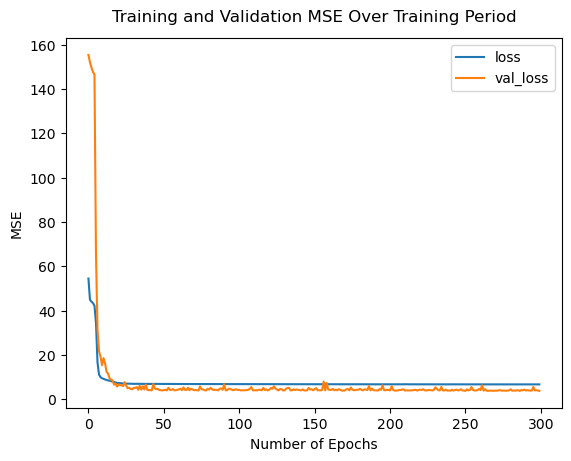

In [58]:
model_df = pd.DataFrame(history.history)
model_df[['loss', 'val_loss']].plot()
plt.xlabel("Number of Epochs")
plt.ylabel("MSE")
plt.title("Training and Validation MSE Over Training Period", pad=12);

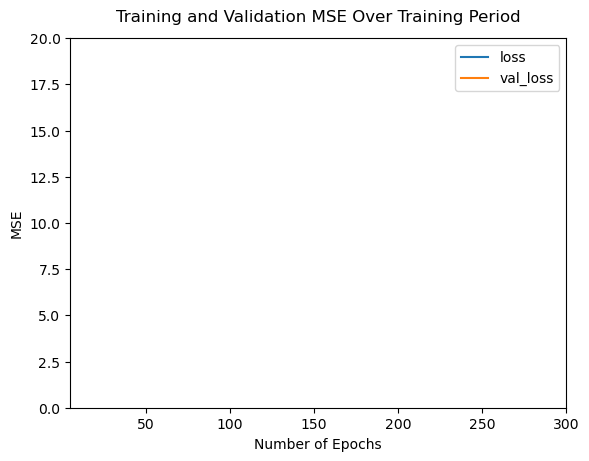

In [53]:
model_df = pd.DataFrame(history.history)
model_df[['loss', 'val_loss']].plot()
plt.xlabel("Number of Epochs")
plt.ylabel("MSE")
plt.axis([5, 300, 0, 20])
plt.title("Training and Validation MSE Over Training Period", pad=12);

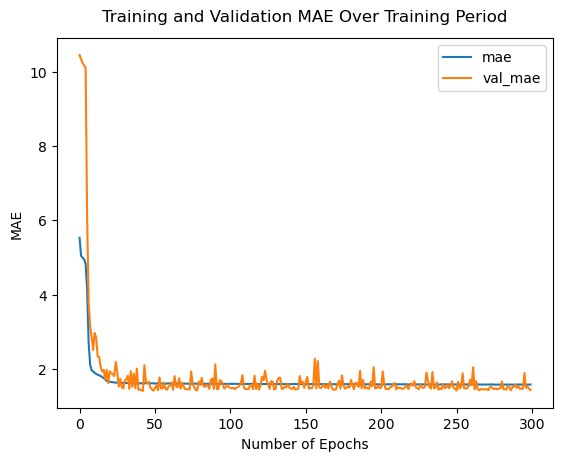

In [59]:
model_df = pd.DataFrame(history.history)
model_df[['mae', 'val_mae']].plot()
plt.xlabel("Number of Epochs")
plt.ylabel("MAE")
plt.title("Training and Validation MAE Over Training Period", pad=12);

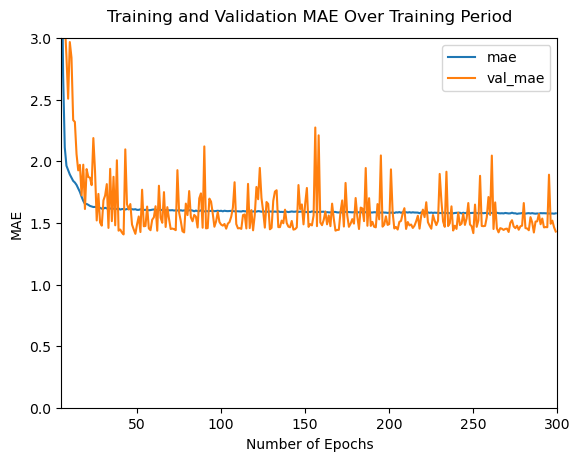

In [60]:
model_df = pd.DataFrame(history.history)
model_df[['mae', 'val_mae']].plot()
plt.xlabel("Number of Epochs")
plt.ylabel("MAE")
plt.axis([5, 300, 0, 3])
plt.title("Training and Validation MAE Over Training Period", pad=12);

### Theory vs Predict

r: 0.99182, st_er: 0.000747
y = 1.0341*x + -0.3633


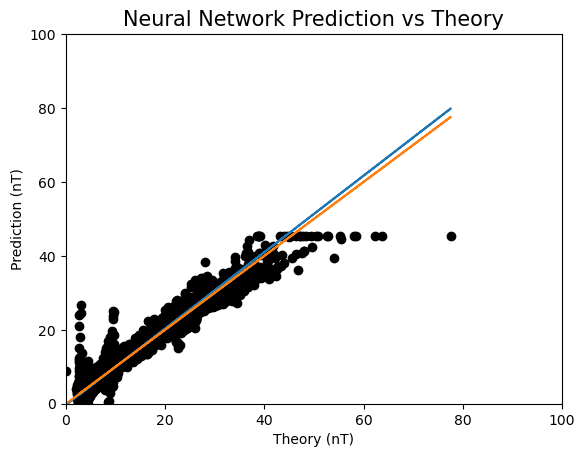

In [200]:
x = y_test.flatten()
y = test_pred.flatten()
m, b, r, p, st_er = stats.linregress(x,y) 

yfit = [b + m * xi for xi in x]
yisx = [0 + 1 * xi for xi in x]
plt.plot(x, yfit)
plt.plot(x, yisx)

plt.scatter(y_test, test_pred,  color='black')
plt.axis([0,100, 0, 100])
plt.xlabel("Theory (nT)")
plt.ylabel("Prediction (nT)")
plt.title("Neural Network Prediction vs Theory", fontsize=15)
# print(r, st_er)
print("r: {:.5f}, st_er: {:.6f}".format(r, st_er))
print("y = "+str(round(m,4))+"*x + "+str(round(b,4)))

### Erode Prediction
Create an image on 5.1_erode_image.ipynb

### Save model

In [324]:
file = model_path+'model_32to38_8layer5unit.sav'
pickle.dump(model, open(file, 'wb'))

INFO:tensorflow:Assets written to: ram:///var/folders/yd/vkjb_lqj2_30lnyhzhjqtg9w0000gp/T/tmp2762ezc7/assets


In [330]:
file = model_path+'model_32to38_8layer5unit_es.sav'
model = pickle.load(open(file, 'rb'))
result = model.evaluate(X_test, y_test)
print(result)

5632/5632 [==============================] - 5s 878us/step - loss: 12.5090 - accuracy: 0.8112
[12.50897216796875, 0.8112127184867859]


In [143]:
model.save(model_path)

INFO:tensorflow:Assets written to: /Users/chikakoolsen/opt/python/thesis/code/tdcs_thesis/models/assets


# Positive and Negative prediction

In [201]:
test_pred1 = model.predict(X1_pred1)

497/497 [==============================] - 0s 727us/step


In [202]:
y_pred = y1_pred1
test_pred = test_pred1

r: 0.96077, st_er: 0.002182
y = 0.9525*x + -1.0133


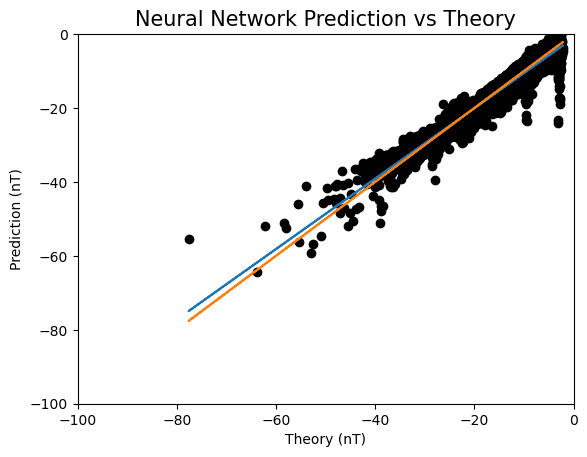

In [203]:
x = y_pred.flatten()
y = test_pred.flatten()
m, b, r, p, st_er = stats.linregress(x,y) 

yfit = [b + m * xi for xi in x]
yisx = [0 + 1 * xi for xi in x]
plt.plot(x, yfit)
plt.plot(x, yisx)

plt.scatter(y_pred, test_pred,  color='black')
plt.axis([-100,0, -100, 0])
plt.xlabel("Theory (nT)")
plt.ylabel("Prediction (nT)")
plt.title("Neural Network Prediction vs Theory", fontsize=15)
# print(r, st_er)
print("r: {:.5f}, st_er: {:.6f}".format(r, st_er))
print("y = "+str(round(m,4))+"*x + "+str(round(b,4)))

In [204]:
test_pred2 = model.predict(X1_pred2)

497/497 [==============================] - 0s 738us/step


In [205]:
y_pred = y1_pred2
test_pred = test_pred2

r: 0.97769, st_er: 0.001672
y = 0.9806*x + 0.8905


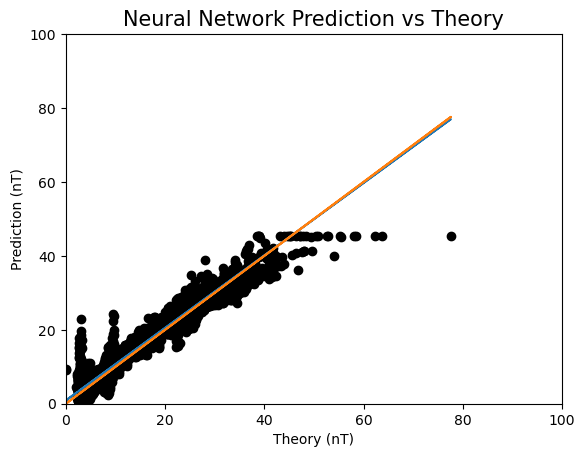

In [206]:
x = y_pred.flatten()
y = test_pred.flatten()
m, b, r, p, st_er = stats.linregress(x,y) 

yfit = [b + m * xi for xi in x]
yisx = [0 + 1 * xi for xi in x]
plt.plot(x, yfit)
plt.plot(x, yisx)

plt.scatter(y_pred, test_pred,  color='black')
plt.axis([0,100, 0, 100])
plt.xlabel("Theory (nT)")
plt.ylabel("Prediction (nT)")
plt.title("Neural Network Prediction vs Theory", fontsize=15)
# print(r, st_er)
print("r: {:.5f}, st_er: {:.6f}".format(r, st_er))
print("y = "+str(round(m,4))+"*x + "+str(round(b,4)))

## Output data

In [207]:
df1_test1['predict'] = test_pred1
df1_test2['predict'] = test_pred2

/var/folders/yd/vkjb_lqj2_30lnyhzhjqtg9w0000gp/T/ipykernel_1152/1985395262.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1_test1['predict'] = test_pred1
/var/folders/yd/vkjb_lqj2_30lnyhzhjqtg9w0000gp/T/ipykernel_1152/1985395262.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1_test2['predict'] = test_pred2


In [208]:
np.savetxt(img_path+"nn_optimized_32to38_neg.txt", df1_test1[['i', 'j', 'k', 'predict']], fmt="%i %i %i %s")
np.savetxt(img_path+"nn_optimized_32to38_pos.txt", df1_test2[['i', 'j', 'k', 'predict']], fmt="%i %i %i %s")

# Output data

### With zero

In [311]:
test_pred = model.predict(X1_pred)

5632/5632 [==============================] - 5s 799us/step


In [312]:
df_test['predict'] = test_pred

/var/folders/yd/vkjb_lqj2_30lnyhzhjqtg9w0000gp/T/ipykernel_60574/4195812830.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['predict'] = test_pred


In [313]:
df_test

,exp,mini_exp,i,j,k,mean0,mean1,mean2,mean3,mean4,theory,predict
901120,36,6,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,-0.090144
901121,36,6,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,-0.090144
901122,36,6,0,0,2,0.0,0.0,0.0,0.0,0.0,0.0,-0.090144
901123,36,6,0,0,3,0.0,0.0,0.0,0.0,0.0,0.0,-0.090144
901124,36,6,0,0,4,0.0,0.0,0.0,0.0,0.0,0.0,-0.090144
...,...,...,...,...,...,...,...,...,...,...,...,...
1081339,36,6,43,63,59,0.0,0.0,0.0,0.0,0.0,0.0,-0.090144
1081340,36,6,43,63,60,0.0,0.0,0.0,0.0,0.0,0.0,-0.090144
1081341,36,6,43,63,61,0.0,0.0,0.0,0.0,0.0,0.0,-0.090144
1081342,36,6,43,63,62,0.0,0.0,0.0,0.0,0.0,0.0,-0.090138


In [314]:
np.savetxt(img_path+"nn_32to38_8layer5unit_es.txt", df_test[['i', 'j', 'k', 'predict']], fmt="%i %i %i %s")

### Nonzero

In [277]:
test_pred = model.predict(X4_pred)

1063/1063 [==============================] - 1s 768us/step


In [278]:
df4_pred['predict'] = test_pred

/var/folders/yd/vkjb_lqj2_30lnyhzhjqtg9w0000gp/T/ipykernel_60574/2364276288.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4_pred['predict'] = test_pred


In [279]:
df4_pred

,exp,mini_exp,i,j,k,mean0,mean1,mean2,mean3,mean4,theory,predict
931880,36,6,7,32,40,-183.593781,-184.268631,-199.538742,-215.528793,-215.355865,4.988159,6.480443
931881,36,6,7,32,41,-383.761566,-383.066467,-395.916077,-417.522858,-420.110077,4.591202,6.699243
931882,36,6,7,32,42,-779.052185,-785.270813,-803.943787,-811.441101,-799.951233,4.237324,4.162361
931883,36,6,7,32,43,-1017.557312,-1026.294189,-1037.133667,-1050.012451,-1046.674072,3.918999,3.849931
931919,36,6,7,33,15,-1508.948120,-1513.032471,-1527.041992,-1536.478027,-1540.133301,3.371496,5.522695
...,...,...,...,...,...,...,...,...,...,...,...,...
1050968,36,6,36,37,24,-27.330389,-28.598026,-46.617607,-59.281792,-58.657875,7.175758,6.668752
1050979,36,6,36,37,35,171.250366,175.768433,151.715485,130.792816,139.797287,8.527348,15.113844
1050982,36,6,36,37,38,-96.352455,-94.962585,-115.256683,-131.555984,-127.650993,6.039019,9.632475
1050983,36,6,36,37,39,-235.110947,-235.878754,-253.580444,-268.104340,-266.388824,5.501382,6.715177


In [280]:
df_test['predict'] = 0.00

/var/folders/yd/vkjb_lqj2_30lnyhzhjqtg9w0000gp/T/ipykernel_60574/3257651465.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['predict'] = 0.00


In [281]:
df_out = df_test[['i', 'j', 'k', 'predict']]
df_pre = df4_pred[['i', 'j', 'k', 'predict']]

In [282]:
df_out.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 180224 entries, 901120 to 1081343
Data columns (total 4 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   i        180224 non-null  int64  
 1   j        180224 non-null  int64  
 2   k        180224 non-null  int64  
 3   predict  180224 non-null  float64
dtypes: float64(1), int64(3)
memory usage: 6.9 MB


In [284]:
for x in range(len(df_pre)):
    i = df_pre.iloc[x, :]['i'].astype(int)
    j = df_pre.iloc[x, :]['j'].astype(int)
    k = df_pre.iloc[x, :]['k'].astype(int)
    pred = df_pre.iloc[x, :]['predict']
    idx = df_out[(df_out['i']==i) & (df_out['j']==j) & (df_out['k']==k)].index
    df_out.loc[idx, 'predict']= pred

In [285]:
df_out[(df_out['i']==7) & (df_out['j']==32) & (df_out['k']==40)]

,i,j,k,predict
931880,7,32,40,6.480443


In [286]:
np.savetxt(img_path+"nn_nonzero_32to38_3layer5unit_300.txt", df_out[['i', 'j', 'k', 'predict']], fmt="%i %i %i %s")

,exp,mini_exp,i,j,k,mean0,mean1,mean2,mean3,mean4,theory
0,36,1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,36,1,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0
2,36,1,0,0,2,0.0,0.0,0.0,0.0,0.0,0.0
3,36,1,0,0,3,0.0,0.0,0.0,0.0,0.0,0.0
4,36,1,0,0,4,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
5046267,35,5,43,63,59,0.0,0.0,0.0,0.0,0.0,0.0
5046268,35,5,43,63,60,0.0,0.0,0.0,0.0,0.0,0.0
5046269,35,5,43,63,61,0.0,0.0,0.0,0.0,0.0,0.0
5046270,35,5,43,63,62,0.0,0.0,0.0,0.0,0.0,0.0


# AdaBoost 

In [ ]:
shape = (len(X_train[0]),)
def create_model(optimizer="adam"):
    model = keras.Sequential()
    model.add(Dense(8, activation='relu', input_shape=shape)) 
    model.add(Dense(8, activation='relu'))
    model.add(Dense(8, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=optimizer, loss='mse', metrics=["accuracy"])
    return model

In [ ]:
estimator = KerasRegressor(model=create_model, verbose=1)

In [ ]:
ada = AdaBoostRegressor(base_estimator=estimator, random_state=1)
# Default
# n_estimateors = 50, learning_rate = 1.0, loss = 'linear'

In [413]:
ada.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=[X_test, y_test])

Epoch 1/250
14080/14080 [==============================] - 16s 1ms/step - loss: 55.7692 - accuracy: 0.8112 - val_loss: 36.1058 - val_accuracy: 0.8112
Epoch 2/250
14080/14080 [==============================] - 14s 1ms/step - loss: 27.6695 - accuracy: 0.8113 - val_loss: 26.9031 - val_accuracy: 0.8112
Epoch 3/250
14080/14080 [==============================] - 14s 1ms/step - loss: 22.8049 - accuracy: 0.8113 - val_loss: 24.5247 - val_accuracy: 0.8114
Epoch 4/250
14080/14080 [==============================] - 15s 1ms/step - loss: 20.9147 - accuracy: 0.8114 - val_loss: 22.0434 - val_accuracy: 0.8114
Epoch 5/250
14080/14080 [==============================] - 14s 1ms/step - loss: 19.7160 - accuracy: 0.8114 - val_loss: 21.2492 - val_accuracy: 0.8112
Epoch 6/250
14080/14080 [==============================] - 14s 1ms/step - loss: 18.6955 - accuracy: 0.8114 - val_loss: 19.8251 - val_accuracy: 0.8112
Epoch 7/250
14080/14080 [==============================] - 14s 1ms/step - loss: 18.0138 - accuracy: 

14080/14080 [==============================] - 14s 1ms/step - loss: 10.5037 - accuracy: 0.8112 - val_loss: 10.6257 - val_accuracy: 0.8112
Epoch 110/250
14080/14080 [==============================] - 15s 1ms/step - loss: 10.4818 - accuracy: 0.8112 - val_loss: 10.5354 - val_accuracy: 0.8112
Epoch 111/250
14080/14080 [==============================] - 15s 1ms/step - loss: 10.4896 - accuracy: 0.8112 - val_loss: 11.1370 - val_accuracy: 0.8112
Epoch 112/250
14080/14080 [==============================] - 14s 1ms/step - loss: 10.4858 - accuracy: 0.8112 - val_loss: 10.6094 - val_accuracy: 0.8112
Epoch 113/250
14080/14080 [==============================] - 15s 1ms/step - loss: 10.4953 - accuracy: 0.8112 - val_loss: 10.9372 - val_accuracy: 0.8112
Epoch 114/250
14080/14080 [==============================] - 14s 1ms/step - loss: 10.5086 - accuracy: 0.8112 - val_loss: 10.4391 - val_accuracy: 0.8112
Epoch 115/250
14080/14080 [==============================] - 15s 1ms/step - loss: 10.4773 - accuracy: 

Epoch 163/250
14080/14080 [==============================] - 14s 1ms/step - loss: 10.1857 - accuracy: 0.8112 - val_loss: 10.1182 - val_accuracy: 0.8112
Epoch 164/250
14080/14080 [==============================] - 14s 1ms/step - loss: 10.1667 - accuracy: 0.8112 - val_loss: 10.2620 - val_accuracy: 0.8112
Epoch 165/250
14080/14080 [==============================] - 15s 1ms/step - loss: 10.1372 - accuracy: 0.8112 - val_loss: 10.0696 - val_accuracy: 0.8112
Epoch 166/250
14080/14080 [==============================] - 14s 1ms/step - loss: 10.1394 - accuracy: 0.8112 - val_loss: 10.1461 - val_accuracy: 0.8112
Epoch 167/250
14080/14080 [==============================] - 14s 1ms/step - loss: 10.1660 - accuracy: 0.8112 - val_loss: 10.3212 - val_accuracy: 0.8112
Epoch 168/250
14080/14080 [==============================] - 15s 1ms/step - loss: 10.1706 - accuracy: 0.8112 - val_loss: 10.1032 - val_accuracy: 0.8112
Epoch 169/250
14080/14080 [==============================] - 15s 1ms/step - loss: 10.186

Epoch 217/250
14080/14080 [==============================] - 13s 958us/step - loss: 10.0500 - accuracy: 0.8112 - val_loss: 10.0699 - val_accuracy: 0.8112
Epoch 218/250
14080/14080 [==============================] - 14s 964us/step - loss: 10.0393 - accuracy: 0.8112 - val_loss: 10.0689 - val_accuracy: 0.8112
Epoch 219/250
14080/14080 [==============================] - 14s 965us/step - loss: 10.0445 - accuracy: 0.8112 - val_loss: 10.1081 - val_accuracy: 0.8112
Epoch 220/250
14080/14080 [==============================] - 13s 959us/step - loss: 9.9857 - accuracy: 0.8112 - val_loss: 10.0993 - val_accuracy: 0.8112
Epoch 221/250
14080/14080 [==============================] - 14s 963us/step - loss: 10.0068 - accuracy: 0.8112 - val_loss: 10.1473 - val_accuracy: 0.8112
Epoch 222/250
14080/14080 [==============================] - 14s 969us/step - loss: 9.9952 - accuracy: 0.8112 - val_loss: 10.2371 - val_accuracy: 0.8112
Epoch 223/250
14080/14080 [==============================] - 14s 972us/step - 

In [414]:
train_pred = ada.predict(X_train)
print(mse(train_pred, y_train))
print(mape(train_pred, y_train))
test_pred = ada.predict(X_test)
print(mse(test_pred, y_test))
print(mape(test_pred, y_test))

28160/28160 [==============================] - 19s 657us/step
10.423523569637522
0.8851849821396331
5632/5632 [==============================] - 4s 675us/step
10.430708006166368
0.901582623329384


In [415]:
ada.score(X_test, y_test)

5632/5632 [==============================] - 5s 914us/step - loss: 10.4307 - accuracy: 0.8112


[10.43068790435791, 0.8112127184867859]

In [416]:
np.corrcoef(test_pred.flatten(), y_test)

array([[1.        , 0.89977946],
       [0.89977946, 1.        ]])

In [415]:
ada.evaluate(X_test, y_test)

5632/5632 [==============================] - 5s 914us/step - loss: 10.4307 - accuracy: 0.8112


[10.43068790435791, 0.8112127184867859]

In [416]:
np.corrcoef(test_pred.flatten(), y_test)

array([[1.        , 0.89977946],
       [0.89977946, 1.        ]])

In [417]:
ada.summary()

Model: "sequential_366"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1821 (Dense)          (None, 8)                 48        
                                                                 
 dense_1822 (Dense)          (None, 8)                 72        
                                                                 
 dense_1823 (Dense)          (None, 8)                 72        
                                                                 
 dense_1824 (Dense)          (None, 1)                 9         
                                                                 
Total params: 201
Trainable params: 201
Non-trainable params: 0
_________________________________________________________________


In [418]:
history.history

{'loss': [55.769195556640625,
  27.669540405273438,
  22.804916381835938,
  20.91471290588379,
  19.715959548950195,
  18.695512771606445,
  18.013818740844727,
  17.217145919799805,
  16.686649322509766,
  16.031967163085938,
  15.589828491210938,
  15.294617652893066,
  15.02783489227295,
  14.763344764709473,
  14.597732543945312,
  14.323282241821289,
  14.098736763000488,
  13.907633781433105,
  13.798909187316895,
  13.676118850708008,
  13.636869430541992,
  13.545592308044434,
  13.4127779006958,
  13.43098258972168,
  13.341645240783691,
  13.244627952575684,
  13.187355995178223,
  13.081528663635254,
  13.008316993713379,
  12.942736625671387,
  12.819374084472656,
  12.7421293258667,
  12.636713027954102,
  12.594244003295898,
  12.439692497253418,
  12.313486099243164,
  12.158864974975586,
  12.000682830810547,
  11.837697982788086,
  11.773954391479492,
  11.691145896911621,
  11.651338577270508,
  11.598064422607422,
  11.588747024536133,
  11.637275695800781,
  11.5778

## Plot

### Loss function (MSE)

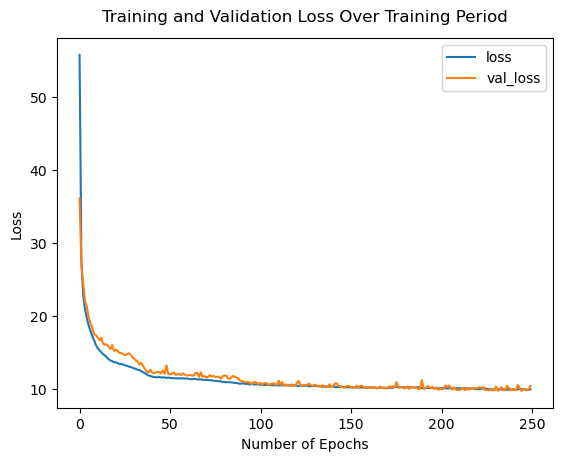

In [419]:
model_df = pd.DataFrame(history.history)
model_df[['loss', 'val_loss']].plot()
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss Over Training Period", pad=12);

### Accuracy

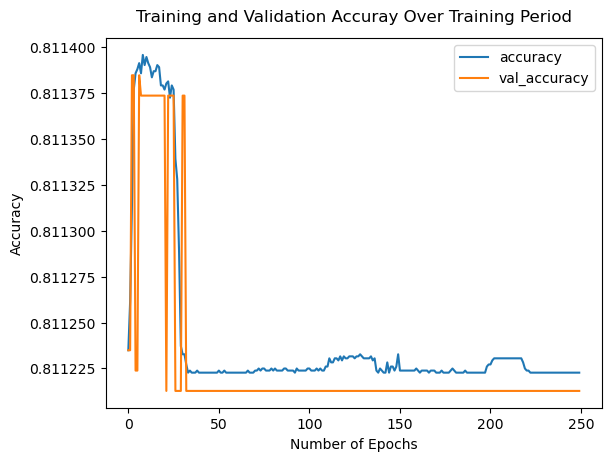

In [420]:
model_df[['accuracy', 'val_accuracy']].plot()
plt.xlabel("Number of Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuray Over Training Period", pad=12);

### Theory vs Predict

r: 0.89978%, st_er: 0.000909%
y = 0.7959*x + 0.3686


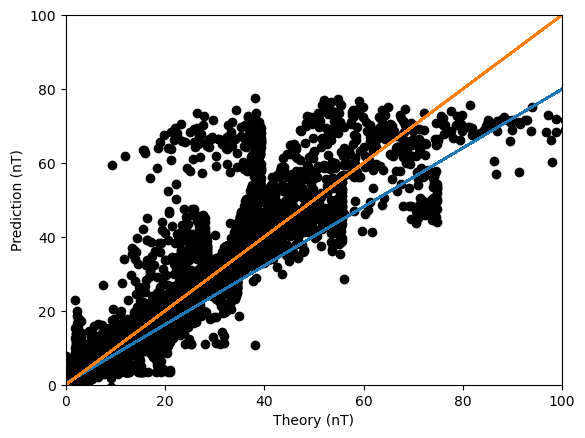

In [421]:
x = y_test.flatten()
y = test_pred.flatten()
m, b, r, p, st_er = stats.linregress(x,y) 

yfit = [b + m * xi for xi in x]
yisx = [0 + 1 * xi for xi in x]
plt.plot(x, yfit)
plt.plot(x, yisx)

plt.scatter(y_test, test_pred,  color='black')
plt.axis([0,100, 0, 100])
plt.xlabel("Theory (nT)")
plt.ylabel("Prediction (nT)")
# print(r, st_er)
print("r: {:.5f}%, st_er: {:.6f}%".format(r, st_er))
print("y = "+str(round(m,4))+"*x + "+str(round(b,4)))

## 7 Layer & 7 Units

In [424]:
model2 = keras.Sequential()
model2.add(Dense(7, activation='relu', input_shape=shape)) 
model2.add(Dense(7, activation='relu'))
model2.add(Dense(7, activation='relu'))
model2.add(Dense(7, activation='relu'))
model2.add(Dense(7, activation='relu'))
model2.add(Dense(7, activation='relu'))
model2.add(Dense(1, activation='linear'))
model2.compile(optimizer='adamax', loss='mse', metrics=["accuracy"])

In [425]:
history2 = model2.fit(X_train, y_train, epochs=250, batch_size=64, validation_data=[X_test, y_test])


Epoch 1/250
14080/14080 [==============================] - 16s 1ms/step - loss: 1046.3302 - accuracy: 0.6335 - val_loss: 50.4146 - val_accuracy: 5.5487e-06
Epoch 2/250
14080/14080 [==============================] - 15s 1ms/step - loss: 37.4836 - accuracy: 1.9975e-05 - val_loss: 36.4136 - val_accuracy: 1.6646e-05
Epoch 3/250
14080/14080 [==============================] - 15s 1ms/step - loss: 30.0406 - accuracy: 0.4021 - val_loss: 30.3933 - val_accuracy: 0.8114
Epoch 4/250
14080/14080 [==============================] - 15s 1ms/step - loss: 23.5442 - accuracy: 0.8114 - val_loss: 26.1573 - val_accuracy: 0.8114
Epoch 5/250
14080/14080 [==============================] - 15s 1ms/step - loss: 21.3196 - accuracy: 0.8114 - val_loss: 24.9365 - val_accuracy: 0.8114
Epoch 6/250
14080/14080 [==============================] - 15s 1ms/step - loss: 19.2122 - accuracy: 0.8114 - val_loss: 23.3855 - val_accuracy: 0.8114
Epoch 7/250
14080/14080 [==============================] - 15s 1ms/step - loss: 17.555

14080/14080 [==============================] - 15s 1ms/step - loss: 9.8826 - accuracy: 0.8113 - val_loss: 10.1667 - val_accuracy: 0.8114
Epoch 110/250
14080/14080 [==============================] - 15s 1ms/step - loss: 9.8702 - accuracy: 0.8113 - val_loss: 10.2380 - val_accuracy: 0.8114
Epoch 111/250
14080/14080 [==============================] - 15s 1ms/step - loss: 9.9415 - accuracy: 0.8113 - val_loss: 10.3431 - val_accuracy: 0.8112
Epoch 112/250
14080/14080 [==============================] - 15s 1ms/step - loss: 9.8992 - accuracy: 0.8113 - val_loss: 9.8778 - val_accuracy: 0.8112
Epoch 113/250
14080/14080 [==============================] - 15s 1ms/step - loss: 9.8730 - accuracy: 0.8113 - val_loss: 9.9043 - val_accuracy: 0.8112
Epoch 114/250
14080/14080 [==============================] - 16s 1ms/step - loss: 9.8435 - accuracy: 0.8113 - val_loss: 9.8660 - val_accuracy: 0.8114
Epoch 115/250
14080/14080 [==============================] - 16s 1ms/step - loss: 9.7887 - accuracy: 0.8114 - v

14080/14080 [==============================] - 15s 1ms/step - loss: 9.3218 - accuracy: 0.8112 - val_loss: 9.7826 - val_accuracy: 0.8112
Epoch 218/250
14080/14080 [==============================] - 15s 1ms/step - loss: 9.3371 - accuracy: 0.8112 - val_loss: 9.5755 - val_accuracy: 0.8112
Epoch 219/250
14080/14080 [==============================] - 15s 1ms/step - loss: 9.3799 - accuracy: 0.8112 - val_loss: 9.5253 - val_accuracy: 0.8112
Epoch 220/250
14080/14080 [==============================] - 15s 1ms/step - loss: 9.3626 - accuracy: 0.8112 - val_loss: 9.8951 - val_accuracy: 0.8114
Epoch 221/250
14080/14080 [==============================] - 15s 1ms/step - loss: 9.3454 - accuracy: 0.8112 - val_loss: 9.8686 - val_accuracy: 0.8112
Epoch 222/250
14080/14080 [==============================] - 15s 1ms/step - loss: 9.3895 - accuracy: 0.8112 - val_loss: 9.7116 - val_accuracy: 0.8112
Epoch 223/250
14080/14080 [==============================] - 15s 1ms/step - loss: 9.3628 - accuracy: 0.8112 - val_

In [426]:
train_pred2 = model2.predict(X_train)
print(mse(train_pred2, y_train))
print(mape(train_pred2, y_train))
test_pred2 = model2.predict(X_test)
print(mse(test_pred2, y_test))
print(mape(test_pred2, y_test))

28160/28160 [==============================] - 19s 688us/step
9.358524265784618
1.0455638406507
5632/5632 [==============================] - 4s 684us/step
9.481934435458676
1.0716621402362292


In [427]:
model2.evaluate(X_test, y_test)

5632/5632 [==============================] - 5s 866us/step - loss: 9.4819 - accuracy: 0.8114


[9.481929779052734, 0.8113680481910706]

In [428]:
np.corrcoef(test_pred2.flatten(), y_test)

array([[1.        , 0.90958548],
       [0.90958548, 1.        ]])

In [429]:
model2.summary()

Model: "sequential_367"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1825 (Dense)          (None, 7)                 42        
                                                                 
 dense_1826 (Dense)          (None, 7)                 56        
                                                                 
 dense_1827 (Dense)          (None, 7)                 56        
                                                                 
 dense_1828 (Dense)          (None, 7)                 56        
                                                                 
 dense_1829 (Dense)          (None, 7)                 56        
                                                                 
 dense_1830 (Dense)          (None, 7)                 56        
                                                                 
 dense_1831 (Dense)          (None, 1)              

In [430]:
history2.history

{'loss': [1046.3302001953125,
  37.483638763427734,
  30.040592193603516,
  23.54417610168457,
  21.3195743560791,
  19.2121524810791,
  17.55561065673828,
  16.830585479736328,
  16.048370361328125,
  15.718413352966309,
  15.15301513671875,
  15.153763771057129,
  14.874509811401367,
  14.767585754394531,
  14.562233924865723,
  14.444123268127441,
  14.237424850463867,
  14.06949234008789,
  14.089621543884277,
  13.76307487487793,
  13.555024147033691,
  13.057135581970215,
  12.235762596130371,
  11.770852088928223,
  11.562379837036133,
  11.483296394348145,
  11.319560050964355,
  11.235815048217773,
  11.137860298156738,
  11.024914741516113,
  11.009836196899414,
  10.948224067687988,
  10.913586616516113,
  10.88810920715332,
  10.812581062316895,
  10.799149513244629,
  10.786332130432129,
  10.751015663146973,
  10.730430603027344,
  10.720365524291992,
  10.669264793395996,
  10.594901084899902,
  10.573263168334961,
  10.512391090393066,
  10.481739044189453,
  10.4234876

## Plot

### Loss function (MSE)

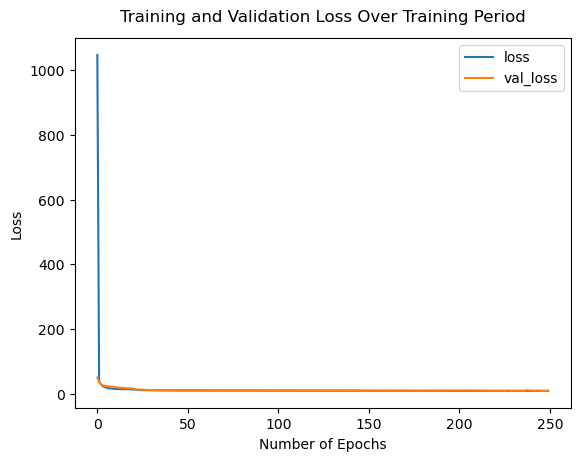

In [431]:
model_df = pd.DataFrame(history2.history)
model_df[['loss', 'val_loss']].plot()
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss Over Training Period", pad=12);

### Accuracy

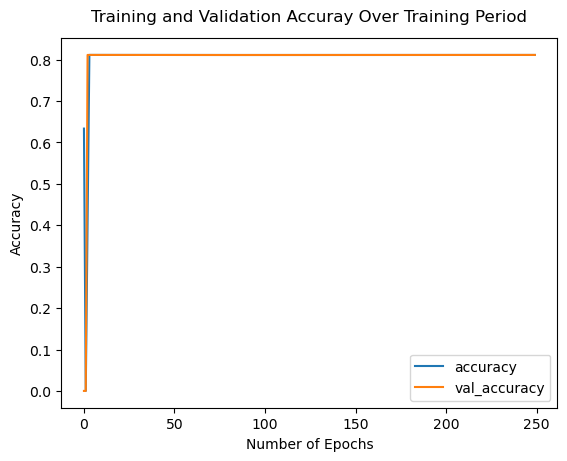

In [432]:
model_df[['accuracy', 'val_accuracy']].plot()
plt.xlabel("Number of Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuray Over Training Period", pad=12);

### Theory vs Predict

r: 0.90959%, st_er: 0.000871%
y = 0.8097*x + 0.2675


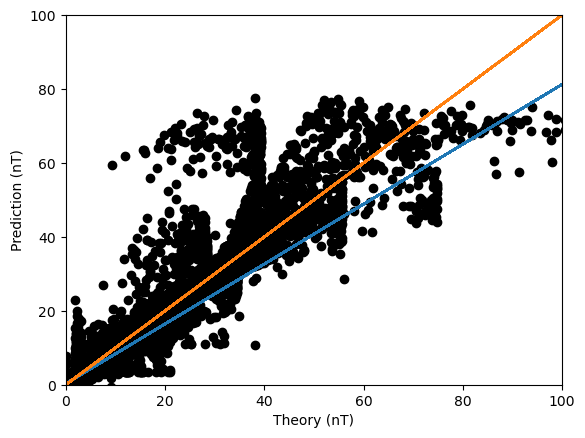

In [433]:
x = y_test.flatten()
y = test_pred2.flatten()
m, b, r, p, st_er = stats.linregress(x,y) 

yfit = [b + m * xi for xi in x]
yisx = [0 + 1 * xi for xi in x]
plt.plot(x, yfit)
plt.plot(x, yisx)

plt.scatter(y_test, test_pred,  color='black')
plt.axis([0,100, 0, 100])
plt.xlabel("Theory (nT)")
plt.ylabel("Prediction (nT)")
# print(r, st_er)
print("r: {:.5f}%, st_er: {:.6f}%".format(r, st_er))
print("y = "+str(round(m,4))+"*x + "+str(round(b,4)))

# Output data

In [434]:
df_test['predict2'] = test_pred2

/var/folders/yd/vkjb_lqj2_30lnyhzhjqtg9w0000gp/T/ipykernel_34777/3425069941.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['predict2'] = test_pred2


In [435]:
np.savetxt(save_path+"nn2.txt", df_test[['i', 'j', 'k', 'predict2']], fmt="%i %i %i %s")

# Play Ground

# Old Code

In [157]:
model2 = keras.Sequential()

model2.add(Dense(1, activation='relu', input_shape=(5,)))
model2.add(Dense(1, activation="linear"))

# model2.add(Dense(5, activation='relu', input_shape=(5,)))
# model2.add(Dense(3, activation='relu'))
# model2.add(Dense(1, activation="linear"))
# # Coef 0.7665, MSE 23.21, MAPE 0.9155, Accuracy 0.8112

# model2.add(Dense(20, activation='relu', input_shape=(5,)))
# model2.add(Dense(10, activation='relu'))
# model2.add(Dense(5, activation='relu'))
# model2.add(Dense(1, activation="linear"))
# # Coef 0.7815, MSE 22.56, MAPE 0.9038, Accuracy 0.8112 

# model2.add(Dense(10, activation='relu', input_shape=(5,)))
# model2.add(Dense(10, activation='relu'))
# model2.add(Dense(10, activation='relu'))
# model2.add(Dense(1, activation="linear"))
# # Coef 0.7894, MSE 21.13, MAPE 0.8703, Accuracy 0.8112 => Best

# model2.add(Dense(10, activation='relu', input_shape=(5,)))
# model2.add(Dense(10, activation='relu'))
# model2.add(Dense(1, activation="linear"))
# # Coef 0.7786, MSE 22.19, MAPE 0.8877, Accuracy 0.8112

# model2.add(Dense(20, activation='relu', input_shape=[len(X_train[0])]))
# model2.add(Dense(1))
# # Coef 0.71174903, MSE 28.1933, MAPE 0.9055, Accuracy 0.8114


### BAD ###
# model2.add(Dense(100, activation='relu', input_shape=(5,)))
# model2.add(Dense(50, activation='relu'))
# model2.add(Dense(10, activation='relu'))
# model2.add(Dense(1, activation="linear"))
# # Coef 0.5541, MSE 38.85, MAPE 1.134, Accuracy 0.8112 => Worse

# model2.add(Dense(10, activation='relu', input_shape=(5,)))
# model2.add(Dense(5, activation='relu'))
# model2.add(Dense(3, activation='relu'))
# model2.add(Dense(1, activation="linear"))
# # Coef None, MSE 56.06, MAPE 1.656, Accuracy 5.5487e-06 => Worse

# model2.add(Dense(10, activation='relu', input_shape=(5,)))
# model2.add(Dense(5, activation='relu'))
# model2.add(Dense(1, activation="linear"))
# # Coef 0.7285, MSE 26.74, MAPE 1.5369, Accuracy 0.8114 => Bad

# model2.add(Dense(5, activation='relu', input_shape=[len(X_train[0])]))
# model2.add(Dense(5, activation='relu'))
# model2.add(Dense(5, activation='relu'))
# model2.add(Dense(1))
# # Coef 0.7833, MSE 21.68 MAPE 1.197, Accuracy 0.8112 

model2.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
history2 = model2.fit(X_train, y_train, epochs=100, validation_data=[X_test, y_test], callbacks=myCallbacks)


Epoch 1/100
 9015/28160 [========>.....................] - ETA: 16s - loss: 56.3059 - accuracy: 0.1151

KeyboardInterrupt: 

In [60]:
train_pred2 = model2.predict(X_train)
print(mse(train_pred2, y_train))
print(mape(train_pred2, y_train))
test_pred2 = model2.predict(X_test)
print(mse(test_pred2, y_test))
print(mape(test_pred2, y_test))

28160/28160 [==============================] - 20s 697us/step
11.214849205358673
0.8891644970950675
5632/5632 [==============================] - 4s 680us/step
11.220028543186952
0.9035458755417451


In [106]:
arr = np.corrcoef(test_pred2.flatten(), y_test)

In [108]:
arr

array([[1.        , 0.89192917],
       [0.89192917, 1.        ]])

In [62]:
ev = model2.evaluate(X_test, y_test)

5632/5632 [==============================] - 5s 834us/step - loss: 11.2200 - accuracy: 0.8112


In [72]:
ev[1]

0.8112127184867859

In [364]:
model2.summary()

Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_127 (Dense)           (None, 10)                60        
                                                                 
 dense_128 (Dense)           (None, 10)                110       
                                                                 
 dense_129 (Dense)           (None, 10)                110       
                                                                 
 dense_130 (Dense)           (None, 1)                 11        
                                                                 
Total params: 291
Trainable params: 291
Non-trainable params: 0
_________________________________________________________________


In [365]:
history2.history

{'loss': [70.53611755371094,
  23.023168563842773,
  22.059120178222656,
  21.485179901123047,
  21.023574829101562,
  21.458295822143555,
  20.747465133666992,
  20.87920379638672,
  20.674291610717773,
  20.560890197753906,
  20.375850677490234],
 'accuracy': [0.8095003962516785,
  0.8013139367103577,
  0.7952991724014282,
  0.7956908941268921,
  0.7943170666694641,
  0.7915316224098206,
  0.8020529747009277,
  0.7983931303024292,
  0.7977461218833923,
  0.8100963234901428,
  0.8075761198997498],
 'val_loss': [31.34503936767578,
  23.02967071533203,
  23.319063186645508,
  22.255678176879883,
  22.685558319091797,
  22.644386291503906,
  22.474851608276367,
  22.245553970336914,
  23.826812744140625,
  23.19800567626953,
  21.347797393798828],
 'val_accuracy': [0.8113847374916077,
  0.8113847374916077,
  0.8113791942596436,
  0.8112071752548218,
  0.8112071752548218,
  0.8112127184867859,
  0.8112071752548218,
  0.8112127184867859,
  0.8112071752548218,
  0.8112127184867859,
  0.8112

## Plot

### Loss function (MSE)

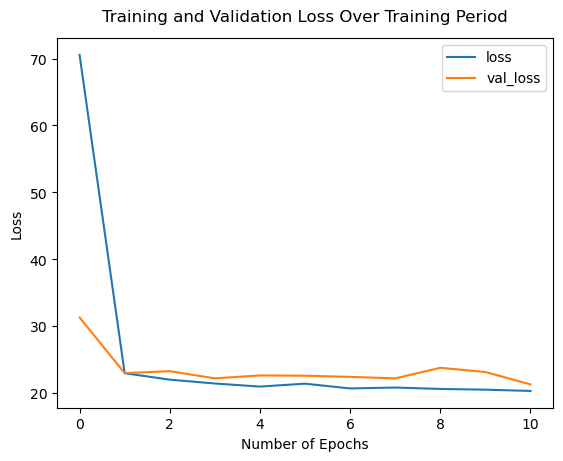

In [391]:
model_df = pd.DataFrame(history2.history)
model_df[['loss', 'val_loss']].plot()
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss Over Training Period", pad=12);

### Accuracy

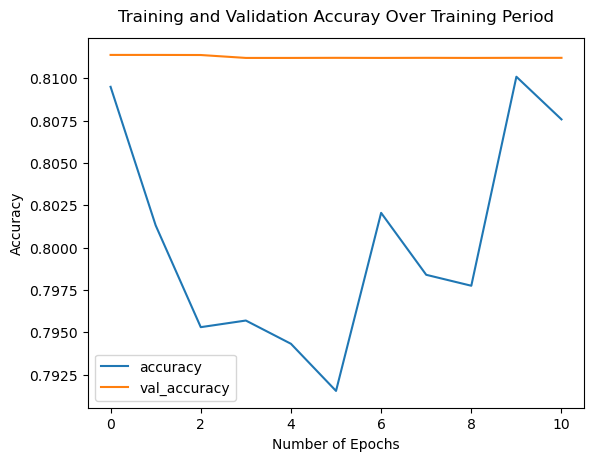

In [392]:
model_df[['accuracy', 'val_accuracy']].plot()
plt.xlabel("Number of Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuray Over Training Period", pad=12);

### Theory vs Predict

r: 0.78695%, st_er: 0.001142%
y = 0.6185*x + 0.7269


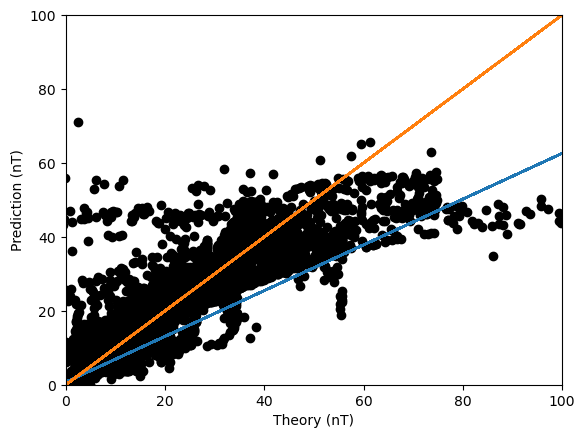

In [393]:
x = y_test.flatten()
y = test_pred2.flatten()
m, b, r, p, st_er = stats.linregress(x,y) 

yfit = [b + m * xi for xi in x]
yisx = [0 + 1 * xi for xi in x]
plt.plot(x, yfit)
plt.plot(x, yisx)

plt.scatter(y_test, test_pred2,  color='black')
plt.axis([0,100, 0, 100])
plt.xlabel("Theory (nT)")
plt.ylabel("Prediction (nT)")
# print(r, st_er)
print("r: {:.5f}%, st_er: {:.6f}%".format(r, st_er))
print("y = "+str(round(m,4))+"*x + "+str(round(b,4)))

# Output data

In [369]:
df_test['predict'] = test_pred2

/var/folders/yd/vkjb_lqj2_30lnyhzhjqtg9w0000gp/T/ipykernel_82638/3293406254.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['predict'] = test_pred2


In [370]:
np.savetxt(save_path+"nn.txt", df_test[['i', 'j', 'k', 'predict']], fmt="%i %i %i %s")

# MLPRegressor

In [63]:
from sklearn.neural_network import MLPRegressor

regr = MLPRegressor(random_state=1, hidden_layer_sizes = (10,10,10), max_iter=500).fit(X_train, y_train)

In [64]:
regr.score(X_test, y_test)

0.7235479854252406

In [65]:
y_predict = regr.predict(X_test)

In [66]:
np.corrcoef(y_predict,y_test)

array([[1.        , 0.85849349],
       [0.85849349, 1.        ]])

# Retrieve Heatmap

In [54]:
NaN = np.nan
corr = [[0.087, 0.11, 0.13, 0.12, 0.13, 0.16, 0.14, 0.11, 0.12, 0.15],
       [0.37, 0.8, 0.79, 0.8, 0.69, 0.78, 0.60, 0.82, 0.8, 0.79],
       [0.36, 0.86, 0.89, 0.85, 0.85, 0.87, 0.84, 0.87, 0.89, 0.85],
       [NaN, NaN, NaN, 0.88, 0.86, 0.89, 0.85, 0.9, 0.85, 0.88],
       [NaN, NaN, 0.9, 0.88, 0.9, 0.87, 0.84, 0.89, 0.86, 0.9],
       [NaN, NaN, 0.73, 0.89, 0.89, 0.89, 0.9, 0.89, 0.9, 0.89],
       [NaN, NaN, 0.85, 0.9, 0.88, 0.89, 0.9, 0.9, 0.9, 0.88],
       [NaN, 0.86, NaN, 0.88, 0.81, 0.9, 0.9, 0.89, 0.89, 0.87],
       [NaN, NaN, NaN, 0.9, 0.89, 0.89, 0.9, 0.89, 0.9, 0.9],
       [NaN, NaN, NaN, 0.87, 0.9, 0.88, 0.9, 0.89, 0.9, 0.9]
       ]

In [55]:
err = [[0.00084, 0.00075, 0.00088, 0.00073, 0.00086, 0.00089, 0.001, 0.00064, 0.0005, 0.0011],
       [0.00072, 0.001, 0.0011, 0.00091, 0.0014, 0.0012, 0.0015, 0.001, 0.00094, 0.00086],
       [0.0007, 0.00093, 0.00096, 0.00099, 0.00098, 0.00093, 0.0011, 0.00092, 0.00096, 0.00094],
       [0, 0, 0, 0.00093, 0.0012, 0.00091, 0.00099, 0.00086, 0.001, 0.0009],
       [0, 0, 0.00096, 0.00094, 0.00093, 0.0011, 0.0011, 0.00092, 0.0012, 0.00086],
       [0, 0, 0.0011, 0.00091, 0.00096, 0.0009, 0.00089, 0.0009, 0.00089, 0.00091],
       [0, 0, 0.0012, 0.00095, 0.00087, 0.0011, 0.00087, 0.00086, 0.00085, 0.00093],
       [0, 0.00087, 0, 0.0011, 0.0016, 0.00092, 0.00087, 0.0011, 0.00088, 0.0012],
       [0, 0, 0, 0.00094, 0.00085, 0.0009, 0.00087, 0.00087, 0.00096, 0.001],
       [0, 0, 0, 0.00098, 0.00089, 0.0011, 0.00097, 0.00096, 0.00094, 0.00096],
      ]

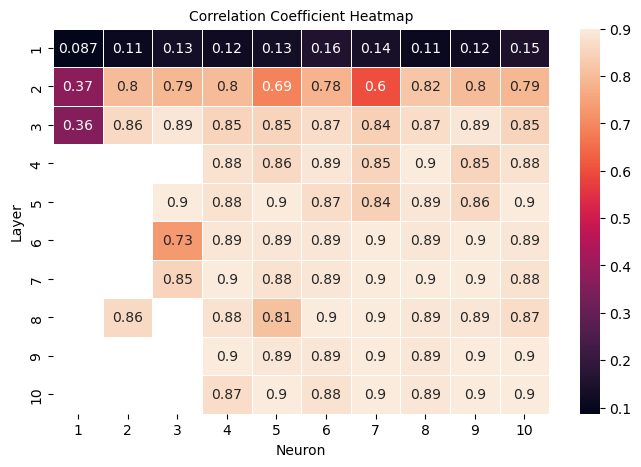

In [56]:
import seaborn as sns

xlabels = range(1, 11)
ylabels = range(1, 11)
fig, ax = plt.subplots(figsize=(8,5))
sns.heatmap(corr, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True)
ax.set_title('Correlation Coefficient Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

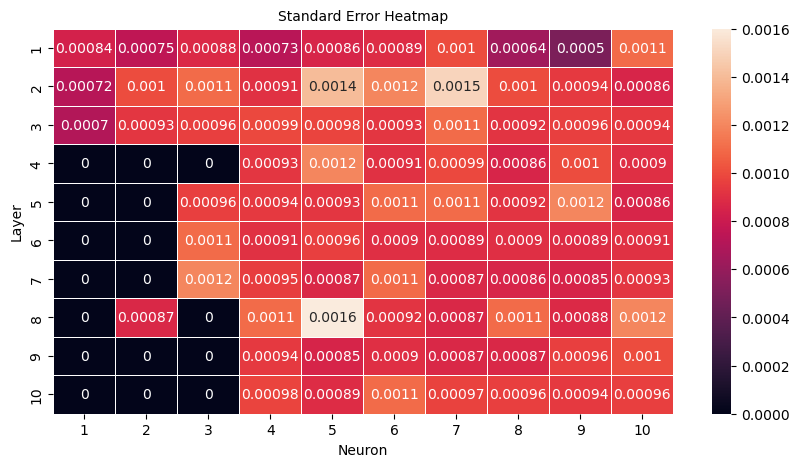

In [57]:
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(err, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True)
ax.set_title('Standard Error Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

In [93]:
div = np.divide(corr, err)
div = np.nan_to_num(div)
div

array([[ 103.57142857,  146.66666667,  147.72727273,  164.38356164,
         151.1627907 ,  179.7752809 ,  140.        ,  171.875     ,
         240.        ,  136.36363636],
       [ 513.88888889,  800.        ,  718.18181818,  879.12087912,
         492.85714286,  650.        ,  400.        ,  820.        ,
         851.06382979,  918.60465116],
       [ 514.28571429,  924.7311828 ,  927.08333333,  858.58585859,
         867.34693878,  935.48387097,  763.63636364,  945.65217391,
         927.08333333,  904.25531915],
       [   0.        ,    0.        ,    0.        ,  946.23655914,
         716.66666667,  978.02197802,  858.58585859, 1046.51162791,
         850.        ,  977.77777778],
       [   0.        ,    0.        ,  937.5       ,  936.17021277,
         967.74193548,  790.90909091,  763.63636364,  967.39130435,
         716.66666667, 1046.51162791],
       [   0.        ,    0.        ,  663.63636364,  978.02197802,
         927.08333333,  988.88888889, 1011.23595506,  988

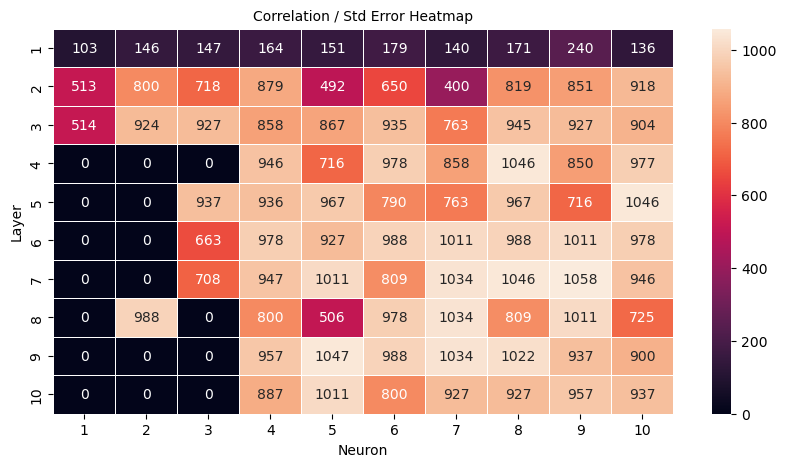

In [94]:
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(div.astype(int), linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, fmt='d')
ax.set_title('Correlation / Std Error Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

In [61]:
loss = [[58, 56, 57, 56, 57, 56, 59, 55, 54, 59], 
        [48, 20, 21, 21, 30, 21, 30, 18, 20, 23], 
        [48, 15, 11, 15, 15, 13, 16, 14, 12, 16], 
        [55, 55, 55, 12, 15, 12, 15, 10, 15, 12], 
        [55, 55, 11, 13, 10, 14, 16, 12, 16, 11], 
        [55, 55, 26, 11, 11, 11, 10, 11, 11, 11], 
        [55, 55, 17, 11, 12, 12, 10, 10, 11, 12], 
        [55, 15, 55, 14, 25, 10, 11, 12, 11, 14], 
        [55, 55, 55, 11, 12, 12, 11, 11, 10, 11], 
        [55, 55, 55, 13, 11, 13, 10, 11, 10, 11]
       ]

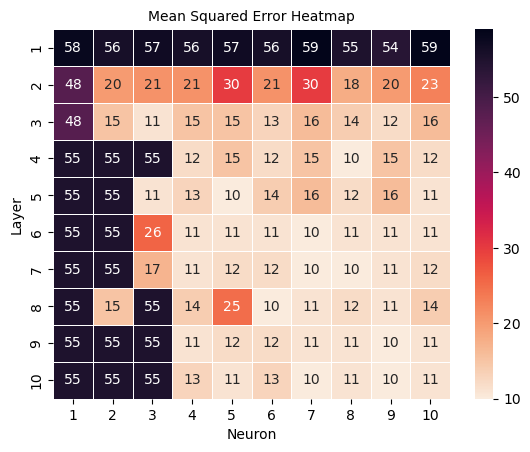

In [70]:
#fig, ax = plt.subplots(figsize=(10,5))
ax = sns.heatmap(loss, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, cmap='rocket_r')
ax.set_title('Mean Squared Error Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

In [89]:
div2 = np.divide(div.astype(int), loss)
div2

array([[  1.77586207,   2.60714286,   2.57894737,   2.92857143,
          2.64912281,   3.19642857,   2.37288136,   3.10909091,
          4.44444444,   2.30508475],
       [ 10.6875    ,  40.        ,  34.19047619,  41.85714286,
         16.4       ,  30.95238095,  13.33333333,  45.5       ,
         42.55      ,  39.91304348],
       [ 10.70833333,  61.6       ,  84.27272727,  57.2       ,
         57.8       ,  71.92307692,  47.6875    ,  67.5       ,
         77.25      ,  56.5       ],
       [  0.        ,   0.        ,   0.        ,  78.83333333,
         47.73333333,  81.5       ,  57.2       , 104.6       ,
         56.66666667,  81.41666667],
       [  0.        ,   0.        ,  85.18181818,  72.        ,
         96.7       ,  56.42857143,  47.6875    ,  80.58333333,
         44.75      ,  95.09090909],
       [  0.        ,   0.        ,  25.5       ,  88.90909091,
         84.27272727,  89.81818182, 101.1       ,  89.81818182,
         91.90909091,  88.90909091],
       [  

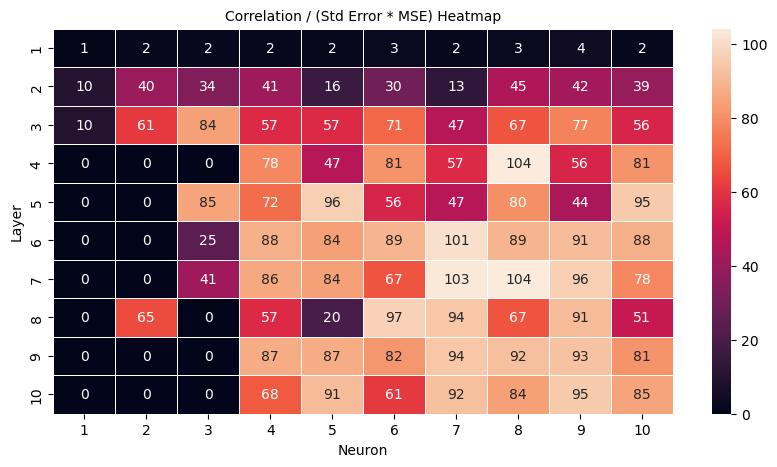

In [96]:
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(div2.astype(int), linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, fmt='g')
ax.set_title('Correlation / (Std Error * MSE) Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

In [31]:
xlabels = range(1, 11)
ylabels = range(1, 11)

In [23]:
NaN = np.nan
corr = [[0.42, 0.41, 0.4, 0.41, 0.41, 0.42, 0.41, 0.42, 0.42, 0.42],
       [0.42, 0.72, 0.082, 0.72, 0.46, 0.44, 0.5, 0.4, 0.57, 0.6],
       [NaN, 0.66, 0.68, 0.65, 0.79, 0.8, 0.61, 0.37, 0.22, 0.76],
       [0.71, 0.69, 0.79, 0.49, 0.61, 0.73, 0.37, 0.75, 0.66, 0.7],
       [NaN, NaN, NaN, 0.34, 0.78, 0.64, 0.8, 0.81, 0.77, 0.74],
       [NaN, NaN, NaN, 0.74, 0.7, 0.69, 0.65, 0.46, 0.73, 0.59],
       [NaN, NaN, 0.65, 0.24, 0.71, 0.47, 0.74, 0.69, 0.52, 0.77],
       [NaN, NaN, 0.81, 0.79, NaN, 0.62, 0.58, 0.56, 0.61, 0.75],
       [NaN, NaN, NaN, NaN, 0.53, 0.65, 0.64, 0.65, 0.66, 0.79],
       [NaN, NaN, NaN, 0.79, 0.78, 0.7, NaN, 0.69, 0.54, 0.81]
       ]

In [24]:
err = [[0.0019, 0.0014, 0.0013, 0.0016, 0.0013, 0.0017, 0.0012, 0.0021, 0.0013, 0.0025],
       [0.0016, 0.0022, 0.0014, 0.0026, 0.0015, 0.0015, 0.002, 0.0018, 0.0018, 0.0022],
       [0, 0.0022, 0.0016, 0.002, 0.0019, 0.0025, 0.0021, 0.0025, 0.0026, 0.0021],
       [0.0024, 0.0021, 0.0021, 0.0018, 0.002, 0.0024, 0.0013, 0.0023, 0.0024, 0.0021],
       [0, 0, 0, 0.0017, 0.0023, 0.0015, 0.0024, 0.002, 0.0026, 0.0021],
       [0, 0, 0, 0.0017, 0.003, 0.0021, 0.0014, 0.0022, 0.0031, 0.0024],
       [0, 0, 0.0025, 0.0011, 0.0024, 0.0016, 0.0025, 0.002, 0.002, 0.0027],
       [0, 0, 0.0026, 0.0021, 0, 0.0031, 0.0018, 0.0025, 0.002, 0.0025],
       [0, 0, 0, 0, 0.0016, 0.0016, 0.0022, 0.0038, 0.0031, 0.0025],
       [0, 0, 0, 0.0022, 0.0027, 0.0029, 0, 0.0022, 0.0025, 0.0024],
      ]

In [25]:
div = np.divide(corr, err)
div = np.nan_to_num(div)
div

array([[221.05263158, 292.85714286, 307.69230769, 256.25      ,
        315.38461538, 247.05882353, 341.66666667, 200.        ,
        323.07692308, 168.        ],
       [262.5       , 327.27272727,  58.57142857, 276.92307692,
        306.66666667, 293.33333333, 250.        , 222.22222222,
        316.66666667, 272.72727273],
       [  0.        , 300.        , 425.        , 325.        ,
        415.78947368, 320.        , 290.47619048, 148.        ,
         84.61538462, 361.9047619 ],
       [295.83333333, 328.57142857, 376.19047619, 272.22222222,
        305.        , 304.16666667, 284.61538462, 326.08695652,
        275.        , 333.33333333],
       [  0.        ,   0.        ,   0.        , 200.        ,
        339.13043478, 426.66666667, 333.33333333, 405.        ,
        296.15384615, 352.38095238],
       [  0.        ,   0.        ,   0.        , 435.29411765,
        233.33333333, 328.57142857, 464.28571429, 209.09090909,
        235.48387097, 245.83333333],
       [  

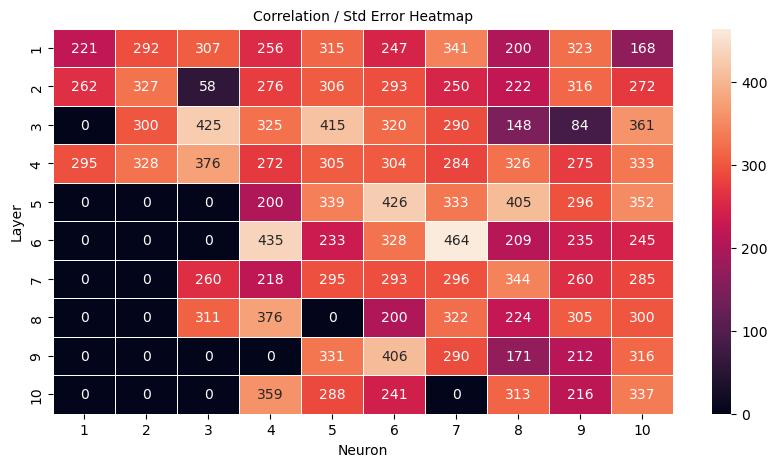

In [32]:
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(div.astype(int), linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, fmt='d')
ax.set_title('Correlation / Std Error Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

In [28]:
loss = [[160, 160, 160, 160, 160, 160, 160, 170, 160, 180], 
        [160, 97, 200, 95, 170, 160, 160, 160, 130, 120], 
        [190, 110, 120, 120, 80, 68, 120, 170, 210, 85], 
        [94, 100, 77, 150, 130, 91, 170, 84, 110, 100], 
        [190, 190, 190, 170, 79, 140, 70, 71, 79, 93], 
        [190, 190, 190, 99, 98, 100, 130, 150, 91, 120], 
        [190, 190, 110, 180, 96, 160, 85, 110, 150, 76], 
        [190, 190, 67, 78, 190, 120, 130, 130, 130, 84], 
        [190, 190, 190, 190, 150, 140, 120, 130, 110, 74], 
        [190, 190, 190, 74, 73, 100, 190, 100, 140, 70]
       ]

In [29]:
div2 = np.divide(div.astype(int), loss)
div2

array([[1.38125   , 1.825     , 1.91875   , 1.6       , 1.96875   ,
        1.54375   , 2.13125   , 1.17647059, 2.01875   , 0.93333333],
       [1.6375    , 3.37113402, 0.29      , 2.90526316, 1.8       ,
        1.83125   , 1.5625    , 1.3875    , 2.43076923, 2.26666667],
       [0.        , 2.72727273, 3.54166667, 2.70833333, 5.1875    ,
        4.70588235, 2.41666667, 0.87058824, 0.4       , 4.24705882],
       [3.13829787, 3.28      , 4.88311688, 1.81333333, 2.34615385,
        3.34065934, 1.67058824, 3.88095238, 2.5       , 3.33      ],
       [0.        , 0.        , 0.        , 1.17647059, 4.29113924,
        3.04285714, 4.75714286, 5.70422535, 3.74683544, 3.78494624],
       [0.        , 0.        , 0.        , 4.39393939, 2.37755102,
        3.28      , 3.56923077, 1.39333333, 2.58241758, 2.04166667],
       [0.        , 0.        , 2.36363636, 1.21111111, 3.07291667,
        1.83125   , 3.48235294, 3.12727273, 1.73333333, 3.75      ],
       [0.        , 0.        , 4.6417910

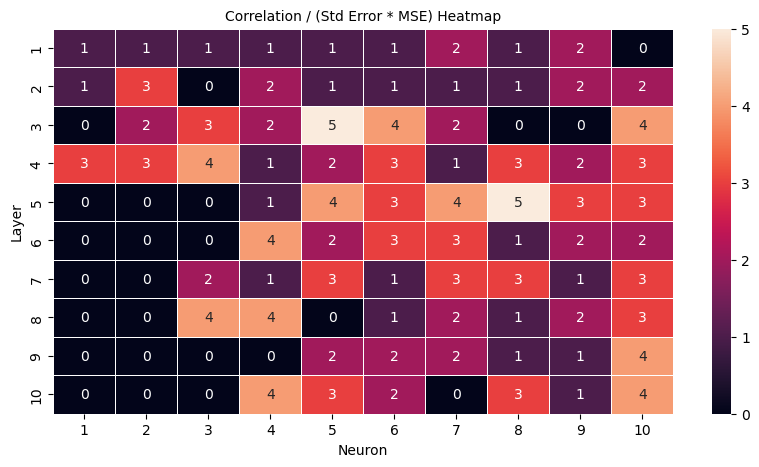

In [33]:
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(div2.astype(int), linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, fmt='g')
ax.set_title('Correlation / (Std Error * MSE) Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

In [ ]:
# Play Ground

NaN = np.nan
corr = [[0.087, 0.11, 0.13, 0.12, 0.13, 0.16, 0.14, 0.11, 0.12, 0.15],
       [0.37, 0.8, 0.79, 0.8, 0.69, 0.78, 0.60, 0.82, 0.8, 0.79],
       [0.36, 0.86, 0.89, 0.85, 0.85, 0.87, 0.84, 0.87, 0.89, 0.85],
       [NaN, NaN, NaN, 0.88, 0.86, 0.89, 0.85, 0.9, 0.85, 0.88],
       [NaN, NaN, 0.9, 0.88, 0.9, 0.87, 0.84, 0.89, 0.86, 0.9],
       [NaN, NaN, 0.73, 0.89, 0.89, 0.89, 0.9, 0.89, 0.9, 0.89],
       [NaN, NaN, 0.85, 0.9, 0.88, 0.89, 0.9, 0.9, 0.9, 0.88],
       [NaN, 0.86, NaN, 0.88, 0.81, 0.9, 0.9, 0.89, 0.89, 0.87],
       [NaN, NaN, NaN, 0.9, 0.89, 0.89, 0.9, 0.89, 0.9, 0.9],
       [NaN, NaN, NaN, 0.87, 0.9, 0.88, 0.9, 0.89, 0.9, 0.9]
       ]

err = [[0.00084, 0.00075, 0.00088, 0.00073, 0.00086, 0.00089, 0.001, 0.00064, 0.0005, 0.0011],
       [0.00072, 0.001, 0.0011, 0.00091, 0.0014, 0.0012, 0.0015, 0.001, 0.00094, 0.00086],
       [0.0007, 0.00093, 0.00096, 0.00099, 0.00098, 0.00093, 0.0011, 0.00092, 0.00096, 0.00094],
       [0, 0, 0, 0.00093, 0.0012, 0.00091, 0.00099, 0.00086, 0.001, 0.0009],
       [0, 0, 0.00096, 0.00094, 0.00093, 0.0011, 0.0011, 0.00092, 0.0012, 0.00086],
       [0, 0, 0.0011, 0.00091, 0.00096, 0.0009, 0.00089, 0.0009, 0.00089, 0.00091],
       [0, 0, 0.0012, 0.00095, 0.00087, 0.0011, 0.00087, 0.00086, 0.00085, 0.00093],
       [0, 0.00087, 0, 0.0011, 0.0016, 0.00092, 0.00087, 0.0011, 0.00088, 0.0012],
       [0, 0, 0, 0.00094, 0.00085, 0.0009, 0.00087, 0.00087, 0.00096, 0.001],
       [0, 0, 0, 0.00098, 0.00089, 0.0011, 0.00097, 0.00096, 0.00094, 0.00096],
      ]

import seaborn as sns

xlabels = range(1, 11)
ylabels = range(1, 11)
fig, ax = plt.subplots(figsize=(8,5))
sns.heatmap(corr, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True)
ax.set_title('Correlation Coefficient Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(err, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True)
ax.set_title('Standard Error Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

div = np.divide(corr, err)
div = np.nan_to_num(div)
div

fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(div.astype(int), linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, fmt='d')
ax.set_title('Correlation / Std Error Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

loss = [[58, 56, 57, 56, 57, 56, 59, 55, 54, 59], 
        [48, 20, 21, 21, 30, 21, 30, 18, 20, 23], 
        [48, 15, 11, 15, 15, 13, 16, 14, 12, 16], 
        [55, 55, 55, 12, 15, 12, 15, 10, 15, 12], 
        [55, 55, 11, 13, 10, 14, 16, 12, 16, 11], 
        [55, 55, 26, 11, 11, 11, 10, 11, 11, 11], 
        [55, 55, 17, 11, 12, 12, 10, 10, 11, 12], 
        [55, 15, 55, 14, 25, 10, 11, 12, 11, 14], 
        [55, 55, 55, 11, 12, 12, 11, 11, 10, 11], 
        [55, 55, 55, 13, 11, 13, 10, 11, 10, 11]
       ]

#fig, ax = plt.subplots(figsize=(10,5))
ax = sns.heatmap(loss, linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, cmap='rocket_r')
ax.set_title('Mean Squared Error Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

div2 = np.divide(div.astype(int), loss)
div2

fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(div2.astype(int), linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, fmt='g')
ax.set_title('Correlation / (Std Error * MSE) Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()



xlabels = range(1, 11)
ylabels = range(1, 11)

NaN = np.nan
corr = [[0.42, 0.41, 0.4, 0.41, 0.41, 0.42, 0.41, 0.42, 0.42, 0.42],
       [0.42, 0.72, 0.082, 0.72, 0.46, 0.44, 0.5, 0.4, 0.57, 0.6],
       [NaN, 0.66, 0.68, 0.65, 0.79, 0.8, 0.61, 0.37, 0.22, 0.76],
       [0.71, 0.69, 0.79, 0.49, 0.61, 0.73, 0.37, 0.75, 0.66, 0.7],
       [NaN, NaN, NaN, 0.34, 0.78, 0.64, 0.8, 0.81, 0.77, 0.74],
       [NaN, NaN, NaN, 0.74, 0.7, 0.69, 0.65, 0.46, 0.73, 0.59],
       [NaN, NaN, 0.65, 0.24, 0.71, 0.47, 0.74, 0.69, 0.52, 0.77],
       [NaN, NaN, 0.81, 0.79, NaN, 0.62, 0.58, 0.56, 0.61, 0.75],
       [NaN, NaN, NaN, NaN, 0.53, 0.65, 0.64, 0.65, 0.66, 0.79],
       [NaN, NaN, NaN, 0.79, 0.78, 0.7, NaN, 0.69, 0.54, 0.81]
       ]

err = [[0.0019, 0.0014, 0.0013, 0.0016, 0.0013, 0.0017, 0.0012, 0.0021, 0.0013, 0.0025],
       [0.0016, 0.0022, 0.0014, 0.0026, 0.0015, 0.0015, 0.002, 0.0018, 0.0018, 0.0022],
       [0, 0.0022, 0.0016, 0.002, 0.0019, 0.0025, 0.0021, 0.0025, 0.0026, 0.0021],
       [0.0024, 0.0021, 0.0021, 0.0018, 0.002, 0.0024, 0.0013, 0.0023, 0.0024, 0.0021],
       [0, 0, 0, 0.0017, 0.0023, 0.0015, 0.0024, 0.002, 0.0026, 0.0021],
       [0, 0, 0, 0.0017, 0.003, 0.0021, 0.0014, 0.0022, 0.0031, 0.0024],
       [0, 0, 0.0025, 0.0011, 0.0024, 0.0016, 0.0025, 0.002, 0.002, 0.0027],
       [0, 0, 0.0026, 0.0021, 0, 0.0031, 0.0018, 0.0025, 0.002, 0.0025],
       [0, 0, 0, 0, 0.0016, 0.0016, 0.0022, 0.0038, 0.0031, 0.0025],
       [0, 0, 0, 0.0022, 0.0027, 0.0029, 0, 0.0022, 0.0025, 0.0024],
      ]

div = np.divide(corr, err)
div = np.nan_to_num(div)
div

fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(div.astype(int), linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, fmt='d')
ax.set_title('Correlation / Std Error Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()

loss = [[160, 160, 160, 160, 160, 160, 160, 170, 160, 180], 
        [160, 97, 200, 95, 170, 160, 160, 160, 130, 120], 
        [190, 110, 120, 120, 80, 68, 120, 170, 210, 85], 
        [94, 100, 77, 150, 130, 91, 170, 84, 110, 100], 
        [190, 190, 190, 170, 79, 140, 70, 71, 79, 93], 
        [190, 190, 190, 99, 98, 100, 130, 150, 91, 120], 
        [190, 190, 110, 180, 96, 160, 85, 110, 150, 76], 
        [190, 190, 67, 78, 190, 120, 130, 130, 130, 84], 
        [190, 190, 190, 190, 150, 140, 120, 130, 110, 74], 
        [190, 190, 190, 74, 73, 100, 190, 100, 140, 70]
       ]

div2 = np.divide(div.astype(int), loss)
div2

fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(div2.astype(int), linewidth=0.5, xticklabels=xlabels, yticklabels=ylabels, annot=True, fmt='g')
ax.set_title('Correlation / (Std Error * MSE) Heatmap', fontsize=10)
ax.set_xlabel('Neuron', fontsize=10)
ax.set_ylabel('Layer', fontsize=10)
plt.show()